In [1]:
import pandas as pd
import numpy as np
from openpyxl import load_workbook
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf
import pmdarima as pm


In [2]:
def update_excel_intensities(filename,df,sheet,mode='a'):
    if mode=='a':
        with pd.ExcelWriter(filename,mode=mode, if_sheet_exists='replace') as writer:  
            df.to_excel(writer, sheet_name=sheet)
    else:
        with pd.ExcelWriter(filename,mode=mode) as writer:  
            df.to_excel(writer, sheet_name=sheet)
    
def read_excel_sheet(file,sheetname):
    customers = pd.read_excel(file,
        sheet_name=sheetname,
        header=0,
        index_col=0,
        keep_default_na=True
        )
    return customers

def read_csv(file,sheetname):
    customers = pd.read_csv(file,
        header=0,
        sep=';',
        index_col=0,
        keep_default_na=True
        )
    
    customers.fillna(0,inplace=True)
    
    return customers

def div100(x):
    return x/100.0

def logistic(x):
    return np.log(x/(1-x))

def invlogistic(x):
    return np.exp(x)/(1+np.exp(x))

def onex(x):
    return x/(1-x)

def invonex(x):
    return x/(1+x)

def onex2(x):
    return x*x/(1-x*x)

def invonex2(x):
    return np.sqrt(x/(1+x))


def mul100(x):
    return x*100.0

def predict_ewma1(df,year):
    ind=data2.index.values==year+1
    nn=np.arange(ind.shape[0])
    n=np.max(nn[ind])
    
    logit=df.apply(div100).apply(logistic)
    ewmadiff=logit.diff().ewm(alpha=0.2).mean()
    #n=34
    nmax=logit.shape[0]

    for k in range(n,nmax):
        logit.iloc[k,:]=logit.iloc[k-1,:]+ewmadiff.iloc[n,:]

    ret=logit.apply(invlogistic).apply(mul100)    
    return ret

def predict_ewma2(df,year):
    ind=df.index.values==year+1
    nn=np.arange(ind.shape[0])
    n=np.max(nn[ind])
    
    logit=df.apply(div100).apply(logistic)
    ewmadiff=logit.ewm(alpha=0.2,adjust=True).mean()
    #n=34
    nmax=logit.shape[0]
    
    alpha=0.5
    
    y=logit.iloc[n-2,:]

    for k in range(n,nmax):
        #logit.iloc[k,:]=logit.iloc[k-1,:]+ewmadiff.iloc[n,:]
        
        y=(1-alpha)*y+alpha*logit.iloc[k-1,:]
        logit.iloc[k,:]=y
        print(y)
        

    ret=logit.apply(invlogistic).apply(mul100)    
    return ret

def check_acf(df,year):
    for col in df.columns:
        print(f'forecasting {col}')
        first=df.index[0]
        deftrain=df.loc[:year,col].copy()
        f=plt.figure()
        ax1=f.add_subplot(121)
        ax1.plot(df.diff().dropna())
        ax2=f.add_subplot(122)
        plot_acf(df.loc[:,col].diff().dropna(),ax=ax2)
        f.show()
        f=plt.figure()
        ax1=f.add_subplot(121)
        ax1.plot(df.diff().diff().dropna())
        ax2=f.add_subplot(122)
        plot_acf(df.loc[:,col].diff().dropna(),ax=ax2)
        f.show()

def return_diff(df,trans=True):  
    df2=df.copy()
    if trans:
        return df2.apply(div100).apply(onex2).diff()
    else:
        return df2.apply(div100).apply(logistic).diff()

def return_diffdiff(df,trans=True):  
    df2=df.copy()
    if trans:
        return df2.apply(div100).apply(onex2).diff().diff()
    else:
        return df2.apply(div100).apply(logistic).diff().diff()


def return_firstvalue(df,trans=True):
    if trans:
        first_value=df.apply(div100).apply(onex2).iloc[0]
    else:
        first_value=df.apply(div100).apply(logistic).iloc[0]
    return first_value
    
def get_diffdiff(df,year,debug=True,trans=True,n_periods=0):
    first=df.index[0]
    deftrain=df.loc[:year].copy()
    logit=return_diffdiff(deftrain,trans=trans)
    dftest=df.copy()

    if debug:
        print('deftrain',deftrain)
        print(return_diff(deftrain,trans=True))
        print(logit.shape)
        print(logit)
    logit=logit.iloc[2:]
    plt.plot(df.loc[first:year])
    if debug:
        plot_corr(df.loc[first:year])

    plt.hist(logit.values)
    plt.show()

    auto_arima = pm.auto_arima(logit, start_p = 1, start_q = 1, max_p = 5, max_q = 5, max_d = 5, stepwise=False, seasonal=False,information_criterion='aic')
    print(auto_arima.summary())

    forecast_test_auto = auto_arima.predict(n_periods=n_periods)
    display('forecast_test_auto',forecast_test_auto)

    first_diff=return_diff(dftest,trans=trans)
    if debug:
        print('first_diff',first_diff.iloc[1],first_diff)
        
    z0 = list([first_diff.iloc[1]]) + list(logit) + list(forecast_test_auto)
    z = pd.DataFrame(z0)
    x = z.cumsum()
    if debug:
        print('x shape',x.shape)
    first_value=return_firstvalue(deftrain,trans=trans) #df.apply(div100).apply(onex2).iloc[0]
    if debug:
        print('first_value',first_value)
    y = pd.DataFrame(list([first_value]) + list(x.values[:,0]),index=range(1989,2035),columns=['val'])
    if debug:
        print('y shape',y.shape)
        print('y',y)
    dftest['forecast_auto'] = y.cumsum()
    if debug:
        print('forecast cumsum',dftest['forecast_auto'])
    if trans:
        dftest['forecast_auto']=dftest['forecast_auto'].apply(invonex2).apply(mul100)
    else:
        dftest['forecast_auto']=dftest['forecast_auto'].apply(invlogistic).apply(mul100)
    if debug:
        print('forecast',dftest['forecast_auto'])

    dftest['forecast_auto'].plot()
    plt.show()
        
    return dftest['forecast_auto'].values

def plot_corr(df):
    from statsmodels.graphics.tsaplots import plot_acf
    from statsmodels.graphics.tsaplots import plot_pacf
    plt.figure()
    plt.subplot(211)
    plot_acf(df, ax = plt.gca())
    plt.subplot(212)
    plot_pacf(df, ax = plt.gca())
    plt.show()    

def get_diff(df,year,debug=True,trans=True,n_periods=0):
    first=df.index[0]
    deftrain=df.loc[:year].copy()
    logit=return_diff(deftrain,trans=trans)

    dftest=df.copy()
    if debug:
        print('deftrain',deftrain)
        print(return_diff(deftrain,trans=trans))
        print(logit.shape)
        print(logit)
    logit=logit.iloc[1:]
    plt.plot(df.loc[first:year])
    if debug:
        plot_corr(df.loc[first:year])

    plt.hist(logit.values)
    plt.show()

    auto_arima = pm.auto_arima(logit, start_p = 1, start_q = 1, max_p = 5, max_q = 5, max_d = 5, stepwise=False, seasonal=False,information_criterion='bic')
    print(auto_arima.summary())

    forecast_test_auto = auto_arima.predict(n_periods=n_periods)
    display('forecast_test_auto',forecast_test_auto)

    first_value=return_firstvalue(df,trans=trans)    
    if debug:
        print('first_value',first_value)
    z = pd.DataFrame(list([first_value]) + list(logit) + list(forecast_test_auto),index=range(1989,2035),columns=['val'])
    dftest['forecast_auto'] = z.cumsum()
    if debug:
        print('forecast cumsum',dftest['forecast_auto'])
    if trans:
        dftest['forecast_auto']=dftest['forecast_auto'].apply(invonex2).apply(mul100)
    else:
        dftest['forecast_auto']=dftest['forecast_auto'].apply(invlogistic).apply(mul100)
    if debug:
        print('forecast',dftest['forecast_auto'])

    dftest['forecast_auto'].plot()
    plt.show()
            
    return dftest['forecast_auto'].values
    
def predict_arima(df,year,debug=True):
    ind=df.index.values==year+1
    nn=np.arange(ind.shape[0])
    n=np.max(nn[ind])
    
    n_periods=2034-year
    dftest=df.copy()
    
    log_trans=['alypuhelin','some_25_34','some_35_44','sisempikaupunki','ulompikaupunki','kehyskaupunki','maaseudulla','pienituloisuus_miehet_18_29','pienituloisuus_naiset_18_29']
    first_diff=['avioituvuus_30_34']
    
    if debug:
        cols = df.columns #list(['alypuhelin'])
    else:
        cols = df.columns
    
    for col in cols:
        print(f'forecasting {col}')

        if col in log_trans:
            trans=True
        else:
            trans=False
        
        if col in first_diff:
            dftest.loc[:,col]=get_diff(df.loc[:year,col],year,debug=debug,trans=trans,n_periods=n_periods)
        else:
            dftest.loc[:,col]=get_diffdiff(df.loc[:year,col],year,debug=debug,trans=trans,n_periods=n_periods)
      
    return dftest

In [3]:
data = read_excel_sheet('data/predictions_backtesting_2024.xlsx','data')

In [4]:
data

,hedelmallisyysluku,pienituloisuus_miehet_18_29,pienituloisuus_naiset_18_29,lapsikuolleisuus,synnyttajien_keskiika,sisempikaupunki,ulompikaupunki,kehyskaupunki,maaseudulla,avioituvuus_naiset_30_34,...,työttömyys_miehet_25_34,työttömyys_naiset_25_34,työllisyysaste_miehet_25_34,työllisyysaste_naiset_25_34,työttömyys_miehet_35_44,työttömyys_naiset_35_44,työllisyysaste_miehet_35_44,työllisyysaste_naiset_35_44,ei_aviossa_30_34,parittomia_30_34
vuosi,,,,,,,,,,,,,,,,,,,,,
1989,1.710,9.4,11.4,0.006029,29.080000,29.075531,23.470945,9.400502,36.745385,49.60,...,2.9,2.7,90.2,81.7,3.1,1.9,92.0,88.2,0.303024,0.303024
1990,1.782,7.9,11.4,0.005656,29.160071,29.075531,23.470945,9.400502,36.745385,51.40,...,2.7,2.1,90.7,80.6,2.7,1.5,92.1,88.3,0.303024,0.303024
1991,1.794,10.9,13.2,0.005804,29.170250,28.980243,23.768951,9.459372,36.588651,50.50,...,5.9,2.8,86.9,78.3,4.5,2.4,89.9,86.5,0.303865,0.302451
1992,1.847,13.5,13.9,0.005168,29.273838,28.863763,24.030293,9.515345,36.402128,49.50,...,12.6,7.7,78.8,72.5,10.6,6.0,83.6,81.4,0.314501,0.308413
1993,1.813,12.7,13.8,0.004299,29.360658,28.916610,24.226395,9.541993,36.185641,53.60,...,18.5,14.0,72.5,66.5,15.3,10.2,78.6,77.8,0.287041,0.300846
1994,1.847,14.2,16.6,0.004729,29.504384,29.135942,24.351950,9.520954,35.868999,54.20,...,20.8,16.5,70.8,64.0,16.6,12.7,77.0,76.3,0.298537,0.296937
1995,1.807,15.9,17.1,0.003858,29.687610,29.446438,24.418790,9.517619,35.486999,52.60,...,16.1,16.9,74.9,62.7,13.4,12.6,80.1,77.1,0.323354,0.312850
1996,1.764,19.3,20.3,0.003896,29.755130,29.692128,24.465213,9.524036,35.117315,55.40,...,15.1,16.4,75.6,63.5,12.4,11.1,80.4,78.4,0.320303,0.324943
1997,1.746,18.2,21.5,0.003859,29.852071,29.938751,24.526917,9.559717,34.744759,51.10,...,13.2,15.5,77.3,64.1,10.8,11.0,81.3,76.9,0.337329,0.325128


In [5]:
#check_acf(data,2022)

In [6]:
data.index.values==2022

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False,  True, False, False,
       False, False, False, False, False, False, False, False, False,
       False])

forecasting hedelmallisyysluku
deftrain vuosi
1989    1.710
1990    1.782
1991    1.794
1992    1.847
1993    1.813
1994    1.847
1995    1.807
1996    1.764
1997    1.746
1998    1.700
1999    1.735
2000    1.729
2001    1.726
2002    1.718
2003    1.760
2004    1.800
2005    1.803
2006    1.837
2007    1.829
2008    1.846
2009    1.864
2010    1.870
2011    1.827
2012    1.801
2013    1.747
2014    1.710
2015    1.650
2016    1.567
2017    1.489
2018    1.407
2019    1.347
2020    1.370
2021    1.458
2022    1.316
Name: hedelmallisyysluku, dtype: float64
vuosi
1989         NaN
1990    0.000025
1991    0.000004
1992    0.000019
1993   -0.000012
1994    0.000012
1995   -0.000015
1996   -0.000015
1997   -0.000006
1998   -0.000016
1999    0.000012
2000   -0.000002
2001   -0.000001
2002   -0.000003
2003    0.000015
2004    0.000014
2005    0.000001
2006    0.000012
2007   -0.000003
2008    0.000006
2009    0.000007
2010    0.000002
2011   -0.000016
2012   -0.000009
2013   -0.000019
2014  

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


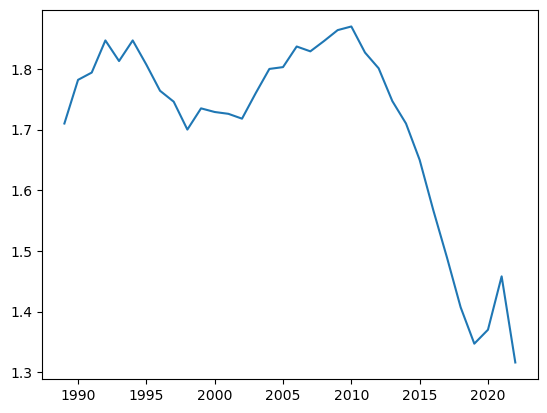

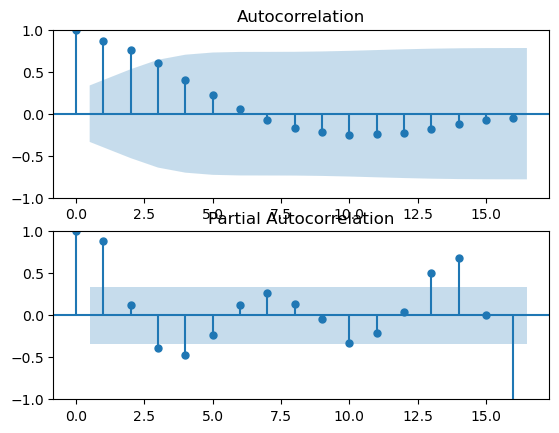

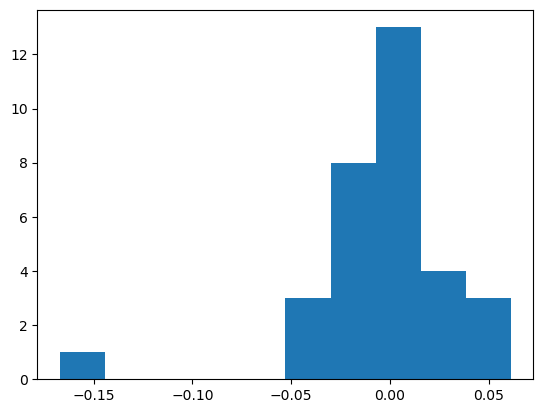

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  63.798
Date:                Wed, 01 Nov 2023   AIC                           -123.597
Time:                        23:03:38   BIC                           -120.665
Sample:                             0   HQIC                          -122.625
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7924      0.140     -5.679      0.000      -1.066      -0.519
sigma2         0.0011      0.000      3.967      0.000       0.001       0.002
Ljung-Box (L1) (Q):                   0.01   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.076384
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

first_diff 0.041975753160444995 vuosi
1989         NaN
1990    0.041976
1991    0.006834
1992    0.029655
1993   -0.018926
1994    0.018926
1995   -0.022302
1996   -0.024522
1997   -0.010440
1998   -0.027167
1999    0.020735
2000   -0.003525
2001   -0.001767
2002   -0.004727
2003    0.024580
2004    0.022880
2005    0.001696
2006    0.019028
2007   -0.004446
2008    0.009425
2009    0.009887
2010    0.003275
2011   -0.023701
2012   -0.014598
2013   -0.030992
2014   -0.021783
2015   -0.036328
2016   -0.052456
2017   -0.051850
2018   -0.057477
2019   -0.044188
2020    0.017164
2021    0.063148
2022   -0.103909
Name: hedelmallisyysluku, dtype: float64
x shape (45, 1)
first_value -4.05142892206397
y shape (46, 1)
y            val
1989 -4.051429
1990  0.041976
1991  0.006834
1992  0.029655
1993 -0.018926
1994  0.018926
1995 -0.022302
1996 -0.024522
1997 -0.010440
1998 -0.027167
1999  0.020735
2000 -0.003525
2001 -0.001767
2002 -0.004727
2003  0.024580
2004  0.022880
2005  0.001696
2006  0.0

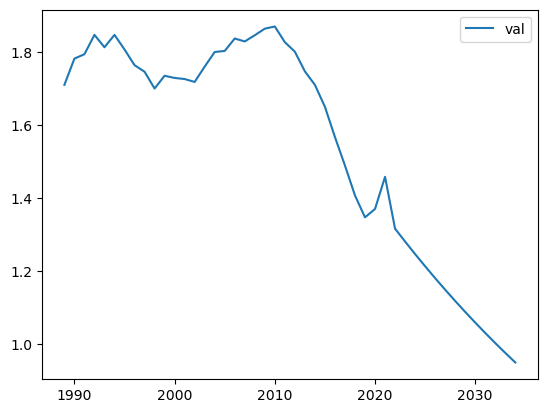

forecasting pienituloisuus_miehet_18_29
deftrain vuosi
1989     9.4
1990     7.9
1991    10.9
1992    13.5
1993    12.7
1994    14.2
1995    15.9
1996    19.3
1997    18.2
1998    17.9
1999    18.2
2000    16.7
2001    19.2
2002    21.0
2003    21.1
2004    20.9
2005    21.5
2006    20.7
2007    22.4
2008    22.9
2009    23.6
2010    24.5
2011    23.7
2012    24.2
2013    28.0
2014    30.6
2015    29.7
2016    26.2
2017    26.3
2018    28.5
2019    27.8
2020    25.1
2021    28.1
2022    28.1
Name: pienituloisuus_miehet_18_29, dtype: float64
vuosi
1989         NaN
1990   -0.002635
1991    0.005744
1992    0.006539
1993   -0.002170
1994    0.004186
1995    0.005358
1996    0.012753
1997   -0.004431
1998   -0.001157
1999    0.001157
2000   -0.005570
2001    0.009586
2002    0.007860
2003    0.000461
2004   -0.000919
2005    0.002789
2006   -0.003698
2007    0.008059
2008    0.002517
2009    0.003638
2010    0.004877
2011   -0.004346
2012    0.002695
2013    0.022862
2014    0.018240
2015 

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


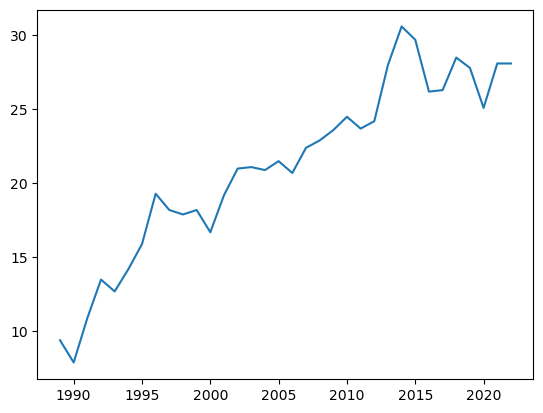

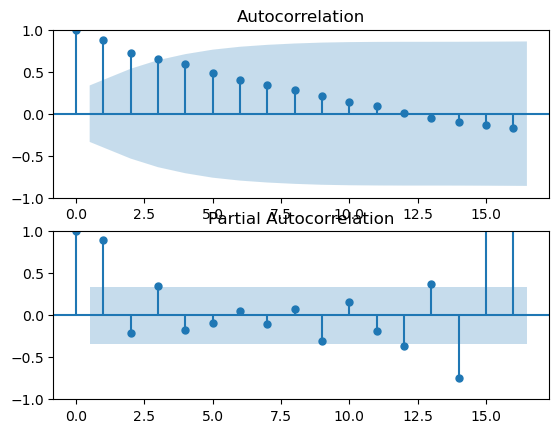

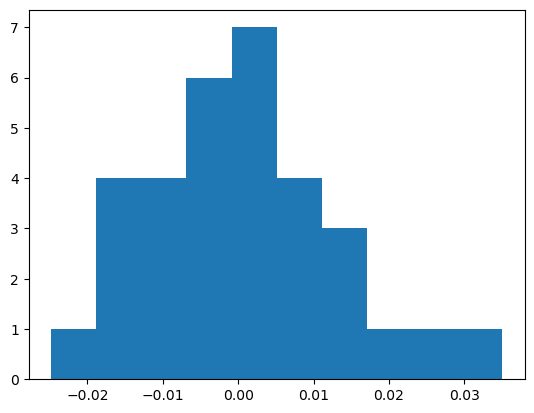

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(0, 0, 3)   Log Likelihood                 106.826
Date:                Wed, 01 Nov 2023   AIC                           -205.653
Time:                        23:03:39   BIC                           -199.790
Sample:                             0   HQIC                          -203.710
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.1178      4.924     -0.227      0.820     -10.770       8.534
ma.L2         -0.4553      0.790     -0.576      0.565      -2.004       1.094
ma.L3          0.5778      2.496      0.232      0.8

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32   -0.001537
33    0.010799
34   -0.006873
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

first_diff -0.002634576220720046 vuosi
1989         NaN
1990   -0.002635
1991    0.005744
1992    0.006539
1993   -0.002170
1994    0.004186
1995    0.005358
1996    0.012753
1997   -0.004431
1998   -0.001157
1999    0.001157
2000   -0.005570
2001    0.009586
2002    0.007860
2003    0.000461
2004   -0.000919
2005    0.002789
2006   -0.003698
2007    0.008059
2008    0.002517
2009    0.003638
2010    0.004877
2011   -0.004346
2012    0.002695
2013    0.022862
2014    0.018240
2015   -0.006567
2016   -0.023039
2017    0.000606
2018    0.014097
2019   -0.004649
2020   -0.016520
2021    0.018493
2022    0.000000
Name: pienituloisuus_miehet_18_29, dtype: float64
x shape (45, 1)
first_value 0.008914770915812116
y shape (46, 1)
y            val
1989  0.008915
1990 -0.002635
1991  0.005744
1992  0.006539
1993 -0.002170
1994  0.004186
1995  0.005358
1996  0.012753
1997 -0.004431
1998 -0.001157
1999  0.001157
2000 -0.005570
2001  0.009586
2002  0.007860
2003  0.000461
2004 -0.000919
2005  0.002

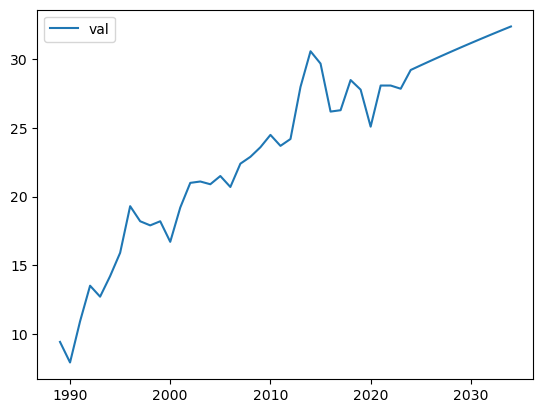

forecasting pienituloisuus_naiset_18_29
deftrain vuosi
1989    11.4
1990    11.4
1991    13.2
1992    13.9
1993    13.8
1994    16.6
1995    17.1
1996    20.3
1997    21.5
1998    22.4
1999    23.1
2000    21.7
2001    21.8
2002    22.4
2003    23.2
2004    24.8
2005    24.8
2006    23.2
2007    22.5
2008    23.7
2009    25.7
2010    25.1
2011    24.4
2012    22.9
2013    25.8
2014    27.5
2015    28.1
2016    27.1
2017    27.7
2018    30.3
2019    31.6
2020    28.7
2021    31.9
2022    31.9
Name: pienituloisuus_naiset_18_29, dtype: float64
vuosi
1989         NaN
1990    0.000000
1991    0.004566
1992    0.001969
1993   -0.000288
1994    0.008923
1995    0.001785
1996    0.012858
1997    0.005485
1998    0.004361
1999    0.003542
2000   -0.006953
2001    0.000479
2002    0.002931
2003    0.004059
2004    0.008649
2005    0.000000
2006   -0.008649
2007   -0.003561
2008    0.006187
2009    0.011208
2010   -0.003483
2011   -0.003932
2012   -0.007962
2013    0.015967
2014    0.010501
2015 

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


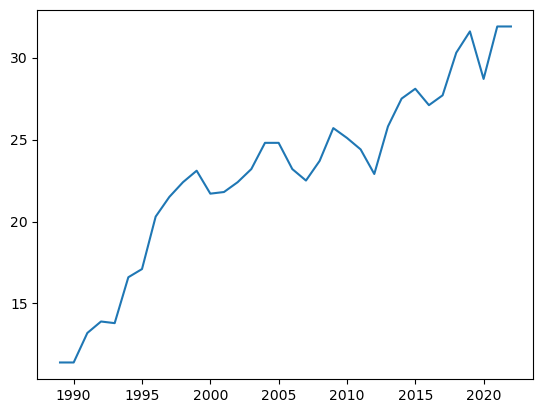

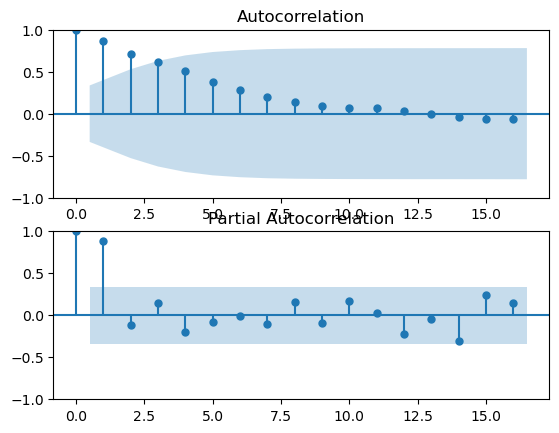

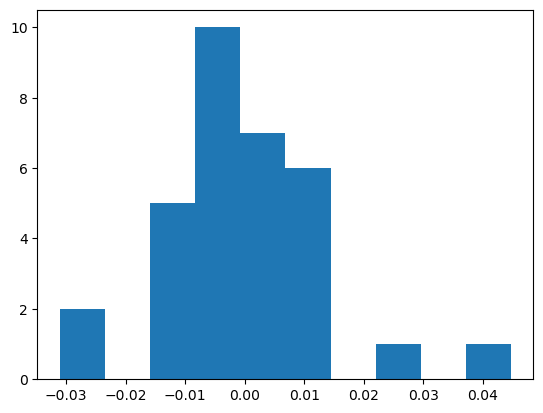

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(3, 0, 1)   Log Likelihood                 108.131
Date:                Wed, 01 Nov 2023   AIC                           -206.262
Time:                        23:03:41   BIC                           -198.933
Sample:                             0   HQIC                          -203.833
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4723      0.228     -2.072      0.038      -0.919      -0.026
ar.L2         -0.4018      0.220     -1.827      0.068      -0.833       0.029
ar.L3         -0.4843      0.324     -1.497      0.1

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.011381
33   -0.017569
34    0.015118
35   -0.005593
36    0.005076
37   -0.007472
38    0.004198
39   -0.001439
40    0.002611
41   -0.002688
42    0.000917
43   -0.000618
dtype: float64

first_diff 0.0 vuosi
1989         NaN
1990    0.000000
1991    0.004566
1992    0.001969
1993   -0.000288
1994    0.008923
1995    0.001785
1996    0.012858
1997    0.005485
1998    0.004361
1999    0.003542
2000   -0.006953
2001    0.000479
2002    0.002931
2003    0.004059
2004    0.008649
2005    0.000000
2006   -0.008649
2007   -0.003561
2008    0.006187
2009    0.011208
2010   -0.003483
2011   -0.003932
2012   -0.007962
2013    0.015967
2014    0.010501
2015    0.003918
2016   -0.006468
2017    0.003844
2018    0.017984
2019    0.009843
2020   -0.021171
2021    0.023527
2022    0.000000
Name: pienituloisuus_naiset_18_29, dtype: float64
x shape (45, 1)
first_value 0.013167119890091632
y shape (46, 1)
y            val
1989  0.013167
1990  0.000000
1991  0.004566
1992  0.001969
1993 -0.000288
1994  0.008923
1995  0.001785
1996  0.012858
1997  0.005485
1998  0.004361
1999  0.003542
2000 -0.006953
2001  0.000479
2002  0.002931
2003  0.004059
2004  0.008649
2005  0.000000
2006 -0.008649

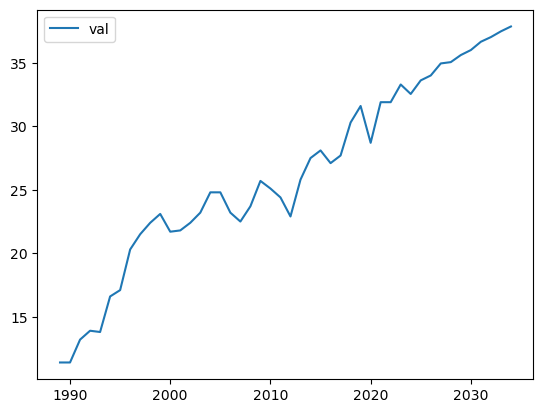

forecasting lapsikuolleisuus
deftrain vuosi
1989    0.006029
1990    0.005656
1991    0.005804
1992    0.005168
1993    0.004299
1994    0.004729
1995    0.003858
1996    0.003896
1997    0.003859
1998    0.004106
1999    0.003643
2000    0.003703
2001    0.003222
2002    0.003055
2003    0.003122
2004    0.003345
2005    0.003029
2006    0.002864
2007    0.002735
2008    0.002633
2009    0.002722
2010    0.002286
2011    0.002341
2012    0.002352
2013    0.001726
2014    0.002137
2015    0.001718
2016    0.001831
2017    0.001955
2018    0.002028
2019    0.002050
2020    0.001859
2021    0.001828
2022    0.001880
Name: lapsikuolleisuus, dtype: float64
vuosi
1989             NaN
1990   -4.358505e-10
1991    1.696080e-10
1992   -6.978192e-10
1993   -8.226823e-10
1994    3.882040e-10
1995   -7.479277e-10
1996    2.946520e-11
1997   -2.869350e-11
1998    1.967355e-10
1999   -3.587787e-10
2000    4.407600e-11
2001   -3.330925e-10
2002   -1.048259e-10
2003    4.138590e-11
2004    1.442141e-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


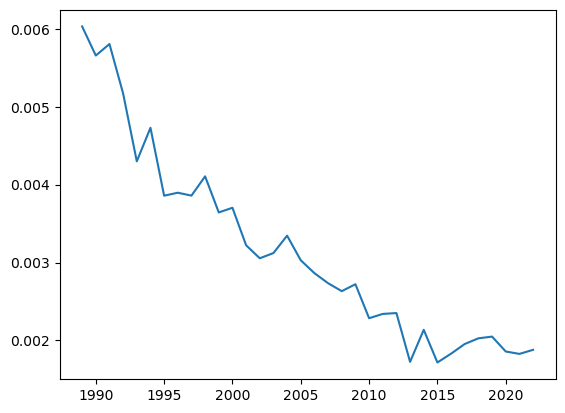

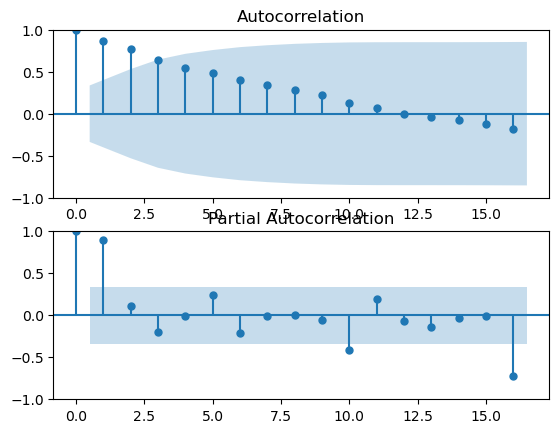

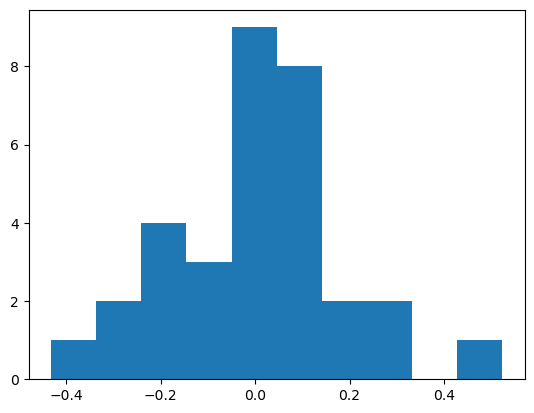

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(1, 0, 1)   Log Likelihood                  29.389
Date:                Wed, 01 Nov 2023   AIC                            -52.777
Time:                        23:03:42   BIC                            -48.380
Sample:                             0   HQIC                           -51.320
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5186      0.187     -2.778      0.005      -0.884      -0.153
ma.L1         -0.9641      0.361     -2.669      0.008      -1.672      -0.256
sigma2         0.0083      0.003      2.558      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32   -0.092938
33    0.048197
34   -0.024994
35    0.012962
36   -0.006722
37    0.003486
38   -0.001808
39    0.000937
40   -0.000486
41    0.000252
42   -0.000131
43    0.000068
dtype: float64

first_diff -0.06386796113093496 vuosi
1989         NaN
1990   -0.063868
1991    0.025832
1992   -0.116068
1993   -0.184112
1994    0.095336
1995   -0.203574
1996    0.009802
1997   -0.009543
1998    0.062044
1999   -0.119646
2000    0.016336
2001   -0.139146
2002   -0.053224
2003    0.021695
2004    0.068995
2005   -0.099237
2006   -0.056015
2007   -0.046089
2008   -0.038009
2009    0.033244
2010   -0.174568
2011    0.023775
2012    0.004688
2013   -0.309466
2014    0.213600
2015   -0.218246
2016    0.063703
2017    0.065529
2018    0.036661
2019    0.010790
2020   -0.097803
2021   -0.016817
2022    0.028050
Name: lapsikuolleisuus, dtype: float64
x shape (45, 1)
first_value -9.716284013645446
y shape (46, 1)
y            val
1989 -9.716284
1990 -0.063868
1991  0.025832
1992 -0.116068
1993 -0.184112
1994  0.095336
1995 -0.203574
1996  0.009802
1997 -0.009543
1998  0.062044
1999 -0.119646
2000  0.016336
2001 -0.139146
2002 -0.053224
2003  0.021695
2004  0.068995
2005 -0.099237
2006 -0.05

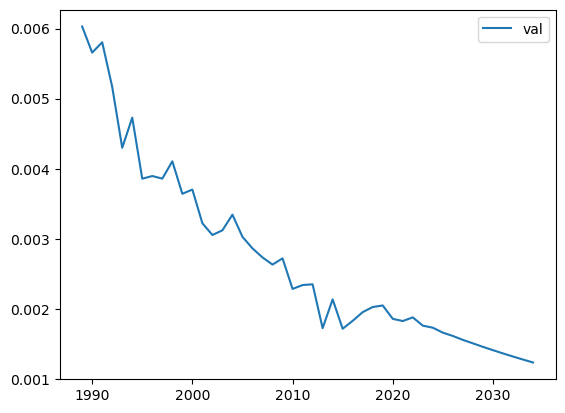

forecasting synnyttajien_keskiika
deftrain vuosi
1989    29.080000
1990    29.160071
1991    29.170250
1992    29.273838
1993    29.360658
1994    29.504384
1995    29.687610
1996    29.755130
1997    29.852071
1998    29.938362
1999    29.948293
2000    29.930651
2001    29.937986
2002    29.948762
2003    29.999488
2004    29.998615
2005    29.983955
2006    30.016630
2007    30.037350
2008    30.083874
2009    30.079639
2010    30.140161
2011    30.256492
2012    30.332535
2013    30.435631
2014    30.471048
2015    30.599564
2016    30.799523
2017    30.900000
2018    31.000000
2019    31.200000
2020    31.300000
2021    31.600000
2022    31.700000
Name: synnyttajien_keskiika, dtype: float64
vuosi
1989         NaN
1990    0.000557
1991    0.000071
1992    0.000724
1993    0.000609
1994    0.001014
1995    0.001303
1996    0.000483
1997    0.000696
1998    0.000622
1999    0.000072
2000   -0.000127
2001    0.000053
2002    0.000078
2003    0.000367
2004   -0.000006
2005   -0.000106


/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


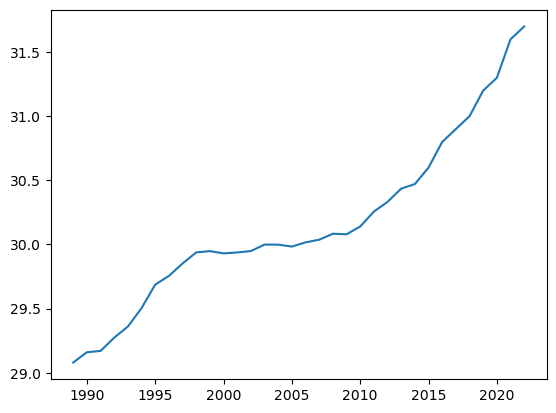

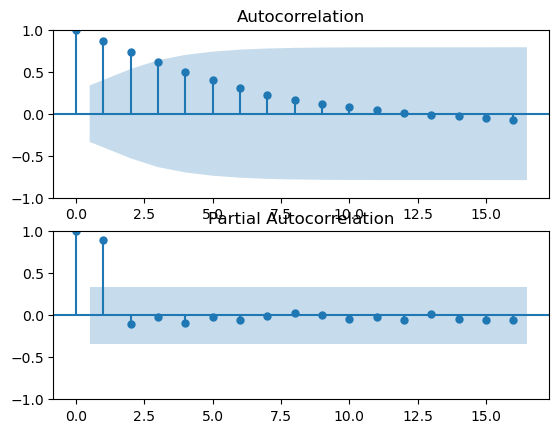

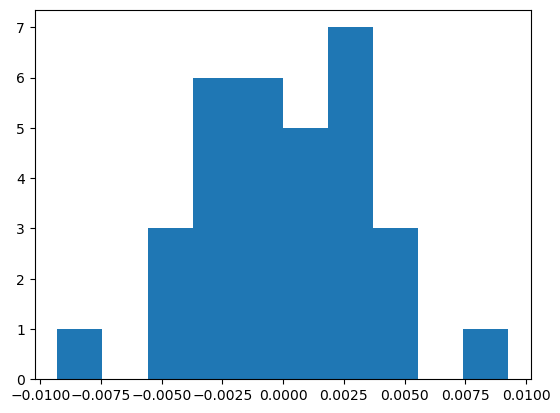

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(1, 0, 0)   Log Likelihood                 141.268
Date:                Wed, 01 Nov 2023   AIC                           -278.535
Time:                        23:03:43   BIC                           -275.604
Sample:                             0   HQIC                          -277.564
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6553      0.136     -4.805      0.000      -0.923      -0.388
sigma2      8.405e-06   2.54e-06      3.313      0.001    3.43e-06    1.34e-05
Ljung-Box (L1) (Q):                   0.60   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.006090
33   -0.003991
34    0.002615
35   -0.001714
36    0.001123
37   -0.000736
38    0.000482
39   -0.000316
40    0.000207
41   -0.000136
42    0.000089
43   -0.000058
dtype: float64

first_diff 0.00387936431159408 vuosi
1989         NaN
1990    0.003879
1991    0.000493
1992    0.005008
1993    0.004190
1994    0.006920
1995    0.008793
1996    0.003233
1997    0.004634
1998    0.004117
1999    0.000473
2000   -0.000841
2001    0.000350
2002    0.000514
2003    0.002417
2004   -0.000042
2005   -0.000698
2006    0.001556
2007    0.000986
2008    0.002213
2009   -0.000201
2010    0.002876
2011    0.005519
2012    0.003601
2013    0.004874
2014    0.001672
2015    0.006059
2016    0.009399
2017    0.004710
2018    0.004679
2019    0.009334
2020    0.004655
2021    0.013915
2022    0.004623
Name: synnyttajien_keskiika, dtype: float64
x shape (45, 1)
first_value -0.8915018285406885
y shape (46, 1)
y            val
1989 -0.891502
1990  0.003879
1991  0.000493
1992  0.005008
1993  0.004190
1994  0.006920
1995  0.008793
1996  0.003233
1997  0.004634
1998  0.004117
1999  0.000473
2000 -0.000841
2001  0.000350
2002  0.000514
2003  0.002417
2004 -0.000042
2005 -0.000698
2006 

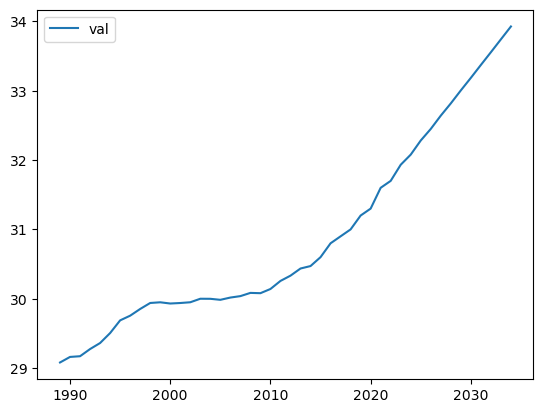

forecasting sisempikaupunki
deftrain vuosi
1989    29.075531
1990    29.075531
1991    28.980243
1992    28.863763
1993    28.916610
1994    29.135942
1995    29.446438
1996    29.692128
1997    29.938751
1998    30.162728
1999    30.315944
2000    30.469349
2001    30.638158
2002    30.687543
2003    30.717113
2004    30.689524
2005    30.683255
2006    30.680838
2007    30.680972
2008    30.801395
2009    30.918613
2010    31.012231
2011    31.156171
2012    31.346567
2013    31.569011
2014    31.820570
2015    32.058306
2016    32.246161
2017    32.521780
2018    32.797399
2019    33.073018
2020    33.348637
2021    33.624256
2022    33.817385
Name: sisempikaupunki, dtype: float64
vuosi
1989         NaN
1990    0.000000
1991   -0.000660
1992   -0.000802
1993    0.000363
1994    0.001518
1995    0.002176
1996    0.001745
1997    0.001772
1998    0.001627
1999    0.001123
2000    0.001132
2001    0.001255
2002    0.000369
2003    0.000221
2004   -0.000207
2005   -0.000047
2006   -0.00

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


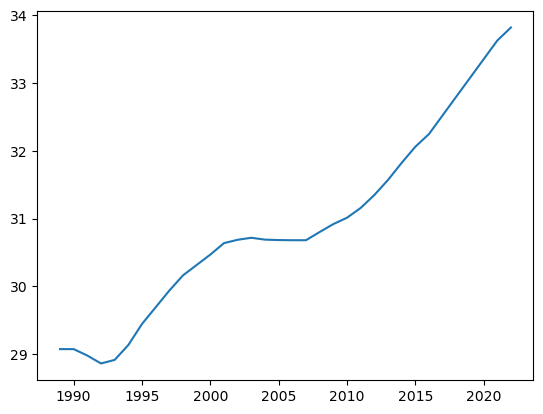

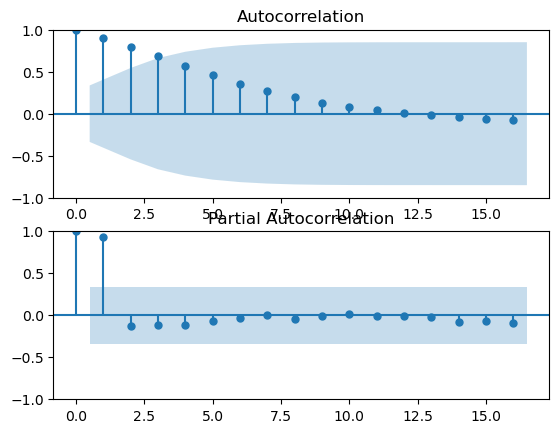

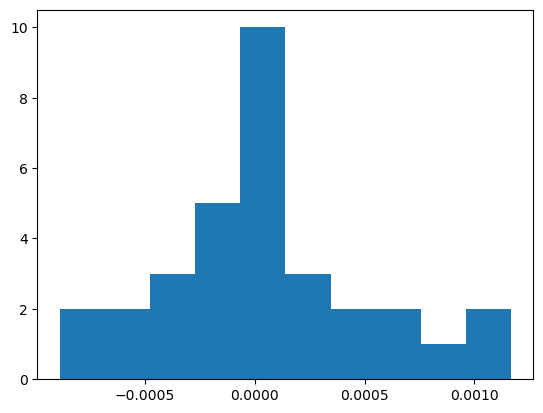

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(0, 0, 1)   Log Likelihood                 200.215
Date:                Wed, 01 Nov 2023   AIC                           -396.430
Time:                        23:03:44   BIC                           -393.499
Sample:                             0   HQIC                          -395.459
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.2924      0.207      1.414      0.157      -0.113       0.698
sigma2      2.132e-07   5.44e-08      3.920      0.000    1.07e-07     3.2e-07
Ljung-Box (L1) (Q):                   0.00   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32   -0.000202
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

first_diff 0.0 vuosi
1989         NaN
1990    0.000000
1991   -0.000660
1992   -0.000802
1993    0.000363
1994    0.001518
1995    0.002176
1996    0.001745
1997    0.001772
1998    0.001627
1999    0.001123
2000    0.001132
2001    0.001255
2002    0.000369
2003    0.000221
2004   -0.000207
2005   -0.000047
2006   -0.000018
2007    0.000001
2008    0.000903
2009    0.000884
2010    0.000709
2011    0.001097
2012    0.001462
2013    0.001724
2014    0.001971
2015    0.001883
2016    0.001503
2017    0.002228
2018    0.002256
2019    0.002284
2020    0.002313
2021    0.002342
2022    0.001658
Name: sisempikaupunki, dtype: float64
x shape (45, 1)
first_value 0.0923454034684409
y shape (46, 1)
y            val
1989  0.092345
1990  0.000000
1991 -0.000660
1992 -0.000802
1993  0.000363
1994  0.001518
1995  0.002176
1996  0.001745
1997  0.001772
1998  0.001627
1999  0.001123
2000  0.001132
2001  0.001255
2002  0.000369
2003  0.000221
2004 -0.000207
2005 -0.000047
2006 -0.000018
2007  0.00000

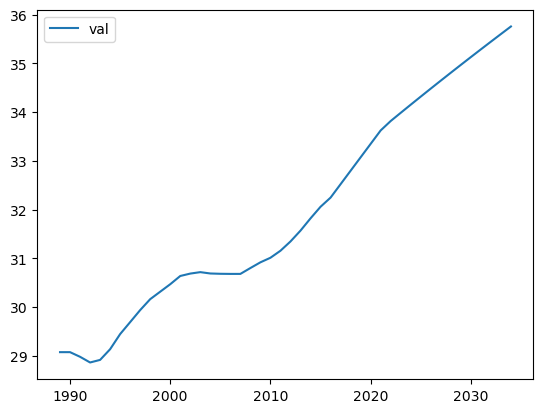

forecasting ulompikaupunki
deftrain vuosi
1989    23.470945
1990    23.470945
1991    23.768951
1992    24.030293
1993    24.226395
1994    24.351950
1995    24.418790
1996    24.465213
1997    24.526917
1998    24.598141
1999    24.741874
2000    24.859051
2001    25.000881
2002    25.146693
2003    25.274957
2004    25.415006
2005    25.538532
2006    25.680681
2007    25.826094
2008    25.921209
2009    25.980491
2010    26.070215
2011    26.142977
2012    26.202219
2013    26.244563
2014    26.247968
2015    26.301112
2016    26.366158
2017    26.391397
2018    26.416635
2019    26.441873
2020    26.467111
2021    26.492349
2022    26.590426
Name: ulompikaupunki, dtype: float64
vuosi
1989         NaN
1990    0.000000
1991    0.001579
1992    0.001405
1993    0.001067
1994    0.000689
1995    0.000369
1996    0.000257
1997    0.000342
1998    0.000396
1999    0.000804
2000    0.000660
2001    0.000804
2002    0.000833
2003    0.000737
2004    0.000811
2005    0.000720
2006    0.0008

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


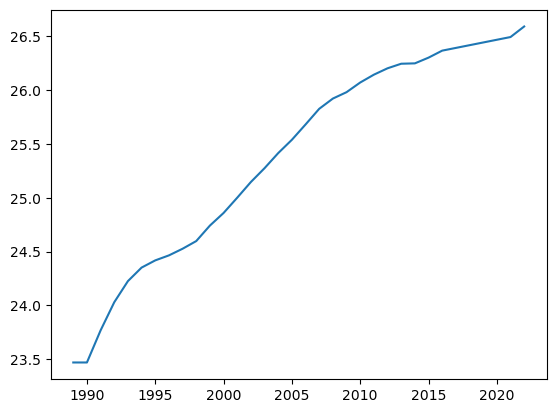

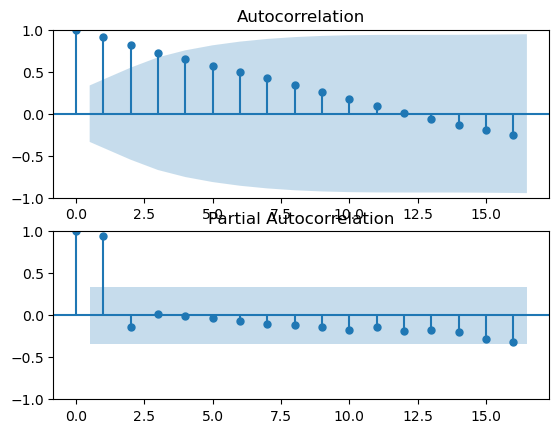

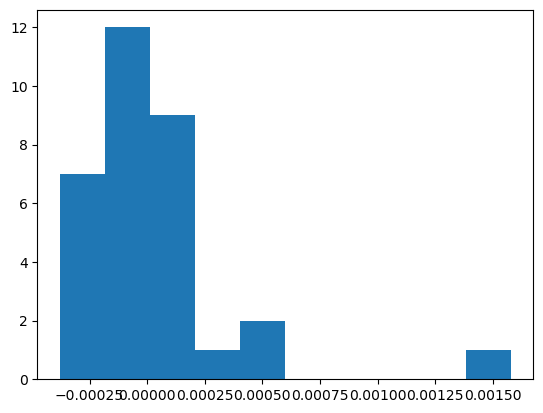

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:                        SARIMAX   Log Likelihood                 209.930
Date:                Wed, 01 Nov 2023   AIC                           -417.860
Time:                        23:03:46   BIC                           -416.394
Sample:                             0   HQIC                          -417.374
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1.173e-07   1.13e-08     10.367      0.000    9.51e-08    1.39e-07
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               202.54
Prob(Q):                              0.98   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

first_diff 0.0 vuosi
1989         NaN
1990    0.000000
1991    0.001579
1992    0.001405
1993    0.001067
1994    0.000689
1995    0.000369
1996    0.000257
1997    0.000342
1998    0.000396
1999    0.000804
2000    0.000660
2001    0.000804
2002    0.000833
2003    0.000737
2004    0.000811
2005    0.000720
2006    0.000834
2007    0.000859
2008    0.000565
2009    0.000354
2010    0.000537
2011    0.000438
2012    0.000357
2013    0.000256
2014    0.000021
2015    0.000322
2016    0.000396
2017    0.000154
2018    0.000154
2019    0.000154
2020    0.000154
2021    0.000155
2022    0.000603
Name: ulompikaupunki, dtype: float64
x shape (45, 1)
first_value 0.05830019554455779
y shape (46, 1)
y            val
1989  0.058300
1990  0.000000
1991  0.001579
1992  0.001405
1993  0.001067
1994  0.000689
1995  0.000369
1996  0.000257
1997  0.000342
1998  0.000396
1999  0.000804
2000  0.000660
2001  0.000804
2002  0.000833
2003  0.000737
2004  0.000811
2005  0.000720
2006  0.000834
2007  0.00085

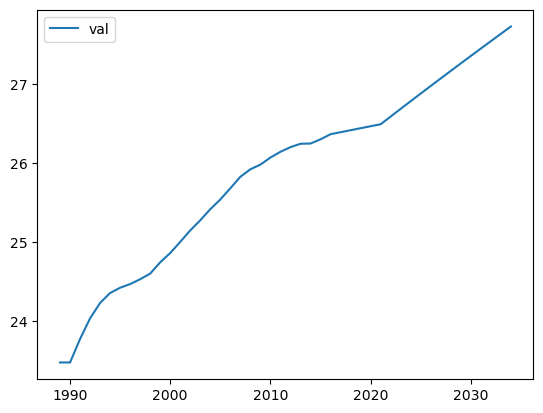

forecasting kehyskaupunki
deftrain vuosi
1989     9.400502
1990     9.400502
1991     9.459372
1992     9.515345
1993     9.541993
1994     9.520954
1995     9.517619
1996     9.524036
1997     9.559717
1998     9.606589
1999     9.700420
2000     9.785056
2001     9.862325
2002     9.953700
2003    10.033216
2004    10.148472
2005    10.259743
2006    10.369200
2007    10.468855
2008    10.552420
2009    10.620027
2010    10.670150
2011    10.723169
2012    10.796668
2013    10.831568
2014    10.884208
2015    10.936146
2016    10.977674
2017    11.042493
2018    11.107312
2019    11.172131
2020    11.236951
2021    11.301770
2022    11.281757
Name: kehyskaupunki, dtype: float64
vuosi
1989         NaN
1990    0.000000
1991    0.000113
1992    0.000108
1993    0.000052
1994   -0.000041
1995   -0.000006
1996    0.000012
1997    0.000069
1998    0.000092
1999    0.000185
2000    0.000168
2001    0.000155
2002    0.000185
2003    0.000162
2004    0.000237
2005    0.000232
2006    0.000231

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


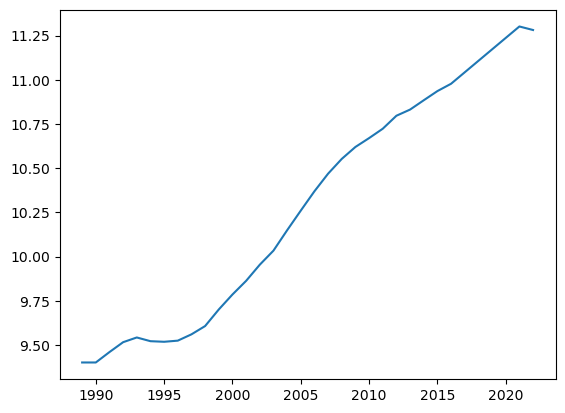

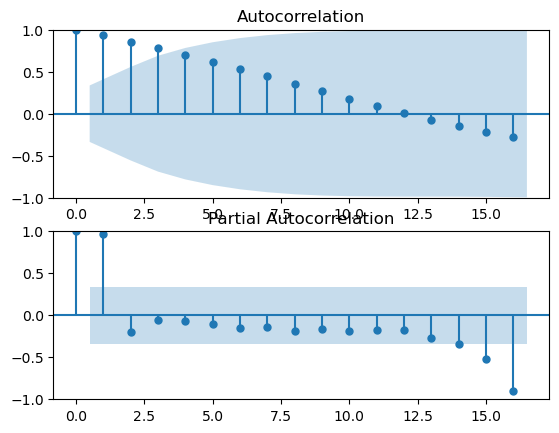

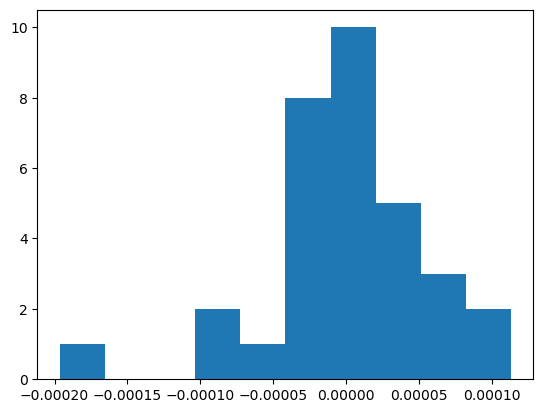

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:                        SARIMAX   Log Likelihood                 267.514
Date:                Wed, 01 Nov 2023   AIC                           -533.029
Time:                        23:03:47   BIC                           -531.563
Sample:                             0   HQIC                          -532.543
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      3.208e-09   6.26e-10      5.125      0.000    1.98e-09    4.44e-09
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):                14.95
Prob(Q):                              0.85   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

first_diff 0.0 vuosi
1989         NaN
1990    0.000000
1991    0.000113
1992    0.000108
1993    0.000052
1994   -0.000041
1995   -0.000006
1996    0.000012
1997    0.000069
1998    0.000092
1999    0.000185
2000    0.000168
2001    0.000155
2002    0.000185
2003    0.000162
2004    0.000237
2005    0.000232
2006    0.000231
2007    0.000212
2008    0.000180
2009    0.000146
2010    0.000109
2011    0.000116
2012    0.000162
2013    0.000077
2014    0.000117
2015    0.000116
2016    0.000093
2017    0.000146
2018    0.000147
2019    0.000148
2020    0.000149
2021    0.000150
2022   -0.000046
Name: kehyskaupunki, dtype: float64
x shape (45, 1)
first_value 0.008915730671532444
y shape (46, 1)
y            val
1989  0.008916
1990  0.000000
1991  0.000113
1992  0.000108
1993  0.000052
1994 -0.000041
1995 -0.000006
1996  0.000012
1997  0.000069
1998  0.000092
1999  0.000185
2000  0.000168
2001  0.000155
2002  0.000185
2003  0.000162
2004  0.000237
2005  0.000232
2006  0.000231
2007  0.00021

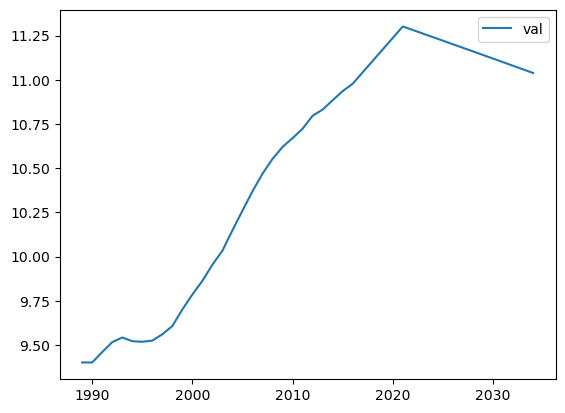

forecasting maaseudulla
deftrain vuosi
1989    36.745385
1990    36.745385
1991    36.588651
1992    36.402128
1993    36.185641
1994    35.868999
1995    35.486999
1996    35.117315
1997    34.744759
1998    34.367804
1999    34.189842
2000    33.825673
2001    33.457211
2002    33.174340
2003    32.926710
2004    32.747668
2005    32.524384
2006    32.252634
2007    31.991192
2008    31.679281
2009    31.410837
2010    31.142550
2011    30.844596
2012    30.524885
2013    30.199330
2014    29.876970
2015    29.508932
2016    29.128630
2017    28.752777
2018    28.376925
2019    28.001073
2020    27.625221
2021    27.249369
2022    26.913237
Name: maaseudulla, dtype: float64
vuosi
1989         NaN
1990    0.000000
1991   -0.001534
1992   -0.001812
1993   -0.002084
1994   -0.003013
1995   -0.003579
1996   -0.003406
1997   -0.003376
1998   -0.003360
1999   -0.001567
2000   -0.003167
2001   -0.003152
2002   -0.002385
2003   -0.002063
2004   -0.001477
2005   -0.001826
2006   -0.002197
200

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


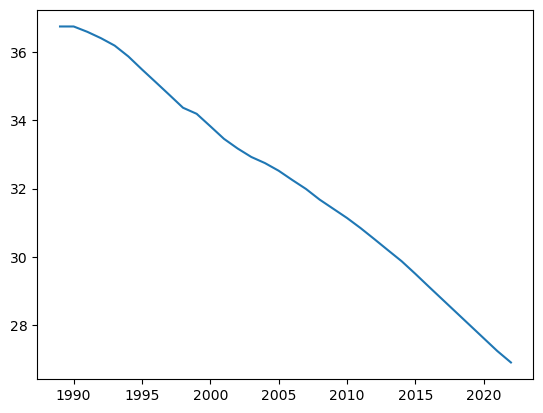

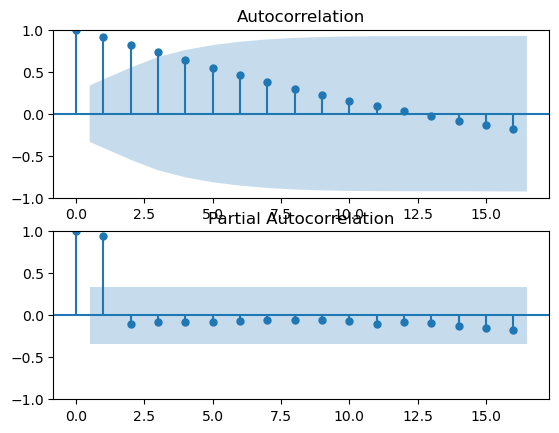

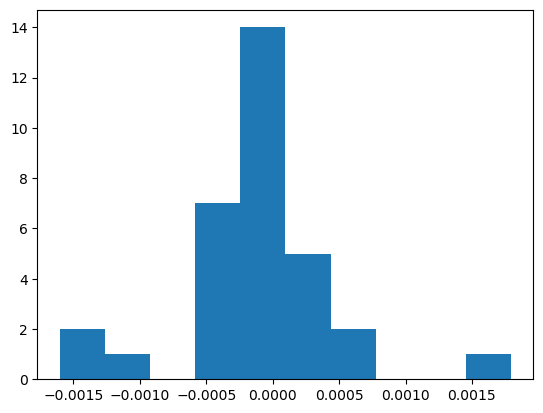

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:                        SARIMAX   Log Likelihood                 192.265
Date:                Wed, 01 Nov 2023   AIC                           -382.529
Time:                        23:03:48   BIC                           -381.064
Sample:                             0   HQIC                          -382.043
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      3.538e-07   5.62e-08      6.297      0.000    2.44e-07    4.64e-07
Ljung-Box (L1) (Q):                   0.66   Jarque-Bera (JB):                12.17
Prob(Q):                              0.41   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

first_diff 0.0 vuosi
1989         NaN
1990    0.000000
1991   -0.001534
1992   -0.001812
1993   -0.002084
1994   -0.003013
1995   -0.003579
1996   -0.003406
1997   -0.003376
1998   -0.003360
1999   -0.001567
2000   -0.003167
2001   -0.003152
2002   -0.002385
2003   -0.002063
2004   -0.001477
2005   -0.001826
2006   -0.002197
2007   -0.002088
2008   -0.002459
2009   -0.002089
2010   -0.002062
2011   -0.002260
2012   -0.002391
2013   -0.002399
2014   -0.002340
2015   -0.002629
2016   -0.002669
2017   -0.002591
2018   -0.002546
2019   -0.002501
2020   -0.002456
2021   -0.002412
2022   -0.002120
Name: maaseudulla, dtype: float64
x shape (45, 1)
first_value 0.15609921430927898
y shape (46, 1)
y            val
1989  0.156099
1990  0.000000
1991 -0.001534
1992 -0.001812
1993 -0.002084
1994 -0.003013
1995 -0.003579
1996 -0.003406
1997 -0.003376
1998 -0.003360
1999 -0.001567
2000 -0.003167
2001 -0.003152
2002 -0.002385
2003 -0.002063
2004 -0.001477
2005 -0.001826
2006 -0.002197
2007 -0.002088
2

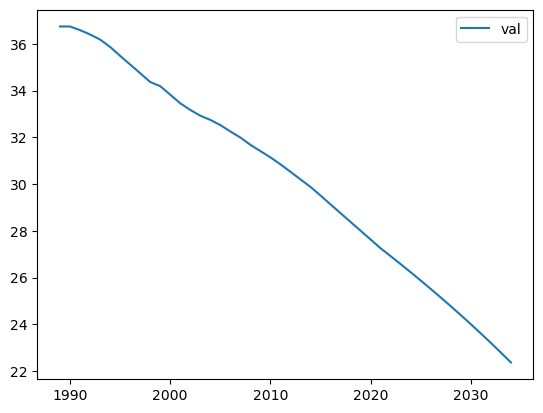

forecasting avioituvuus_naiset_30_34
deftrain vuosi
1989    49.60
1990    51.40
1991    50.50
1992    49.50
1993    53.60
1994    54.20
1995    52.60
1996    55.40
1997    51.10
1998    52.70
1999    53.00
2000    59.10
2001    55.20
2002    59.70
2003    59.80
2004    69.10
2005    71.80
2006    69.10
2007    73.30
2008    75.10
2009    72.70
2010    73.60
2011    70.20
2012    66.40
2013    59.80
2014    57.60
2015    56.00
2016    53.80
2017    51.10
2018    46.60
2019    42.90
2020    42.50
2021    40.70
2022    38.08
Name: avioituvuus_naiset_30_34, dtype: float64
vuosi
1989         NaN
1990    0.032769
1991   -0.016731
1992   -0.017780
1993    0.078560
1994    0.012850
1995   -0.033451
1996    0.060320
1997   -0.089425
1998    0.031120
1999    0.006105
2000    0.146134
2001   -0.098525
2002    0.115545
2003    0.002890
2004    0.357134
2005    0.150280
2006   -0.150280
2007    0.247370
2008    0.132407
2009   -0.172562
2010    0.060937
2011   -0.210333
2012   -0.183048
2013   -0.2

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


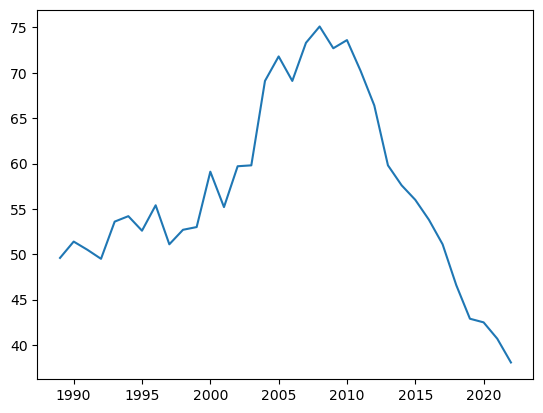

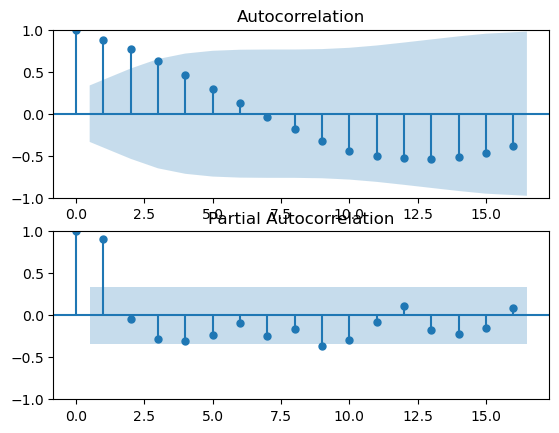

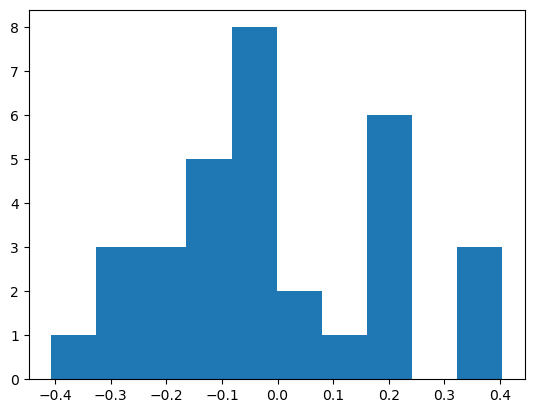

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  17.006
Date:                Wed, 01 Nov 2023   AIC                            -28.012
Time:                        23:03:49   BIC                            -23.615
Sample:                             0   HQIC                           -26.554
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9534      0.236     -4.043      0.000      -1.416      -0.491
ma.L2          0.3205      0.236      1.356      0.175      -0.143       0.784
sigma2         0.0196      0.005      3.982      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.030387
33   -0.003453
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

first_diff 0.0720149829011125 vuosi
1989         NaN
1990    0.072015
1991   -0.036014
1992   -0.040001
1993    0.164250
1994    0.024147
1995   -0.064303
1996    0.112752
1997   -0.172839
1998    0.064098
1999    0.012039
2000    0.247957
2001   -0.159346
2002    0.184226
2003    0.004158
2004    0.407660
2005    0.129764
2006   -0.129764
2007    0.205098
2008    0.094056
2009   -0.124498
2010    0.045826
2011   -0.168441
2012   -0.175669
2013   -0.284032
2014   -0.090764
2015   -0.065212
2016   -0.088868
2017   -0.108287
2018   -0.180217
2019   -0.149722
2020   -0.016349
2021   -0.074100
2022   -0.109773
Name: avioituvuus_naiset_30_34, dtype: float64
x shape (45, 1)
first_value -0.01600034134644119
y shape (46, 1)
y            val
1989 -0.016000
1990  0.072015
1991 -0.036014
1992 -0.040001
1993  0.164250
1994  0.024147
1995 -0.064303
1996  0.112752
1997 -0.172839
1998  0.064098
1999  0.012039
2000  0.247957
2001 -0.159346
2002  0.184226
2003  0.004158
2004  0.407660
2005  0.129764
20

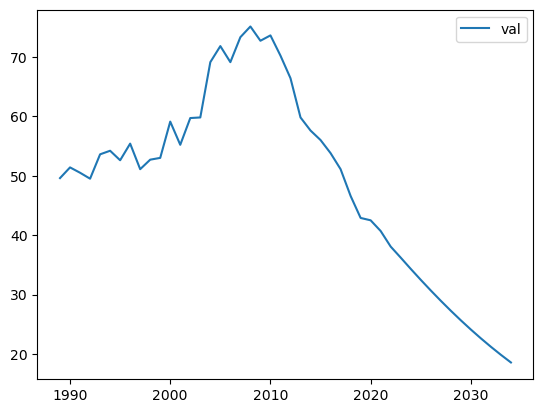

forecasting avioituvuus_naiset_25_29
deftrain vuosi
1989    88.30
1990    87.50
1991    86.00
1992    81.10
1993    84.80
1994    84.10
1995    78.50
1996    78.50
1997    75.50
1998    74.80
1999    74.40
2000    76.90
2001    72.70
2002    79.40
2003    75.60
2004    81.10
2005    80.50
2006    77.00
2007    78.80
2008    80.50
2009    76.50
2010    75.90
2011    68.90
2012    69.60
2013    59.70
2014    56.70
2015    54.70
2016    52.60
2017    48.70
2018    45.30
2019    39.30
2020    36.30
2021    35.00
2022    31.48
Name: avioituvuus_naiset_25_29, dtype: float64
vuosi
1989         NaN
1990   -0.272371
1991   -0.426421
1992   -0.918653
1993    0.638443
1994   -0.143791
1995   -0.810552
1996    0.000000
1997   -0.279977
1998   -0.055548
1999   -0.030346
2000    0.207325
2001   -0.326126
2002    0.584870
2003   -0.371973
2004    0.587675
2005   -0.080482
2006   -0.384712
2007    0.181734
2008    0.202978
2009   -0.430165
2010   -0.052004
2011   -0.455191
2012    0.035798
2013   -0.3

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


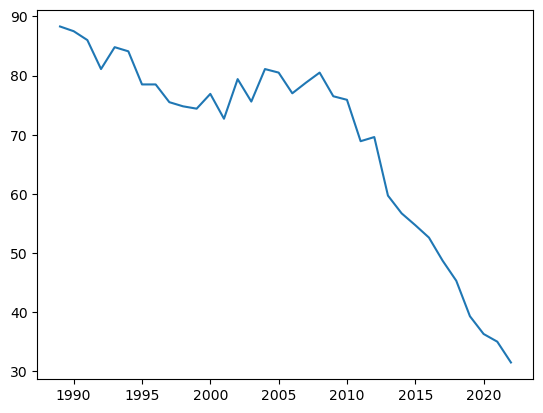

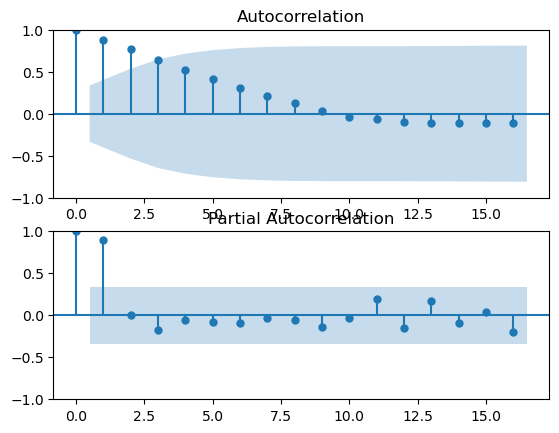

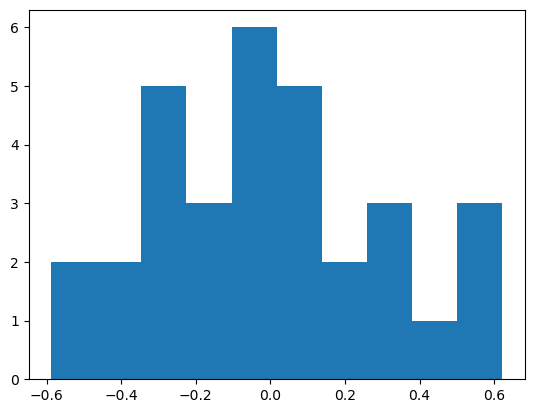

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(0, 0, 2)   Log Likelihood                   9.633
Date:                Wed, 01 Nov 2023   AIC                            -13.266
Time:                        23:03:50   BIC                             -8.869
Sample:                             0   HQIC                           -11.808
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.2137      0.205     -5.919      0.000      -1.616      -0.812
ma.L2          0.5413      0.175      3.096      0.002       0.199       0.884
sigma2         0.0304      0.009      3.242      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.014247
33    0.012138
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

first_diff -0.07524111675089062 vuosi
1989         NaN
1990   -0.075241
1991   -0.130620
1992   -0.358769
1993    0.262479
1994   -0.053313
1995   -0.370642
1996    0.000000
1997   -0.169586
1998   -0.037486
1999   -0.021110
2000    0.135810
2001   -0.223219
2002    0.369753
2003   -0.218334
2004    0.325648
2005   -0.038678
2006   -0.209532
2007    0.104601
2008    0.104931
2009   -0.237552
2010   -0.033085
2011   -0.351756
2012    0.032874
2013   -0.435341
2014   -0.123359
2015   -0.081065
2016   -0.084463
2017   -0.156106
2018   -0.136545
2019   -0.246163
2020   -0.127648
2021   -0.056672
2022   -0.158734
Name: avioituvuus_naiset_25_29, dtype: float64
x shape (45, 1)
first_value 2.021151265806204
y shape (46, 1)
y            val
1989  2.021151
1990 -0.075241
1991 -0.130620
1992 -0.358769
1993  0.262479
1994 -0.053313
1995 -0.370642
1996  0.000000
1997 -0.169586
1998 -0.037486
1999 -0.021110
2000  0.135810
2001 -0.223219
2002  0.369753
2003 -0.218334
2004  0.325648
2005 -0.038678
200

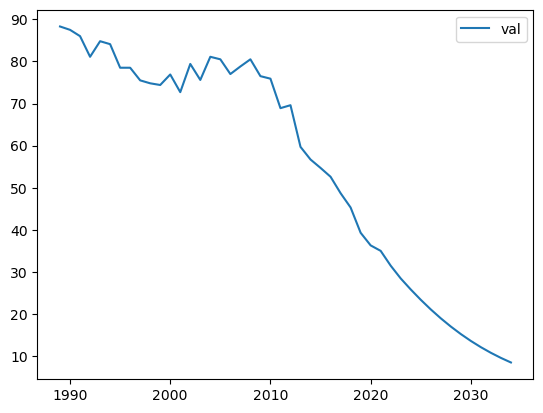

forecasting eronneisuus_25_29
deftrain vuosi
1989    24.5
1990    24.5
1991    24.5
1992    25.3
1993    23.8
1994    24.9
1995    27.1
1996    27.7
1997    28.0
1998    27.0
1999    29.6
2000    29.3
2001    28.5
2002    27.9
2003    27.2
2004    27.8
2005    28.5
2006    28.3
2007    27.9
2008    29.3
2009    30.4
2010    30.7
2011    29.8
2012    29.5
2013    31.7
2014    33.4
2015    32.2
2016    31.2
2017    31.1
2018    28.0
2019    29.4
2020    29.8
2021    29.1
2022    23.6
Name: eronneisuus_25_29, dtype: float64
vuosi
1989         NaN
1990    0.000000
1991    0.000000
1992    0.004528
1993   -0.008341
1994    0.006054
1995    0.013163
1996    0.003844
1997    0.001964
1998   -0.006437
1999    0.017397
2000   -0.002119
2001   -0.005505
2002   -0.003994
2003   -0.004517
2004    0.003862
2005    0.004649
2006   -0.001344
2007   -0.002650
2008    0.009499
2009    0.007915
2010    0.002230
2011   -0.006597
2012   -0.002138
2013    0.016395
2014    0.013848
2015   -0.009885
2016   -

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


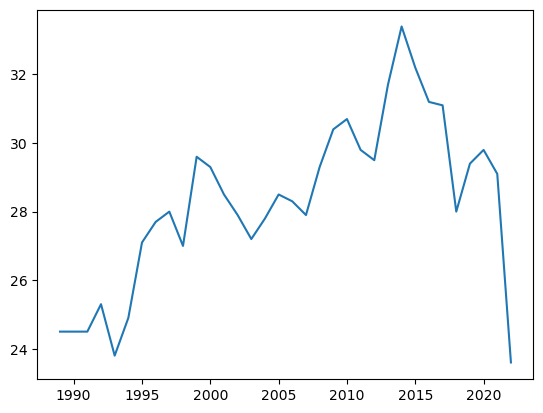

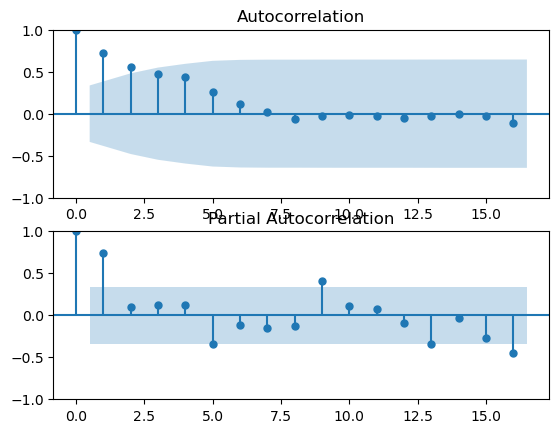

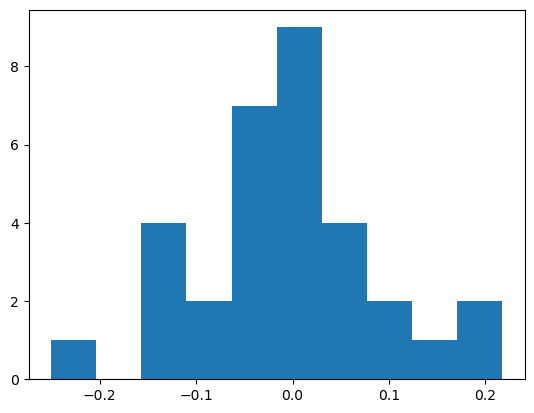

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  35.109
Date:                Wed, 01 Nov 2023   AIC                            -66.218
Time:                        23:03:51   BIC                            -63.286
Sample:                             0   HQIC                           -65.246
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8660      0.250     -3.459      0.001      -1.357      -0.375
sigma2         0.0062      0.001      4.659      0.000       0.004       0.009
Ljung-Box (L1) (Q):                   0.01   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.241834
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

first_diff 0.0 vuosi
1989         NaN
1990    0.000000
1991    0.000000
1992    0.042784
1993   -0.081000
1994    0.059723
1995    0.114398
1996    0.030163
1997    0.014930
1998   -0.050161
1999    0.128204
2000   -0.014439
2001   -0.038935
2002   -0.029634
2003   -0.035072
2004    0.030095
2005    0.034611
2006   -0.009836
2007   -0.019798
2008    0.068569
2009    0.052536
2010    0.014140
2011   -0.042658
2012   -0.014383
2013    0.103629
2014    0.077444
2015   -0.054447
2016   -0.046190
2017   -0.004663
2018   -0.149013
2019    0.068426
2020    0.019196
2021   -0.033692
2022   -0.284204
Name: eronneisuus_25_29, dtype: float64
x shape (45, 1)
first_value -1.1254595387042978
y shape (46, 1)
y            val
1989 -1.125460
1990  0.000000
1991  0.000000
1992  0.042784
1993 -0.081000
1994  0.059723
1995  0.114398
1996  0.030163
1997  0.014930
1998 -0.050161
1999  0.128204
2000 -0.014439
2001 -0.038935
2002 -0.029634
2003 -0.035072
2004  0.030095
2005  0.034611
2006 -0.009836
2007 -0.01

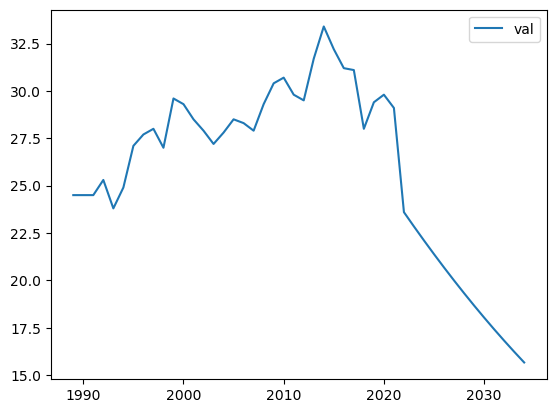

forecasting eronneisuus_30_34
deftrain vuosi
1989    20.9
1990    20.9
1991    21.5
1992    21.8
1993    21.6
1994    23.4
1995    24.7
1996    23.5
1997    24.6
1998    26.1
1999    27.6
2000    26.3
2001    26.8
2002    27.2
2003    25.9
2004    25.2
2005    25.3
2006    24.3
2007    25.6
2008    26.2
2009    26.2
2010    26.8
2011    24.9
2012    25.4
2013    26.7
2014    28.2
2015    28.2
2016    27.5
2017    27.3
2018    27.9
2019    28.1
2020    28.9
2021    25.3
2022    23.2
Name: eronneisuus_30_34, dtype: float64
vuosi
1989         NaN
1990    0.000000
1991    0.002789
1992    0.001430
1993   -0.000956
1994    0.008989
1995    0.007045
1996   -0.006520
1997    0.005961
1998    0.008687
1999    0.009357
2000   -0.008148
2001    0.003073
2002    0.002513
2003   -0.007991
2004   -0.004094
2005    0.000576
2006   -0.005632
2007    0.007378
2008    0.003571
2009    0.000000
2010    0.003679
2011   -0.011283
2012    0.002866
2013    0.007796
2014    0.009633
2015    0.000000
2016   -

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


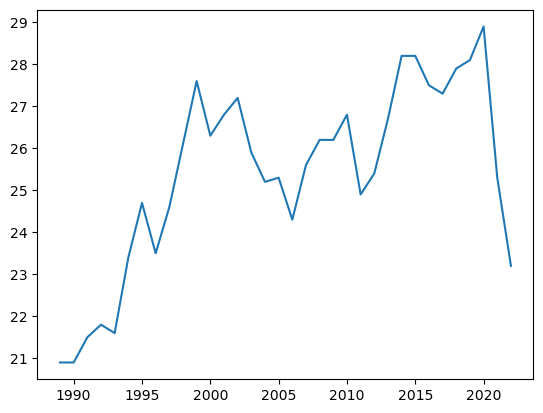

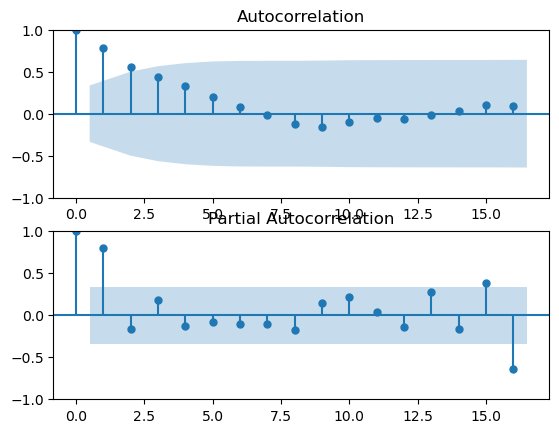

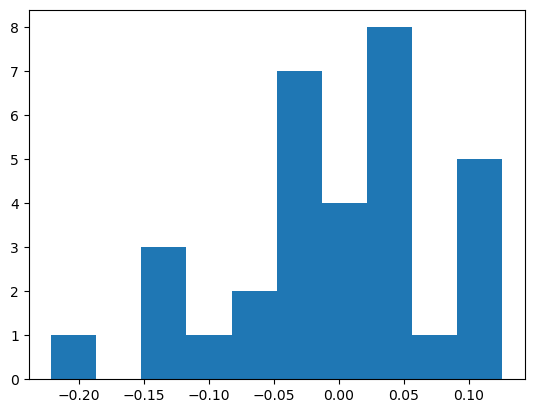

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  41.457
Date:                Wed, 01 Nov 2023   AIC                            -78.914
Time:                        23:03:53   BIC                            -75.983
Sample:                             0   HQIC                           -77.943
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8748      0.160     -5.465      0.000      -1.189      -0.561
sigma2         0.0042      0.001      4.801      0.000       0.002       0.006
Ljung-Box (L1) (Q):                   0.12   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.090475
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

first_diff 0.0 vuosi
1989         NaN
1990    0.000000
1991    0.035918
1992    0.017686
1993   -0.011771
1994    0.103270
1995    0.071184
1996   -0.065613
1997    0.060229
1998    0.079283
1999    0.076387
2000   -0.066043
2001    0.025640
2002    0.020295
2003   -0.066674
2004   -0.036801
2005    0.005298
2006   -0.053626
2007    0.069438
2008    0.031264
2009    0.000000
2010    0.030806
2011   -0.099159
2012    0.026561
2013    0.067494
2014    0.075335
2015    0.000000
2016   -0.034838
2017   -0.010054
2018    0.030027
2019    0.009921
2020    0.039261
2021   -0.182430
2022   -0.114377
Name: eronneisuus_30_34, dtype: float64
x shape (45, 1)
first_value -1.330963715802843
y shape (46, 1)
y            val
1989 -1.330964
1990  0.000000
1991  0.035918
1992  0.017686
1993 -0.011771
1994  0.103270
1995  0.071184
1996 -0.065613
1997  0.060229
1998  0.079283
1999  0.076387
2000 -0.066043
2001  0.025640
2002  0.020295
2003 -0.066674
2004 -0.036801
2005  0.005298
2006 -0.053626
2007  0.069

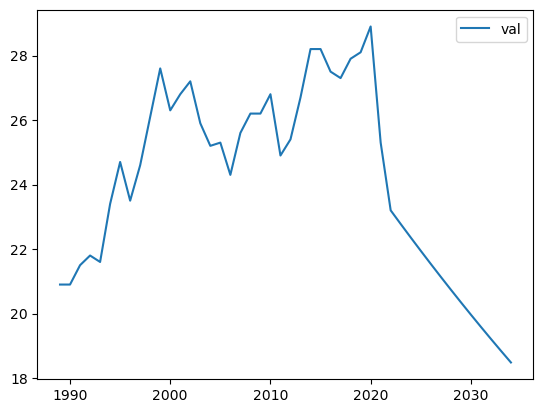

forecasting kolmasaste_miehet_25_29
deftrain vuosi
1989    20.107373
1990    22.205197
1991    22.453978
1992    22.901235
1993    23.510258
1994    24.205012
1995    24.960745
1996    25.616093
1997    26.217215
1998    26.662807
1999    26.947105
2000    26.623608
2001    26.294341
2002    26.259540
2003    26.134055
2004    25.544319
2005    24.716070
2006    24.048134
2007    23.160055
2008    23.499413
2009    23.090350
2010    23.577176
2011    23.447542
2012    23.629484
2013    24.187490
2014    24.390300
2015    24.361501
2016    24.523367
2017    24.594590
2018    25.629261
2019    26.038822
2020    26.834353
2021    27.285950
2022    27.737547
Name: kolmasaste_miehet_25_29, dtype: float64
vuosi
1989         NaN
1990    0.009730
1991    0.001231
1992    0.002254
1993    0.003158
1994    0.003727
1995    0.004209
1996    0.003783
1997    0.003581
1998    0.002724
1999    0.001769
2000   -0.002011
2001   -0.002015
2002   -0.000211
2003   -0.000758
2004   -0.003499
2005   -0.004

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


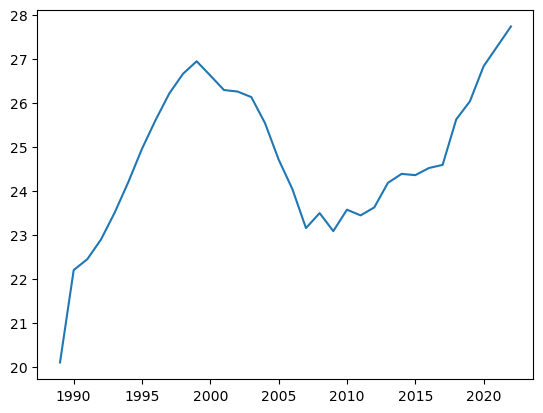

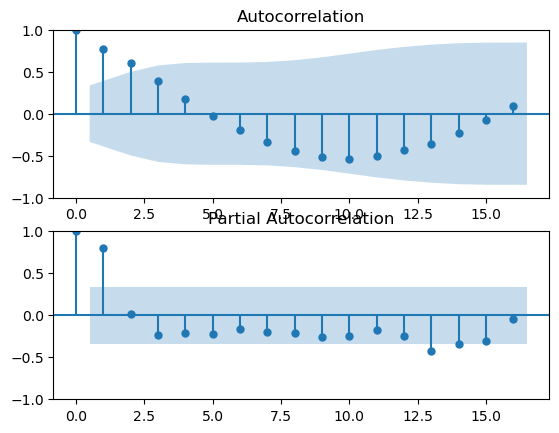

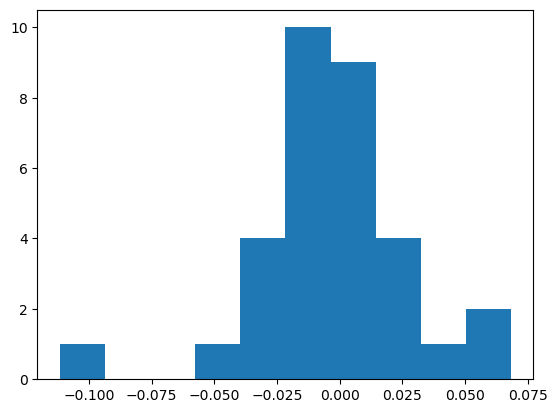

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  69.722
Date:                Wed, 01 Nov 2023   AIC                           -135.444
Time:                        23:03:54   BIC                           -132.513
Sample:                             0   HQIC                          -134.472
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5931      0.089     -6.628      0.000      -0.768      -0.418
sigma2         0.0007      0.000      5.399      0.000       0.000       0.001
Ljung-Box (L1) (Q):                   1.59   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    1.396038e-04
33   -8.279697e-05
34    4.910568e-05
35   -2.912386e-05
36    1.727294e-05
37   -1.024433e-05
38    6.075763e-06
39   -3.603447e-06
40    2.137152e-06
41   -1.267514e-06
42    7.517439e-07
43   -4.458484e-07
dtype: float64

first_diff 0.12584873438892896 vuosi
1989         NaN
1990    0.125849
1991    0.014344
1992    0.025507
1993    0.034177
1994    0.038247
1995    0.040765
1996    0.034688
1997    0.031310
1998    0.022911
1999    0.014490
2000   -0.016496
2001   -0.016922
2002   -0.001796
2003   -0.006490
2004   -0.030776
2005   -0.044024
2006   -0.036229
2007   -0.049253
2008    0.018973
2009   -0.022894
2010    0.027214
2011   -0.007208
2012    0.010109
2013    0.030674
2014    0.011029
2015   -0.001562
2016    0.008765
2017    0.003844
2018    0.055025
2019    0.021376
2020    0.040909
2021    0.022880
2022    0.022645
Name: kolmasaste_miehet_25_29, dtype: float64
x shape (45, 1)
first_value -1.3795969920962674
y shape (46, 1)
y            val
1989 -1.379597
1990  0.125849
1991  0.014344
1992  0.025507
1993  0.034177
1994  0.038247
1995  0.040765
1996  0.034688
1997  0.031310
1998  0.022911
1999  0.014490
2000 -0.016496
2001 -0.016922
2002 -0.001796
2003 -0.006490
2004 -0.030776
2005 -0.044024
200

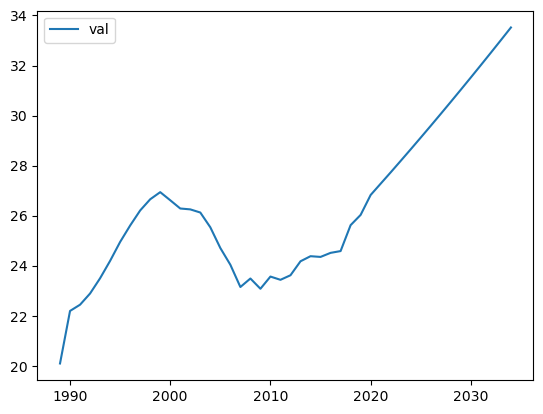

forecasting miehet_perusaste_25_29
deftrain vuosi
1989    20.622496
1990    20.392464
1991    20.711388
1992    20.999953
1993    21.111241
1994    21.077666
1995    21.027868
1996    20.965926
1997    20.837837
1998    20.580376
1999    19.891381
2000    18.794711
2001    17.894231
2002    17.009367
2003    16.528926
2004    16.666864
2005    17.446047
2006    17.979952
2007    18.816233
2008    19.640557
2009    19.792455
2010    19.769287
2011    19.772334
2012    19.642062
2013    19.077004
2014    18.705321
2015    18.815502
2016    18.755041
2017    18.224922
2018    16.643579
2019    16.476962
2020    16.418969
2021    16.664354
2022    16.909738
Name: miehet_perusaste_25_29, dtype: float64
vuosi
1989         NaN
1990   -0.001028
1991    0.001429
1992    0.001316
1993    0.000513
1994   -0.000155
1995   -0.000230
1996   -0.000285
1997   -0.000586
1998   -0.001164
1999   -0.003032
2000   -0.004579
2001   -0.003538
2002   -0.003286
2003   -0.001706
2004    0.000484
2005    0.00282

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


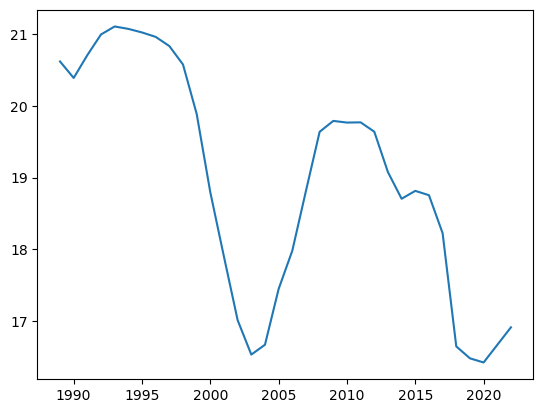

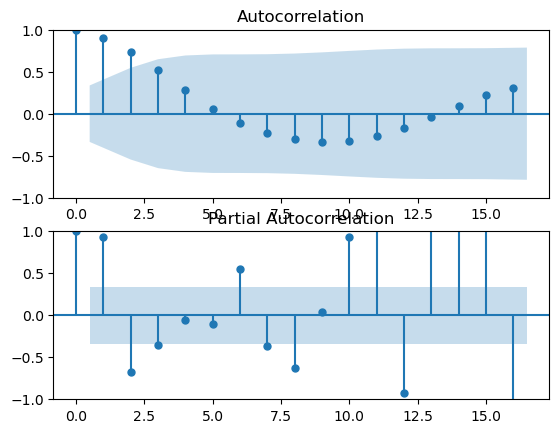

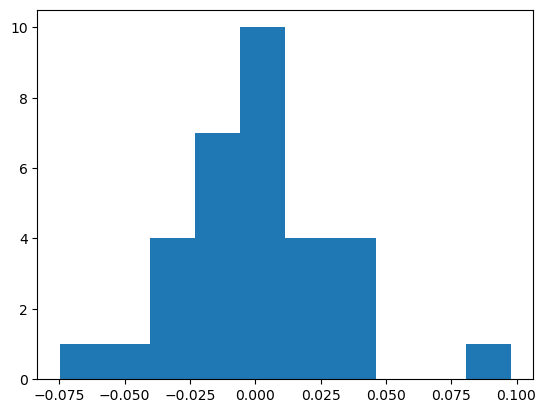

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:                        SARIMAX   Log Likelihood                  66.548
Date:                Wed, 01 Nov 2023   AIC                           -131.096
Time:                        23:03:55   BIC                           -129.630
Sample:                             0   HQIC                          -130.610
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0009      0.000      5.833      0.000       0.001       0.001
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                 8.28
Prob(Q):                              0.92   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

first_diff -0.014110803760680524 vuosi
1989         NaN
1990   -0.014111
1991    0.019533
1992    0.017483
1993    0.006695
1994   -0.002017
1995   -0.002996
1996   -0.003734
1997   -0.007747
1998   -0.015679
1999   -0.042689
2000   -0.070308
2001   -0.060125
2002   -0.061434
2003   -0.034425
2004    0.009965
2005    0.055085
2006    0.036633
2007    0.055711
2008    0.053082
2009    0.009596
2010   -0.001460
2011    0.000192
2012   -0.008233
2013   -0.036197
2014   -0.024258
2015    0.007229
2016   -0.003963
2017   -0.035176
2018   -0.109919
2019   -0.012058
2020   -0.004220
2021    0.017775
2022    0.017567
Name: miehet_perusaste_25_29, dtype: float64
x shape (45, 1)
first_value -1.3478325104321094
y shape (46, 1)
y            val
1989 -1.347833
1990 -0.014111
1991  0.019533
1992  0.017483
1993  0.006695
1994 -0.002017
1995 -0.002996
1996 -0.003734
1997 -0.007747
1998 -0.015679
1999 -0.042689
2000 -0.070308
2001 -0.060125
2002 -0.061434
2003 -0.034425
2004  0.009965
2005  0.055085
20

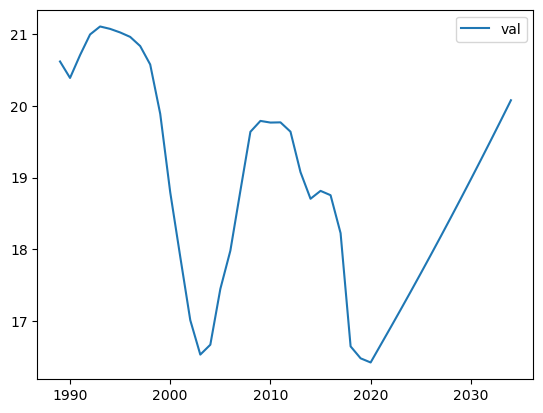

forecasting naiset_perusaste_25_29
deftrain vuosi
1989    15.302356
1990    14.717245
1991    14.826401
1992    14.835357
1993    15.004875
1994    15.204912
1995    15.229444
1996    15.164057
1997    15.135521
1998    14.719673
1999    13.921993
2000    13.071773
2001    12.265554
2002    11.460272
2003    11.062406
2004    10.786152
2005    11.056093
2006    11.176154
2007    11.666912
2008    12.028292
2009    12.436460
2010    12.642483
2011    13.002615
2012    13.298087
2013    13.307604
2014    13.608384
2015    14.038692
2016    14.061254
2017    13.757539
2018    12.078706
2019    12.005701
2020    12.015282
2021    12.194444
2022    12.373606
Name: naiset_perusaste_25_29, dtype: float64
vuosi
1989         NaN
1990   -0.001838
1991    0.000337
1992    0.000028
1993    0.000529
1994    0.000633
1995    0.000078
1996   -0.000208
1997   -0.000091
1998   -0.001299
1999   -0.002381
2000   -0.002381
2001   -0.002110
2002   -0.001966
2003   -0.000919
2004   -0.000618
2005    0.00060

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


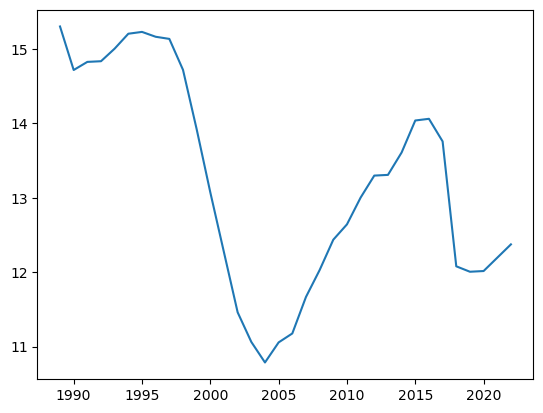

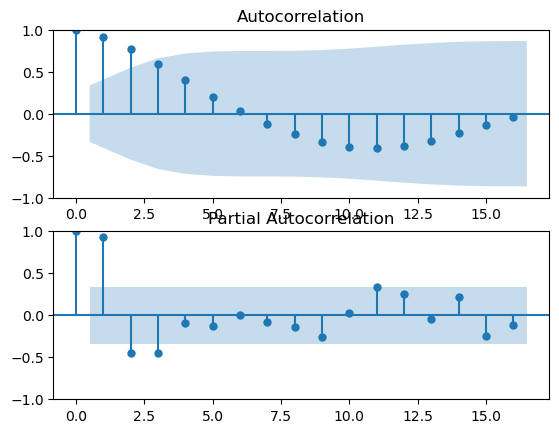

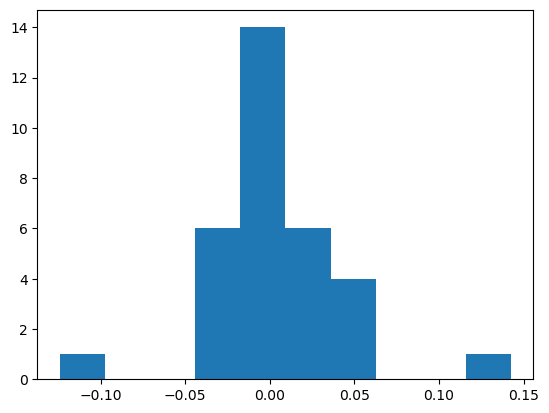

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  58.562
Date:                Wed, 01 Nov 2023   AIC                           -113.125
Time:                        23:03:57   BIC                           -110.193
Sample:                             0   HQIC                          -112.153
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2676      0.099     -2.693      0.007      -0.462      -0.073
sigma2         0.0015      0.000      6.447      0.000       0.001       0.002
Ljung-Box (L1) (Q):                   0.01   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    5.665773e-05
33   -1.516214e-05
34    4.057530e-06
35   -1.085833e-06
36    2.905791e-07
37   -7.776170e-08
38    2.080976e-08
39   -5.568886e-09
40    1.490286e-09
41   -3.988145e-10
42    1.067265e-10
43   -2.856101e-11
dtype: float64

first_diff -0.045871348587298355 vuosi
1989         NaN
1990   -0.045871
1991    0.008670
1992    0.000709
1993    0.013354
1994    0.015600
1995    0.001901
1996   -0.005074
1997   -0.002220
1998   -0.032748
1999   -0.065025
2000   -0.072843
2001   -0.072892
2002   -0.077045
2003   -0.039818
2004   -0.028391
2005    0.027749
2006    0.012151
2007    0.048515
2008    0.034604
2009    0.038022
2010    0.018786
2011    0.032219
2012    0.025872
2013    0.000825
2014    0.025826
2015    0.036124
2016    0.001868
2017   -0.025364
2018   -0.149422
2019   -0.006892
2020    0.000907
2021    0.016839
2022    0.016628
Name: naiset_perusaste_25_29, dtype: float64
x shape (45, 1)
first_value -1.7110809595947396
y shape (46, 1)
y            val
1989 -1.711081
1990 -0.045871
1991  0.008670
1992  0.000709
1993  0.013354
1994  0.015600
1995  0.001901
1996 -0.005074
1997 -0.002220
1998 -0.032748
1999 -0.065025
2000 -0.072843
2001 -0.072892
2002 -0.077045
2003 -0.039818
2004 -0.028391
2005  0.027749
20

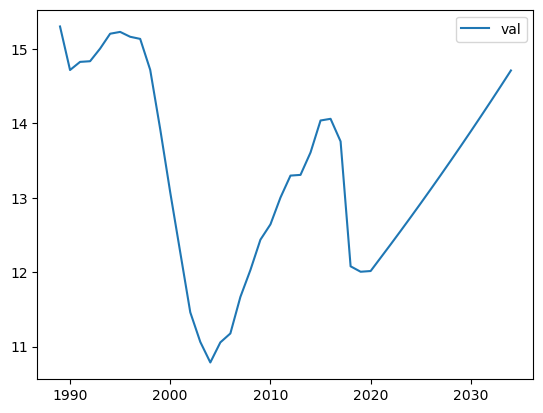

forecasting kolmasaste_naiset_25_29
deftrain vuosi
1989    30.398524
1990    32.809533
1991    33.948113
1992    35.351887
1993    36.819219
1994    38.056218
1995    39.319164
1996    40.384862
1997    41.659610
1998    42.828980
1999    43.489097
2000    43.656267
2001    43.675060
2002    43.790829
2003    43.565871
2004    42.977488
2005    41.887665
2006    41.039605
2007    40.026237
2008    41.208562
2009    40.382550
2010    40.416268
2011    40.288391
2012    40.271213
2013    40.543707
2014    40.079737
2015    39.292645
2016    38.844030
2017    38.852541
2018    39.815487
2019    40.014369
2020    40.601231
2021    41.215601
2022    41.829970
Name: kolmasaste_naiset_25_29, dtype: float64
vuosi
1989         NaN
1990    0.018817
1991    0.009627
1992    0.012566
1993    0.014000
1994    0.012529
1995    0.013517
1996    0.012005
1997    0.015121
1998    0.014640
1999    0.008606
2000    0.002220
2001    0.000251
2002    0.001548
2003   -0.003001
2004   -0.007709
2005   -0.013

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


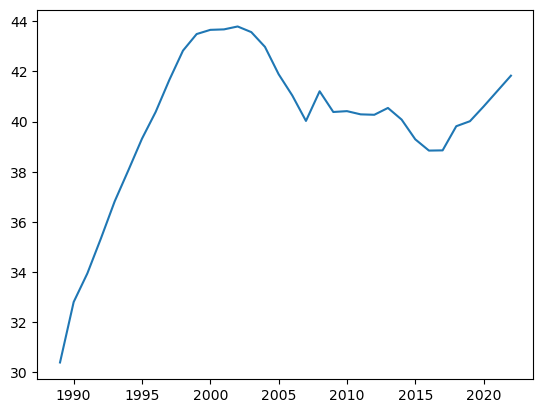

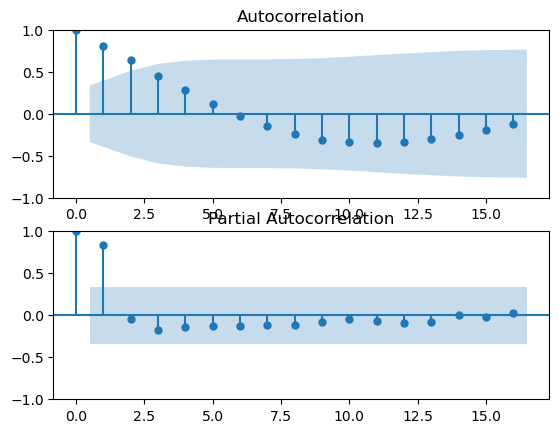

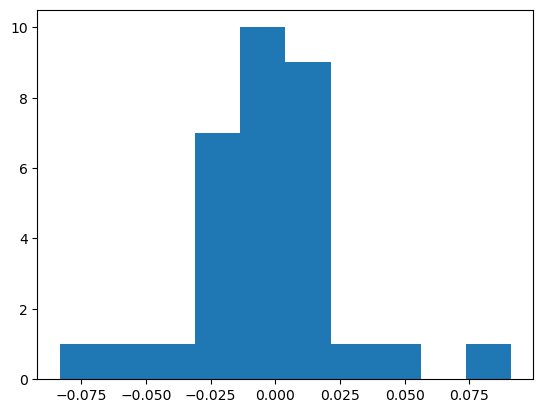

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  71.838
Date:                Wed, 01 Nov 2023   AIC                           -139.676
Time:                        23:03:58   BIC                           -136.744
Sample:                             0   HQIC                          -138.704
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5017      0.155     -3.241      0.001      -0.805      -0.198
sigma2         0.0007      0.000      5.980      0.000       0.000       0.001
Ljung-Box (L1) (Q):                   0.02   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    5.668072e-05
33   -2.843445e-05
34    1.426442e-05
35   -7.155891e-06
36    3.589824e-06
37   -1.800871e-06
38    9.034249e-07
39   -4.532121e-07
40    2.273584e-07
41   -1.140566e-07
42    5.721763e-08
43   -2.870380e-08
dtype: float64

first_diff 0.11157945288154891 vuosi
1989         NaN
1990    0.111579
1991    0.051205
1992    0.062000
1993    0.063627
1994    0.052817
1995    0.053247
1996    0.044461
1997    0.052692
1998    0.047930
1999    0.026909
2000    0.006799
2001    0.000764
2002    0.004705
2003   -0.009144
2004   -0.023970
2005   -0.044617
2006   -0.034942
2007   -0.042044
2008    0.049022
2009   -0.034200
2010    0.001400
2011   -0.005313
2012   -0.000714
2013    0.011316
2014   -0.019283
2015   -0.032884
2016   -0.018846
2017    0.000358
2018    0.040356
2019    0.008293
2020    0.024391
2021    0.025415
2022    0.025302
Name: kolmasaste_naiset_25_29, dtype: float64
x shape (45, 1)
first_value -0.8283917352093039
y shape (46, 1)
y            val
1989 -0.828392
1990  0.111579
1991  0.051205
1992  0.062000
1993  0.063627
1994  0.052817
1995  0.053247
1996  0.044461
1997  0.052692
1998  0.047930
1999  0.026909
2000  0.006799
2001  0.000764
2002  0.004705
2003 -0.009144
2004 -0.023970
2005 -0.044617
200

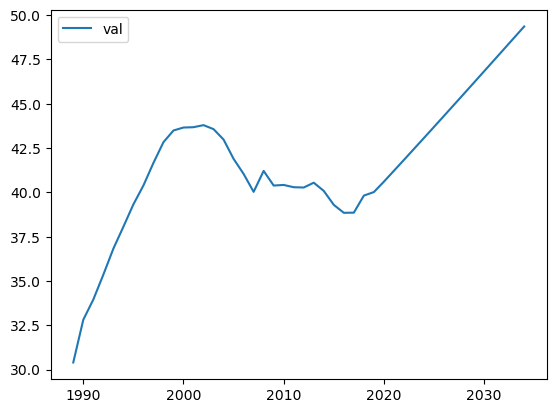

forecasting alypuhelin
deftrain vuosi
1989     0.0
1990     0.0
1991     0.0
1992     0.0
1993     0.0
1994     0.0
1995     0.0
1996     0.0
1997     0.0
1998     0.0
1999     0.0
2000     0.0
2001     0.0
2002     0.0
2003     0.0
2004     0.0
2005     0.6
2006     1.6
2007     3.6
2008     6.6
2009    11.6
2010    18.6
2011    28.6
2012    38.6
2013    51.5
2014    61.5
2015    68.4
2016    74.9
2017    79.1
2018    80.0
2019    83.0
2020    87.0
2021    88.0
2022    88.0
Name: alypuhelin, dtype: float64
vuosi
1989         NaN
1990    0.000000
1991    0.000000
1992    0.000000
1993    0.000000
1994    0.000000
1995    0.000000
1996    0.000000
1997    0.000000
1998    0.000000
1999    0.000000
2000    0.000000
2001    0.000000
2002    0.000000
2003    0.000000
2004    0.000000
2005    0.000036
2006    0.000220
2007    0.001042
2008    0.003077
2009    0.009264
2010    0.022196
2011    0.053247
2012    0.086000
2013    0.185878
2014    0.247338
2015    0.270892
2016    0.398719
2017 

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


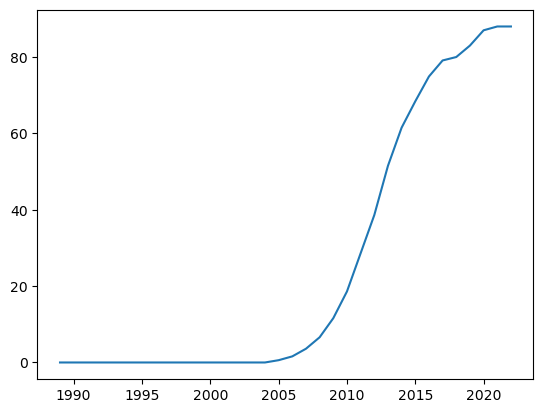

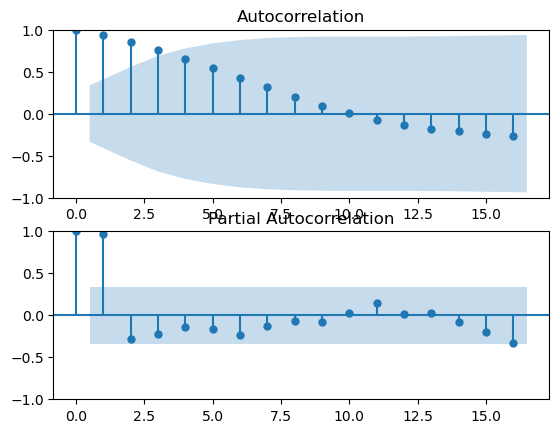

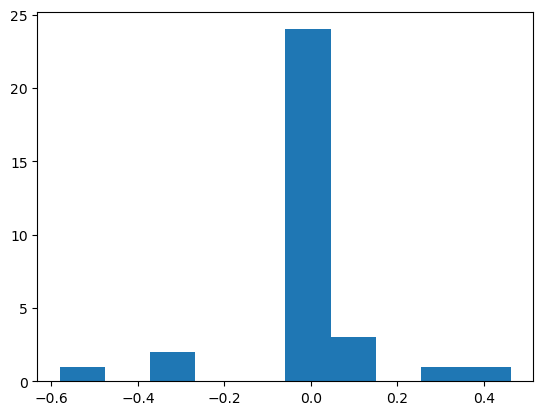

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(5, 0, 0)   Log Likelihood                  38.040
Date:                Wed, 01 Nov 2023   AIC                            -64.081
Time:                        23:03:59   BIC                            -55.286
Sample:                             0   HQIC                           -61.166
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2077      0.145      1.430      0.153      -0.077       0.492
ar.L2         -1.3196      0.166     -7.960      0.000      -1.644      -0.995
ar.L3          1.0430      0.294      3.549      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:1346: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum
/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.866788
33    0.091109
34   -0.935760
35    0.266502
36    0.877271
37   -0.540604
38   -0.628856
39    0.729166
40    0.334316
41   -0.735982
42   -0.029498
43    0.622958
dtype: float64

first_diff 0.0 vuosi
1989         NaN
1990    0.000000
1991    0.000000
1992    0.000000
1993    0.000000
1994    0.000000
1995    0.000000
1996    0.000000
1997    0.000000
1998    0.000000
1999    0.000000
2000    0.000000
2001    0.000000
2002    0.000000
2003    0.000000
2004    0.000000
2005    0.000036
2006    0.000220
2007    0.001042
2008    0.003077
2009    0.009264
2010    0.022196
2011    0.053247
2012    0.086000
2013    0.185878
2014    0.247338
2015    0.270892
2016    0.398719
2017    0.393609
2018    0.106260
2019    0.436623
2020    0.899133
2021    0.319091
2022    0.000000
Name: alypuhelin, dtype: float64
x shape (45, 1)
first_value 0.0
y shape (46, 1)
y            val
1989  0.000000
1990  0.000000
1991  0.000000
1992  0.000000
1993  0.000000
1994  0.000000
1995  0.000000
1996  0.000000
1997  0.000000
1998  0.000000
1999  0.000000
2000  0.000000
2001  0.000000
2002  0.000000
2003  0.000000
2004  0.000000
2005  0.000036
2006  0.000220
2007  0.001042
2008  0.003077
200

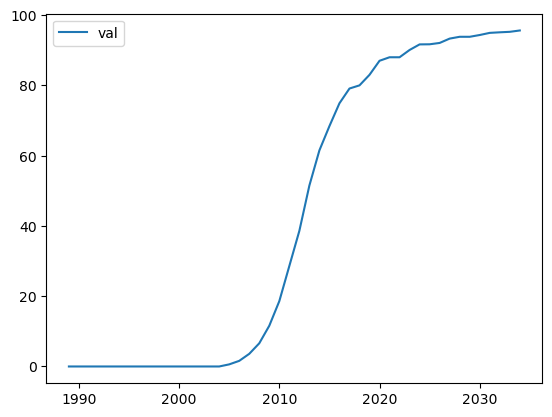

forecasting some_25_34
deftrain vuosi
1989     0.000000
1990     0.000000
1991     0.000000
1992     0.000000
1993     0.000000
1994     0.000000
1995     0.000000
1996     0.000000
1997     0.000000
1998     0.000000
1999     0.000000
2000     0.100625
2001     0.201250
2002     0.402500
2003     0.805000
2004     1.610000
2005     3.220000
2006     5.060000
2007     8.280000
2008    11.500000
2009    17.480000
2010    21.160000
2011    23.000000
2012    21.000000
2013    26.000000
2014    33.000000
2015    44.000000
2016    55.000000
2017    57.000000
2018    53.000000
2019    74.000000
2020    85.000000
2021    81.000000
2022    80.000000
Name: some_25_34, dtype: float64
vuosi
1989         NaN
1990    0.000000
1991    0.000000
1992    0.000000
1993    0.000000
1994    0.000000
1995    0.000000
1996    0.000000
1997    0.000000
1998    0.000000
1999    0.000000
2000    0.000001
2001    0.000003
2002    0.000012
2003    0.000049
2004    0.000194
2005    0.000779
2006    0.001529
2007 

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


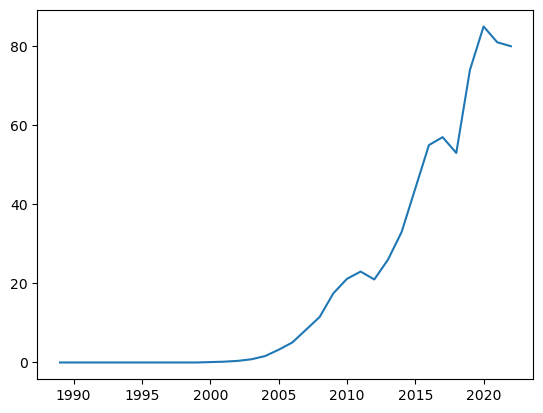

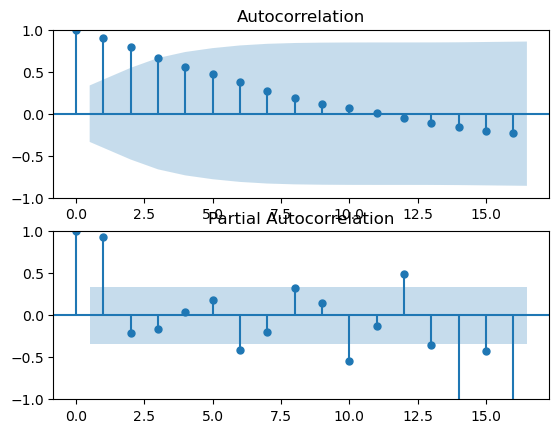

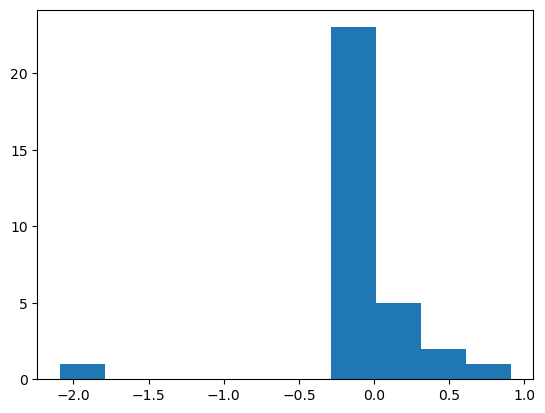

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(4, 0, 0)   Log Likelihood                  -1.510
Date:                Wed, 01 Nov 2023   AIC                             13.021
Time:                        23:04:01   BIC                             20.350
Sample:                             0   HQIC                            15.450
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7298      0.187     -3.897      0.000      -1.097      -0.363
ar.L2         -1.5282      0.248     -6.173      0.000      -2.013      -1.043
ar.L3         -0.4991      0.481     -1.038      0.2

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    2.012883
33   -1.593351
34   -1.093493
35    1.929760
36   -0.003953
37   -1.559691
38    0.757998
39    0.814154
40   -0.971937
41   -0.090324
42    0.744928
43   -0.350024
dtype: float64

first_diff 0.0 vuosi
1989         NaN
1990    0.000000
1991    0.000000
1992    0.000000
1993    0.000000
1994    0.000000
1995    0.000000
1996    0.000000
1997    0.000000
1998    0.000000
1999    0.000000
2000    0.000001
2001    0.000003
2002    0.000012
2003    0.000049
2004    0.000194
2005    0.000779
2006    0.001529
2007    0.004336
2008    0.006499
2009    0.018116
2010    0.015355
2011    0.008981
2012   -0.009720
2013    0.026367
2014    0.049707
2015    0.117871
2016    0.193612
2017    0.047570
2018   -0.090635
2019    0.819806
2020    1.393170
2021   -0.695782
2022   -0.130044
Name: some_25_34, dtype: float64
x shape (45, 1)
first_value 0.0
y shape (46, 1)
y            val
1989  0.000000
1990  0.000000
1991  0.000000
1992  0.000000
1993  0.000000
1994  0.000000
1995  0.000000
1996  0.000000
1997  0.000000
1998  0.000000
1999  0.000000
2000  0.000001
2001  0.000003
2002  0.000012
2003  0.000049
2004  0.000194
2005  0.000779
2006  0.001529
2007  0.004336
2008  0.006499
200

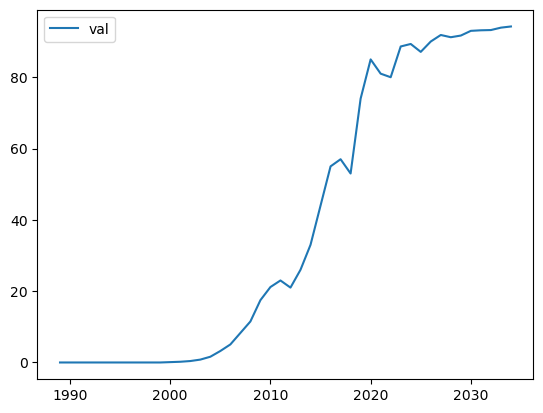

forecasting some_35_44
deftrain vuosi
1989     0.000000
1990     0.000000
1991     0.000000
1992     0.000000
1993     0.000000
1994     0.000000
1995     0.000000
1996     0.000000
1997     0.000000
1998     0.000000
1999     0.000000
2000     0.056875
2001     0.113750
2002     0.227500
2003     0.455000
2004     0.910000
2005     1.820000
2006     2.860000
2007     4.680000
2008     6.500000
2009     9.880000
2010    11.960000
2011    13.000000
2012    13.000000
2013    18.000000
2014    19.000000
2015    27.000000
2016    41.000000
2017    41.000000
2018    47.000000
2019    45.202500
2020    47.010600
2021    73.000000
2022    79.000000
Name: some_35_44, dtype: float64
vuosi
1989             NaN
1990    0.000000e+00
1991    0.000000e+00
1992    0.000000e+00
1993    0.000000e+00
1994    0.000000e+00
1995    0.000000e+00
1996    0.000000e+00
1997    0.000000e+00
1998    0.000000e+00
1999    0.000000e+00
2000    3.234767e-07
2001    9.704313e-07
2002    3.881744e-06
2003    1.552728e

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


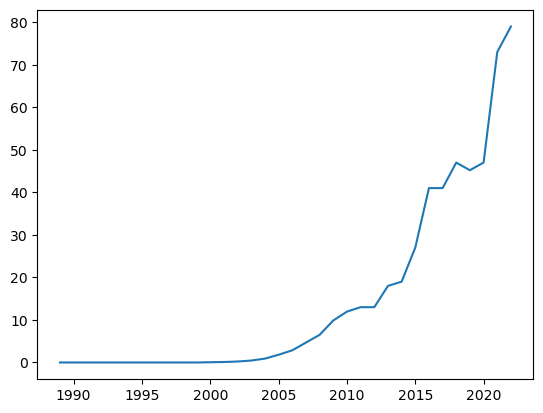

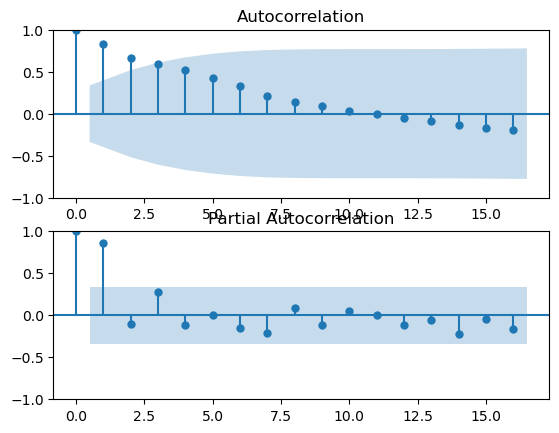

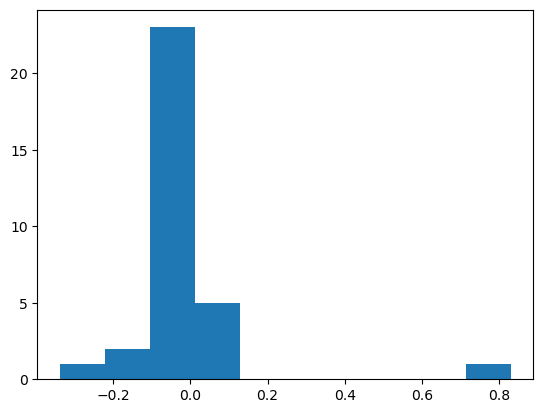

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(4, 0, 0)   Log Likelihood                  18.806
Date:                Wed, 01 Nov 2023   AIC                            -27.612
Time:                        23:04:02   BIC                            -20.283
Sample:                             0   HQIC                           -25.183
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2835      0.620     -0.457      0.648      -1.500       0.933
ar.L2         -1.1811      0.970     -1.218      0.223      -3.081       0.719
ar.L3         -0.2014      0.996     -0.202      0.8

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32   -0.819866
33    0.426545
34    0.333909
35   -0.196740
36    0.149713
37   -0.176080
38   -0.321137
39    0.406637
40    0.194610
41   -0.347427
42    0.011662
43    0.083026
dtype: float64

first_diff 0.0 vuosi
1989             NaN
1990    0.000000e+00
1991    0.000000e+00
1992    0.000000e+00
1993    0.000000e+00
1994    0.000000e+00
1995    0.000000e+00
1996    0.000000e+00
1997    0.000000e+00
1998    0.000000e+00
1999    0.000000e+00
2000    3.234767e-07
2001    9.704313e-07
2002    3.881744e-06
2003    1.552728e-05
2004    6.211393e-05
2005    2.485329e-04
2006    4.872798e-04
2007    1.376418e-03
2008    2.047879e-03
2009    5.614739e-03
2010    4.654073e-03
2011    2.678782e-03
2012    0.000000e+00
2013    1.629439e-02
2014    3.967107e-03
2015    4.118028e-02
2016    1.234353e-01
2017    0.000000e+00
2018    8.146472e-02
2019   -2.673521e-02
2020    2.689940e-02
2021    8.571727e-01
2022    5.194128e-01
Name: some_35_44, dtype: float64
x shape (45, 1)
first_value 0.0
y shape (46, 1)
y                val
1989  0.000000e+00
1990  0.000000e+00
1991  0.000000e+00
1992  0.000000e+00
1993  0.000000e+00
1994  0.000000e+00
1995  0.000000e+00
1996  0.000000e+00
1997  0.000

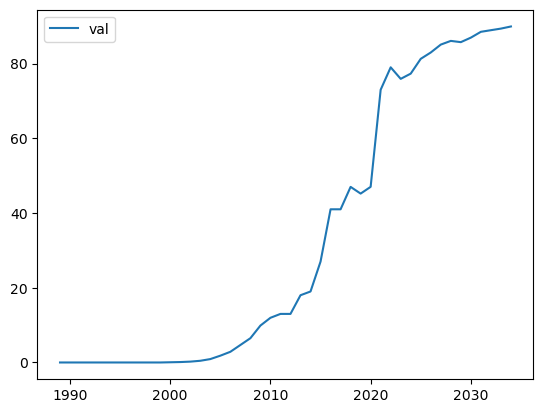

forecasting työttömyys_miehet_25_34
deftrain vuosi
1989     2.9
1990     2.7
1991     5.9
1992    12.6
1993    18.5
1994    20.8
1995    16.1
1996    15.1
1997    13.2
1998    11.6
1999    10.6
2000     9.8
2001     7.9
2002     8.8
2003     8.0
2004     9.3
2005     8.4
2006     7.2
2007     6.5
2008     5.5
2009     8.1
2010     9.4
2011     8.2
2012     7.9
2013     7.7
2014     9.6
2015    10.4
2016     9.6
2017     9.7
2018     9.2
2019     7.1
2020     7.3
2021     8.7
2022     5.3
Name: työttömyys_miehet_25_34, dtype: float64
vuosi
1989         NaN
1990   -0.000112
1991    0.002764
1992    0.012639
1993    0.019306
1994    0.009783
1995   -0.018610
1996   -0.003278
1997   -0.005600
1998   -0.004093
1999   -0.002276
2000   -0.001667
2001   -0.003417
2002    0.001524
2003   -0.001363
2004    0.002283
2005   -0.001618
2006   -0.001895
2007   -0.000968
2008   -0.001209
2009    0.003570
2010    0.002310
2011   -0.002145
2012   -0.000489
2013   -0.000316
2014    0.003337
2015    0.001

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


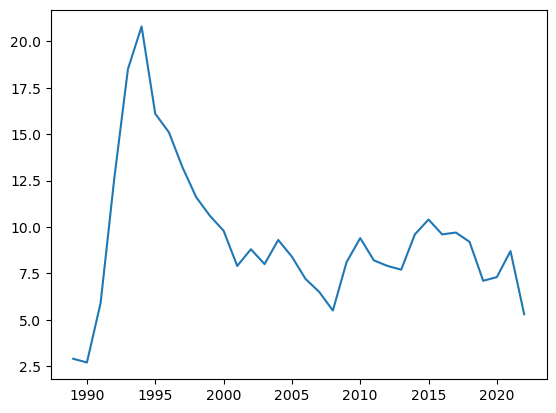

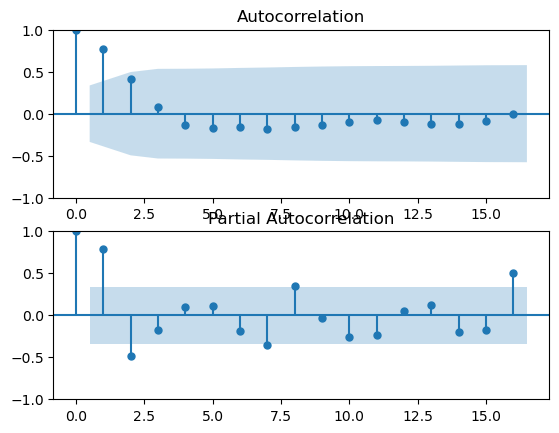

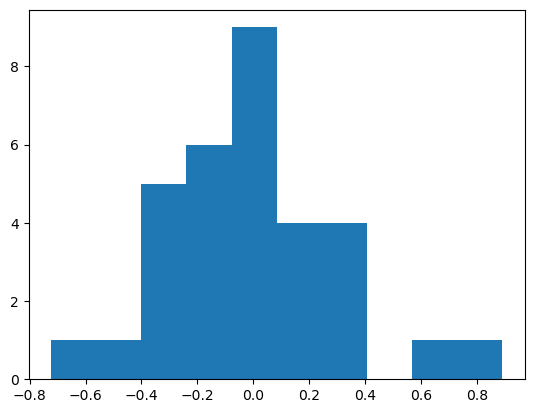

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  -3.805
Date:                Wed, 01 Nov 2023   AIC                             13.609
Time:                        23:04:03   BIC                             18.006
Sample:                             0   HQIC                            15.067
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.4230      0.285     -1.486      0.137      -0.981       0.135
ma.L2         -0.4821      0.254     -1.895      0.058      -0.981       0.017
sigma2         0.0706      0.018      3.927      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.203310
33    0.290155
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

first_diff -0.07351657787682475 vuosi
1989         NaN
1990   -0.073517
1991    0.815142
1992    0.832607
1993    0.453966
1994    0.145809
1995   -0.313783
1996   -0.075973
1997   -0.156610
1998   -0.147477
1999   -0.101400
2000   -0.087380
2001   -0.236365
2002    0.117709
2003   -0.104044
2004    0.164804
2005   -0.111657
2006   -0.167166
2007   -0.109794
2008   -0.177692
2009    0.415015
2010    0.163092
2011   -0.149734
2012   -0.040534
2013   -0.027812
2014    0.241343
2015    0.088932
2016   -0.088932
2017    0.011470
2018   -0.058444
2019   -0.281973
2020    0.029935
2021    0.190666
2022   -0.532179
Name: työttömyys_miehet_25_34, dtype: float64
x shape (45, 1)
first_value -3.511030638304851
y shape (46, 1)
y            val
1989 -3.511031
1990 -0.073517
1991  0.815142
1992  0.832607
1993  0.453966
1994  0.145809
1995 -0.313783
1996 -0.075973
1997 -0.156610
1998 -0.147477
1999 -0.101400
2000 -0.087380
2001 -0.236365
2002  0.117709
2003 -0.104044
2004  0.164804
2005 -0.111657
200

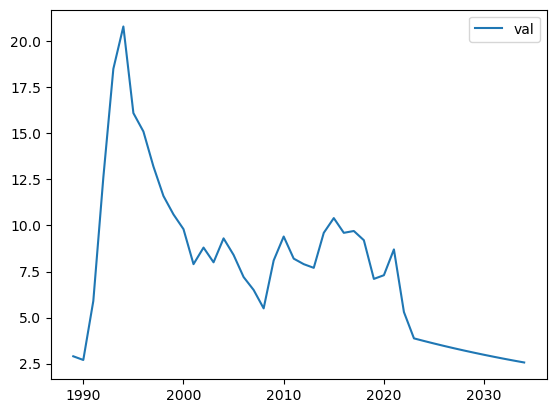

forecasting työttömyys_naiset_25_34
deftrain vuosi
1989     2.7
1990     2.1
1991     2.8
1992     7.7
1993    14.0
1994    16.5
1995    16.9
1996    16.4
1997    15.5
1998    13.0
1999    11.9
2000    12.1
2001    11.6
2002     9.6
2003     9.5
2004     9.1
2005     8.8
2006     8.2
2007     7.4
2008     6.2
2009     8.1
2010     8.5
2011     7.4
2012     7.5
2013     7.9
2014     7.8
2015    10.5
2016     9.7
2017     7.5
2018     9.7
2019     7.3
2020     7.1
2021     7.8
2022     6.8
Name: työttömyys_naiset_25_34, dtype: float64
vuosi
1989         NaN
1990   -0.000288
1991    0.000343
1992    0.005180
1993    0.014027
1994    0.007995
1995    0.001414
1996   -0.001761
1997   -0.003023
1998   -0.007426
1999   -0.002826
2000    0.000494
2001   -0.001219
2002   -0.004338
2003   -0.000195
2004   -0.000757
2005   -0.000546
2006   -0.001035
2007   -0.001263
2008   -0.001647
2009    0.002745
2010    0.000673
2011   -0.001771
2012    0.000151
2013    0.000623
2014   -0.000159
2015    0.005

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


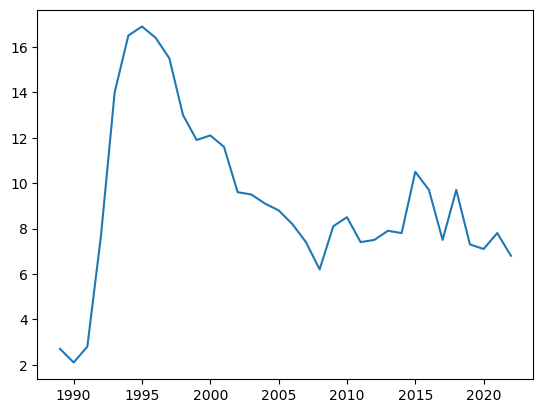

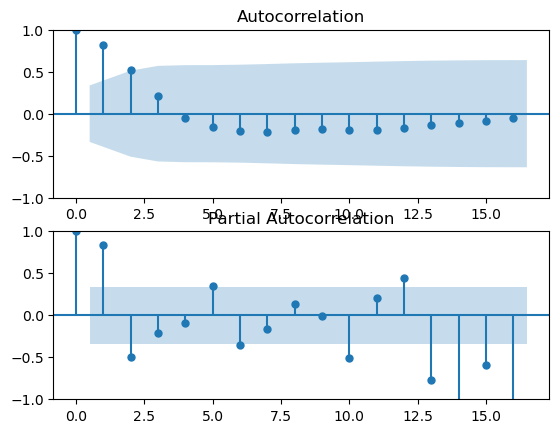

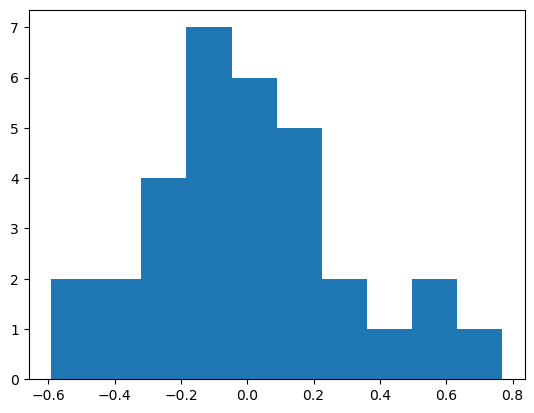

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(1, 0, 2)   Log Likelihood                  -1.719
Date:                Wed, 01 Nov 2023   AIC                             11.439
Time:                        23:04:04   BIC                             17.302
Sample:                             0   HQIC                            13.382
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2429      0.309     -0.786      0.432      -0.849       0.363
ma.L1         -0.1854      0.307     -0.604      0.546      -0.787       0.416
ma.L2         -0.6845      0.304     -2.252      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    1.308453e-01
33    1.482050e-02
34   -3.599682e-03
35    8.743103e-04
36   -2.123572e-04
37    5.157847e-05
38   -1.252766e-05
39    3.042785e-06
40   -7.390481e-07
41    1.795040e-07
42   -4.359890e-08
43    1.058954e-08
dtype: float64

first_diff -0.2574619886254115 vuosi
1989         NaN
1990   -0.257462
1991    0.294858
1992    1.063327
1993    0.668534
1994    0.193804
1995    0.028755
1996   -0.036031
1997   -0.067149
1998   -0.205047
1999   -0.100975
2000    0.018940
2001   -0.047873
2002   -0.211614
2003   -0.011577
2004   -0.047428
2005   -0.036818
2006   -0.077175
2007   -0.111331
2008   -0.189806
2009    0.287779
2010    0.052564
2011   -0.150536
2012    0.014504
2013    0.056293
2014   -0.013824
2015    0.326973
2016   -0.088148
2017   -0.281294
2018    0.281294
2019   -0.310483
2020   -0.029935
2021    0.101592
2022   -0.147989
Name: työttömyys_naiset_25_34, dtype: float64
x shape (45, 1)
first_value -3.584547216181676
y shape (46, 1)
y            val
1989 -3.584547
1990 -0.257462
1991  0.294858
1992  1.063327
1993  0.668534
1994  0.193804
1995  0.028755
1996 -0.036031
1997 -0.067149
1998 -0.205047
1999 -0.100975
2000  0.018940
2001 -0.047873
2002 -0.211614
2003 -0.011577
2004 -0.047428
2005 -0.036818
2006

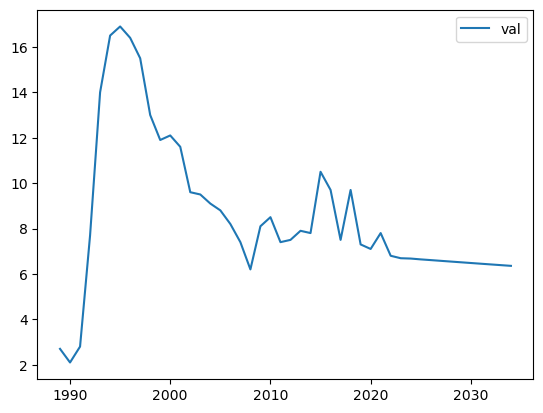

forecasting työllisyysaste_miehet_25_34
deftrain vuosi
1989    90.2
1990    90.7
1991    86.9
1992    78.8
1993    72.5
1994    70.8
1995    74.9
1996    75.6
1997    77.3
1998    78.6
1999    80.5
2000    82.3
2001    83.6
2002    82.6
2003    83.2
2004    82.7
2005    82.1
2006    83.3
2007    83.4
2008    86.3
2009    82.6
2010    81.1
2011    82.8
2012    81.6
2013    81.3
2014    78.8
2015    78.7
2016    79.3
2017    78.1
2018    80.2
2019    81.5
2020    81.1
2021    78.7
2022    79.7
Name: työllisyysaste_miehet_25_34, dtype: float64
vuosi
1989         NaN
1990    0.273614
1991   -1.554219
1992   -1.446184
1993   -0.530096
1994   -0.102968
1995    0.272841
1996    0.056009
1997    0.150733
1998    0.131753
1999    0.224707
2000    0.258021
2001    0.221980
2002   -0.173726
2003    0.101730
2004   -0.085270
2005   -0.095976
2006    0.198918
2007    0.017887
2008    0.633343
2009   -0.770634
2010   -0.225793
2011    0.258907
2012   -0.187778
2013   -0.043139
2014   -0.311450
2015 

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


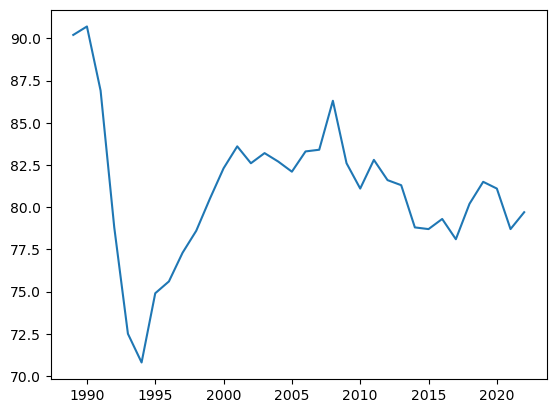

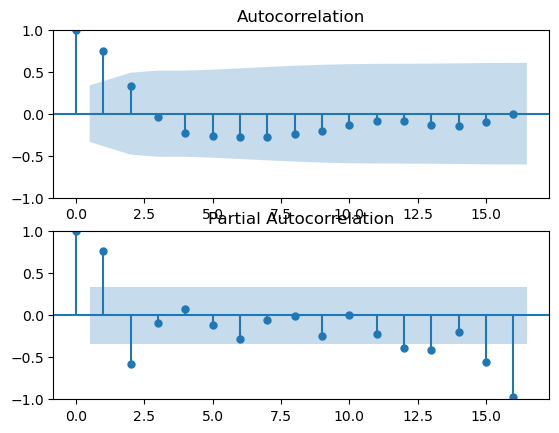

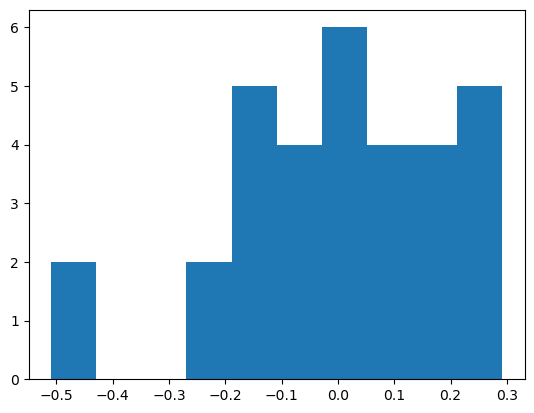

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  10.118
Date:                Wed, 01 Nov 2023   AIC                            -16.236
Time:                        23:04:06   BIC                            -13.304
Sample:                             0   HQIC                           -15.264
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6603      0.192     -3.443      0.001      -1.036      -0.284
sigma2         0.0306      0.007      4.587      0.000       0.018       0.044
Ljung-Box (L1) (Q):                   2.30   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32   -0.065769
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

first_diff 0.05789591556982865 vuosi
1989         NaN
1990    0.057896
1991   -0.385397
1992   -0.579234
1993   -0.343511
1994   -0.083710
1995    0.207596
1996    0.037587
1997    0.094456
1998    0.075652
1999    0.116862
2000    0.118964
2001    0.091956
2002   -0.071223
2003    0.042329
2004   -0.035355
2005   -0.041376
2006    0.083903
2007    0.007206
2008    0.226188
2009   -0.282894
2010   -0.101018
2011    0.114998
2012   -0.082040
2013   -0.019856
2014   -0.156711
2015   -0.005976
2016    0.036168
2017   -0.071601
2018    0.127338
2019    0.083991
2020   -0.026311
2021   -0.149585
2022    0.060713
Name: työllisyysaste_miehet_25_34, dtype: float64
x shape (45, 1)
first_value 2.219647041392052
y shape (46, 1)
y            val
1989  2.219647
1990  0.057896
1991 -0.385397
1992 -0.579234
1993 -0.343511
1994 -0.083710
1995  0.207596
1996  0.037587
1997  0.094456
1998  0.075652
1999  0.116862
2000  0.118964
2001  0.091956
2002 -0.071223
2003  0.042329
2004 -0.035355
2005 -0.041376
2

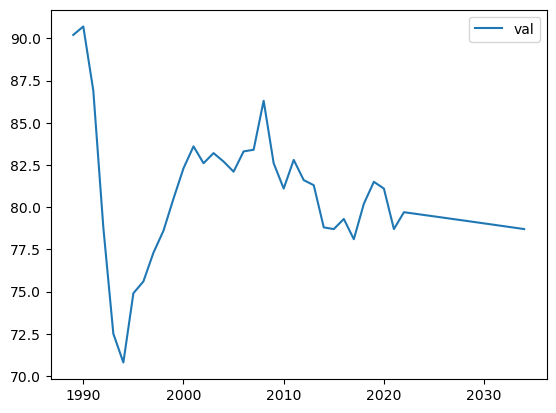

forecasting työllisyysaste_naiset_25_34
deftrain vuosi
1989    81.7
1990    80.6
1991    78.3
1992    72.5
1993    66.5
1994    64.0
1995    62.7
1996    63.5
1997    64.1
1998    66.6
1999    68.3
2000    68.6
2001    68.3
2002    72.8
2003    72.2
2004    70.0
2005    72.9
2006    73.3
2007    73.9
2008    73.9
2009    72.7
2010    71.1
2011    69.8
2012    70.6
2013    68.7
2014    69.7
2015    67.6
2016    67.6
2017    70.1
2018    69.2
2019    71.3
2020    73.0
2021    75.7
2022    79.3
Name: työllisyysaste_naiset_25_34, dtype: float64
vuosi
1989         NaN
1990   -0.153245
1991   -0.269601
1992   -0.476537
1993   -0.315199
1994   -0.099071
1995   -0.045970
1996    0.027877
1997    0.021777
1998    0.099676
1999    0.077250
2000    0.014541
2001   -0.014541
2002    0.253212
2003   -0.038666
2004   -0.128137
2005    0.173419
2006    0.026973
2007    0.042054
2008    0.000000
2009   -0.082209
2010   -0.098691
2011   -0.072237
2012    0.043670
2013   -0.099935
2014    0.050974
2015 

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


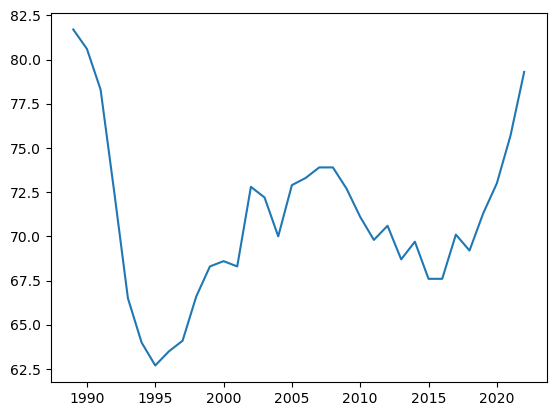

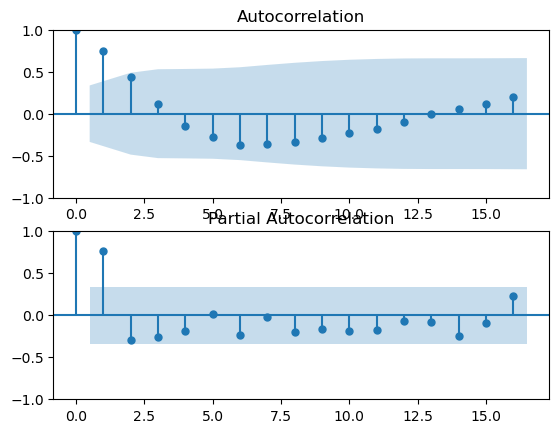

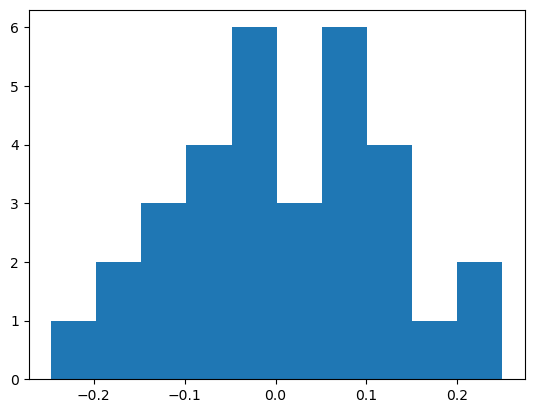

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  26.782
Date:                Wed, 01 Nov 2023   AIC                            -49.563
Time:                        23:04:07   BIC                            -46.632
Sample:                             0   HQIC                           -48.592
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5158      0.168     -3.076      0.002      -0.844      -0.187
sigma2         0.0109      0.004      2.747      0.006       0.003       0.019
Ljung-Box (L1) (Q):                   0.00   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32   -0.053569
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

first_diff -0.07192735857528265 vuosi
1989         NaN
1990   -0.071927
1991   -0.140990
1992   -0.313835
1993   -0.283744
1994   -0.110292
1995   -0.055996
1996    0.034360
1997    0.025979
1998    0.110442
1999    0.077444
2000    0.013892
2001   -0.013892
2002    0.216906
2003   -0.030095
2004   -0.107106
2005    0.142257
2006    0.020342
2007    0.030880
2008    0.000000
2009   -0.061323
2010   -0.079209
2011   -0.062454
2012    0.038243
2013   -0.089904
2014    0.046922
2015   -0.097603
2016    0.000000
2017    0.116615
2018   -0.042578
2019    0.100513
2020    0.084623
2021    0.141679
2022    0.206803
Name: työllisyysaste_naiset_25_34, dtype: float64
x shape (45, 1)
first_value 1.4961529420185824
y shape (46, 1)
y            val
1989  1.496153
1990 -0.071927
1991 -0.140990
1992 -0.313835
1993 -0.283744
1994 -0.110292
1995 -0.055996
1996  0.034360
1997  0.025979
1998  0.110442
1999  0.077444
2000  0.013892
2001 -0.013892
2002  0.216906
2003 -0.030095
2004 -0.107106
2005  0.142257

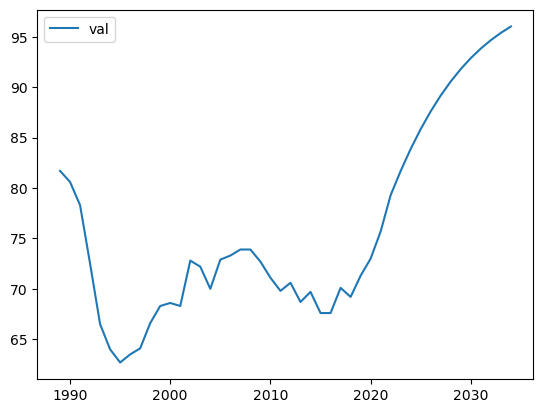

forecasting työttömyys_miehet_35_44
deftrain vuosi
1989     3.1
1990     2.7
1991     4.5
1992    10.6
1993    15.3
1994    16.6
1995    13.4
1996    12.4
1997    10.8
1998    10.2
1999     8.0
2000     7.7
2001     6.8
2002     7.1
2003     7.6
2004     7.2
2005     7.3
2006     5.3
2007     4.6
2008     4.2
2009     5.1
2010     7.1
2011     7.5
2012     5.9
2013     5.9
2014     6.4
2015     7.6
2016     6.6
2017     7.5
2018     5.5
2019     5.0
2020     4.2
2021     6.3
2022     6.0
Name: työttömyys_miehet_35_44, dtype: float64
vuosi
1989         NaN
1990   -0.000232
1991    0.001300
1992    0.009335
1993    0.012606
1994    0.004367
1995   -0.010053
1996   -0.002668
1997   -0.003814
1998   -0.001288
1999   -0.004072
2000   -0.000477
2001   -0.001319
2002    0.000421
2003    0.000743
2004   -0.000599
2005    0.000147
2006   -0.002541
2007   -0.000696
2008   -0.000353
2009    0.000841
2010    0.002459
2011    0.000590
2012   -0.002164
2013    0.000000
2014    0.000620
2015    0.001

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


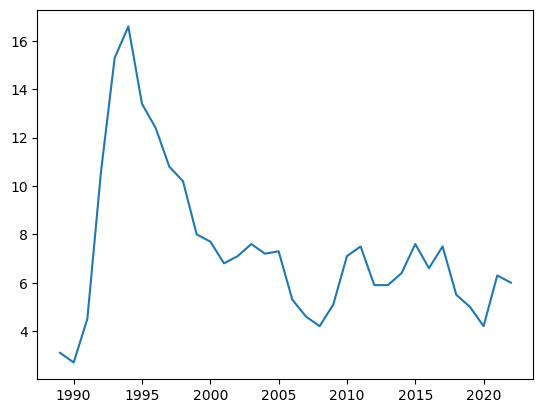

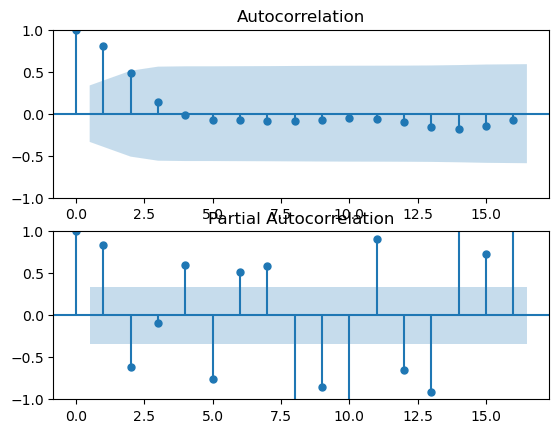

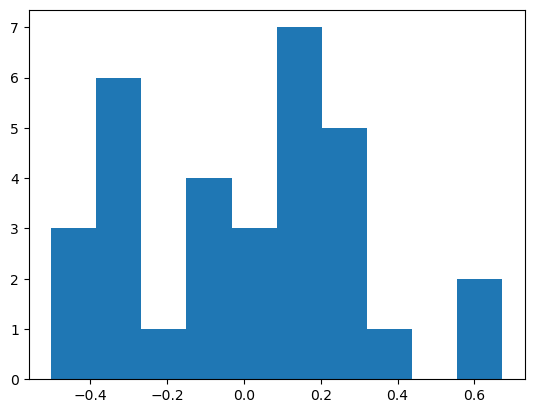

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(3, 0, 0)   Log Likelihood                   1.100
Date:                Wed, 01 Nov 2023   AIC                              5.800
Time:                        23:04:08   BIC                             11.663
Sample:                             0   HQIC                             7.744
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1686      0.138     -1.223      0.221      -0.439       0.101
ar.L2         -0.1424      0.154     -0.923      0.356      -0.445       0.160
ar.L3         -0.7463      0.136     -5.479      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.055218
33   -0.396510
34    0.416912
35   -0.055009
36    0.245804
37   -0.344741
38    0.064154
39   -0.145154
40    0.272611
41   -0.073156
42    0.081830
43   -0.206823
dtype: float64

first_diff -0.1422698087760561 vuosi
1989         NaN
1990   -0.142270
1991    0.529498
1992    0.922782
1993    0.421004
1994    0.097017
1995   -0.251799
1996   -0.089039
1997   -0.156250
1998   -0.063862
1999   -0.267150
2000   -0.041477
2001   -0.134001
2002    0.046396
2003    0.073450
2004   -0.058387
2005    0.014871
2006   -0.341513
2007   -0.149015
2008   -0.095156
2009    0.203595
2010    0.352154
2011    0.059123
2012   -0.257100
2013    0.000000
2014    0.086673
2015    0.184754
2016   -0.151843
2017    0.137516
2018   -0.331546
2019   -0.100587
2020   -0.182739
2021    0.427630
2022   -0.051987
Name: työttömyys_miehet_35_44, dtype: float64
x shape (45, 1)
first_value -3.4422774074056197
y shape (46, 1)
y            val
1989 -3.442277
1990 -0.142270
1991  0.529498
1992  0.922782
1993  0.421004
1994  0.097017
1995 -0.251799
1996 -0.089039
1997 -0.156250
1998 -0.063862
1999 -0.267150
2000 -0.041477
2001 -0.134001
2002  0.046396
2003  0.073450
2004 -0.058387
2005  0.014871
200

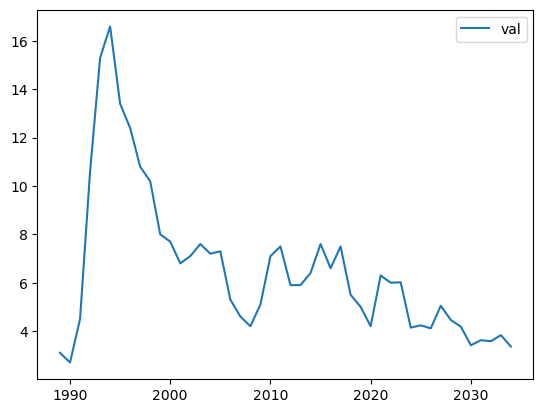

forecasting työttömyys_naiset_35_44
deftrain vuosi
1989     1.9
1990     1.5
1991     2.4
1992     6.0
1993    10.2
1994    12.7
1995    12.6
1996    11.1
1997    11.0
1998     8.6
1999     8.7
2000     9.8
2001     8.4
2002     6.8
2003     6.5
2004     7.8
2005     7.1
2006     6.7
2007     6.3
2008     5.8
2009     5.7
2010     5.7
2011     5.9
2012     4.9
2013     6.7
2014     6.3
2015     6.3
2016     7.5
2017     6.2
2018     5.9
2019     4.8
2020     3.8
2021     5.4
2022     4.1
Name: työttömyys_naiset_35_44, dtype: float64
vuosi
1989         NaN
1990   -0.000136
1991    0.000351
1992    0.003037
1993    0.006900
1994    0.005880
1995   -0.000261
1996   -0.003657
1997   -0.000226
1998   -0.004797
1999    0.000176
2000    0.002070
2001   -0.002591
2002   -0.002461
2003   -0.000403
2004    0.001878
2005   -0.001055
2006   -0.000557
2007   -0.000524
2008   -0.000609
2009   -0.000116
2010    0.000000
2011    0.000234
2012   -0.001086
2013    0.002102
2014   -0.000524
2015    0.000

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


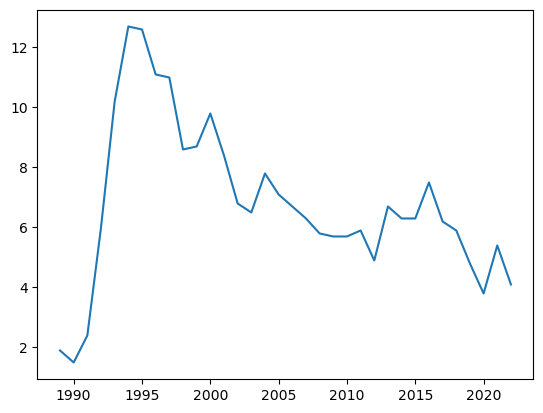

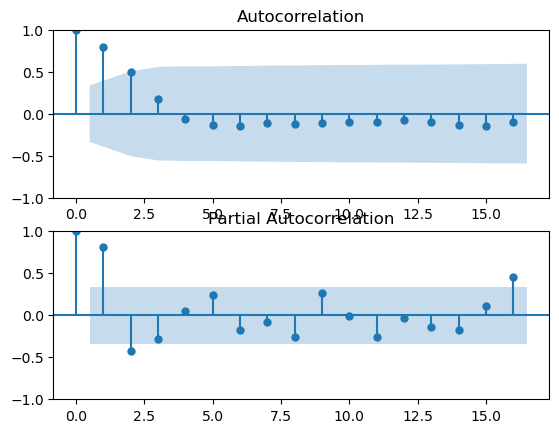

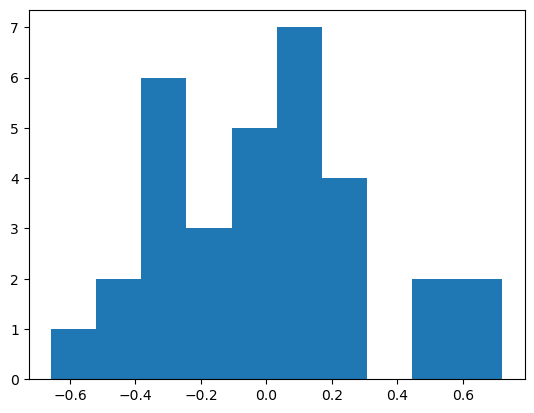

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(1, 0, 1)   Log Likelihood                  -3.418
Date:                Wed, 01 Nov 2023   AIC                             12.835
Time:                        23:04:09   BIC                             17.233
Sample:                             0   HQIC                            14.293
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3648      0.201      1.811      0.070      -0.030       0.760
ma.L1         -0.9622      0.241     -3.999      0.000      -1.434      -0.491
sigma2         0.0685      0.023      2.924      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.182306
33    0.066500
34    0.024257
35    0.008848
36    0.003228
37    0.001177
38    0.000429
39    0.000157
40    0.000057
41    0.000021
42    0.000008
43    0.000003
dtype: float64

first_diff -0.24045795967095573 vuosi
1989         NaN
1990   -0.240458
1991    0.479183
1992    0.953873
1993    0.576338
1994    0.247449
1995   -0.009050
1996   -0.143769
1997   -0.010174
1998   -0.272742
1999    0.012656
2000    0.131181
2001   -0.169553
2002   -0.228626
2003   -0.048334
2004    0.196323
2005   -0.101592
2006   -0.062284
2007   -0.065836
2008   -0.088014
2009   -0.018453
2010    0.000000
2011    0.036609
2012   -0.196288
2013    0.331981
2014   -0.065836
2015    0.000000
2016    0.187243
2017   -0.204310
2018   -0.052790
2019   -0.217958
2020   -0.244064
2021    0.368170
2022   -0.289060
Name: työttömyys_naiset_35_44, dtype: float64
x shape (45, 1)
first_value -3.9441334803989228
y shape (46, 1)
y            val
1989 -3.944133
1990 -0.240458
1991  0.479183
1992  0.953873
1993  0.576338
1994  0.247449
1995 -0.009050
1996 -0.143769
1997 -0.010174
1998 -0.272742
1999  0.012656
2000  0.131181
2001 -0.169553
2002 -0.228626
2003 -0.048334
2004  0.196323
2005 -0.101592
20

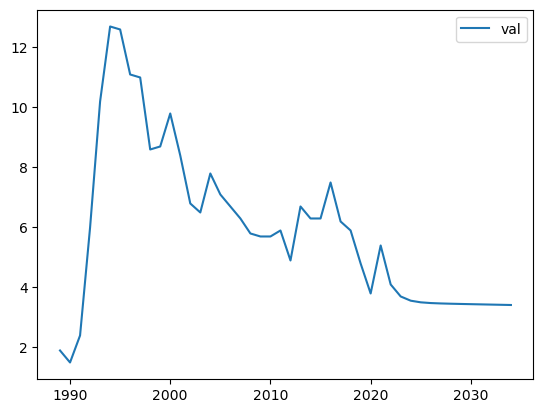

forecasting työllisyysaste_miehet_35_44
deftrain vuosi
1989    92.0
1990    92.1
1991    89.9
1992    83.6
1993    78.6
1994    77.0
1995    80.1
1996    80.4
1997    81.3
1998    83.0
1999    85.6
2000    84.9
2001    86.6
2002    85.5
2003    84.1
2004    85.6
2005    85.7
2006    87.1
2007    87.9
2008    88.8
2009    88.9
2010    86.1
2011    86.2
2012    86.5
2013    86.7
2014    85.2
2015    84.1
2016    85.5
2017    84.5
2018    86.3
2019    87.6
2020    87.9
2021    87.2
2022    88.8
Name: työllisyysaste_miehet_35_44, dtype: float64
vuosi
1989         NaN
1990    0.078978
1991   -1.375604
1992   -1.892680
1993   -0.704708
1994   -0.160005
1995    0.333787
1996    0.037996
1997    0.121401
1998    0.264818
1999    0.527218
2000   -0.159944
2001    0.417621
2002   -0.281478
2003   -0.301572
2004    0.325373
2005    0.024136
2006    0.377451
2007    0.255125
2008    0.330786
2009    0.040079
2010   -0.903400
2011    0.025922
2012    0.080083
2013    0.055408
2014   -0.378851
2015 

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


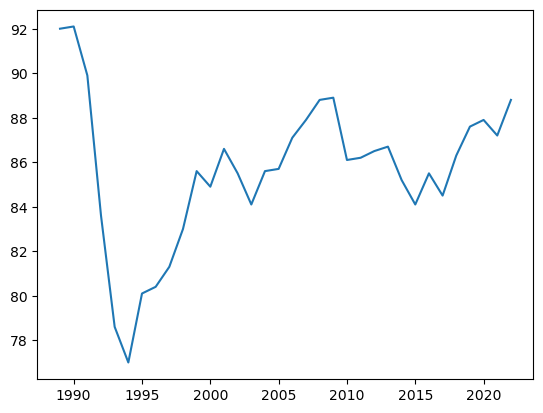

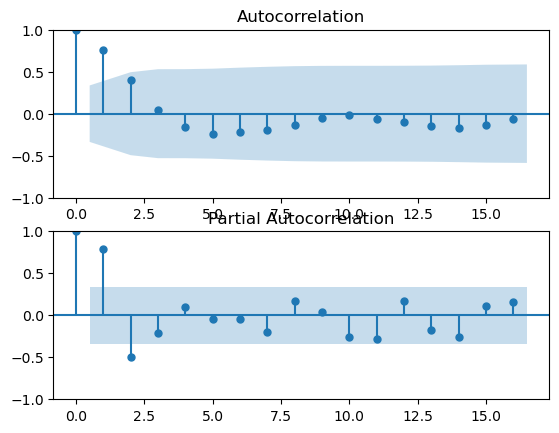

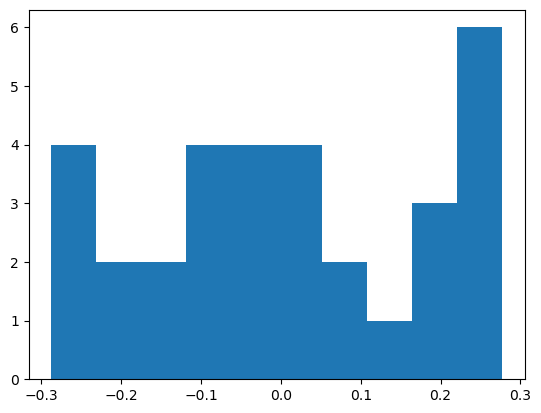

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  14.175
Date:                Wed, 01 Nov 2023   AIC                            -22.350
Time:                        23:04:11   BIC                            -17.953
Sample:                             0   HQIC                           -20.892
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5373      0.275     -1.951      0.051      -1.077       0.002
ma.L2         -0.3457      0.211     -1.638      0.101      -0.759       0.068
sigma2         0.0231      0.008      2.992      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32   -0.069952
33   -0.061606
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

first_diff 0.013665148419079287 vuosi
1989         NaN
1990    0.013665
1991   -0.269850
1992   -0.557400
1993   -0.327781
1994   -0.092670
1995    0.184245
1996    0.018928
1997    0.058138
1998    0.116005
1999    0.196830
2000   -0.055678
2001    0.139266
2002   -0.091677
2003   -0.108680
2004    0.116770
2005    0.008136
2006    0.119236
2007    0.073165
2008    0.087479
2009    0.010094
2010   -0.256946
2011    0.008381
2012    0.025453
2013    0.017235
2014   -0.124316
2015   -0.084687
2016    0.108680
2017   -0.078456
2018    0.144522
2019    0.114651
2020    0.027910
2021   -0.064235
2022    0.151714
Name: työllisyysaste_miehet_35_44, dtype: float64
x shape (45, 1)
first_value 2.442347035369205
y shape (46, 1)
y            val
1989  2.442347
1990  0.013665
1991 -0.269850
1992 -0.557400
1993 -0.327781
1994 -0.092670
1995  0.184245
1996  0.018928
1997  0.058138
1998  0.116005
1999  0.196830
2000 -0.055678
2001  0.139266
2002 -0.091677
2003 -0.108680
2004  0.116770
2005  0.008136


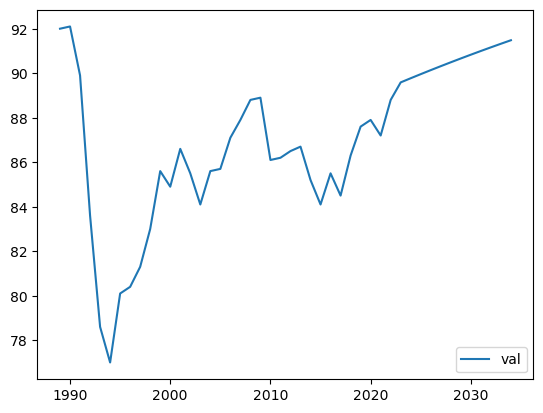

forecasting työllisyysaste_naiset_35_44
deftrain vuosi
1989    88.2
1990    88.3
1991    86.5
1992    81.4
1993    77.8
1994    76.3
1995    77.1
1996    78.4
1997    76.9
1998    79.1
1999    80.4
2000    79.3
2001    80.3
2002    82.2
2003    82.3
2004    79.2
2005    80.4
2006    81.2
2007    81.7
2008    83.1
2009    82.4
2010    82.5
2011    81.3
2012    82.5
2013    79.9
2014    79.5
2015    79.4
2016    79.1
2017    79.4
2018    81.3
2019    82.0
2020    82.1
2021    85.8
2022    85.6
Name: työllisyysaste_naiset_35_44, dtype: float64
vuosi
1989         NaN
1990    0.036075
1991   -0.567238
1992   -1.007994
1993   -0.430339
1994   -0.140155
1995    0.072420
1996    0.129351
1997   -0.147936
1998    0.224370
1999    0.156664
2000   -0.133861
2001    0.121065
2002    0.268026
2003    0.015719
2004   -0.416268
2005    0.145318
2006    0.107330
2007    0.071907
2008    0.224235
2009   -0.116623
2010    0.016084
2011   -0.181533
2012    0.181533
2013   -0.365621
2014   -0.047918
2015 

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


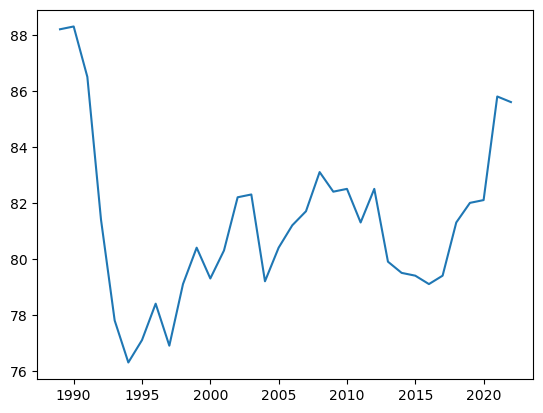

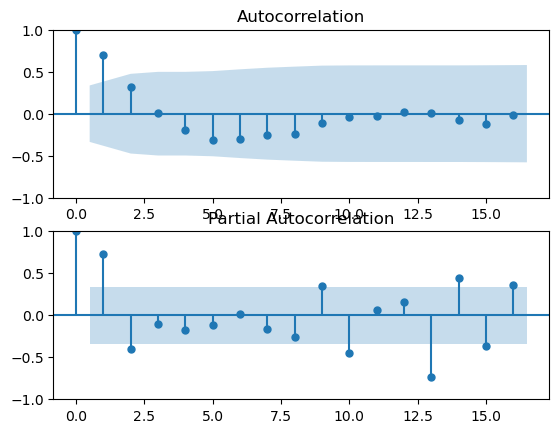

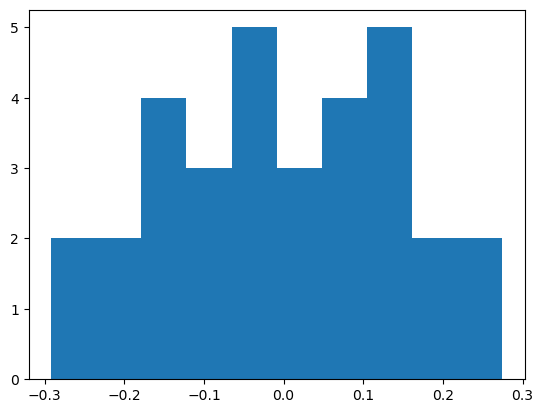

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  21.073
Date:                Wed, 01 Nov 2023   AIC                            -38.147
Time:                        23:04:12   BIC                            -35.215
Sample:                             0   HQIC                           -37.175
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7609      0.160     -4.756      0.000      -1.074      -0.447
sigma2         0.0153      0.004      3.663      0.000       0.007       0.023
Ljung-Box (L1) (Q):                   0.19   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.07477
33    0.00000
34    0.00000
35    0.00000
36    0.00000
37    0.00000
38    0.00000
39    0.00000
40    0.00000
41    0.00000
42    0.00000
43    0.00000
dtype: float64

first_diff 0.00964383426507709 vuosi
1989         NaN
1990    0.009644
1991   -0.163697
1992   -0.381241
1993   -0.222165
1994   -0.084851
1995    0.044768
1996    0.075164
1997   -0.086457
1998    0.128290
1999    0.080521
2000   -0.068380
2001    0.062047
2002    0.124806
2003    0.006850
2004   -0.199783
2005    0.074461
2006    0.051574
2007    0.033095
2008    0.096578
2009   -0.049045
2010    0.006911
2011   -0.080975
2012    0.080975
2013   -0.170541
2014   -0.024724
2015   -0.006125
2016   -0.018244
2017    0.018244
2018    0.120415
2019    0.046725
2020    0.006790
2021    0.275640
2022   -0.016320
Name: työllisyysaste_naiset_35_44, dtype: float64
x shape (45, 1)
first_value 2.0115074315411268
y shape (46, 1)
y            val
1989  2.011507
1990  0.009644
1991 -0.163697
1992 -0.381241
1993 -0.222165
1994 -0.084851
1995  0.044768
1996  0.075164
1997 -0.086457
1998  0.128290
1999  0.080521
2000 -0.068380
2001  0.062047
2002  0.124806
2003  0.006850
2004 -0.199783
2005  0.074461


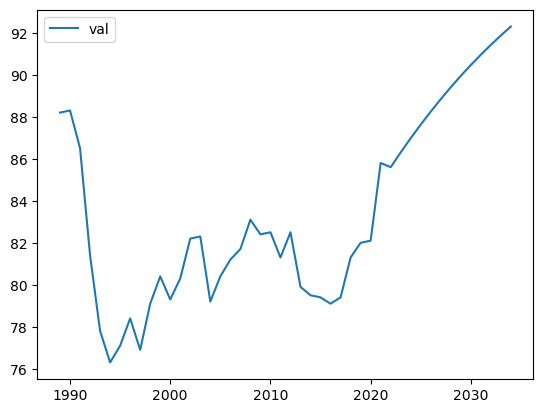

forecasting ei_aviossa_30_34
deftrain vuosi
1989    0.303024
1990    0.303024
1991    0.303865
1992    0.314501
1993    0.287041
1994    0.298537
1995    0.323354
1996    0.320303
1997    0.337329
1998    0.328564
1999    0.345039
2000    0.324019
2001    0.332085
2002    0.309991
2003    0.308051
2004    0.285880
2005    0.284261
2006    0.290220
2007    0.275923
2008    0.282131
2009    0.295356
2010    0.294943
2011    0.298000
2012    0.308050
2013    0.350771
2014    0.371454
2015    0.373328
2016    0.379036
2017    0.396967
2018    0.408396
2019    0.450322
2020    0.463269
2021    0.472930
2022    0.431171
Name: ei_aviossa_30_34, dtype: float64
vuosi
1989             NaN
1990    0.000000e+00
1991    5.104746e-08
1992    6.577396e-07
1993   -1.651913e-06
1994    6.732397e-07
1995    1.543338e-06
1996   -1.963351e-07
1997    1.119649e-06
1998   -5.836296e-07
1999    1.109742e-06
2000   -1.406355e-06
2001    5.292108e-07
2002   -1.418630e-06
2003   -1.199124e-07
2004   -1.316785e-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


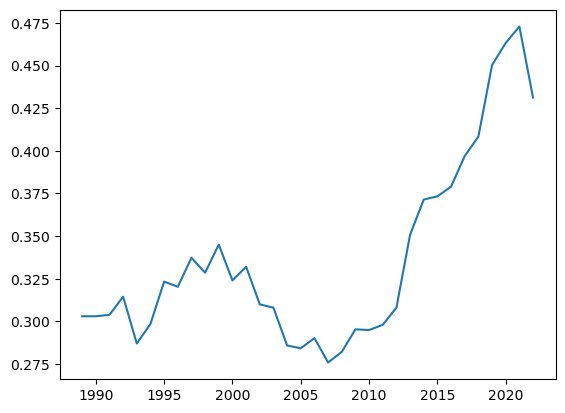

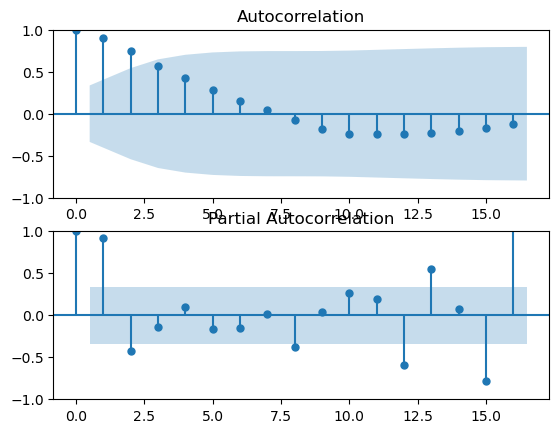

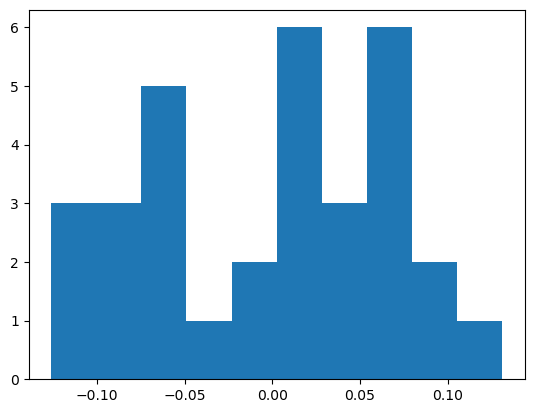

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  47.918
Date:                Wed, 01 Nov 2023   AIC                            -91.835
Time:                        23:04:13   BIC                            -88.904
Sample:                             0   HQIC                           -90.863
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9106      0.111     -8.209      0.000      -1.128      -0.693
sigma2         0.0028      0.001      3.895      0.000       0.001       0.004
Ljung-Box (L1) (Q):                   0.11   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.108868
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

first_diff 0.0 vuosi
1989         NaN
1990    0.000000
1991    0.002780
1992    0.034512
1993   -0.091640
1994    0.039387
1995    0.080101
1996   -0.009509
1997    0.051959
1998   -0.026413
1999    0.049089
2000   -0.063065
2001    0.024669
2002   -0.069069
2003   -0.006298
2004   -0.074913
2005   -0.005699
2006    0.020807
2007   -0.050658
2008    0.022312
2009    0.045940
2010   -0.001402
2011    0.010343
2012    0.033269
2013    0.130301
2014    0.057499
2015    0.005052
2016    0.015230
2017    0.046403
2018    0.028500
2019    0.098147
2020    0.028473
2021    0.020737
2022   -0.092862
Name: ei_aviossa_30_34, dtype: float64
x shape (45, 1)
first_value -5.796079575854009
y shape (46, 1)
y            val
1989 -5.796080
1990  0.000000
1991  0.002780
1992  0.034512
1993 -0.091640
1994  0.039387
1995  0.080101
1996 -0.009509
1997  0.051959
1998 -0.026413
1999  0.049089
2000 -0.063065
2001  0.024669
2002 -0.069069
2003 -0.006298
2004 -0.074913
2005 -0.005699
2006  0.020807
2007 -0.0506

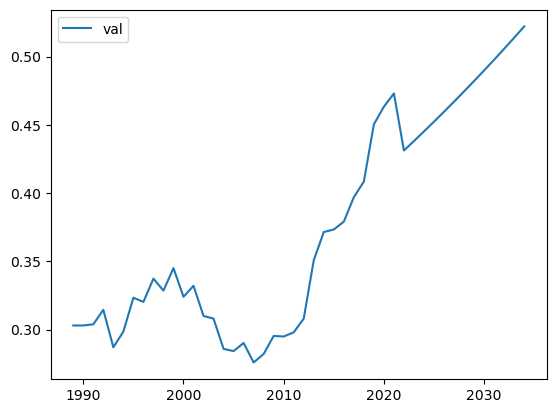

forecasting parittomia_30_34
deftrain vuosi
1989    0.303024
1990    0.303024
1991    0.302451
1992    0.308413
1993    0.300846
1994    0.296937
1995    0.312850
1996    0.324943
1997    0.325128
1998    0.331817
1999    0.342144
2000    0.339401
2001    0.322057
2002    0.324997
2003    0.307584
2004    0.306547
2005    0.288480
2006    0.284361
2007    0.285388
2008    0.283248
2009    0.289464
2010    0.296774
2011    0.291625
2012    0.298496
2013    0.324681
2014    0.359653
2015    0.367130
2016    0.370127
2017    0.381551
2018    0.387052
2019    0.418502
2020    0.451296
2021    0.460406
2022    0.450761
Name: parittomia_30_34, dtype: float64
vuosi
1989             NaN
1990    0.000000e+00
1991   -3.470409e-08
1992    3.642446e-07
1993   -4.610651e-07
1994   -2.336837e-07
1995    9.703717e-07
1996    7.713062e-07
1997    1.207322e-08
1998    4.393933e-07
1999    6.960625e-07
2000   -1.870014e-07
2001   -1.147217e-06
2002    1.902395e-07
2003   -1.101531e-06
2004   -6.372274e-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


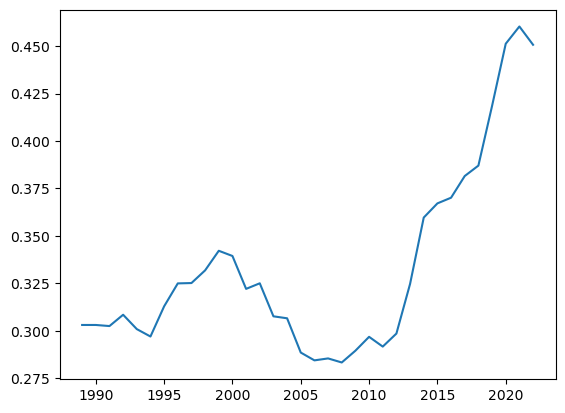

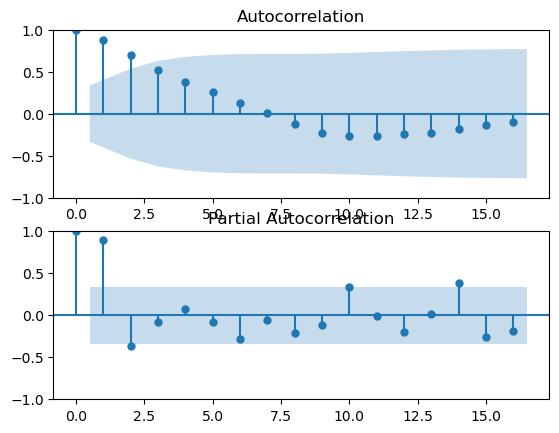

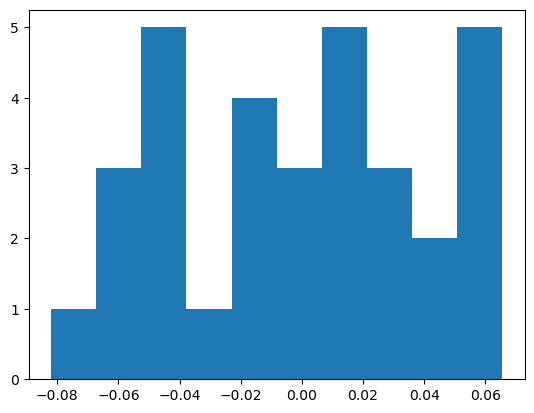

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  60.899
Date:                Wed, 01 Nov 2023   AIC                           -115.798
Time:                        23:04:15   BIC                           -111.400
Sample:                             0   HQIC                          -114.340
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5253      0.182     -2.890      0.004      -0.882      -0.169
ma.L2         -0.2839      0.165     -1.720      0.085      -0.607       0.040
sigma2         0.0013      0.000      3.016      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.031951
33    0.013421
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

first_diff 0.0 vuosi
1989         NaN
1990    0.000000
1991   -0.001899
1992    0.019583
1993   -0.024919
1994   -0.013118
1995    0.052364
1996    0.038048
1997    0.000573
1998    0.020430
1999    0.030754
2000   -0.008079
2001   -0.052626
2002    0.009117
2003   -0.055242
2004   -0.003389
2005   -0.060926
2006   -0.014422
2007    0.003613
2008   -0.007547
2009    0.021769
2010    0.025016
2011   -0.017555
2012    0.023356
2013    0.084351
2014    0.102648
2015    0.020649
2016    0.008161
2017    0.030514
2018    0.014369
2019    0.078438
2020    0.075770
2021    0.020078
2022   -0.021269
Name: parittomia_30_34, dtype: float64
x shape (45, 1)
first_value -5.796079575854009
y shape (46, 1)
y            val
1989 -5.796080
1990  0.000000
1991 -0.001899
1992  0.019583
1993 -0.024919
1994 -0.013118
1995  0.052364
1996  0.038048
1997  0.000573
1998  0.020430
1999  0.030754
2000 -0.008079
2001 -0.052626
2002  0.009117
2003 -0.055242
2004 -0.003389
2005 -0.060926
2006 -0.014422
2007  0.0036

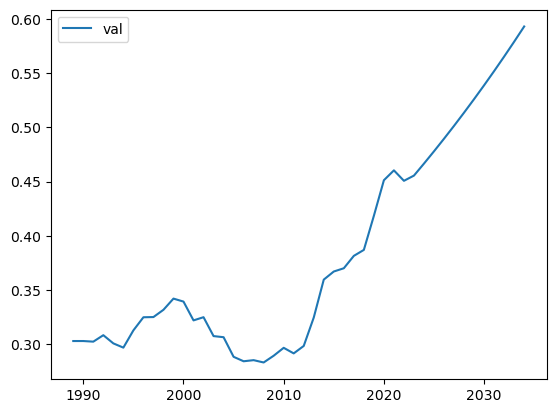

In [7]:

data2=predict_arima(data,2022)

forecasting hedelmallisyysluku


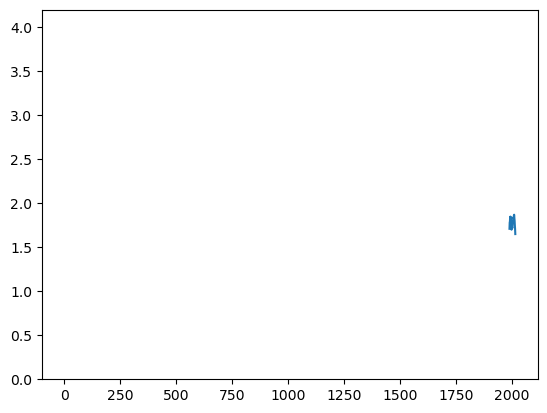

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  64.986
Date:                Wed, 01 Nov 2023   AIC                           -125.973
Time:                        23:04:16   BIC                           -123.535
Sample:                             0   HQIC                          -125.296
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6792      0.162     -4.198      0.000      -0.996      -0.362
sigma2         0.0003      0.000      3.086      0.002       0.000       0.001
Ljung-Box (L1) (Q):                   0.01   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25    0.009879
26   -0.006709
27    0.004557
28   -0.003095
29    0.002102
30   -0.001428
31    0.000970
32   -0.000659
33    0.000447
34   -0.000304
35    0.000206
36   -0.000140
37    0.000095
38   -0.000065
39    0.000044
40   -0.000030
41    0.000020
42   -0.000014
43    0.000009
dtype: float64

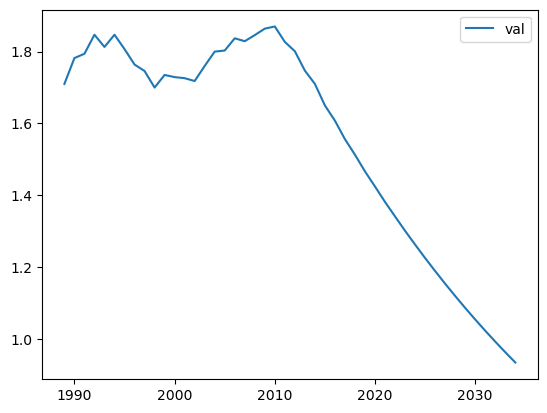

forecasting pienituloisuus_miehet_18_29


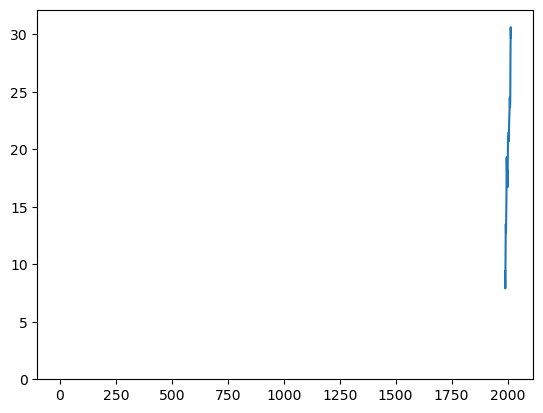

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:               SARIMAX(2, 0, 1)   Log Likelihood                  88.702
Date:                Wed, 01 Nov 2023   AIC                           -169.403
Time:                        23:04:17   BIC                           -164.528
Sample:                             0   HQIC                          -168.051
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1401      0.443      0.316      0.752      -0.728       1.008
ar.L2         -0.4534      0.364     -1.245      0.213      -1.167       0.260
ma.L1         -0.9467      0.783     -1.209      0.2

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25    0.002131
26    0.011546
27    0.000651
28   -0.005144
29   -0.001015
30    0.002190
31    0.000767
32   -0.000885
33   -0.000472
34    0.000335
35    0.000261
36   -0.000116
37   -0.000134
38    0.000034
39    0.000066
40   -0.000006
41   -0.000031
42   -0.000002
43    0.000014
dtype: float64

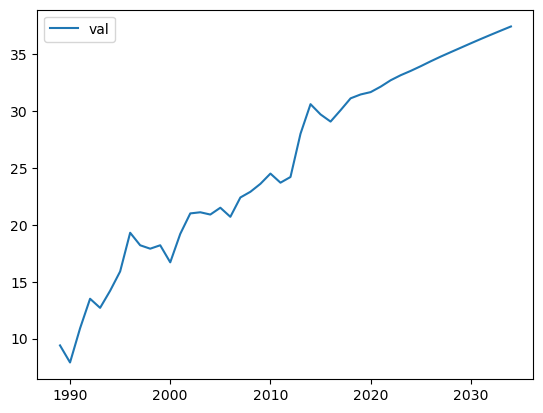

forecasting pienituloisuus_naiset_18_29


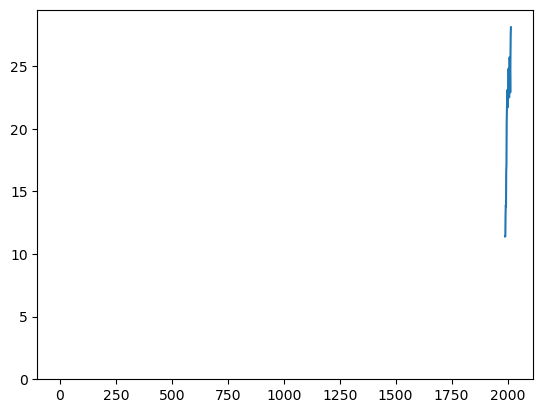

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:               SARIMAX(4, 0, 0)   Log Likelihood                  94.396
Date:                Wed, 01 Nov 2023   AIC                           -178.793
Time:                        23:04:18   BIC                           -172.698
Sample:                             0   HQIC                          -177.102
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7506      0.178     -4.225      0.000      -1.099      -0.402
ar.L2         -0.5939      0.252     -2.355      0.019      -1.088      -0.100
ar.L3         -0.8146      0.170     -4.788      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25   -0.008672
26   -0.000765
27    0.014658
28    0.000817
29   -0.003030
30   -0.009652
31   -0.001200
32    0.008567
33    0.004124
34   -0.000899
35   -0.007969
36   -0.002442
37    0.004603
38    0.005074
39    0.000654
40   -0.005658
41   -0.003282
42    0.001976
43    0.004648
dtype: float64

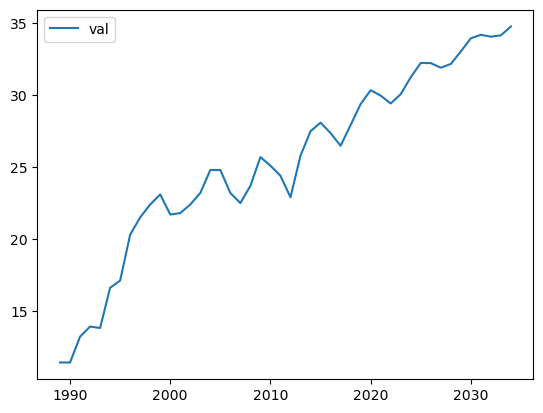

forecasting lapsikuolleisuus


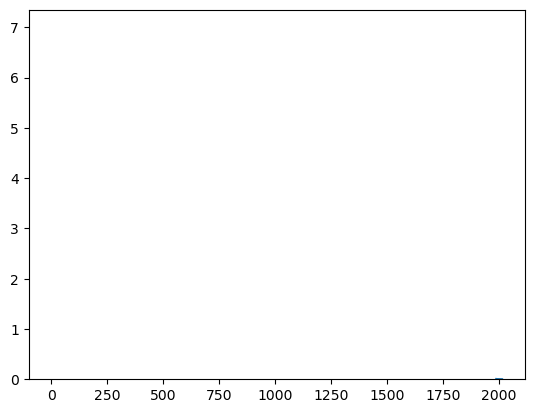

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:               SARIMAX(0, 0, 3)   Log Likelihood                  23.388
Date:                Wed, 01 Nov 2023   AIC                            -38.776
Time:                        23:04:19   BIC                            -33.901
Sample:                             0   HQIC                           -37.424
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.6904      0.250     -6.768      0.000      -2.180      -1.201
ma.L2          0.9424      0.366      2.574      0.010       0.225       1.660
ma.L3         -0.1556      0.207     -0.751      0.4

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25    0.222311
26   -0.072402
27    0.009769
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

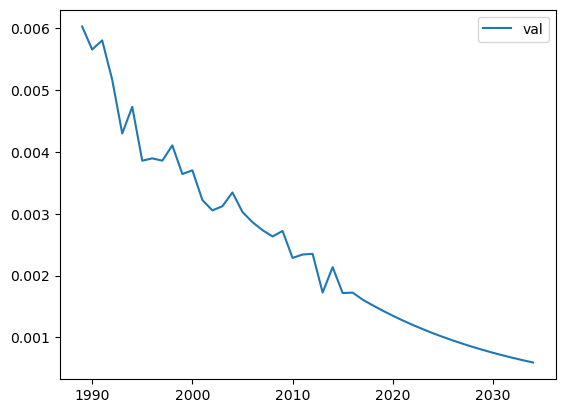

forecasting synnyttajien_keskiika


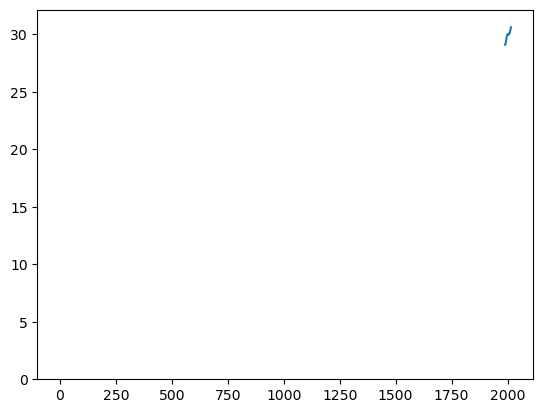

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:               SARIMAX(0, 0, 1)   Log Likelihood                 115.950
Date:                Wed, 01 Nov 2023   AIC                           -227.899
Time:                        23:04:20   BIC                           -225.462
Sample:                             0   HQIC                          -227.223
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.4190      0.182     -2.304      0.021      -0.775      -0.063
sigma2      5.431e-06   2.27e-06      2.393      0.017    9.83e-07    9.88e-06
Ljung-Box (L1) (Q):                   0.14   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25   -0.001357
26    0.000000
27    0.000000
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

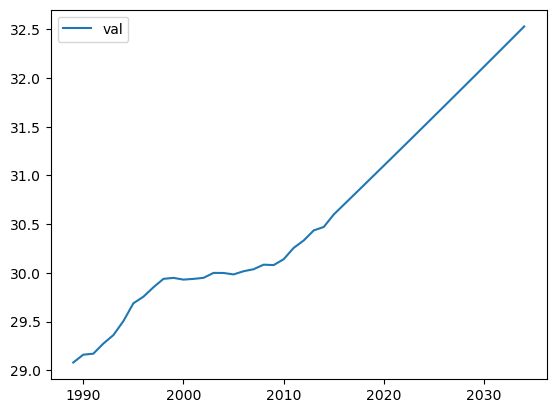

forecasting sisempikaupunki


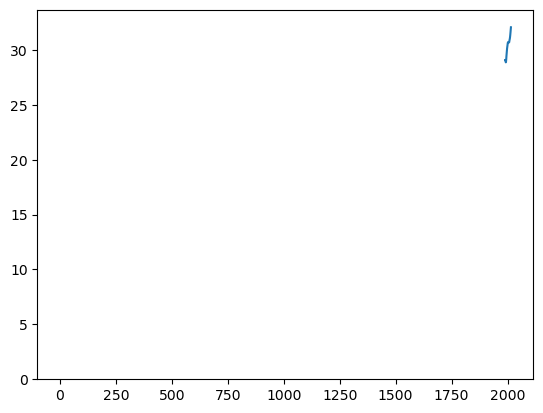

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:               SARIMAX(0, 0, 1)   Log Likelihood                 156.172
Date:                Wed, 01 Nov 2023   AIC                           -308.343
Time:                        23:04:21   BIC                           -305.906
Sample:                             0   HQIC                          -307.667
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.3716      0.241      1.545      0.122      -0.100       0.843
sigma2      2.182e-07    6.8e-08      3.210      0.001     8.5e-08    3.51e-07
Ljung-Box (L1) (Q):                   0.00   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25   -0.000057
26    0.000000
27    0.000000
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

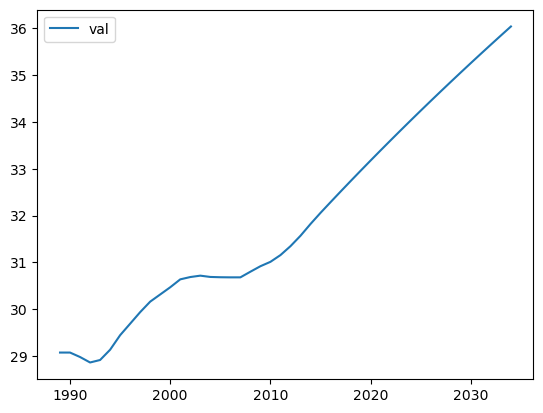

forecasting ulompikaupunki


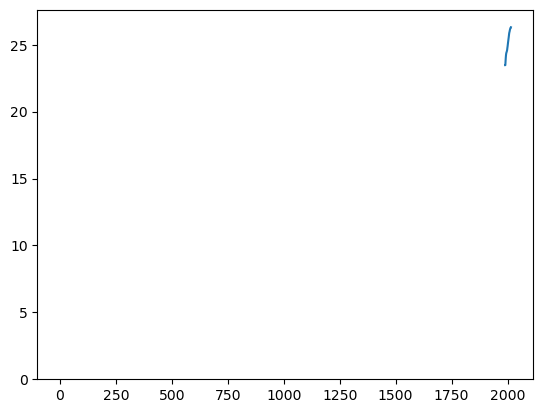

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:                        SARIMAX   Log Likelihood                 161.835
Date:                Wed, 01 Nov 2023   AIC                           -321.670
Time:                        23:04:22   BIC                           -320.452
Sample:                             0   HQIC                          -321.332
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1.396e-07   1.61e-08      8.646      0.000    1.08e-07    1.71e-07
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               129.95
Prob(Q):                              0.97   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25    0.0
26    0.0
27    0.0
28    0.0
29    0.0
30    0.0
31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

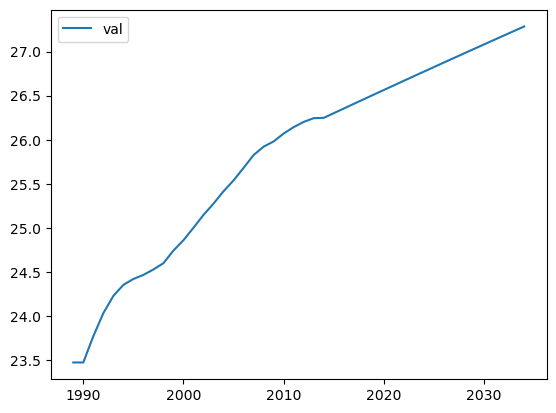

forecasting kehyskaupunki


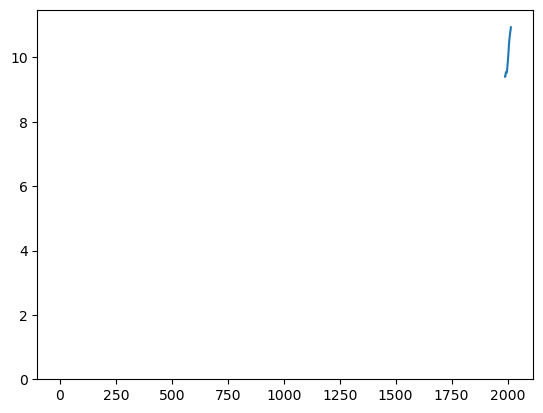

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:                        SARIMAX   Log Likelihood                 212.455
Date:                Wed, 01 Nov 2023   AIC                           -422.910
Time:                        23:04:23   BIC                           -421.692
Sample:                             0   HQIC                          -422.572
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      2.433e-09   9.56e-10      2.545      0.011    5.59e-10    4.31e-09
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):                 0.17
Prob(Q):                              0.86   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25    0.0
26    0.0
27    0.0
28    0.0
29    0.0
30    0.0
31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

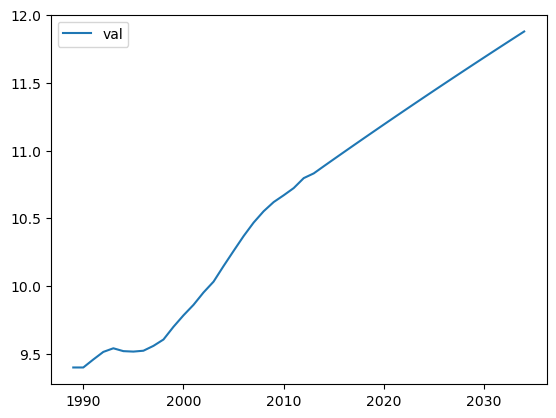

forecasting maaseudulla


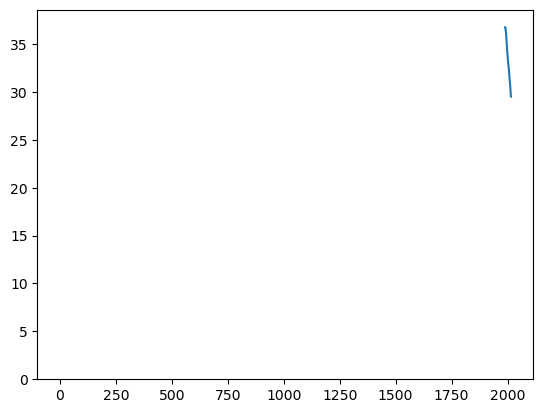

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:                        SARIMAX   Log Likelihood                 147.233
Date:                Wed, 01 Nov 2023   AIC                           -292.466
Time:                        23:04:23   BIC                           -291.247
Sample:                             0   HQIC                          -292.128
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      4.489e-07   9.29e-08      4.832      0.000    2.67e-07    6.31e-07
Ljung-Box (L1) (Q):                   0.60   Jarque-Bera (JB):                 3.93
Prob(Q):                              0.44   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25    0.0
26    0.0
27    0.0
28    0.0
29    0.0
30    0.0
31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

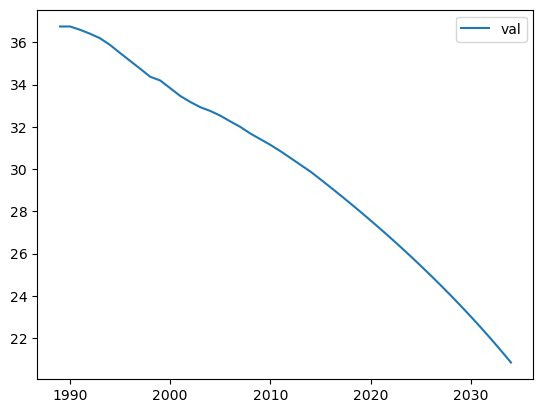

forecasting avioituvuus_naiset_30_34


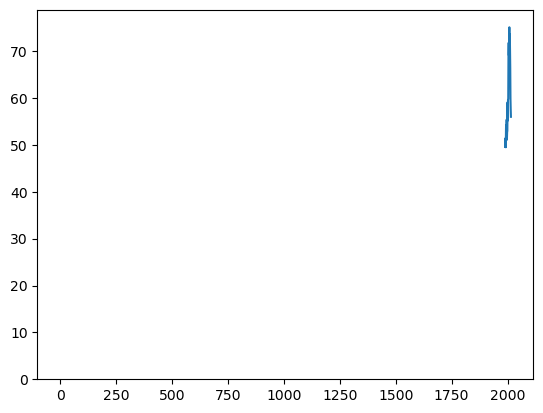

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:               SARIMAX(0, 0, 1)   Log Likelihood                   9.709
Date:                Wed, 01 Nov 2023   AIC                            -15.417
Time:                        23:04:24   BIC                            -12.980
Sample:                             0   HQIC                           -14.741
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7704      0.170     -4.528      0.000      -1.104      -0.437
sigma2         0.0260      0.009      3.003      0.003       0.009       0.043
Ljung-Box (L1) (Q):                   1.26   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25   -0.023948
26    0.000000
27    0.000000
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

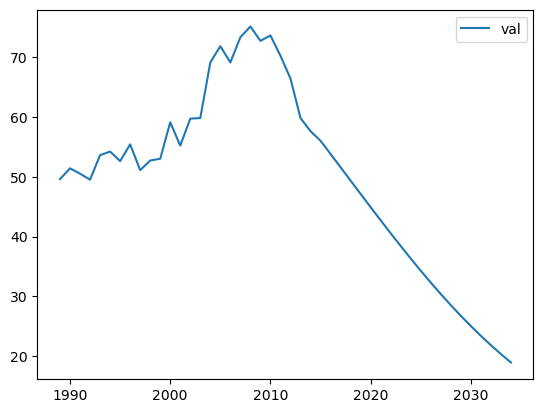

forecasting avioituvuus_naiset_25_29


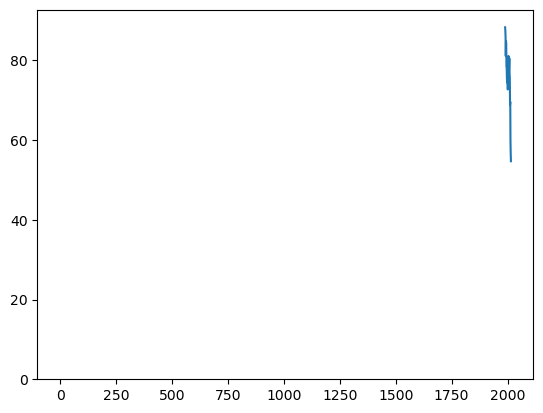

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:               SARIMAX(1, 0, 2)   Log Likelihood                   5.567
Date:                Wed, 01 Nov 2023   AIC                             -3.134
Time:                        23:04:25   BIC                              1.742
Sample:                             0   HQIC                            -1.782
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0331      0.344     -0.096      0.923      -0.707       0.641
ma.L1         -1.3019      0.275     -4.740      0.000      -1.840      -0.764
ma.L2          0.6844      0.262      2.614      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25   -2.505384e-01
26    1.358260e-01
27   -4.502367e-03
28    1.492447e-04
29   -4.947172e-06
30    1.639891e-07
31   -5.435921e-09
32    1.801902e-10
33   -5.972956e-12
34    1.979919e-13
35   -6.563046e-15
36    2.175522e-16
37   -7.211433e-18
38    2.390450e-19
39   -7.923877e-21
40    2.626611e-22
41   -8.706706e-24
42    2.886104e-25
43   -9.566873e-27
dtype: float64

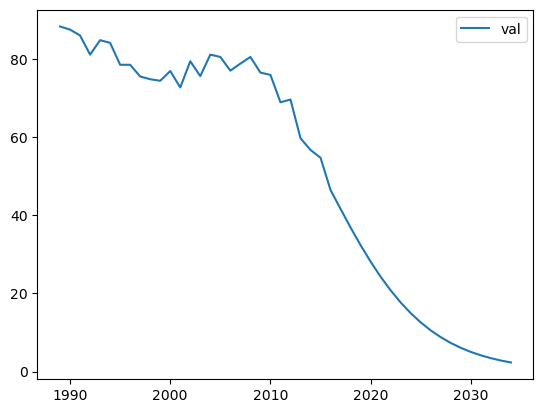

forecasting eronneisuus_25_29


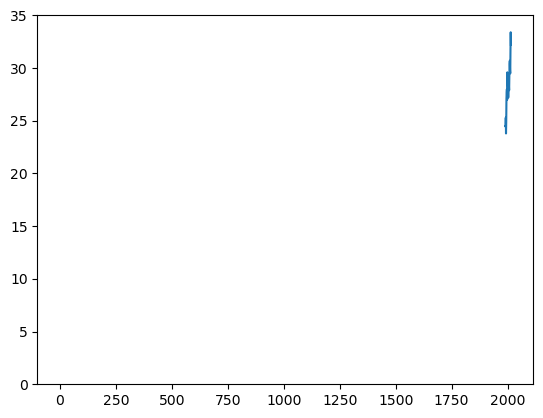

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:               SARIMAX(4, 0, 0)   Log Likelihood                  38.214
Date:                Wed, 01 Nov 2023   AIC                            -66.427
Time:                        23:04:26   BIC                            -60.333
Sample:                             0   HQIC                           -64.737
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9392      0.184     -5.092      0.000      -1.301      -0.578
ar.L2         -1.0129      0.258     -3.920      0.000      -1.519      -0.506
ar.L3         -0.8439      0.243     -3.475      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25    0.036368
26    0.061278
27    0.030285
28   -0.053861
29   -0.050374
30    0.045022
31    0.038731
32   -0.011966
33   -0.040266
34   -0.005735
35    0.036496
36    0.011624
37   -0.022484
38   -0.018528
39    0.011732
40    0.020789
41   -0.004292
42   -0.017467
43   -0.002782
dtype: float64

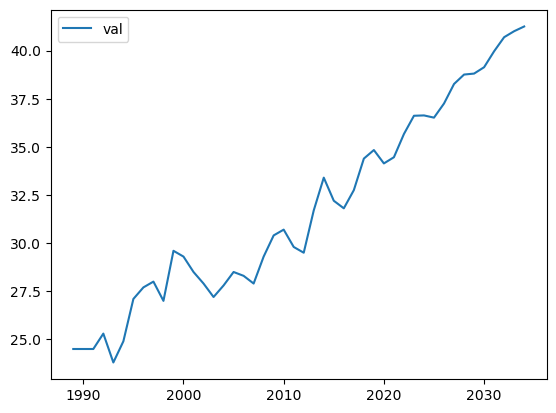

forecasting eronneisuus_30_34


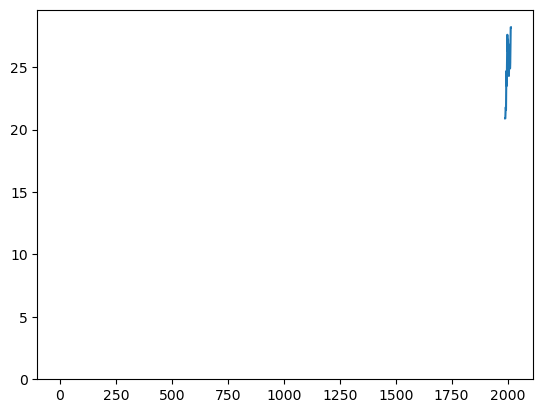

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:               SARIMAX(3, 0, 0)   Log Likelihood                  34.960
Date:                Wed, 01 Nov 2023   AIC                            -61.920
Time:                        23:04:28   BIC                            -57.044
Sample:                             0   HQIC                           -60.567
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7542      0.292     -2.587      0.010      -1.326      -0.183
ar.L2         -0.6584      0.219     -3.007      0.003      -1.088      -0.229
ar.L3         -0.2705      0.201     -1.348      0.1

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25    0.040582
26    0.016871
27   -0.019065
28   -0.007705
29    0.013800
30   -0.000178
31   -0.006867
32    0.001563
33    0.003390
34   -0.001729
35   -0.001351
36    0.001240
37    0.000422
38   -0.000769
39   -0.000033
40    0.000417
41   -0.000085
42   -0.000202
43    0.000095
dtype: float64

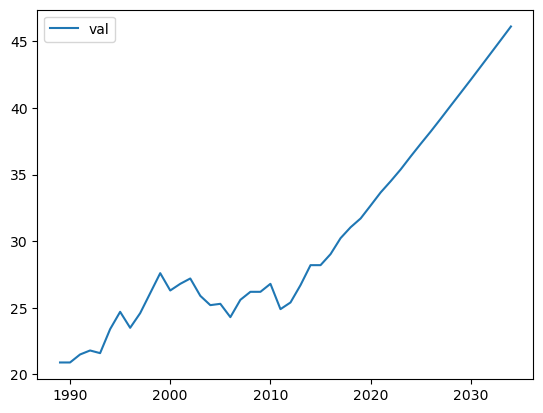

forecasting kolmasaste_miehet_25_29


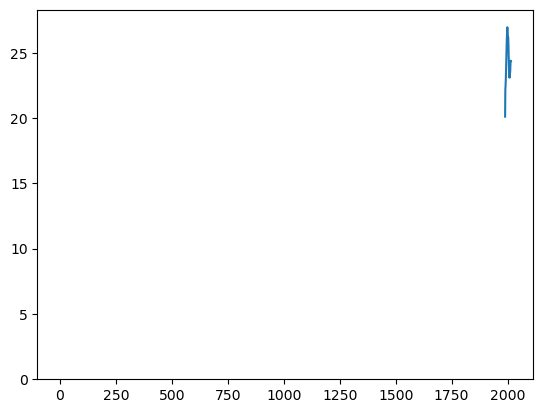

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  52.746
Date:                Wed, 01 Nov 2023   AIC                           -101.491
Time:                        23:04:29   BIC                            -99.053
Sample:                             0   HQIC                          -100.815
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5660      0.112     -5.051      0.000      -0.786      -0.346
sigma2         0.0008      0.000      4.518      0.000       0.000       0.001
Ljung-Box (L1) (Q):                   1.36   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25    7.126796e-03
26   -4.033935e-03
27    2.283303e-03
28   -1.292404e-03
29    7.315312e-04
30   -4.140641e-04
31    2.343701e-04
32   -1.326590e-04
33    7.508816e-05
34   -4.250168e-05
35    2.405696e-05
36   -1.361681e-05
37    7.707438e-06
38   -4.362593e-06
39    2.469331e-06
40   -1.397700e-06
41    7.911314e-07
42   -4.477992e-07
43    2.534650e-07
dtype: float64

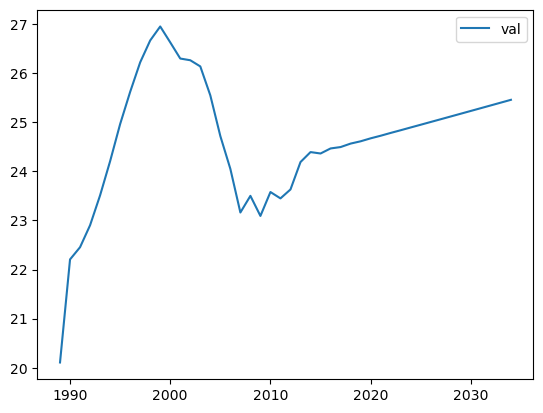

forecasting miehet_perusaste_25_29


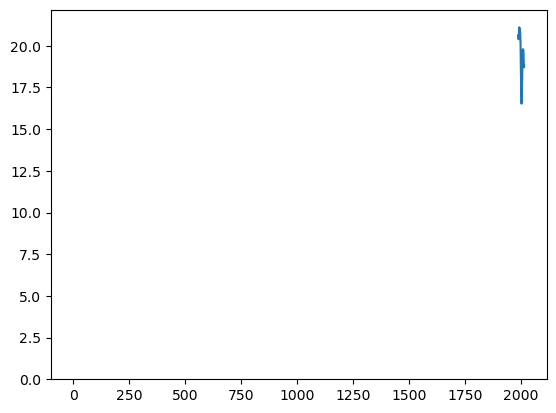

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  61.204
Date:                Wed, 01 Nov 2023   AIC                           -118.409
Time:                        23:04:30   BIC                           -115.971
Sample:                             0   HQIC                          -117.732
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.4025      0.160      2.513      0.012       0.089       0.716
sigma2         0.0004      0.000      2.422      0.015    8.28e-05       0.001
Ljung-Box (L1) (Q):                   0.02   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25    0.009137
26    0.000000
27    0.000000
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

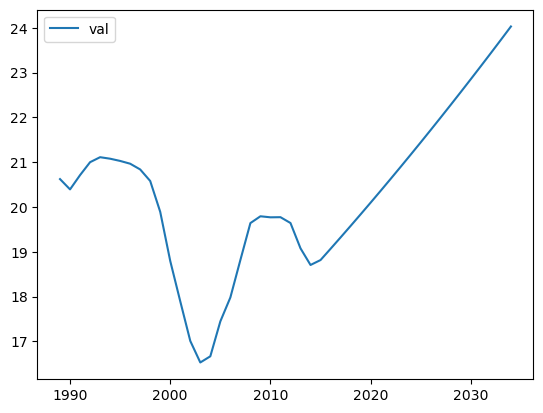

forecasting naiset_perusaste_25_29


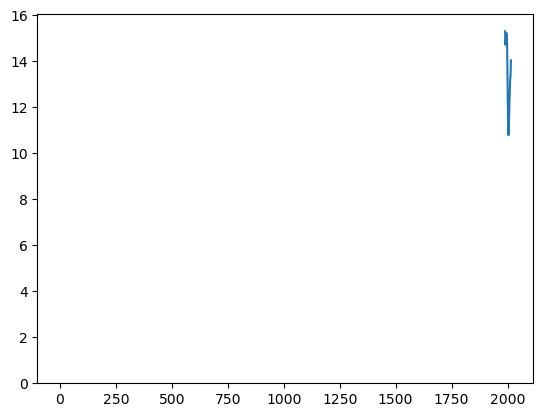

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  60.748
Date:                Wed, 01 Nov 2023   AIC                           -115.496
Time:                        23:04:31   BIC                           -111.839
Sample:                             0   HQIC                          -114.482
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.2174      0.288     -0.756      0.450      -0.781       0.346
ma.L2          0.5981      0.212      2.828      0.005       0.184       1.013
sigma2         0.0004      0.000      3.448      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25    0.002043
26    0.018767
27    0.000000
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

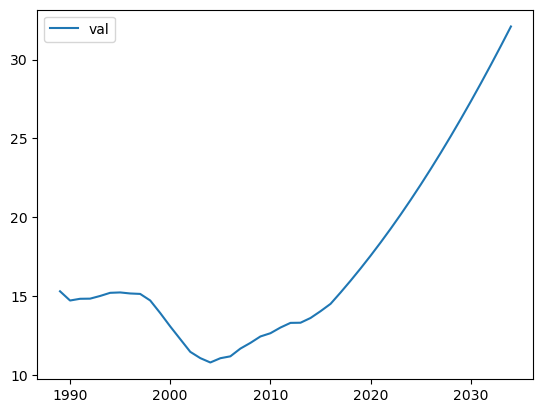

forecasting kolmasaste_naiset_25_29


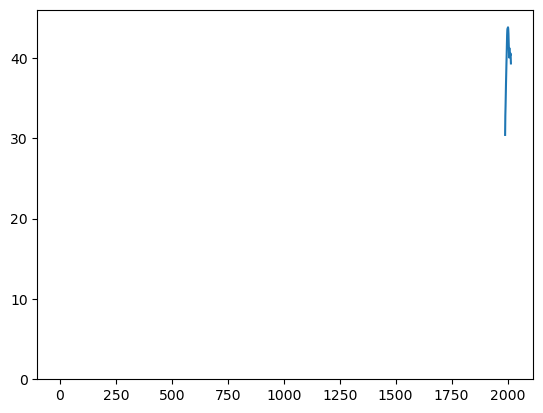

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  55.280
Date:                Wed, 01 Nov 2023   AIC                           -106.559
Time:                        23:04:32   BIC                           -104.122
Sample:                             0   HQIC                          -105.883
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5416      0.180     -3.017      0.003      -0.894      -0.190
sigma2         0.0007      0.000      5.226      0.000       0.000       0.001
Ljung-Box (L1) (Q):                   0.02   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25    7.366386e-03
26   -3.989770e-03
27    2.160933e-03
28   -1.170401e-03
29    6.339110e-04
30   -3.433379e-04
31    1.859582e-04
32   -1.007184e-04
33    5.455093e-05
34   -2.954579e-05
35    1.600255e-05
36   -8.667274e-06
37    4.694356e-06
38   -2.542550e-06
39    1.377092e-06
40   -7.458584e-07
41    4.039707e-07
42   -2.187980e-07
43    1.185050e-07
dtype: float64

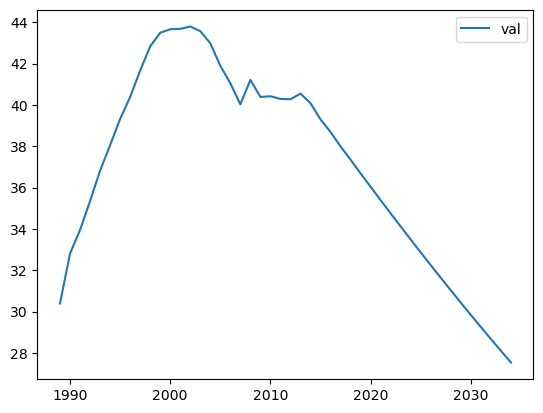

forecasting alypuhelin


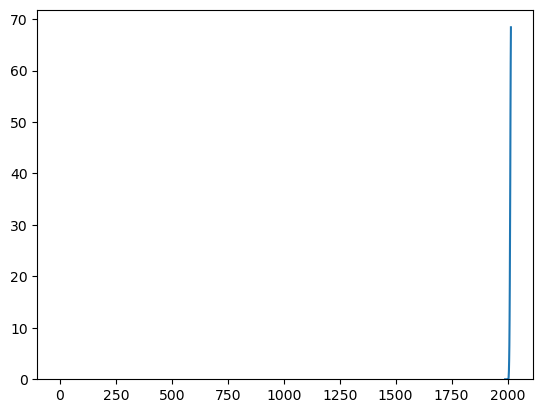

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:               SARIMAX(0, 1, 0)   Log Likelihood                  62.339
Date:                Wed, 01 Nov 2023   AIC                           -120.678
Time:                        23:04:34   BIC                           -118.322
Sample:                             0   HQIC                          -120.053
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0010      0.004      0.241      0.809      -0.007       0.009
sigma2         0.0003   5.04e-05      6.439      0.000       0.000       0.000
Ljung-Box (L1) (Q):                   0.35   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25    0.024535
26    0.025517
27    0.026498
28    0.027479
29    0.028461
30    0.029442
31    0.030424
32    0.031405
33    0.032386
34    0.033368
35    0.034349
36    0.035331
37    0.036312
38    0.037294
39    0.038275
40    0.039256
41    0.040238
42    0.041219
43    0.042201
dtype: float64

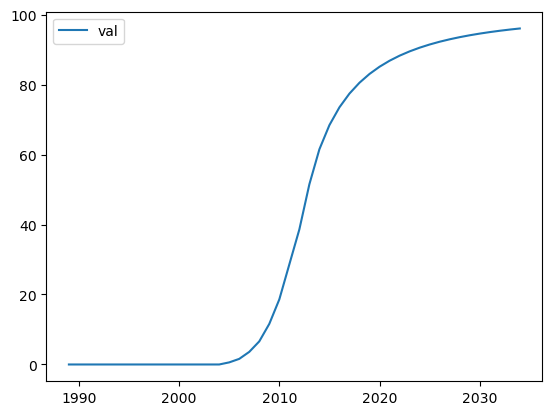

forecasting some_25_34


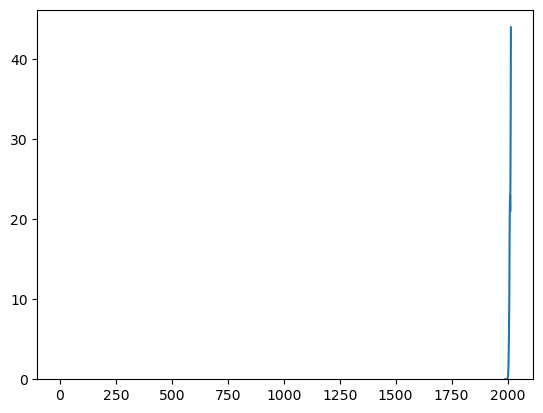

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:               SARIMAX(2, 0, 2)   Log Likelihood                  77.390
Date:                Wed, 01 Nov 2023   AIC                           -144.781
Time:                        23:04:35   BIC                           -138.686
Sample:                             0   HQIC                          -143.090
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3469      0.536     -0.647      0.518      -1.398       0.705
ar.L2          0.5795      0.571      1.015      0.310      -0.539       1.698
ma.L1          1.0793      0.692      1.560      0.1

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:1346: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum
/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25    0.012194
26    0.051323
27   -0.010735
28    0.033466
29   -0.017829
30    0.025579
31   -0.019204
32    0.021485
33   -0.018582
34    0.018896
35   -0.017323
36    0.016959
37   -0.015921
38    0.015351
39   -0.014551
40    0.013943
41   -0.013269
42    0.012683
43   -0.012089
dtype: float64

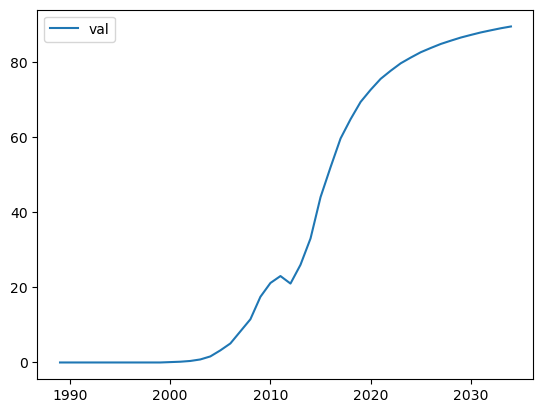

forecasting some_35_44


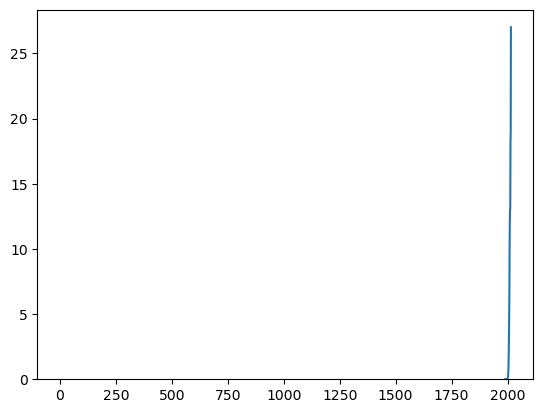

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:               SARIMAX(1, 0, 2)   Log Likelihood                  96.606
Date:                Wed, 01 Nov 2023   AIC                           -185.212
Time:                        23:04:36   BIC                           -180.336
Sample:                             0   HQIC                          -183.859
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8706      0.306     -2.841      0.004      -1.471      -0.270
ma.L1          0.2257      0.732      0.308      0.758      -1.209       1.660
ma.L2          0.8981      0.250      3.590      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:1346: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum
/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25   -0.029858
26    0.033879
27   -0.029495
28    0.025678
29   -0.022355
30    0.019462
31   -0.016944
32    0.014751
33   -0.012842
34    0.011180
35   -0.009733
36    0.008474
37   -0.007377
38    0.006423
39   -0.005592
40    0.004868
41   -0.004238
42    0.003690
43   -0.003212
dtype: float64

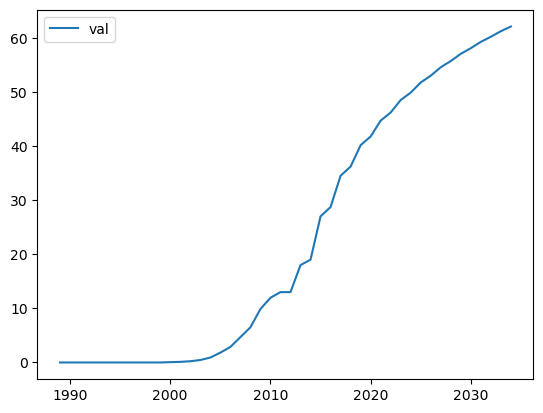

forecasting työttömyys_miehet_25_34


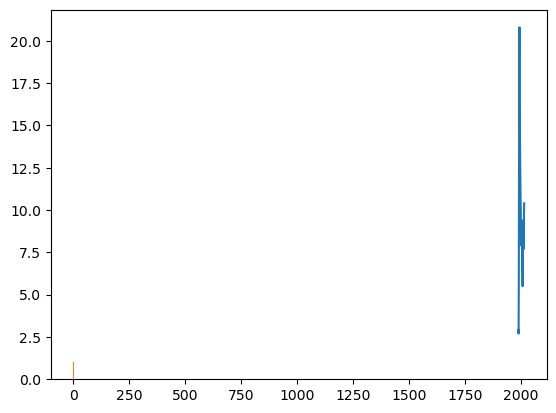

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:               SARIMAX(4, 0, 0)   Log Likelihood                  -1.025
Date:                Wed, 01 Nov 2023   AIC                             12.050
Time:                        23:04:37   BIC                             18.144
Sample:                             0   HQIC                            13.740
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3177      0.338     -0.940      0.347      -0.980       0.345
ar.L2         -0.2264      0.230     -0.983      0.326      -0.678       0.225
ar.L3         -0.4638      0.226     -2.049      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25   -0.076345
26   -0.072821
27   -0.031628
28    0.142777
29    0.036070
30    0.009500
31   -0.060635
32   -0.075338
33    0.014128
34    0.035658
35    0.052573
36    0.008625
37   -0.038677
38   -0.032962
39   -0.012653
40    0.024848
41    0.030771
42    0.007947
43   -0.014308
dtype: float64

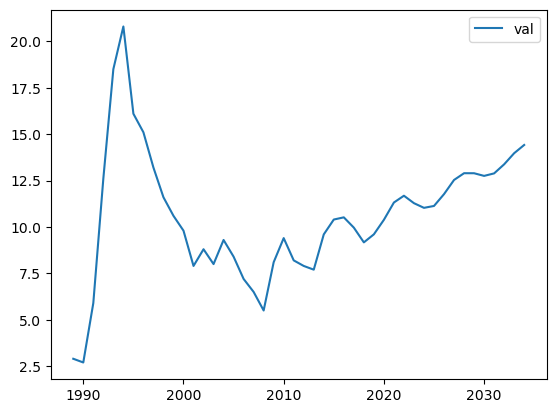

forecasting työttömyys_naiset_25_34


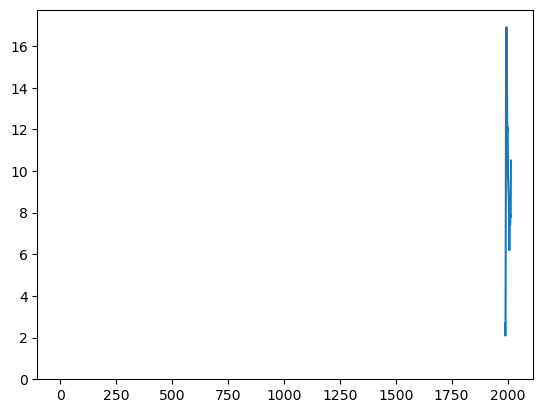

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:               SARIMAX(2, 0, 0)   Log Likelihood                  -0.180
Date:                Wed, 01 Nov 2023   AIC                              6.360
Time:                        23:04:38   BIC                             10.017
Sample:                             0   HQIC                             7.374
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0658      0.210      0.314      0.754      -0.345       0.477
ar.L2         -0.6033      0.171     -3.531      0.000      -0.938      -0.268
sigma2         0.0573      0.019      2.965      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25    0.064723
26   -0.201350
27   -0.052295
28    0.118037
29    0.039316
30   -0.068627
31   -0.028235
32    0.039546
33    0.019636
34   -0.022567
35   -0.013331
36    0.012738
37    0.008881
38   -0.007101
39   -0.005825
40    0.003901
41    0.003771
42   -0.002105
43   -0.002414
dtype: float64

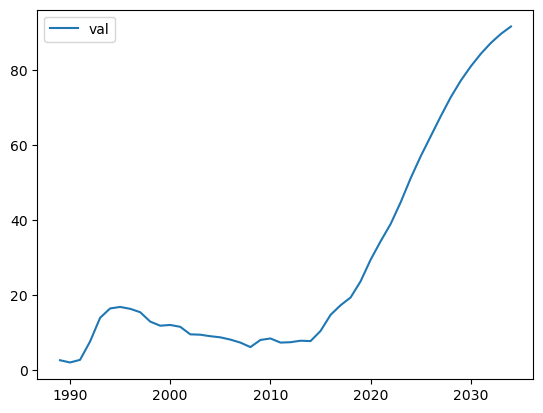

forecasting työllisyysaste_miehet_25_34


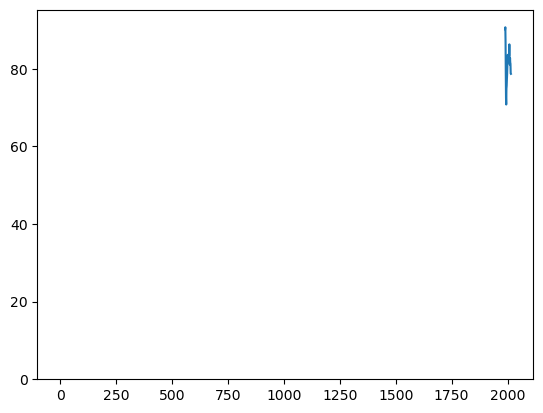

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:               SARIMAX(0, 0, 1)   Log Likelihood                   5.902
Date:                Wed, 01 Nov 2023   AIC                             -7.804
Time:                        23:04:39   BIC                             -5.366
Sample:                             0   HQIC                            -7.127
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6047      0.234     -2.584      0.010      -1.063      -0.146
sigma2         0.0359      0.009      3.932      0.000       0.018       0.054
Ljung-Box (L1) (Q):                   1.79   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25   -0.043535
26    0.000000
27    0.000000
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

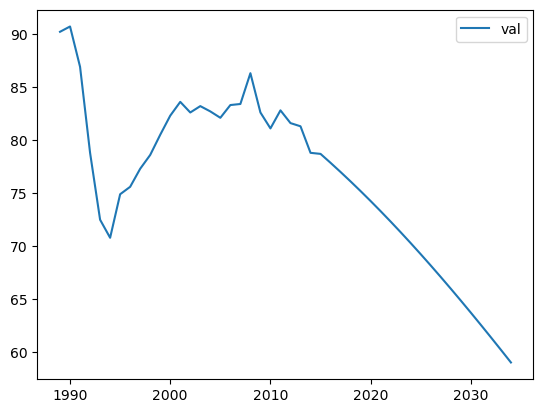

forecasting työllisyysaste_naiset_25_34


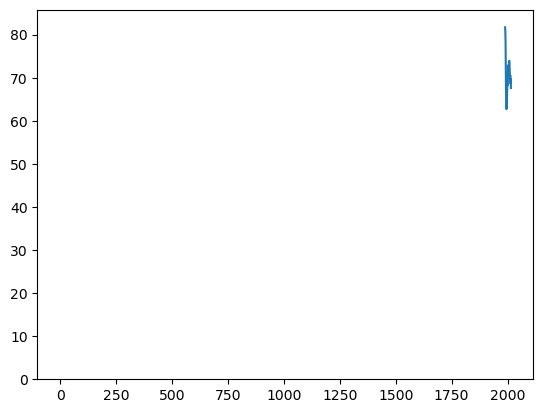

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  20.057
Date:                Wed, 01 Nov 2023   AIC                            -36.114
Time:                        23:04:40   BIC                            -33.676
Sample:                             0   HQIC                           -35.438
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5400      0.185     -2.925      0.003      -0.902      -0.178
sigma2         0.0116      0.005      2.455      0.014       0.002       0.021
Ljung-Box (L1) (Q):                   0.08   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25    0.050504
26    0.000000
27    0.000000
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

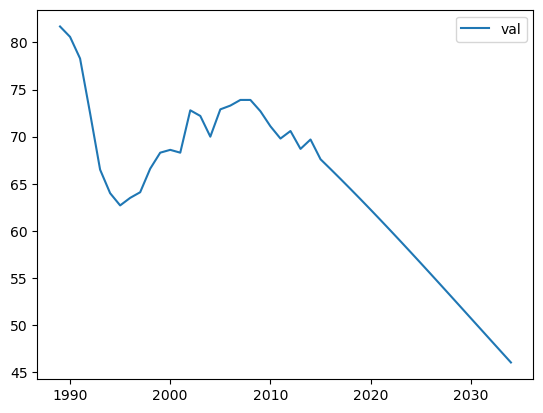

forecasting työttömyys_miehet_35_44


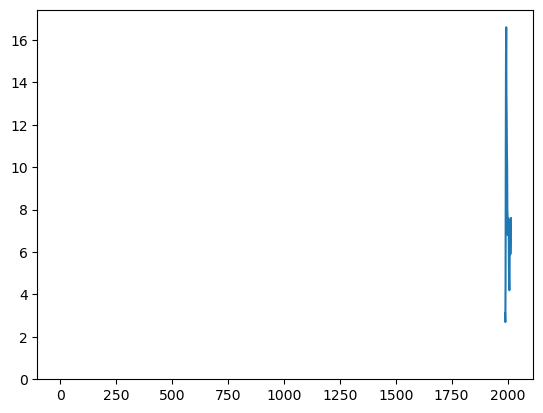

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:               SARIMAX(3, 0, 0)   Log Likelihood                   2.017
Date:                Wed, 01 Nov 2023   AIC                              3.966
Time:                        23:04:41   BIC                              8.841
Sample:                             0   HQIC                             5.318
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0274      0.205      0.134      0.894      -0.375       0.430
ar.L2         -0.2023      0.184     -1.099      0.272      -0.563       0.159
ar.L3         -0.6290      0.186     -3.386      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25   -0.176569
26   -0.079209
27   -0.028152
28    0.126321
29    0.058988
30   -0.006226
31   -0.091565
32   -0.038359
33    0.021387
34    0.065946
35    0.021613
36   -0.026201
37   -0.046574
38   -0.009574
39    0.025640
40    0.031938
41    0.001712
42   -0.022543
43   -0.021055
dtype: float64

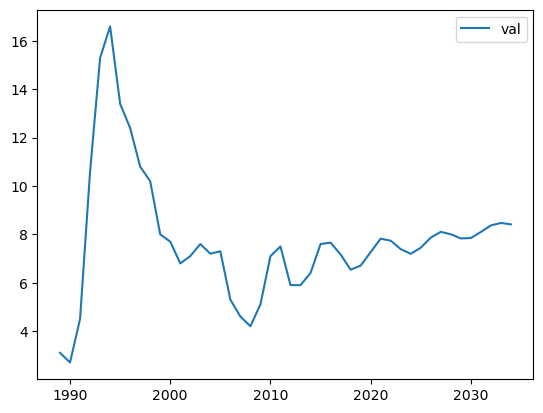

forecasting työttömyys_naiset_35_44


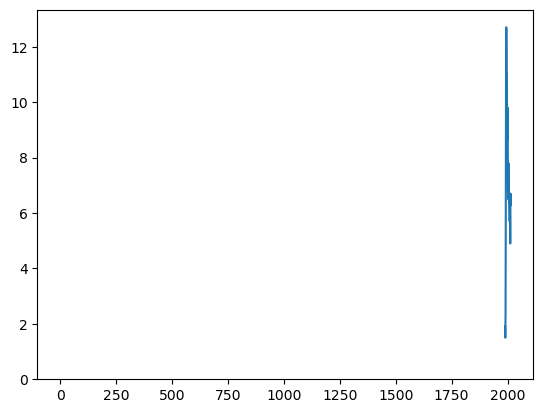

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:                        SARIMAX   Log Likelihood                  -4.147
Date:                Wed, 01 Nov 2023   AIC                             10.295
Time:                        23:04:42   BIC                             11.514
Sample:                             0   HQIC                            10.633
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0816      0.023      3.509      0.000       0.036       0.127
Ljung-Box (L1) (Q):                   0.10   Jarque-Bera (JB):                 1.61
Prob(Q):                              0.75   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25    0.0
26    0.0
27    0.0
28    0.0
29    0.0
30    0.0
31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

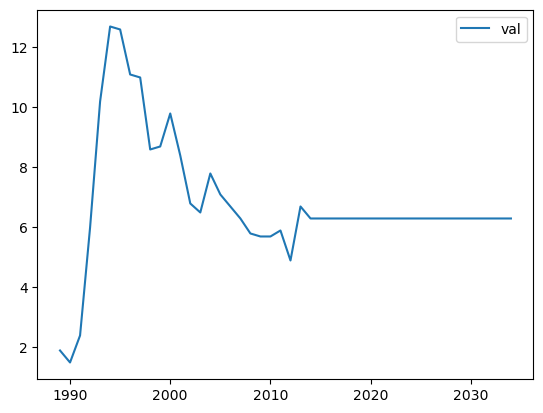

forecasting työllisyysaste_miehet_35_44


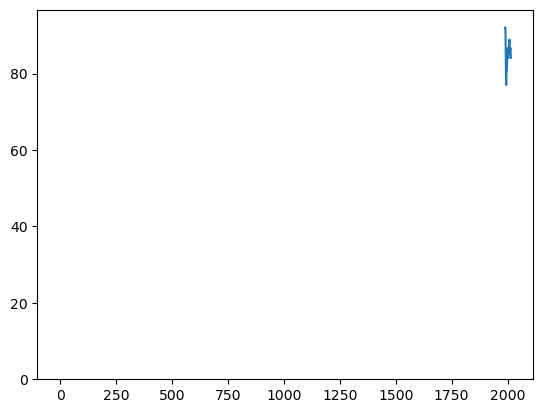

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  10.028
Date:                Wed, 01 Nov 2023   AIC                            -14.056
Time:                        23:04:43   BIC                            -10.399
Sample:                             0   HQIC                           -13.042
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5348      0.588     -0.909      0.363      -1.687       0.618
ma.L2         -0.4321      0.328     -1.317      0.188      -1.075       0.211
sigma2         0.0240      0.014      1.693      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25    0.054576
26    0.002035
27    0.000000
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

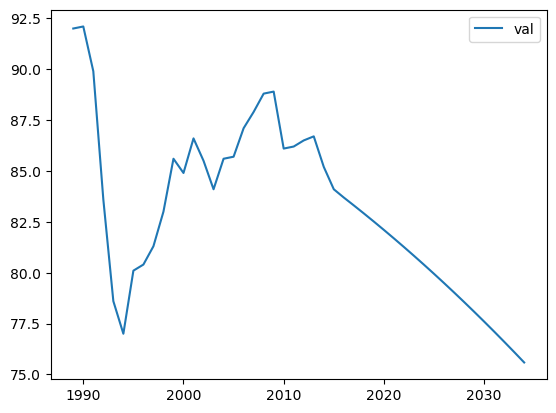

forecasting työllisyysaste_naiset_35_44


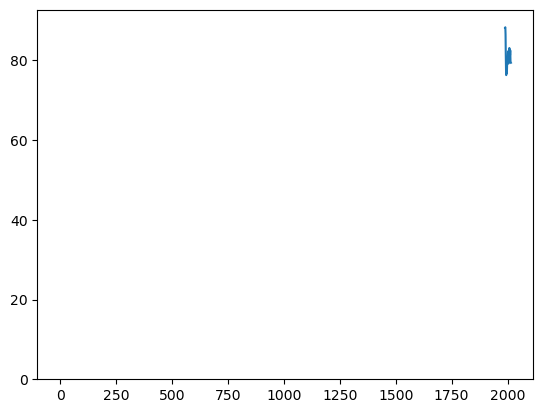

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  15.997
Date:                Wed, 01 Nov 2023   AIC                            -27.993
Time:                        23:04:44   BIC                            -25.555
Sample:                             0   HQIC                           -27.317
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7391      0.193     -3.836      0.000      -1.117      -0.361
sigma2         0.0158      0.005      3.038      0.002       0.006       0.026
Ljung-Box (L1) (Q):                   0.72   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25   -0.019441
26    0.000000
27    0.000000
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

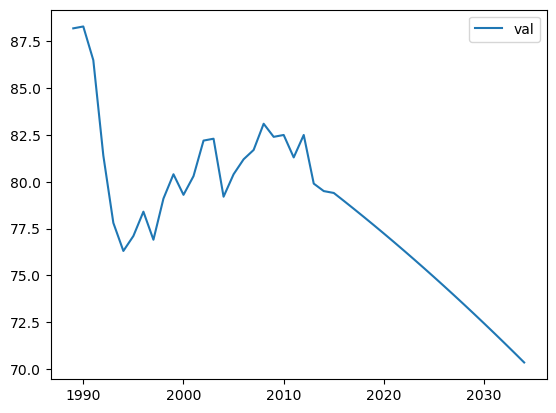

forecasting ei_aviossa_30_34


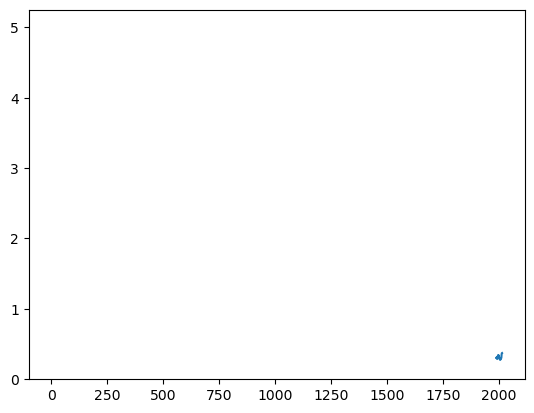

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  37.525
Date:                Wed, 01 Nov 2023   AIC                            -71.051
Time:                        23:04:45   BIC                            -68.613
Sample:                             0   HQIC                           -70.375
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9655      0.474     -2.037      0.042      -1.895      -0.036
sigma2         0.0026      0.001      2.803      0.005       0.001       0.004
Ljung-Box (L1) (Q):                   0.11   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25    0.004642
26    0.000000
27    0.000000
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

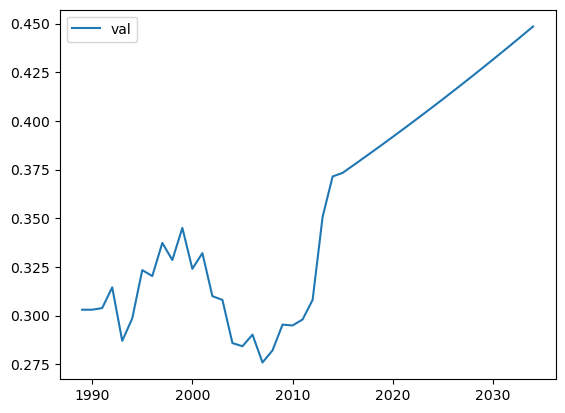

forecasting parittomia_30_34


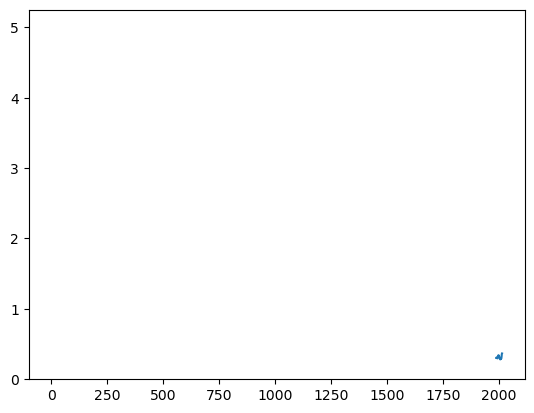

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   25
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  47.203
Date:                Wed, 01 Nov 2023   AIC                            -90.406
Time:                        23:04:46   BIC                            -87.968
Sample:                             0   HQIC                           -89.730
                                 - 25                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5970      0.157     -3.791      0.000      -0.906      -0.288
sigma2         0.0013      0.001      2.621      0.009       0.000       0.002
Ljung-Box (L1) (Q):                   0.02   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

25    0.026437
26    0.000000
27    0.000000
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

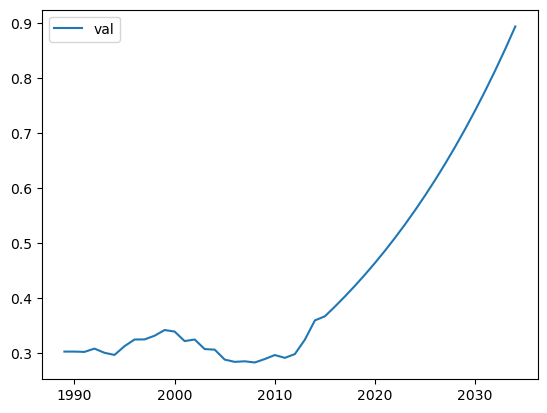

       hedelmallisyysluku  pienituloisuus_miehet_18_29  \
vuosi                                                    
1989             1.710000                     9.400000   
1990             1.782000                     7.900000   
1991             1.794000                    10.900000   
1992             1.847000                    13.500000   
1993             1.813000                    12.700000   
1994             1.847000                    14.200000   
1995             1.807000                    15.900000   
1996             1.764000                    19.300000   
1997             1.746000                    18.200000   
1998             1.700000                    17.900000   
1999             1.735000                    18.200000   
2000             1.729000                    16.700000   
2001             1.726000                    19.200000   
2002             1.718000                    21.000000   
2003             1.760000                    21.100000   
2004          

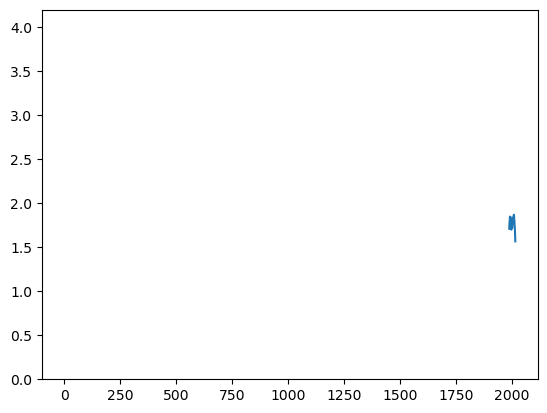

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  67.055
Date:                Wed, 01 Nov 2023   AIC                           -130.109
Time:                        23:04:47   BIC                           -127.593
Sample:                             0   HQIC                          -129.384
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6522      0.168     -3.871      0.000      -0.982      -0.322
sigma2         0.0003      0.000      3.020      0.003       0.000       0.001
Ljung-Box (L1) (Q):                   0.02   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26    0.010518
27   -0.006860
28    0.004474
29   -0.002918
30    0.001903
31   -0.001241
32    0.000809
33   -0.000528
34    0.000344
35   -0.000225
36    0.000146
37   -0.000096
38    0.000062
39   -0.000041
40    0.000026
41   -0.000017
42    0.000011
43   -0.000007
dtype: float64

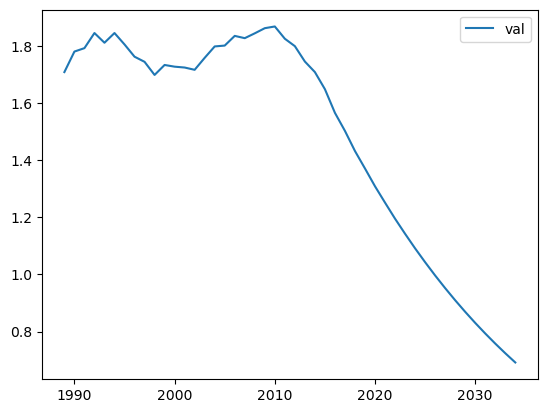

forecasting pienituloisuus_miehet_18_29


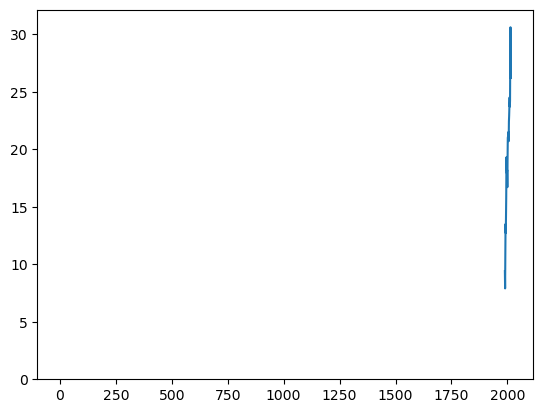

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:               SARIMAX(2, 0, 1)   Log Likelihood                  90.078
Date:                Wed, 01 Nov 2023   AIC                           -172.155
Time:                        23:04:48   BIC                           -167.123
Sample:                             0   HQIC                          -170.706
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3094      0.206      1.504      0.133      -0.094       0.713
ar.L2         -0.6321      0.368     -1.719      0.086      -1.353       0.088
ma.L1         -0.9745      0.652     -1.494      0.1

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26    0.023779
27    0.017769
28   -0.009532
29   -0.014180
30    0.001638
31    0.009470
32    0.001895
33   -0.005399
34   -0.002868
35    0.002525
36    0.002594
37   -0.000793
38   -0.001885
39   -0.000082
40    0.001166
41    0.000413
42   -0.000609
43   -0.000449
dtype: float64

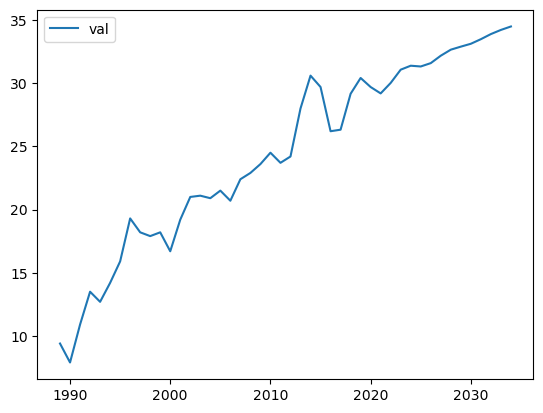

forecasting pienituloisuus_naiset_18_29


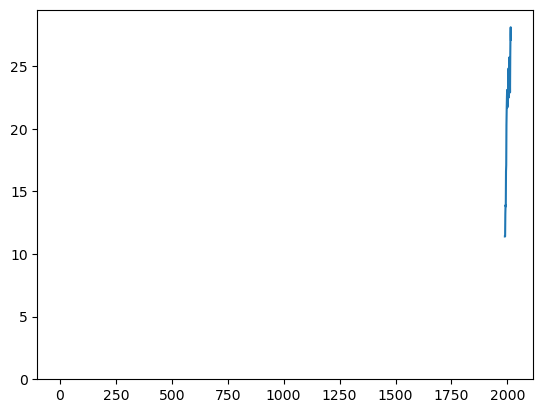

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:               SARIMAX(4, 0, 0)   Log Likelihood                  98.701
Date:                Wed, 01 Nov 2023   AIC                           -187.401
Time:                        23:04:49   BIC                           -181.111
Sample:                             0   HQIC                          -185.590
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7537      0.169     -4.462      0.000      -1.085      -0.423
ar.L2         -0.5875      0.242     -2.430      0.015      -1.061      -0.114
ar.L3         -0.8235      0.158     -5.222      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26    0.000515
27    0.014718
28    0.001473
29   -0.003374
30   -0.010780
31   -0.000752
32    0.008713
33    0.004964
34   -0.001175
35   -0.008712
36   -0.002541
37    0.004748
38    0.005859
39    0.000597
40   -0.006137
41   -0.003662
42    0.002034
43    0.005281
dtype: float64

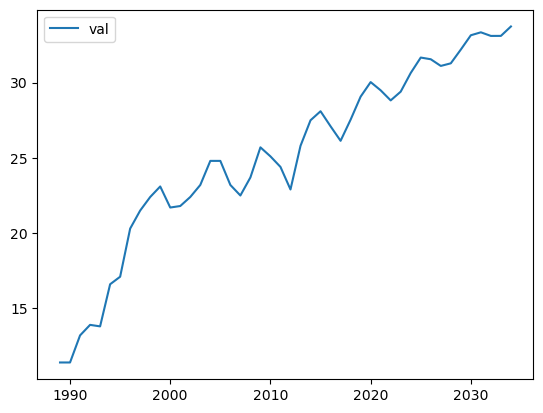

forecasting lapsikuolleisuus


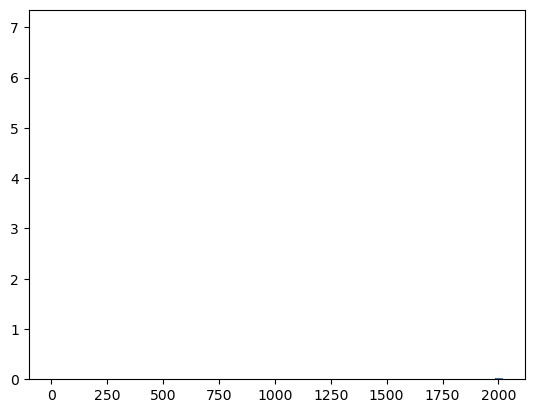

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:               SARIMAX(1, 0, 3)   Log Likelihood                  25.260
Date:                Wed, 01 Nov 2023   AIC                            -40.520
Time:                        23:04:51   BIC                            -34.229
Sample:                             0   HQIC                           -38.708
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7066      0.966     -0.731      0.465      -2.601       1.188
ma.L1         -1.1937      1.816     -0.657      0.511      -4.753       2.365
ma.L2         -0.0857      1.610     -0.053      0.9

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26   -0.225514
27    0.135753
28   -0.060178
29    0.042523
30   -0.030047
31    0.021232
32   -0.015003
33    0.010602
34   -0.007491
35    0.005293
36   -0.003740
37    0.002643
38   -0.001868
39    0.001320
40   -0.000933
41    0.000659
42   -0.000466
43    0.000329
dtype: float64

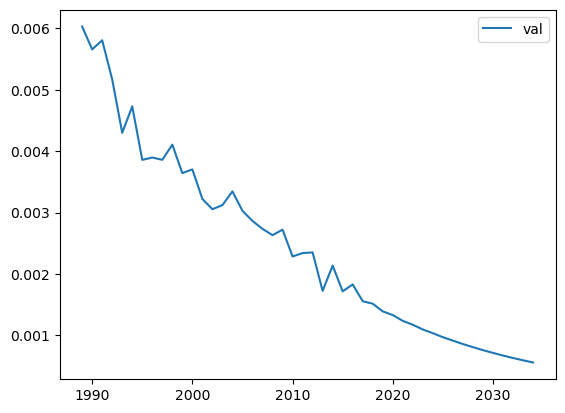

forecasting synnyttajien_keskiika


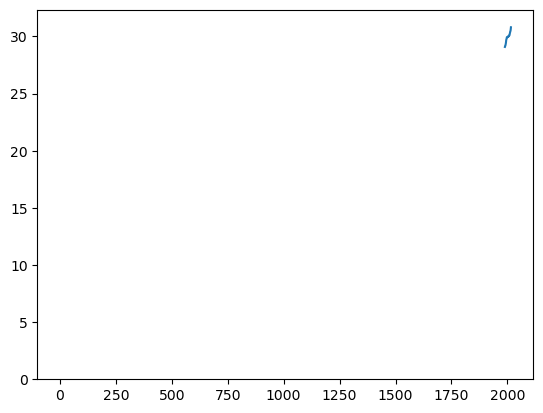

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:               SARIMAX(0, 0, 1)   Log Likelihood                 118.972
Date:                Wed, 01 Nov 2023   AIC                           -233.945
Time:                        23:04:51   BIC                           -231.429
Sample:                             0   HQIC                          -233.220
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.2616      0.209     -1.254      0.210      -0.670       0.147
sigma2      6.191e-06   2.46e-06      2.520      0.012    1.38e-06     1.1e-05
Ljung-Box (L1) (Q):                   0.25   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26   -0.001121
27    0.000000
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

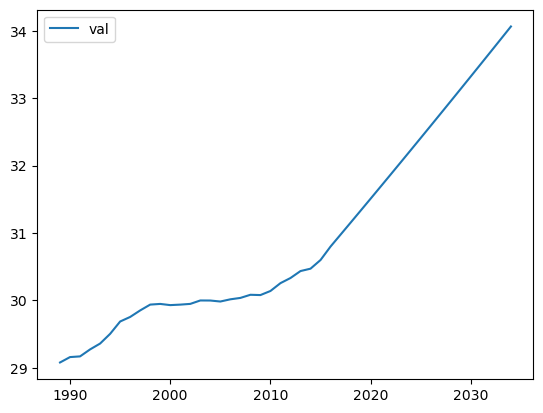

forecasting sisempikaupunki


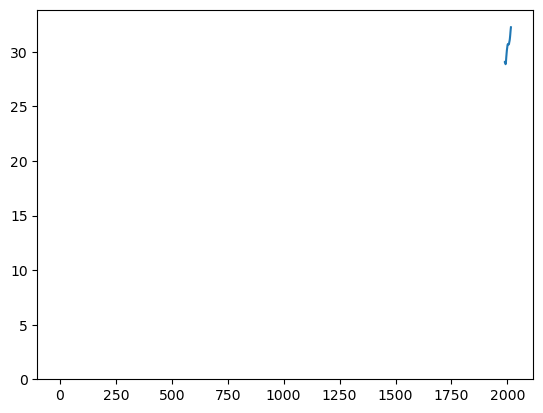

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:               SARIMAX(0, 0, 1)   Log Likelihood                 162.694
Date:                Wed, 01 Nov 2023   AIC                           -321.388
Time:                        23:04:52   BIC                           -318.871
Sample:                             0   HQIC                          -320.663
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.3781      0.234      1.614      0.106      -0.081       0.837
sigma2      2.136e-07   6.51e-08      3.283      0.001    8.61e-08    3.41e-07
Ljung-Box (L1) (Q):                   0.00   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26   -0.000122
27    0.000000
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

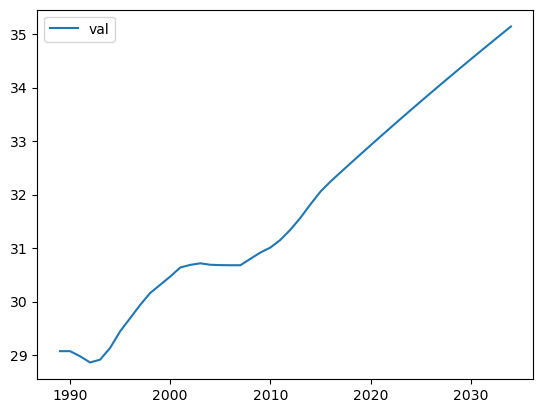

forecasting ulompikaupunki


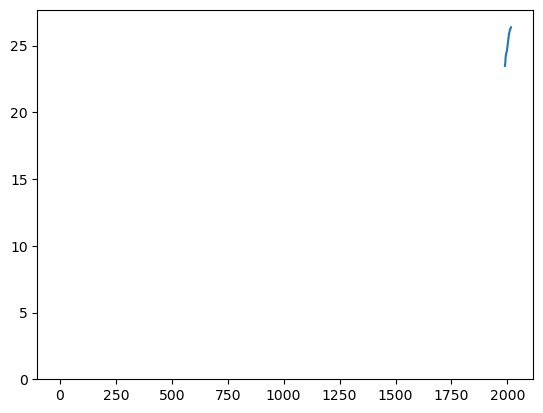

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:                        SARIMAX   Log Likelihood                 168.798
Date:                Wed, 01 Nov 2023   AIC                           -335.597
Time:                        23:04:53   BIC                           -334.339
Sample:                             0   HQIC                          -335.235
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1.344e-07   1.49e-08      8.992      0.000    1.05e-07    1.64e-07
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               144.55
Prob(Q):                              0.99   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26    0.0
27    0.0
28    0.0
29    0.0
30    0.0
31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

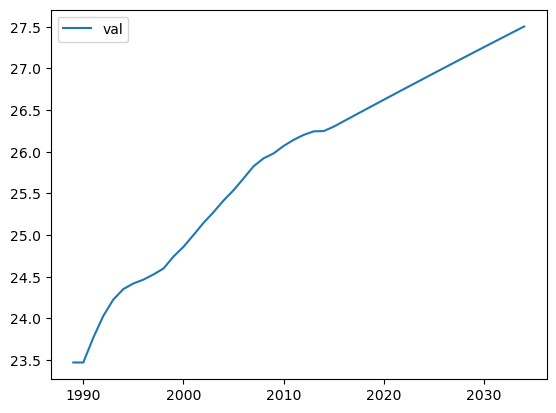

forecasting kehyskaupunki


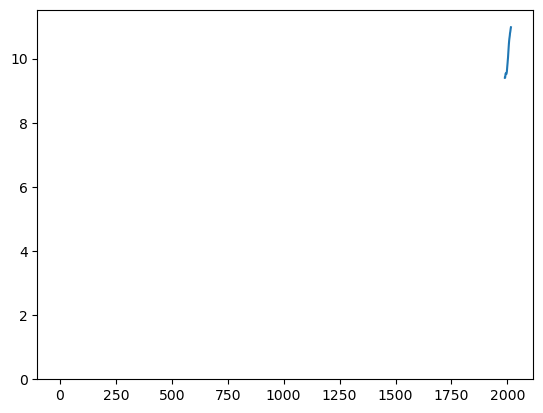

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:                        SARIMAX   Log Likelihood                 221.352
Date:                Wed, 01 Nov 2023   AIC                           -440.704
Time:                        23:04:54   BIC                           -439.446
Sample:                             0   HQIC                          -440.342
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      2.359e-09   9.08e-10      2.599      0.009     5.8e-10    4.14e-09
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):                 0.26
Prob(Q):                              0.86   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26    0.0
27    0.0
28    0.0
29    0.0
30    0.0
31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

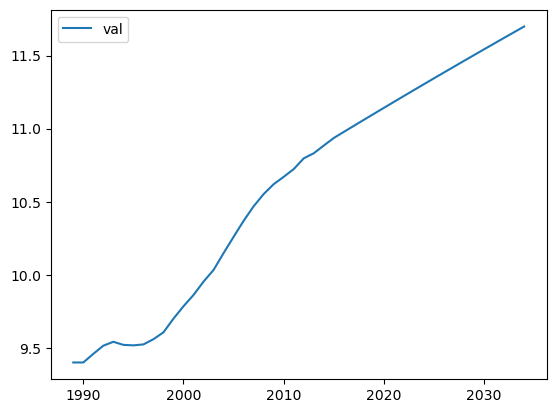

forecasting maaseudulla


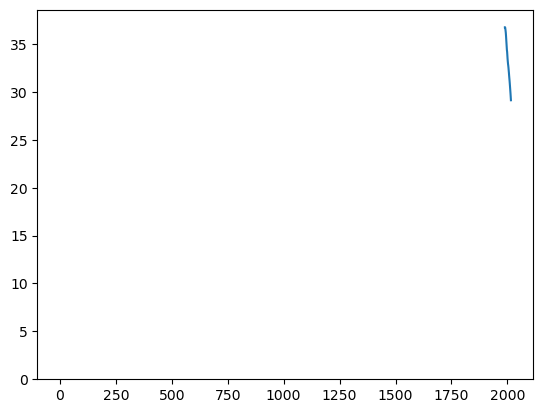

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:                        SARIMAX   Log Likelihood                 153.630
Date:                Wed, 01 Nov 2023   AIC                           -305.260
Time:                        23:04:55   BIC                           -304.002
Sample:                             0   HQIC                          -304.898
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      4.317e-07   8.55e-08      5.050      0.000    2.64e-07    5.99e-07
Ljung-Box (L1) (Q):                   0.64   Jarque-Bera (JB):                 4.91
Prob(Q):                              0.43   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26    0.0
27    0.0
28    0.0
29    0.0
30    0.0
31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

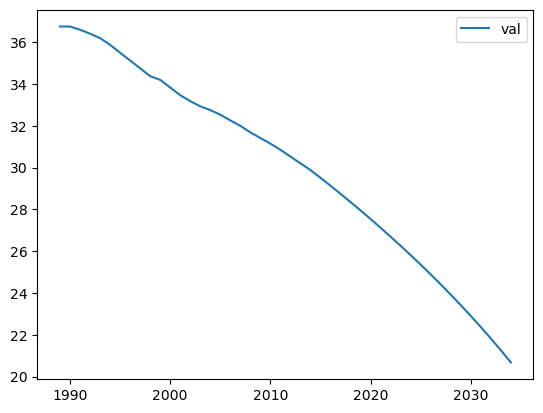

forecasting avioituvuus_naiset_30_34


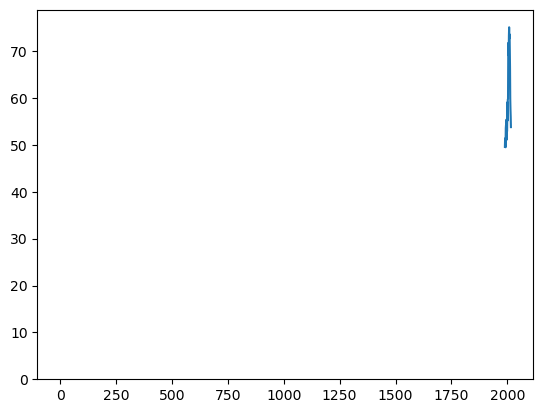

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  10.625
Date:                Wed, 01 Nov 2023   AIC                            -17.250
Time:                        23:04:56   BIC                            -14.734
Sample:                             0   HQIC                           -16.525
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7720      0.163     -4.730      0.000      -1.092      -0.452
sigma2         0.0250      0.008      3.165      0.002       0.010       0.040
Ljung-Box (L1) (Q):                   1.26   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26    0.000134
27    0.000000
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

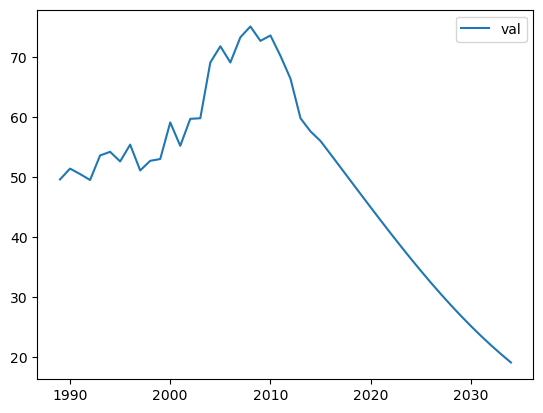

forecasting avioituvuus_naiset_25_29


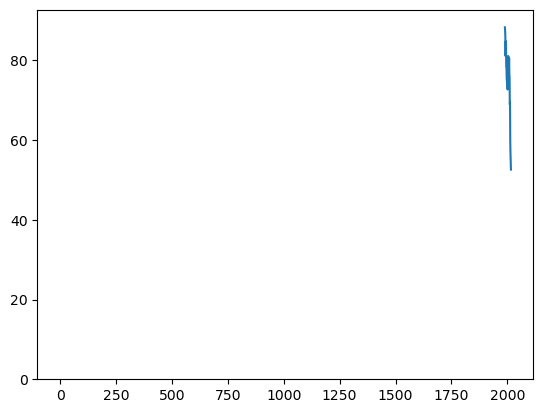

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:               SARIMAX(0, 0, 2)   Log Likelihood                   5.531
Date:                Wed, 01 Nov 2023   AIC                             -5.063
Time:                        23:04:57   BIC                             -1.288
Sample:                             0   HQIC                            -3.976
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.2466      0.228     -5.462      0.000      -1.694      -0.799
ma.L2          0.6122      0.200      3.060      0.002       0.220       1.004
sigma2         0.0356      0.014      2.573      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26   -0.164286
27    0.134974
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

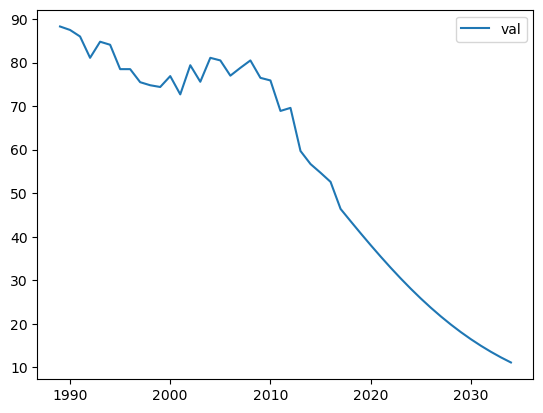

forecasting eronneisuus_25_29


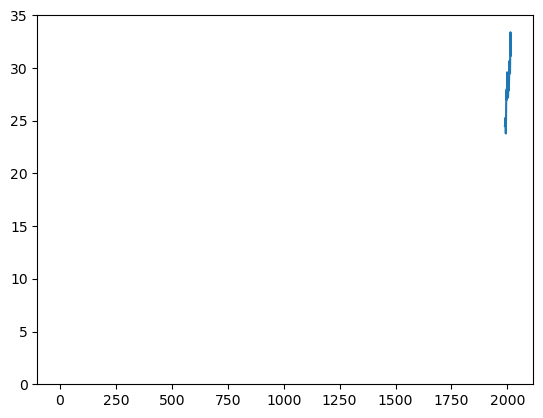

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:               SARIMAX(4, 0, 0)   Log Likelihood                  40.165
Date:                Wed, 01 Nov 2023   AIC                            -70.330
Time:                        23:04:58   BIC                            -64.039
Sample:                             0   HQIC                           -68.518
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9240      0.183     -5.041      0.000      -1.283      -0.565
ar.L2         -1.0087      0.256     -3.941      0.000      -1.510      -0.507
ar.L3         -0.8593      0.232     -3.705      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26    0.086556
27    0.038641
28   -0.061537
29   -0.060789
30    0.040036
31    0.057115
32   -0.008928
33   -0.052160
34   -0.012693
35    0.042320
36    0.023164
37   -0.026066
38   -0.029047
39    0.011225
40    0.029284
41    0.000132
42   -0.024204
43   -0.008768
dtype: float64

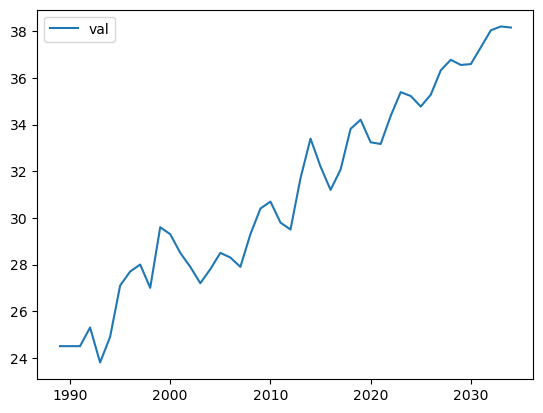

forecasting eronneisuus_30_34


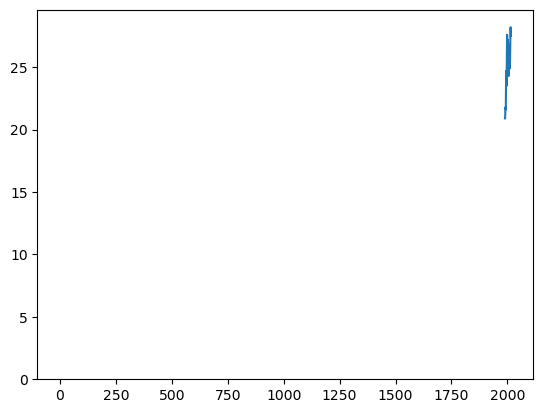

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:               SARIMAX(0, 0, 5)   Log Likelihood                  38.224
Date:                Wed, 01 Nov 2023   AIC                            -64.448
Time:                        23:04:59   BIC                            -56.900
Sample:                             0   HQIC                           -62.275
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9392      0.351     -2.675      0.007      -1.627      -0.251
ma.L2         -0.2557      0.456     -0.561      0.575      -1.149       0.638
ma.L3          0.3572      0.325      1.099      0.2

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26    0.060108
27    0.001149
28   -0.017511
29    0.002140
30    0.002295
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

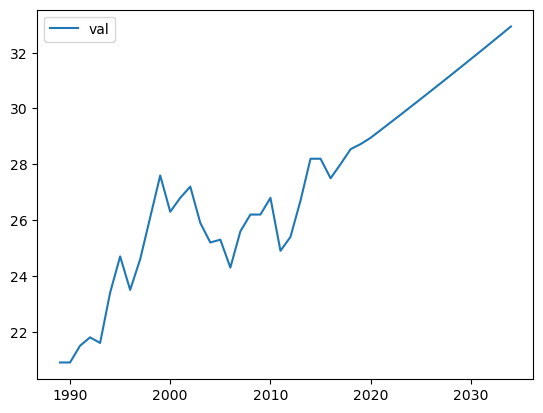

forecasting kolmasaste_miehet_25_29


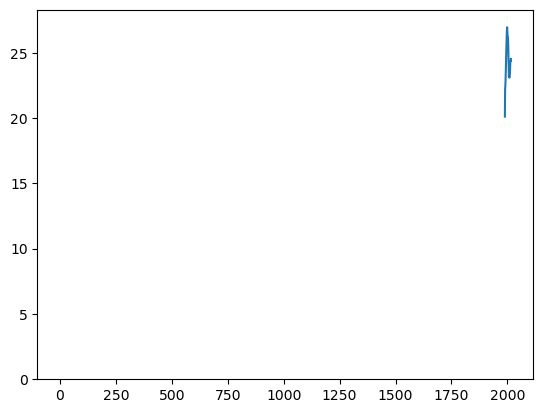

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  55.367
Date:                Wed, 01 Nov 2023   AIC                           -106.734
Time:                        23:05:00   BIC                           -104.218
Sample:                             0   HQIC                          -106.009
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5700      0.106     -5.363      0.000      -0.778      -0.362
sigma2         0.0008      0.000      4.720      0.000       0.000       0.001
Ljung-Box (L1) (Q):                   1.30   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26   -5.886443e-03
27    3.355331e-03
28   -1.912572e-03
29    1.090185e-03
30   -6.214166e-04
31    3.542137e-04
32   -2.019053e-04
33    1.150881e-04
34   -6.560135e-05
35    3.739342e-05
36   -2.131463e-05
37    1.214955e-05
38   -6.925365e-06
39    3.947527e-06
40   -2.250130e-06
41    1.282597e-06
42   -7.310930e-07
43    4.167303e-07
dtype: float64

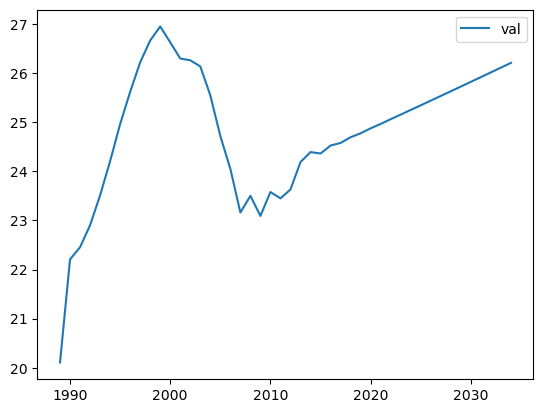

forecasting miehet_perusaste_25_29


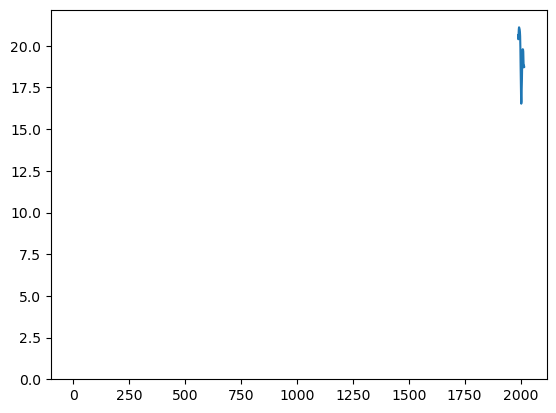

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:               SARIMAX(4, 0, 1)   Log Likelihood                  67.722
Date:                Wed, 01 Nov 2023   AIC                           -123.445
Time:                        23:05:01   BIC                           -115.896
Sample:                             0   HQIC                          -121.271
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0252      0.218      4.713      0.000       0.599       1.452
ar.L2         -0.4778      0.313     -1.525      0.127      -1.092       0.136
ar.L3          0.4295      0.392      1.096      0.2

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26   -0.000098
27    0.013545
28   -0.004662
29   -0.006393
30    0.001535
31   -0.003306
32   -0.004827
33    0.000090
34    0.000307
35   -0.000354
36    0.001642
37    0.001946
38    0.000923
39    0.000877
40    0.000575
41   -0.000285
42   -0.000595
43   -0.000610
dtype: float64

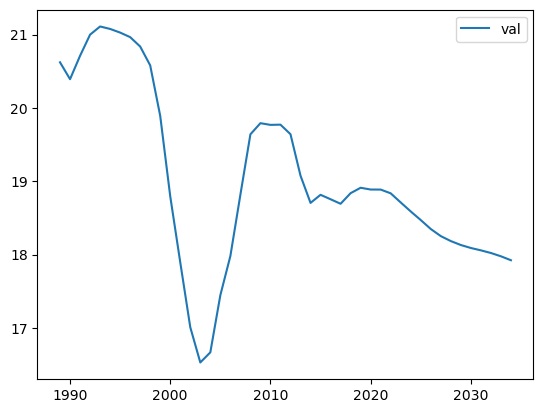

forecasting naiset_perusaste_25_29


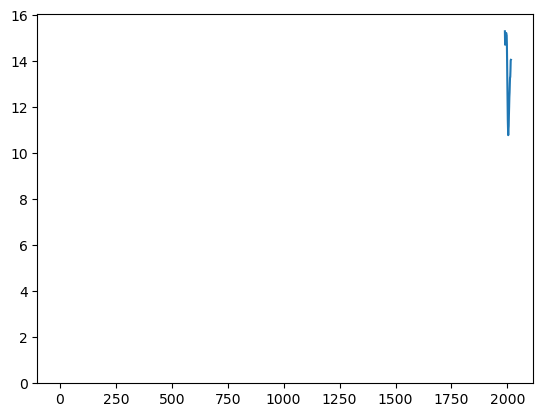

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  62.454
Date:                Wed, 01 Nov 2023   AIC                           -118.908
Time:                        23:05:02   BIC                           -115.133
Sample:                             0   HQIC                          -117.821
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.3500      0.186     -1.880      0.060      -0.715       0.015
ma.L2          0.6417      0.194      3.305      0.001       0.261       1.022
sigma2         0.0005      0.000      3.452      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26    0.031189
27   -0.019090
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

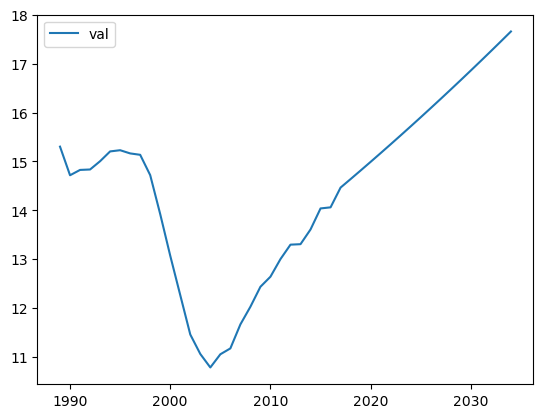

forecasting kolmasaste_naiset_25_29


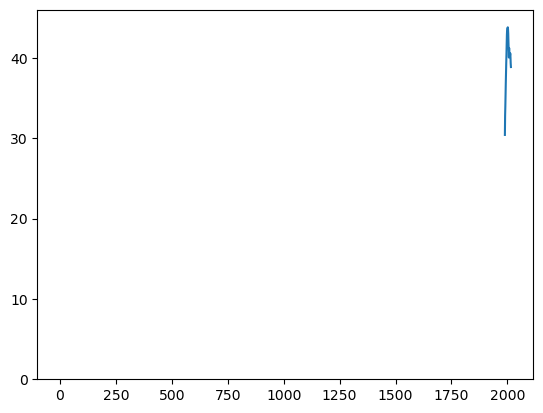

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  57.975
Date:                Wed, 01 Nov 2023   AIC                           -111.950
Time:                        23:05:03   BIC                           -109.433
Sample:                             0   HQIC                          -111.225
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5466      0.173     -3.161      0.002      -0.886      -0.208
sigma2         0.0007      0.000      5.442      0.000       0.000       0.001
Ljung-Box (L1) (Q):                   0.06   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26   -7.673722e-03
27    4.194737e-03
28   -2.292997e-03
29    1.253436e-03
30   -6.851739e-04
31    3.745411e-04
32   -2.047379e-04
33    1.119172e-04
34   -6.117803e-05
35    3.344215e-05
36   -1.828070e-05
37    9.992900e-06
38   -5.462485e-06
39    2.985994e-06
40   -1.632253e-06
41    8.922494e-07
42   -4.877361e-07
43    2.666144e-07
dtype: float64

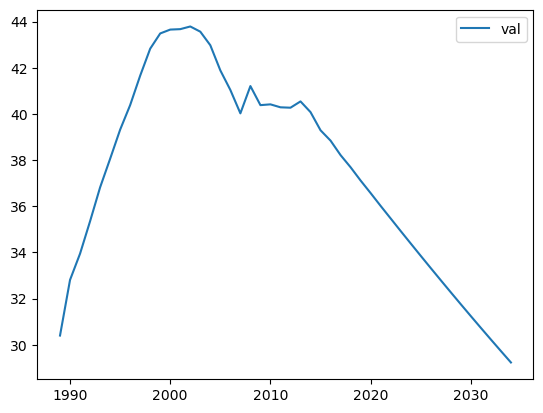

forecasting alypuhelin


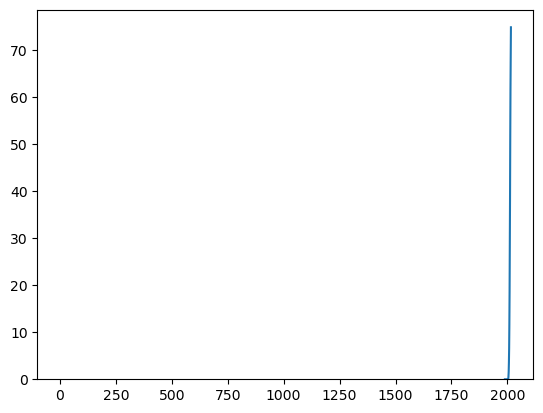

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:               SARIMAX(0, 1, 3)   Log Likelihood                  64.480
Date:                Wed, 01 Nov 2023   AIC                           -118.959
Time:                        23:05:05   BIC                           -112.865
Sample:                             0   HQIC                          -117.269
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0040      0.011      0.355      0.723      -0.018       0.026
ma.L1         -0.4494      0.263     -1.707      0.088      -0.965       0.067
ma.L2         -0.4746      0.272     -1.743      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26    0.116361
27    0.089811
28    0.109491
29    0.113455
30    0.117420
31    0.121384
32    0.125349
33    0.129313
34    0.133278
35    0.137243
36    0.141207
37    0.145172
38    0.149136
39    0.153101
40    0.157065
41    0.161030
42    0.164994
43    0.168959
dtype: float64

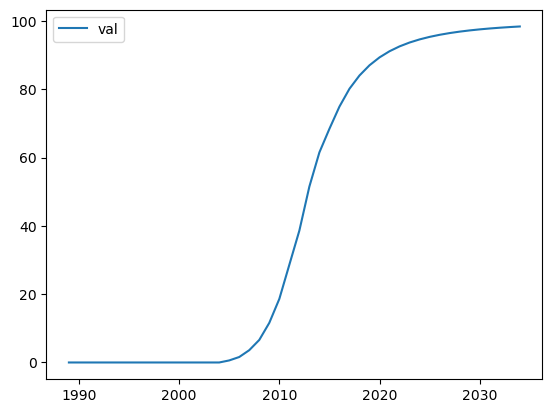

forecasting some_25_34


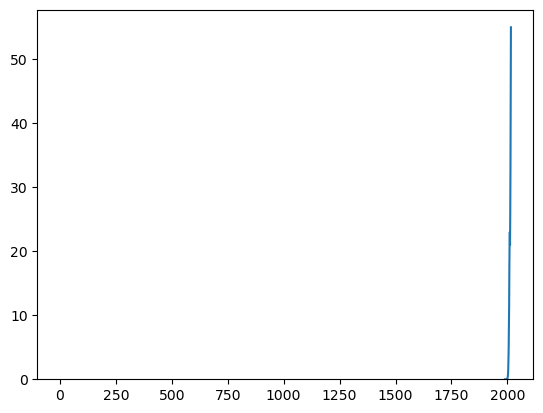

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:               SARIMAX(3, 0, 0)   Log Likelihood                  75.330
Date:                Wed, 01 Nov 2023   AIC                           -142.660
Time:                        23:05:06   BIC                           -137.628
Sample:                             0   HQIC                          -141.211
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8780      0.307      2.864      0.004       0.277       1.479
ar.L2          0.5823      0.357      1.630      0.103      -0.118       1.282
ar.L3         -0.5618      0.355     -1.581      0.1

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:1346: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum
/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26    0.093079
27    0.087533
28    0.088501
29    0.076381
30    0.069419
31    0.055706
32    0.046420
33    0.034194
34    0.025756
35    0.016445
36    0.010226
37    0.004084
38    0.000301
39   -0.003102
40   -0.004843
41   -0.006228
42   -0.006545
43   -0.006652
dtype: float64

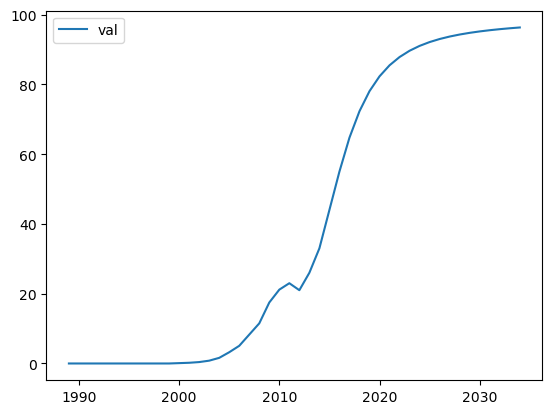

forecasting some_35_44


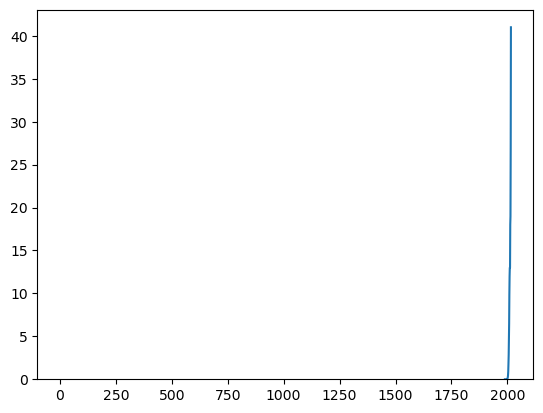

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  71.803
Date:                Wed, 01 Nov 2023   AIC                           -139.605
Time:                        23:05:07   BIC                           -137.089
Sample:                             0   HQIC                          -138.881
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.7360      0.052     14.154      0.000       0.634       0.838
sigma2         0.0002   2.99e-05      7.585      0.000       0.000       0.000
Ljung-Box (L1) (Q):                   0.01   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:1346: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum
/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26    0.030006
27    0.000000
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

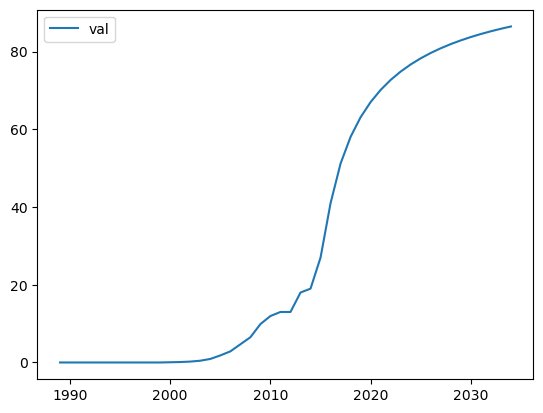

forecasting työttömyys_miehet_25_34


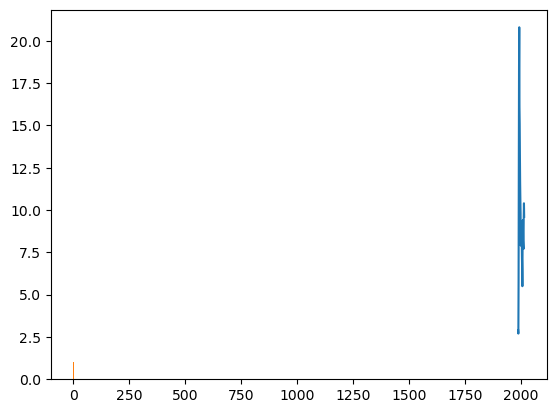

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:               SARIMAX(4, 0, 0)   Log Likelihood                  -0.603
Date:                Wed, 01 Nov 2023   AIC                             11.206
Time:                        23:05:08   BIC                             17.496
Sample:                             0   HQIC                            13.017
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3149      0.320     -0.984      0.325      -0.942       0.312
ar.L2         -0.2433      0.223     -1.089      0.276      -0.681       0.195
ar.L3         -0.4681      0.216     -2.169      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26   -0.039750
27   -0.017489
28    0.180335
29    0.061656
30   -0.033742
31   -0.079398
32   -0.092555
33    0.031124
34    0.068018
35    0.057002
36    0.000667
37   -0.062643
38   -0.043671
39   -0.001950
40    0.040206
41    0.041920
42    0.001398
43   -0.028413
dtype: float64

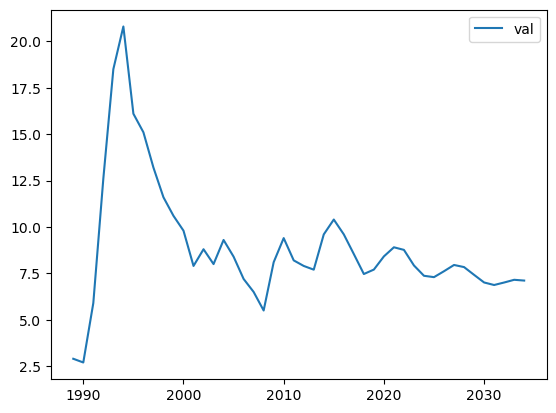

forecasting työttömyys_naiset_25_34


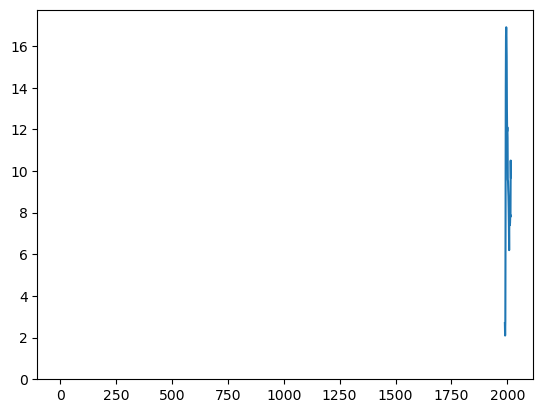

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  -0.499
Date:                Wed, 01 Nov 2023   AIC                              6.999
Time:                        23:05:09   BIC                             10.773
Sample:                             0   HQIC                             8.086
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.3127      0.295     -1.059      0.290      -0.891       0.266
ma.L2         -0.5927      0.295     -2.009      0.045      -1.171      -0.015
sigma2         0.0570      0.024      2.384      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26   -0.093195
27    0.201818
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

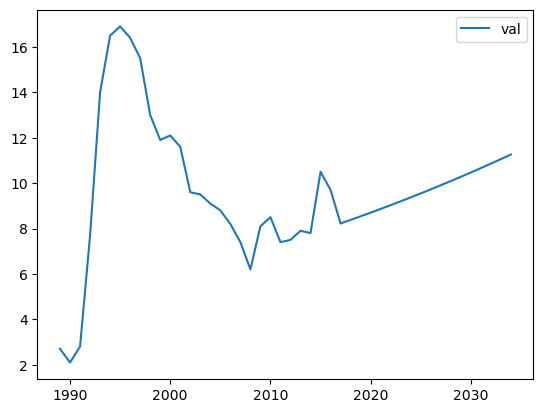

forecasting työllisyysaste_miehet_25_34


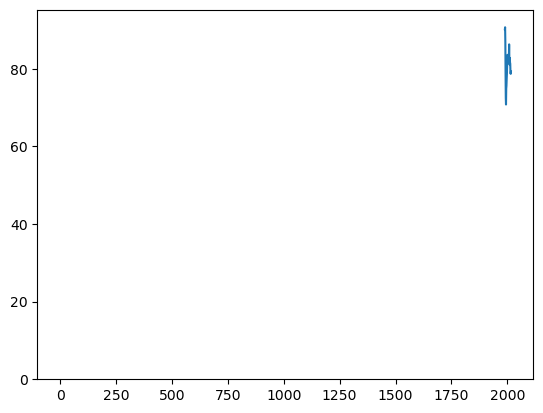

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:               SARIMAX(0, 0, 1)   Log Likelihood                   6.551
Date:                Wed, 01 Nov 2023   AIC                             -9.102
Time:                        23:05:10   BIC                             -6.586
Sample:                             0   HQIC                            -8.377
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6088      0.227     -2.685      0.007      -1.053      -0.164
sigma2         0.0347      0.009      4.069      0.000       0.018       0.051
Ljung-Box (L1) (Q):                   1.94   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26   -0.052124
27    0.000000
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

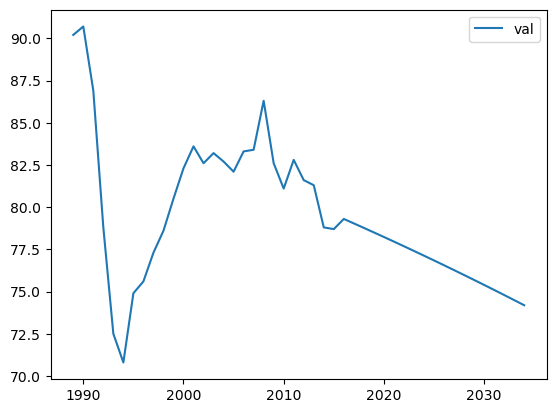

forecasting työllisyysaste_naiset_25_34


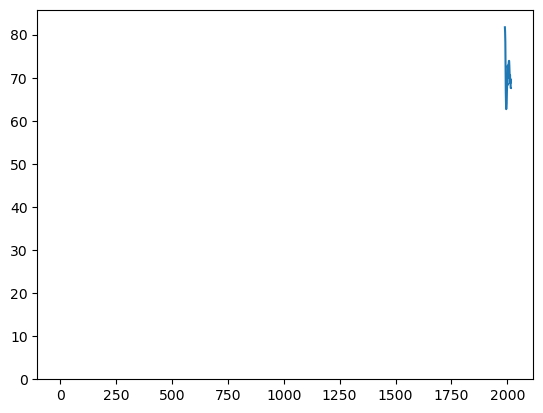

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  21.278
Date:                Wed, 01 Nov 2023   AIC                            -38.556
Time:                        23:05:11   BIC                            -36.040
Sample:                             0   HQIC                           -37.832
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5493      0.177     -3.105      0.002      -0.896      -0.203
sigma2         0.0112      0.004      2.572      0.010       0.003       0.020
Ljung-Box (L1) (Q):                   0.06   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26   -0.025578
27    0.000000
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

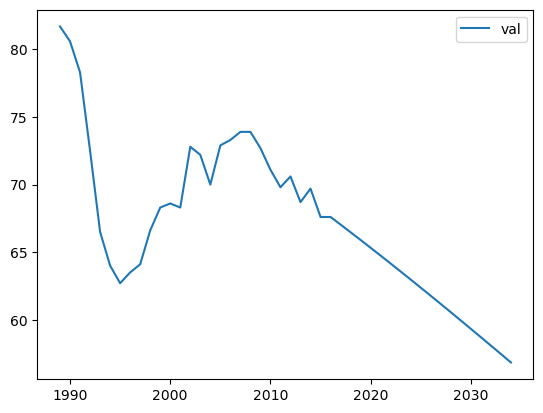

forecasting työttömyys_miehet_35_44


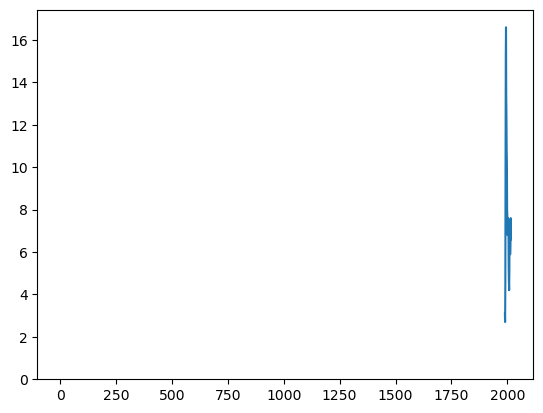

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:               SARIMAX(3, 0, 0)   Log Likelihood                   2.377
Date:                Wed, 01 Nov 2023   AIC                              3.247
Time:                        23:05:12   BIC                              8.279
Sample:                             0   HQIC                             4.696
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0112      0.194      0.058      0.954      -0.368       0.391
ar.L2         -0.2090      0.181     -1.154      0.249      -0.564       0.146
ar.L3         -0.6554      0.171     -3.822      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26   -0.081083
27    0.005177
28    0.237599
29    0.054723
30   -0.052448
31   -0.167741
32   -0.026781
33    0.069137
34    0.116305
35    0.004404
36   -0.069573
37   -0.077923
38    0.010784
39    0.062006
40    0.049509
41   -0.019474
42   -0.051204
43   -0.028950
dtype: float64

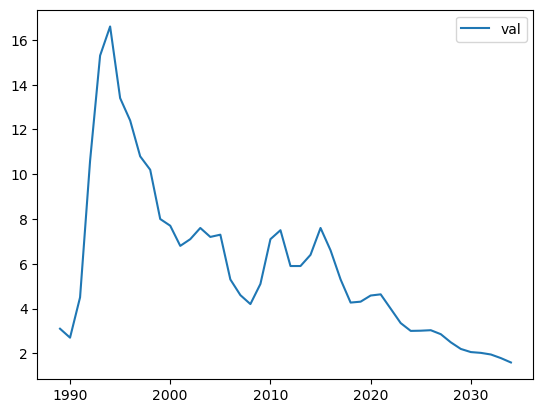

forecasting työttömyys_naiset_35_44


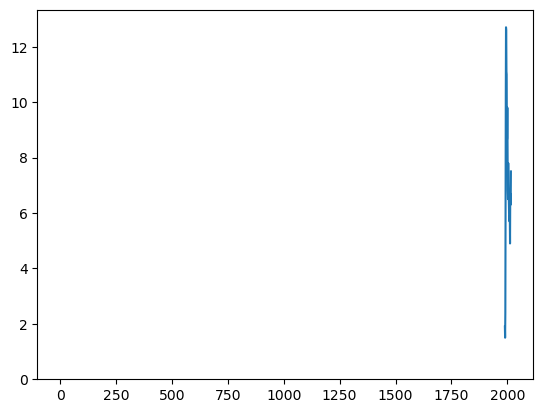

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:                        SARIMAX   Log Likelihood                  -4.025
Date:                Wed, 01 Nov 2023   AIC                             10.050
Time:                        23:05:13   BIC                             11.308
Sample:                             0   HQIC                            10.412
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0798      0.022      3.599      0.000       0.036       0.123
Ljung-Box (L1) (Q):                   0.08   Jarque-Bera (JB):                 1.36
Prob(Q):                              0.78   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26    0.0
27    0.0
28    0.0
29    0.0
30    0.0
31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

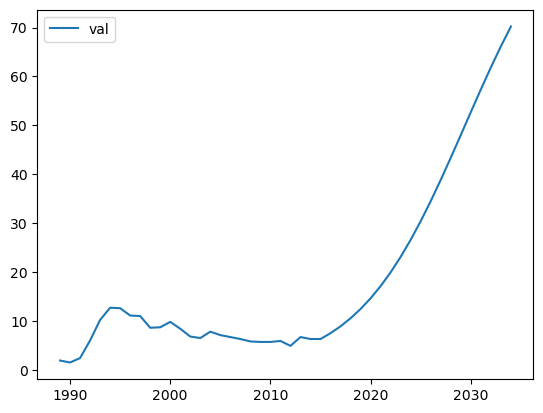

forecasting työllisyysaste_miehet_35_44


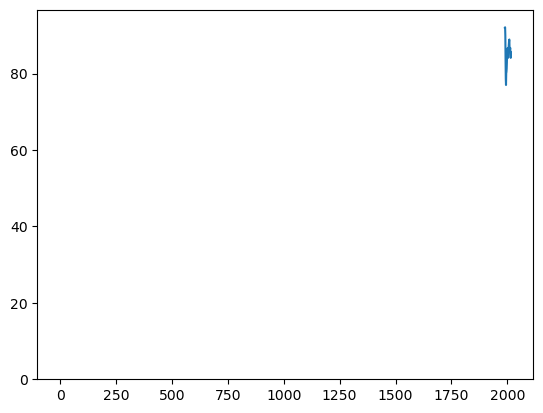

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  10.578
Date:                Wed, 01 Nov 2023   AIC                            -15.156
Time:                        23:05:14   BIC                            -11.382
Sample:                             0   HQIC                           -14.069
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.4961      0.333     -1.491      0.136      -1.148       0.156
ma.L2         -0.4203      0.246     -1.712      0.087      -0.902       0.061
sigma2         0.0243      0.010      2.485      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26   -0.064588
27   -0.057177
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

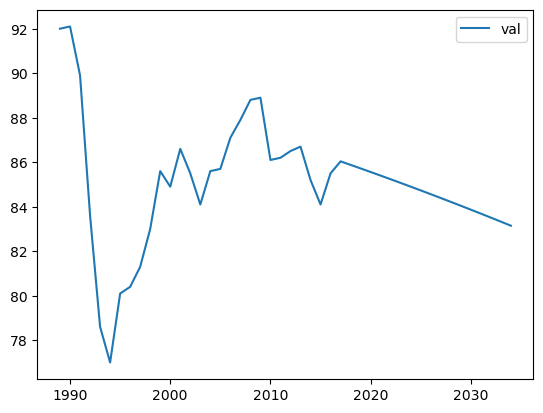

forecasting työllisyysaste_naiset_35_44


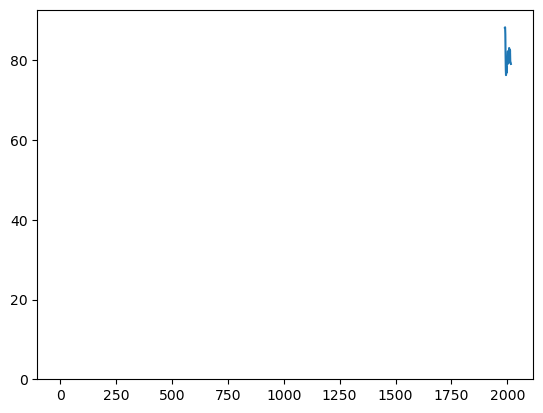

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  17.160
Date:                Wed, 01 Nov 2023   AIC                            -30.321
Time:                        23:05:15   BIC                            -27.805
Sample:                             0   HQIC                           -29.596
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7420      0.184     -4.037      0.000      -1.102      -0.382
sigma2         0.0152      0.005      3.197      0.001       0.006       0.024
Ljung-Box (L1) (Q):                   0.76   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26   -0.005308
27    0.000000
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

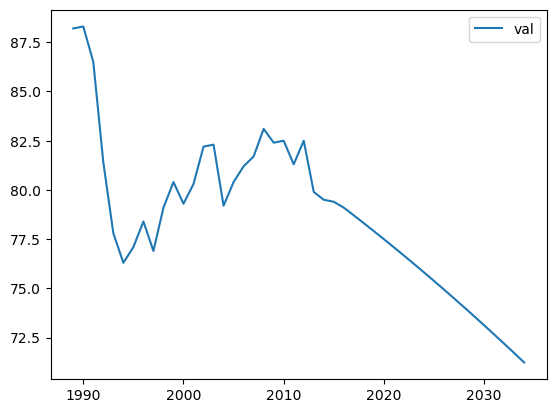

forecasting ei_aviossa_30_34


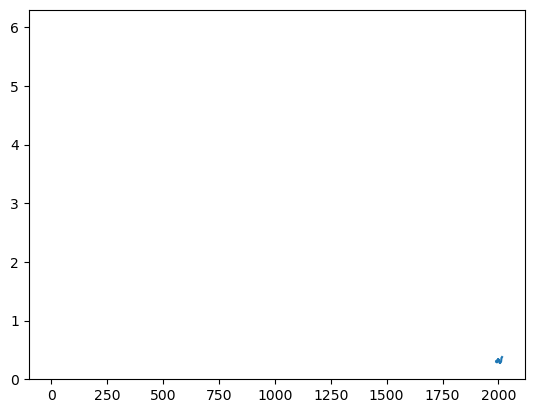

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  39.689
Date:                Wed, 01 Nov 2023   AIC                            -75.377
Time:                        23:05:16   BIC                            -72.861
Sample:                             0   HQIC                           -74.653
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8599      0.203     -4.234      0.000      -1.258      -0.462
sigma2         0.0026      0.001      3.275      0.001       0.001       0.004
Ljung-Box (L1) (Q):                   0.57   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26    0.007743
27    0.000000
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

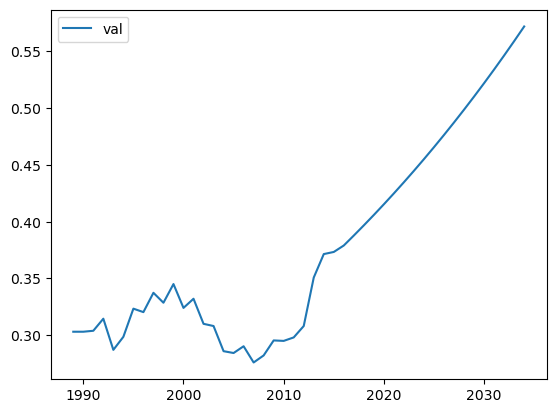

forecasting parittomia_30_34


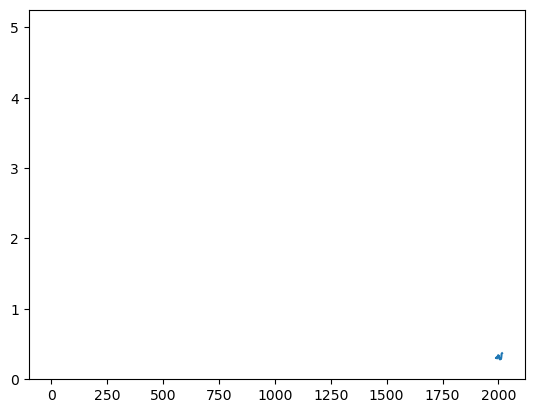

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   26
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  49.035
Date:                Wed, 01 Nov 2023   AIC                            -94.071
Time:                        23:05:17   BIC                            -91.554
Sample:                             0   HQIC                           -93.346
                                 - 26                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6236      0.156     -3.997      0.000      -0.929      -0.318
sigma2         0.0013      0.001      2.607      0.009       0.000       0.002
Ljung-Box (L1) (Q):                   0.09   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

26    0.023766
27    0.000000
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

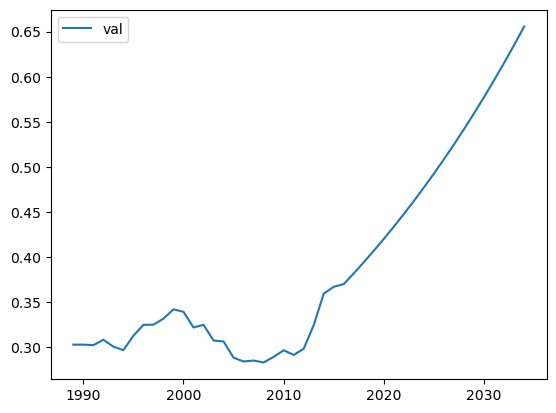

       hedelmallisyysluku  pienituloisuus_miehet_18_29  \
vuosi                                                    
1989             1.710000                     9.400000   
1990             1.782000                     7.900000   
1991             1.794000                    10.900000   
1992             1.847000                    13.500000   
1993             1.813000                    12.700000   
1994             1.847000                    14.200000   
1995             1.807000                    15.900000   
1996             1.764000                    19.300000   
1997             1.746000                    18.200000   
1998             1.700000                    17.900000   
1999             1.735000                    18.200000   
2000             1.729000                    16.700000   
2001             1.726000                    19.200000   
2002             1.718000                    21.000000   
2003             1.760000                    21.100000   
2004          

forecasting hedelmallisyysluku


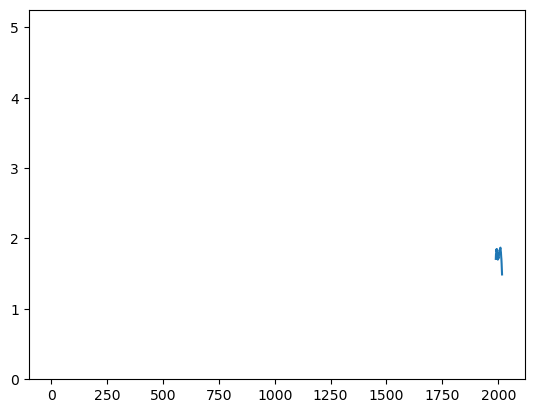

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  70.002
Date:                Wed, 01 Nov 2023   AIC                           -136.004
Time:                        23:05:18   BIC                           -133.413
Sample:                             0   HQIC                          -135.234
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6420      0.165     -3.897      0.000      -0.965      -0.319
sigma2         0.0003      0.000      3.117      0.002       0.000       0.001
Ljung-Box (L1) (Q):                   0.01   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27   -3.887979e-04
28    2.496181e-04
29   -1.602611e-04
30    1.028917e-04
31   -6.605909e-05
32    4.241161e-05
33   -2.722932e-05
34    1.748192e-05
35   -1.122383e-05
36    7.205985e-06
37   -4.626425e-06
38    2.970282e-06
39   -1.906996e-06
40    1.224340e-06
41   -7.860572e-07
42    5.046686e-07
43   -3.240100e-07
dtype: float64

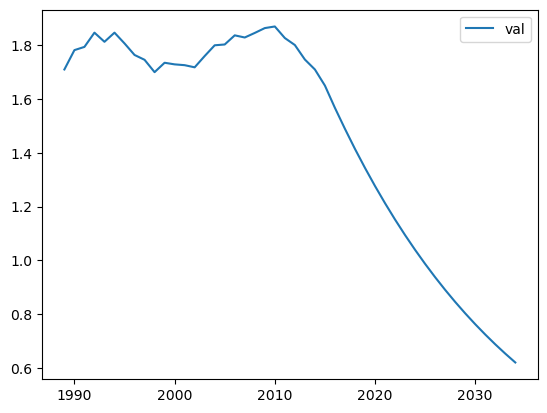

forecasting pienituloisuus_miehet_18_29


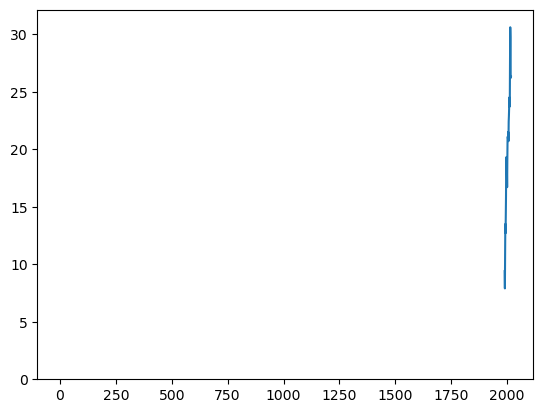

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:               SARIMAX(3, 0, 1)   Log Likelihood                  95.157
Date:                Wed, 01 Nov 2023   AIC                           -180.314
Time:                        23:05:19   BIC                           -173.835
Sample:                             0   HQIC                          -178.388
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1402      0.264      0.531      0.596      -0.378       0.658
ar.L2         -0.5561      0.347     -1.601      0.109      -1.237       0.125
ar.L3         -0.3085      0.320     -0.963      0.3

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27    0.019346
28   -0.005355
29   -0.018804
30   -0.005626
31    0.011320
32    0.010517
33   -0.003085
34   -0.009773
35   -0.002899
36    0.005980
37    0.005466
38   -0.001665
39   -0.005118
40   -0.001478
41    0.003153
42    0.002843
43   -0.000899
dtype: float64

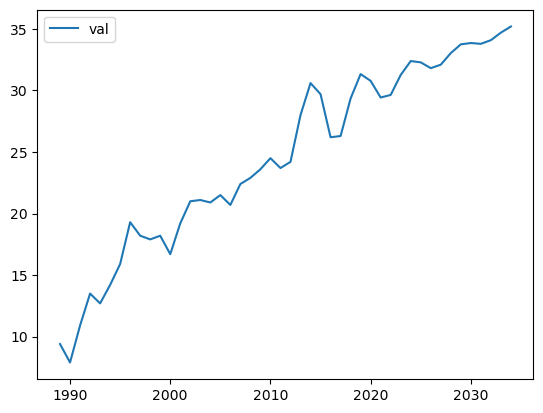

forecasting pienituloisuus_naiset_18_29


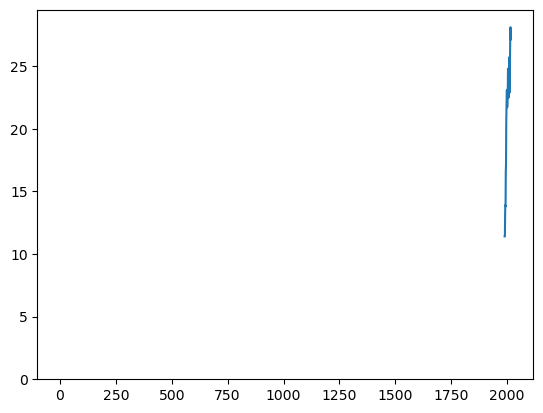

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:               SARIMAX(4, 0, 0)   Log Likelihood                 101.803
Date:                Wed, 01 Nov 2023   AIC                           -193.605
Time:                        23:05:21   BIC                           -187.126
Sample:                             0   HQIC                          -191.679
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7599      0.194     -3.918      0.000      -1.140      -0.380
ar.L2         -0.6155      0.267     -2.304      0.021      -1.139      -0.092
ar.L3         -0.8347      0.163     -5.124      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27    0.007015
28    0.000562
29   -0.007720
30   -0.005926
31    0.004982
32    0.006001
33    0.001506
34   -0.005784
35   -0.004242
36    0.002273
37    0.004895
38    0.001558
39   -0.003794
40   -0.003395
41    0.000960
42    0.003682
43    0.001502
dtype: float64

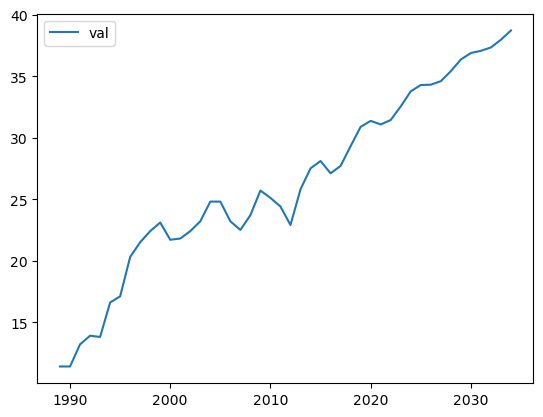

forecasting lapsikuolleisuus


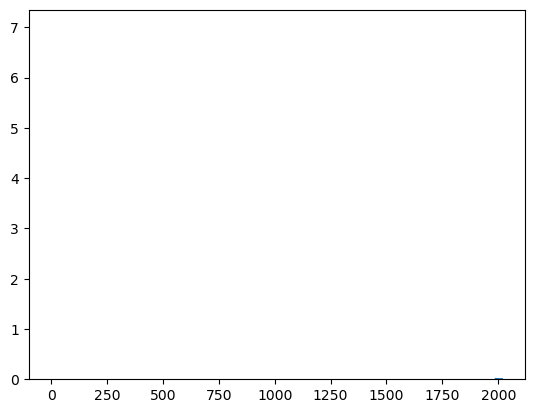

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:               SARIMAX(2, 0, 0)   Log Likelihood                  22.238
Date:                Wed, 01 Nov 2023   AIC                            -38.477
Time:                        23:05:22   BIC                            -34.589
Sample:                             0   HQIC                           -37.321
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.2241      0.161     -7.583      0.000      -1.541      -0.908
ar.L2         -0.6576      0.134     -4.922      0.000      -0.919      -0.396
sigma2         0.0105      0.003      3.021      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27   -0.187636
28    0.228487
29   -0.156312
30    0.041099
31    0.052476
32   -0.091262
33    0.077209
34   -0.034502
35   -0.008536
36    0.033136
37   -0.034949
38    0.020993
39   -0.002716
40   -0.010479
41    0.014614
42   -0.010998
43    0.003854
dtype: float64

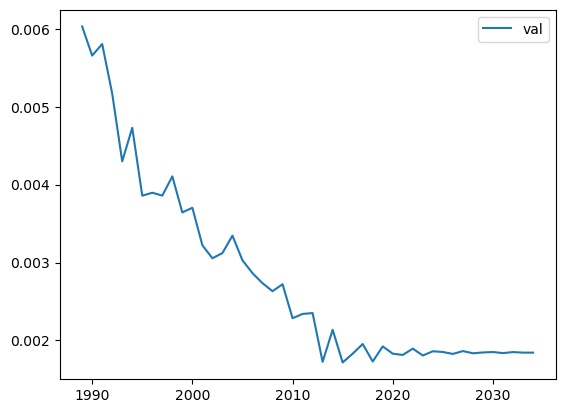

forecasting synnyttajien_keskiika


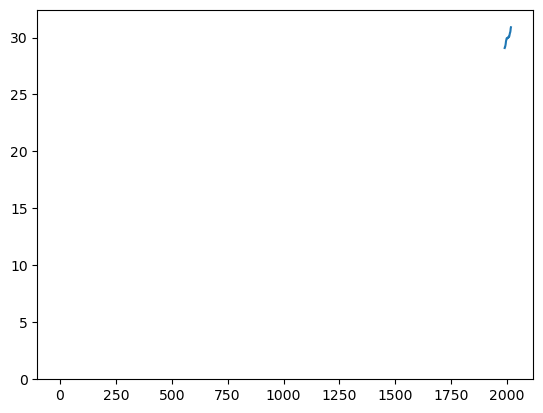

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:               SARIMAX(0, 0, 1)   Log Likelihood                 123.484
Date:                Wed, 01 Nov 2023   AIC                           -242.968
Time:                        23:05:22   BIC                           -240.376
Sample:                             0   HQIC                          -242.197
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.3649      0.176     -2.076      0.038      -0.709      -0.020
sigma2       6.19e-06   2.47e-06      2.507      0.012    1.35e-06     1.1e-05
Ljung-Box (L1) (Q):                   0.28   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27    0.001103
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

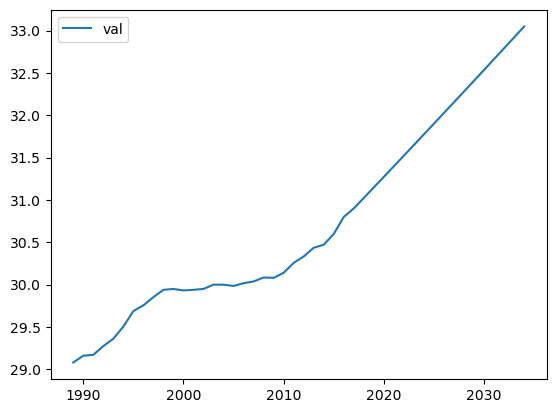

forecasting sisempikaupunki


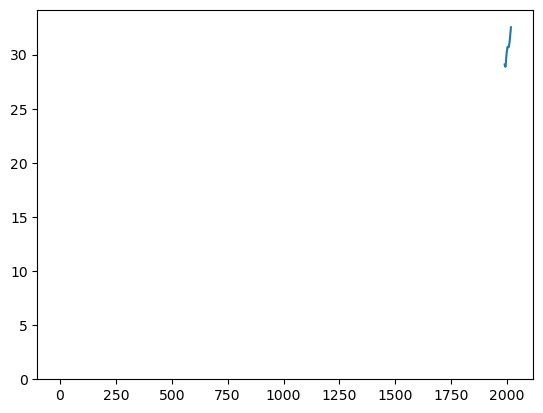

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:               SARIMAX(0, 0, 1)   Log Likelihood                 167.785
Date:                Wed, 01 Nov 2023   AIC                           -331.571
Time:                        23:05:23   BIC                           -328.979
Sample:                             0   HQIC                          -330.800
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.3320      0.235      1.410      0.159      -0.130       0.794
sigma2      2.314e-07   6.81e-08      3.395      0.001    9.78e-08    3.65e-07
Ljung-Box (L1) (Q):                   0.00   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27    0.000277
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

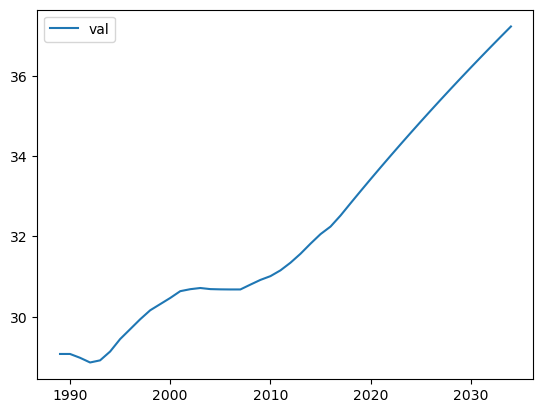

forecasting ulompikaupunki


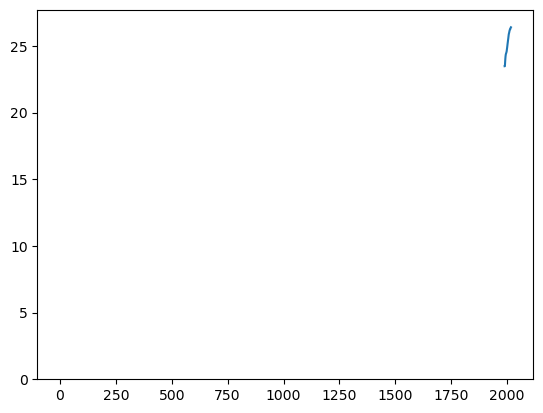

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:                        SARIMAX   Log Likelihood                 175.576
Date:                Wed, 01 Nov 2023   AIC                           -349.153
Time:                        23:05:24   BIC                           -347.857
Sample:                             0   HQIC                          -348.767
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1.316e-07   1.43e-08      9.188      0.000    1.04e-07     1.6e-07
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               158.85
Prob(Q):                              0.96   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27    0.0
28    0.0
29    0.0
30    0.0
31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

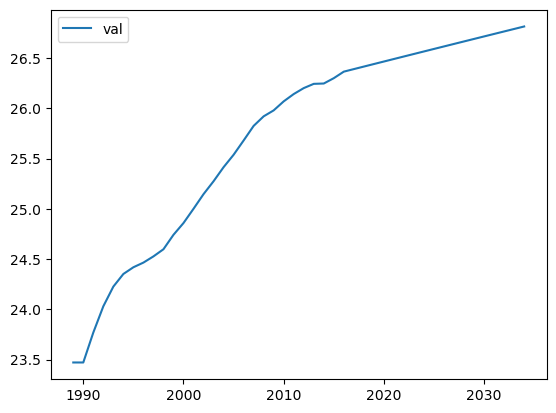

forecasting kehyskaupunki


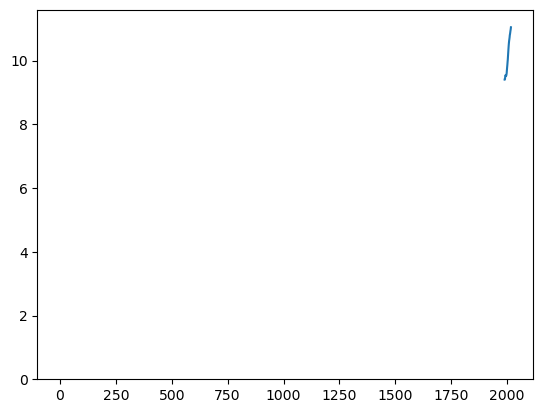

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:                        SARIMAX   Log Likelihood                 229.770
Date:                Wed, 01 Nov 2023   AIC                           -457.540
Time:                        23:05:25   BIC                           -456.244
Sample:                             0   HQIC                          -457.155
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      2.376e-09   9.16e-10      2.593      0.010     5.8e-10    4.17e-09
Ljung-Box (L1) (Q):                   0.07   Jarque-Bera (JB):                 0.16
Prob(Q):                              0.79   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27    0.0
28    0.0
29    0.0
30    0.0
31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

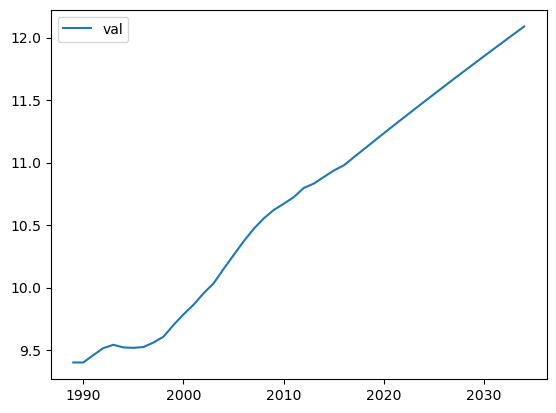

forecasting maaseudulla


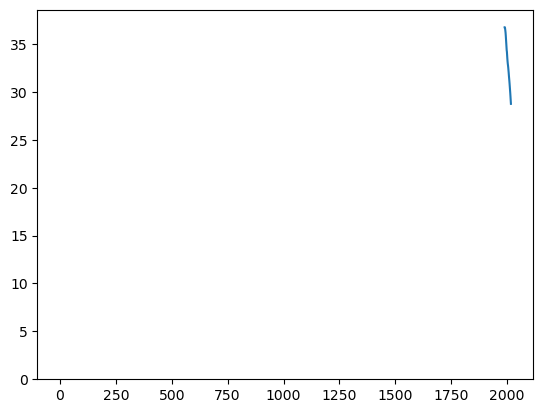

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:                        SARIMAX   Log Likelihood                 160.041
Date:                Wed, 01 Nov 2023   AIC                           -318.082
Time:                        23:05:26   BIC                           -316.787
Sample:                             0   HQIC                          -317.697
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      4.159e-07    7.9e-08      5.266      0.000    2.61e-07    5.71e-07
Ljung-Box (L1) (Q):                   0.65   Jarque-Bera (JB):                 5.87
Prob(Q):                              0.42   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27    0.0
28    0.0
29    0.0
30    0.0
31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

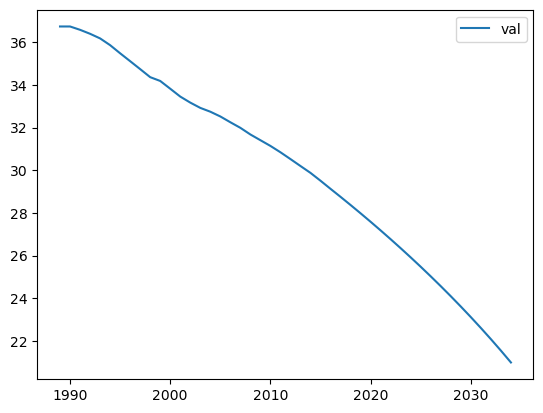

forecasting avioituvuus_naiset_30_34


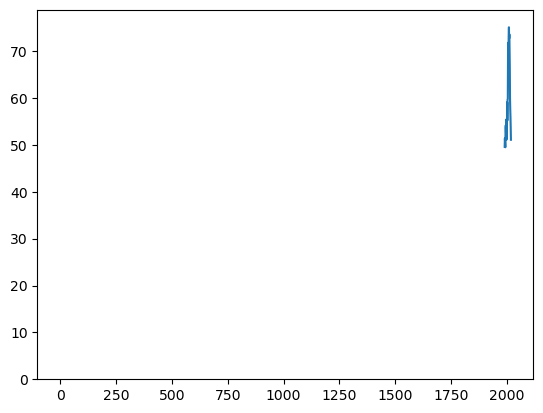

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  11.553
Date:                Wed, 01 Nov 2023   AIC                            -19.105
Time:                        23:05:27   BIC                            -16.514
Sample:                             0   HQIC                           -18.335
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7700      0.158     -4.881      0.000      -1.079      -0.461
sigma2         0.0241      0.007      3.322      0.001       0.010       0.038
Ljung-Box (L1) (Q):                   1.33   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27    0.014696
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

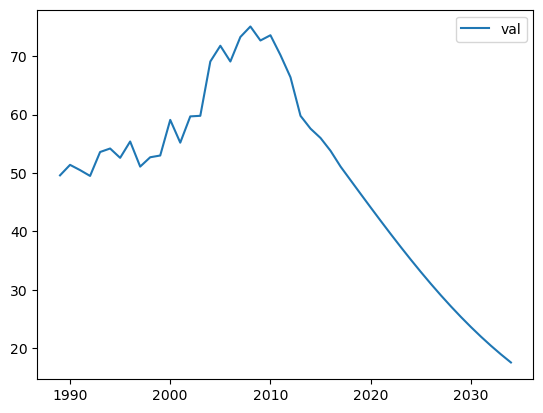

forecasting avioituvuus_naiset_25_29


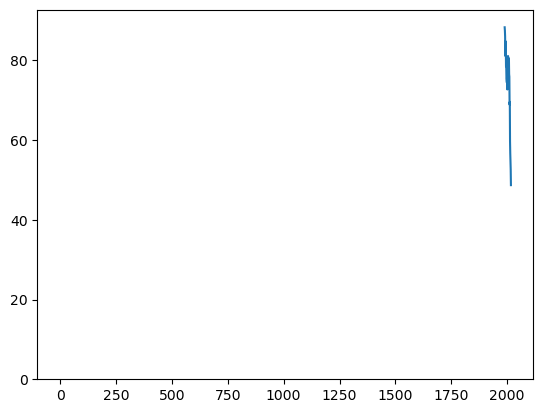

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:               SARIMAX(0, 0, 2)   Log Likelihood                   6.181
Date:                Wed, 01 Nov 2023   AIC                             -6.361
Time:                        23:05:28   BIC                             -2.474
Sample:                             0   HQIC                            -5.205
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.2149      0.218     -5.572      0.000      -1.642      -0.788
ma.L2          0.5850      0.196      2.987      0.003       0.201       0.969
sigma2         0.0347      0.013      2.683      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27    0.026320
28    0.046944
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

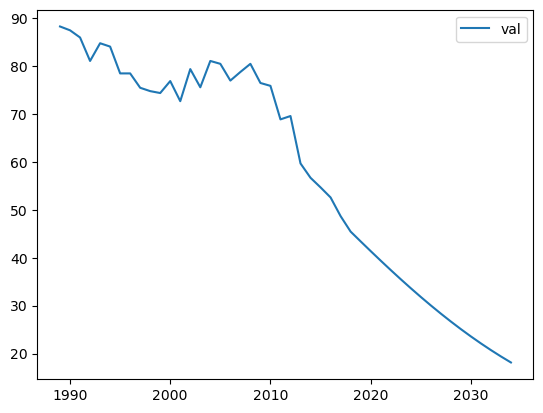

forecasting eronneisuus_25_29


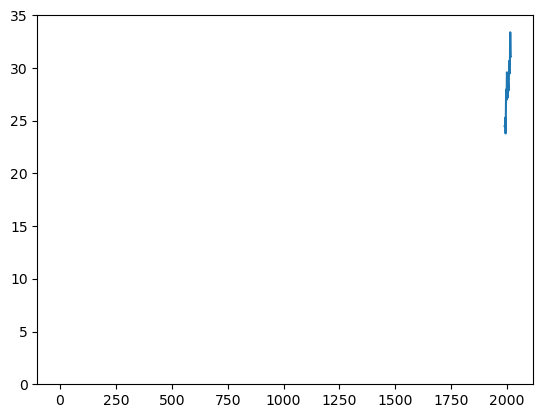

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:               SARIMAX(4, 0, 0)   Log Likelihood                  41.916
Date:                Wed, 01 Nov 2023   AIC                            -73.833
Time:                        23:05:29   BIC                            -67.354
Sample:                             0   HQIC                           -71.906
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9044      0.177     -5.114      0.000      -1.251      -0.558
ar.L2         -0.9651      0.240     -4.016      0.000      -1.436      -0.494
ar.L3         -0.8375      0.223     -3.747      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27    0.078982
28   -0.047664
29   -0.072327
30    0.022984
31    0.046561
32    0.021855
33   -0.045147
34   -0.031587
35    0.028855
36    0.030475
37   -0.004733
38   -0.032350
39   -0.007179
40    0.025327
41    0.013655
42   -0.013425
43   -0.018398
dtype: float64

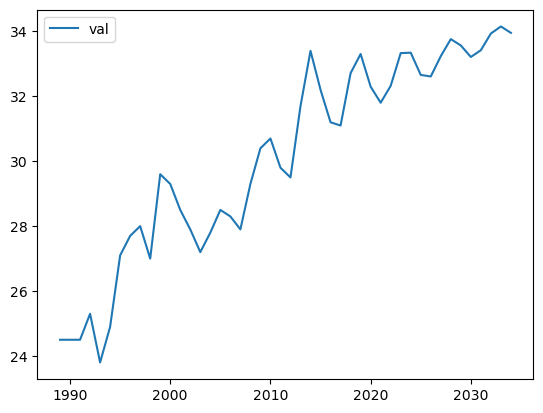

forecasting eronneisuus_30_34


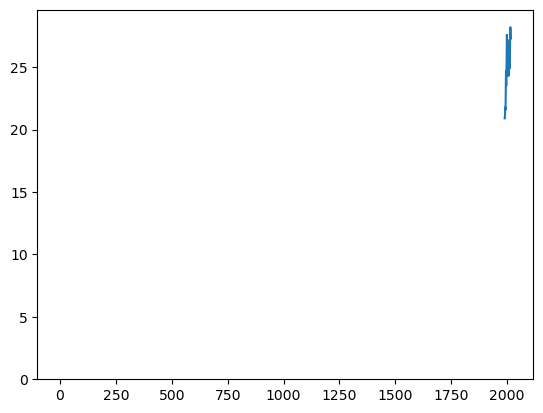

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:               SARIMAX(2, 0, 1)   Log Likelihood                  40.002
Date:                Wed, 01 Nov 2023   AIC                            -72.005
Time:                        23:05:30   BIC                            -66.821
Sample:                             0   HQIC                           -70.463
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0019      0.263     -0.007      0.994      -0.518       0.515
ar.L2         -0.2281      0.275     -0.830      0.407      -0.767       0.311
ma.L1         -0.9759      0.490     -1.991      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27    3.349465e-02
28   -5.715455e-03
29   -7.628924e-03
30    1.317870e-03
31    1.737575e-03
32   -3.038344e-04
33   -3.957458e-04
34    7.003983e-05
35    9.013253e-05
36   -1.614352e-05
37   -2.052765e-05
38    3.720465e-06
39    4.675081e-06
40   -8.573212e-07
41   -1.064710e-06
42    1.975323e-07
43    2.424746e-07
dtype: float64

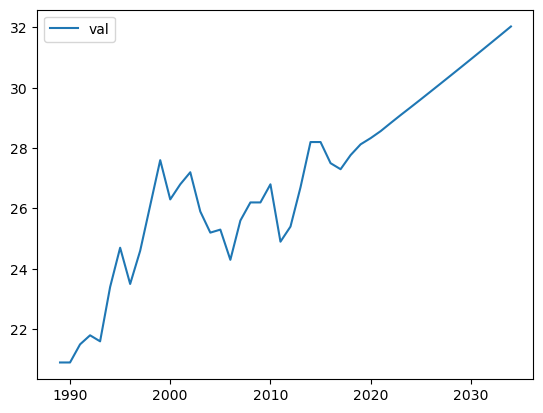

forecasting kolmasaste_miehet_25_29


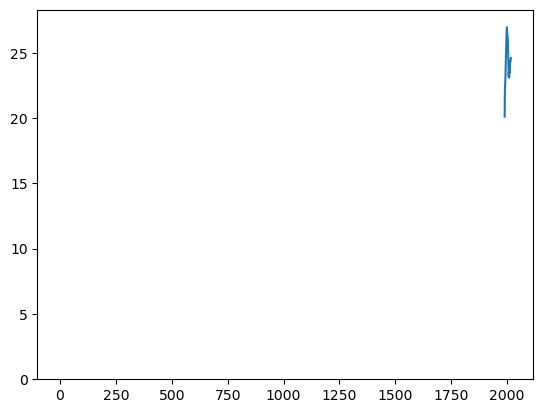

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  58.013
Date:                Wed, 01 Nov 2023   AIC                           -112.026
Time:                        23:05:31   BIC                           -109.434
Sample:                             0   HQIC                          -111.255
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5711      0.102     -5.612      0.000      -0.771      -0.372
sigma2         0.0008      0.000      4.924      0.000       0.000       0.001
Ljung-Box (L1) (Q):                   1.38   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27    2.810022e-03
28   -1.604777e-03
29    9.164730e-04
30   -5.233891e-04
31    2.989026e-04
32   -1.707004e-04
33    9.748541e-05
34   -5.567300e-05
35    3.179432e-05
36   -1.815744e-05
37    1.036954e-05
38   -5.921947e-06
39    3.381968e-06
40   -1.931410e-06
41    1.103010e-06
42   -6.299186e-07
43    3.597406e-07
dtype: float64

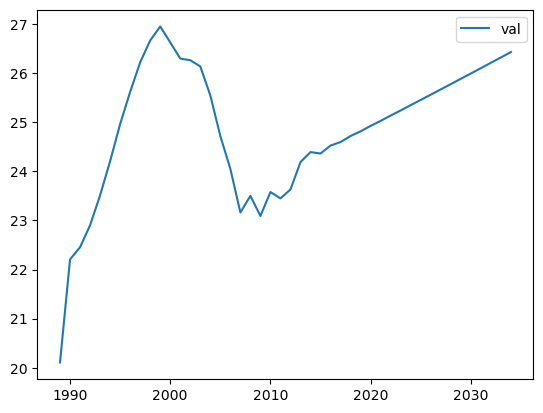

forecasting miehet_perusaste_25_29


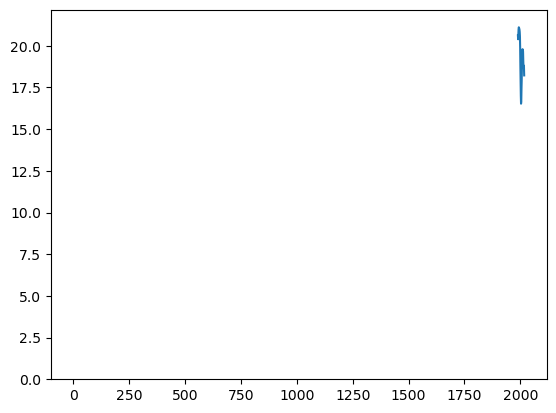

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  66.051
Date:                Wed, 01 Nov 2023   AIC                           -128.103
Time:                        23:05:32   BIC                           -125.511
Sample:                             0   HQIC                          -127.332
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.4489      0.143      3.143      0.002       0.169       0.729
sigma2         0.0004      0.000      2.420      0.016    8.28e-05       0.001
Ljung-Box (L1) (Q):                   0.13   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27   -0.009835
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

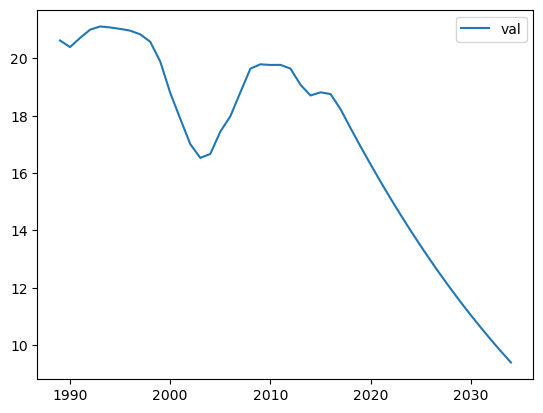

forecasting naiset_perusaste_25_29


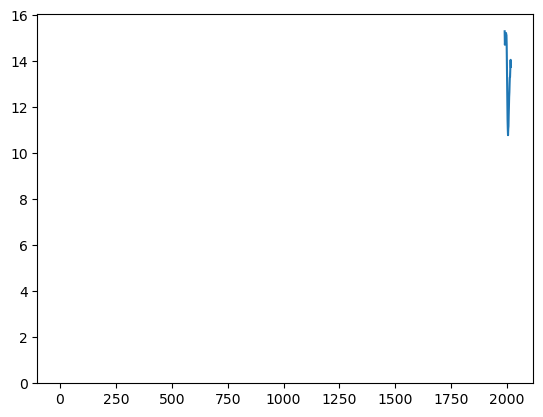

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:                        SARIMAX   Log Likelihood                  62.175
Date:                Wed, 01 Nov 2023   AIC                           -122.349
Time:                        23:05:33   BIC                           -121.053
Sample:                             0   HQIC                          -121.964
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0006      0.000      3.648      0.000       0.000       0.001
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                 2.26
Prob(Q):                              0.88   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27    0.0
28    0.0
29    0.0
30    0.0
31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

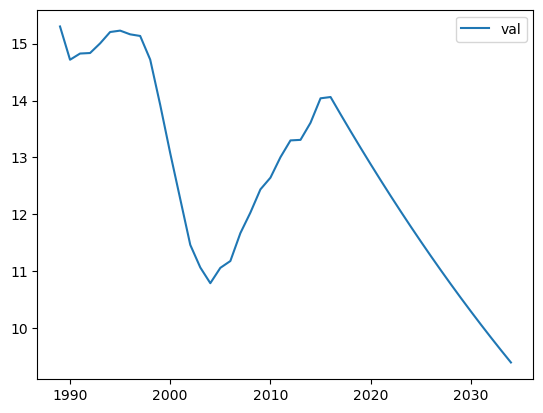

forecasting kolmasaste_naiset_25_29


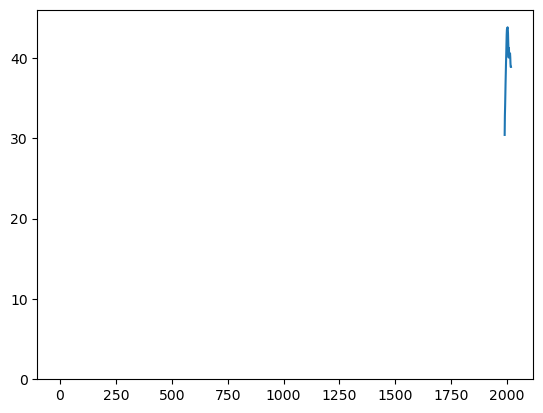

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  60.176
Date:                Wed, 01 Nov 2023   AIC                           -116.351
Time:                        23:05:34   BIC                           -113.760
Sample:                             0   HQIC                          -115.581
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5294      0.171     -3.089      0.002      -0.865      -0.194
sigma2         0.0007      0.000      5.439      0.000       0.000       0.001
Ljung-Box (L1) (Q):                   0.03   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27   -1.016675e-02
28    5.382397e-03
29   -2.849504e-03
30    1.508561e-03
31   -7.986496e-04
32    4.228144e-04
33   -2.238429e-04
34    1.185050e-04
35   -6.273795e-05
36    3.321420e-05
37   -1.758399e-05
38    9.309169e-06
39   -4.928383e-06
40    2.609143e-06
41   -1.381311e-06
42    7.312822e-07
43   -3.871493e-07
dtype: float64

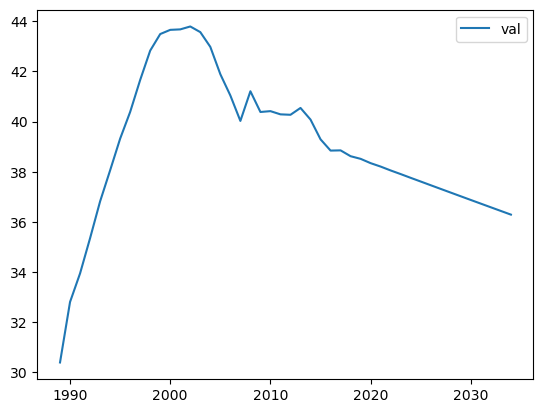

forecasting alypuhelin


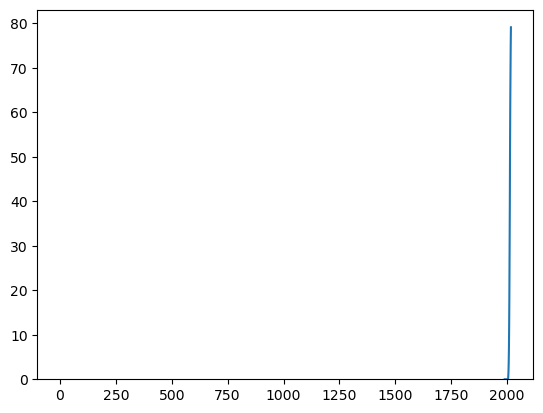

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:               SARIMAX(2, 1, 3)   Log Likelihood                  64.903
Date:                Wed, 01 Nov 2023   AIC                           -115.806
Time:                        23:05:36   BIC                           -106.999
Sample:                             0   HQIC                          -113.270
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0041      0.037      0.110      0.912      -0.069       0.077
ar.L1         -1.1930      1.066     -1.119      0.263      -3.282       0.896
ar.L2         -0.8496      0.317     -2.677      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27    0.026131
28    0.105655
29   -0.031142
30    0.068580
31    0.069904
32   -0.012319
33    0.088730
34    0.042107
35    0.015960
36    0.090842
37    0.027796
38    0.043473
39    0.082410
40    0.026715
41    0.064160
42    0.070881
43    0.035128
dtype: float64

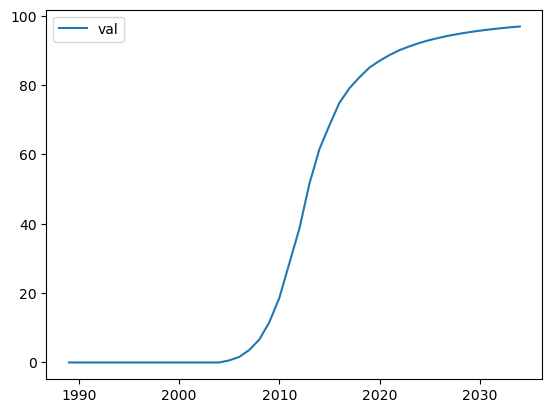

forecasting some_25_34


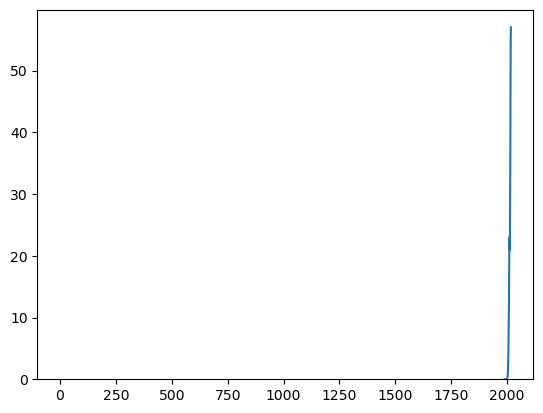

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:               SARIMAX(2, 0, 2)   Log Likelihood                  56.614
Date:                Wed, 01 Nov 2023   AIC                           -103.229
Time:                        23:05:37   BIC                            -96.749
Sample:                             0   HQIC                          -101.302
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0903      1.495      0.060      0.952      -2.840       3.020
ar.L2         -0.1610      1.682     -0.096      0.924      -3.458       3.136
ma.L1          0.1687      3.113      0.054      0.9

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:1346: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum
/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27   -7.617053e-02
28    6.723747e-02
29    1.833389e-02
30   -9.166319e-03
31   -3.778994e-03
32    1.134036e-03
33    7.106990e-04
34   -1.183347e-04
35   -1.250822e-04
36    7.748185e-06
37    2.083293e-05
38    6.347186e-07
39   -3.295899e-06
40   -3.998843e-07
41    4.943807e-07
42    1.090225e-07
43   -6.972663e-08
dtype: float64

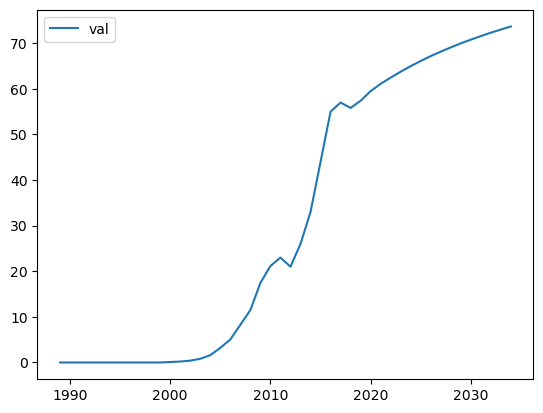

forecasting some_35_44


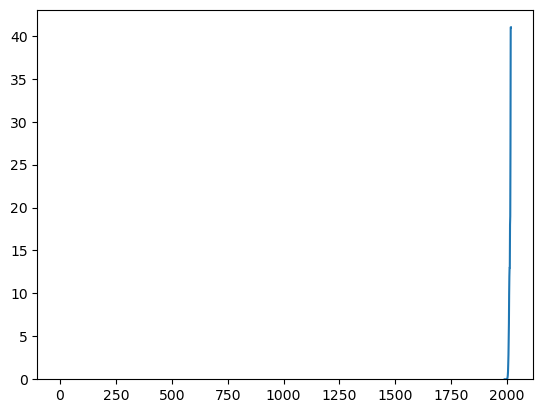

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:               SARIMAX(2, 0, 2)   Log Likelihood                  66.309
Date:                Wed, 01 Nov 2023   AIC                           -122.618
Time:                        23:05:38   BIC                           -116.139
Sample:                             0   HQIC                          -120.691
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3398      1.701     -0.200      0.842      -3.675       2.995
ar.L2         -0.7342      0.522     -1.406      0.160      -1.758       0.289
ma.L1          0.1929      1.997      0.097      0.9

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:1346: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum
/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27   -0.072458
28    0.140846
29    0.005335
30   -0.105224
31    0.031843
32    0.066436
33   -0.045957
34   -0.033160
35    0.045012
36    0.009050
37   -0.036124
38    0.005632
39    0.024609
40   -0.012498
41   -0.013821
42    0.013873
43    0.005433
dtype: float64

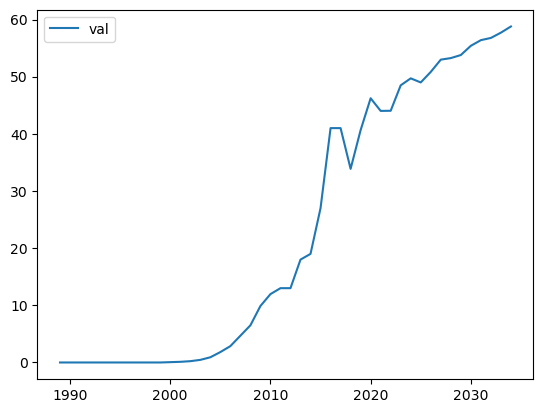

forecasting työttömyys_miehet_25_34


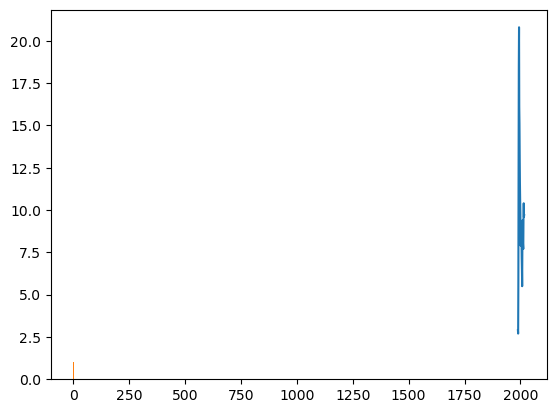

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:               SARIMAX(4, 0, 0)   Log Likelihood                  -0.247
Date:                Wed, 01 Nov 2023   AIC                             10.494
Time:                        23:05:39   BIC                             16.973
Sample:                             0   HQIC                            12.420
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3281      0.313     -1.049      0.294      -0.941       0.285
ar.L2         -0.2581      0.216     -1.194      0.233      -0.682       0.166
ar.L3         -0.4553      0.214     -2.128      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27   -0.063136
28    0.158176
29    0.014833
30   -0.071216
31   -0.018355
32   -0.067857
33    0.051408
34    0.047502
35    0.011967
36   -0.002912
37   -0.051552
38   -0.013462
39    0.012579
40    0.024395
41    0.022748
42   -0.012209
43   -0.019772
dtype: float64

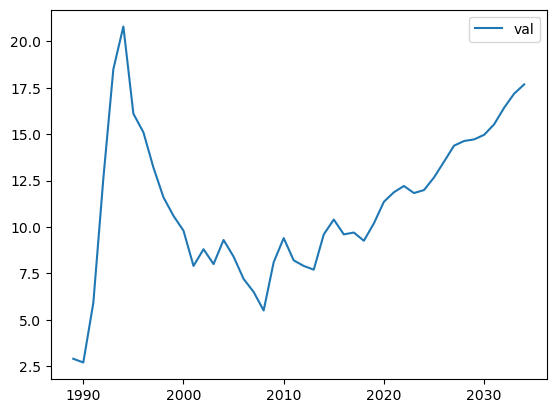

forecasting työttömyys_naiset_25_34


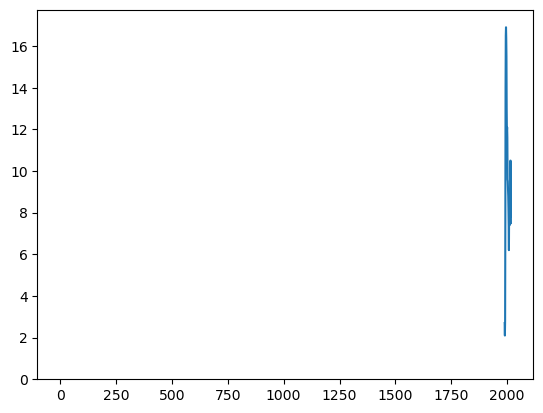

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  -0.059
Date:                Wed, 01 Nov 2023   AIC                              6.118
Time:                        23:05:40   BIC                             10.005
Sample:                             0   HQIC                             7.274
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.2909      0.270     -1.077      0.282      -0.820       0.239
ma.L2         -0.6020      0.274     -2.201      0.028      -1.138      -0.066
sigma2         0.0553      0.021      2.578      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27    0.234614
28    0.053342
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

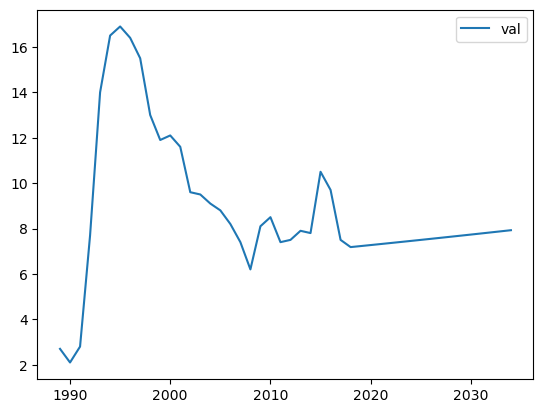

forecasting työllisyysaste_miehet_25_34


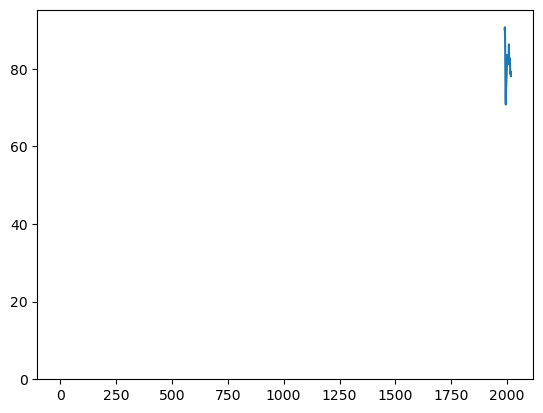

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:               SARIMAX(0, 0, 1)   Log Likelihood                   7.276
Date:                Wed, 01 Nov 2023   AIC                            -10.552
Time:                        23:05:41   BIC                             -7.960
Sample:                             0   HQIC                            -9.781
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6181      0.218     -2.831      0.005      -1.046      -0.190
sigma2         0.0336      0.008      4.220      0.000       0.018       0.049
Ljung-Box (L1) (Q):                   2.01   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27    0.03396
28    0.00000
29    0.00000
30    0.00000
31    0.00000
32    0.00000
33    0.00000
34    0.00000
35    0.00000
36    0.00000
37    0.00000
38    0.00000
39    0.00000
40    0.00000
41    0.00000
42    0.00000
43    0.00000
dtype: float64

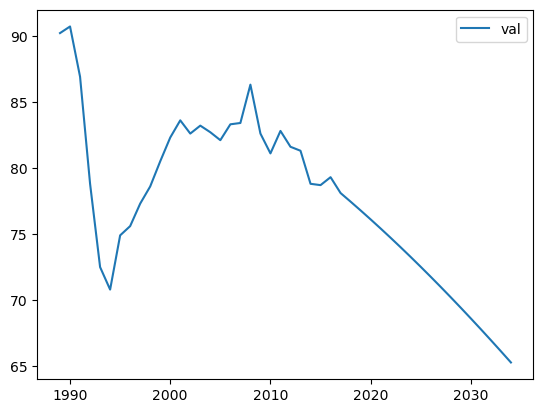

forecasting työllisyysaste_naiset_25_34


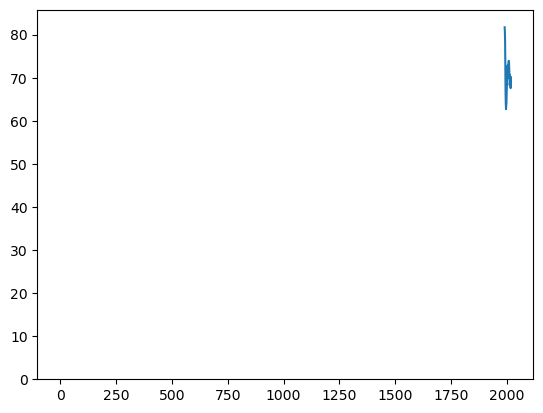

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  21.711
Date:                Wed, 01 Nov 2023   AIC                            -39.421
Time:                        23:05:42   BIC                            -36.829
Sample:                             0   HQIC                           -38.650
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5415      0.183     -2.957      0.003      -0.900      -0.183
sigma2         0.0116      0.005      2.527      0.011       0.003       0.021
Ljung-Box (L1) (Q):                   0.09   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27   -0.076931
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

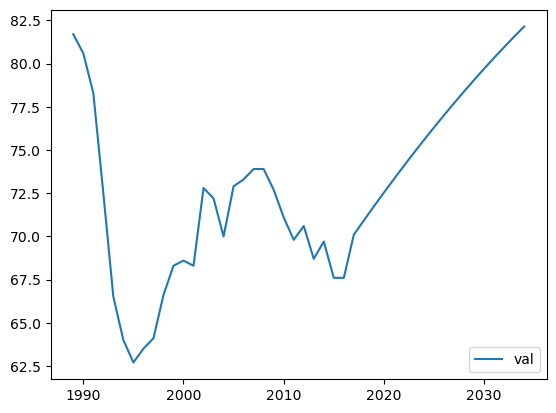

forecasting työttömyys_miehet_35_44


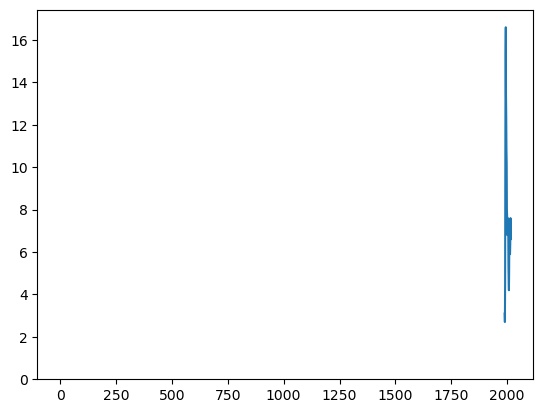

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:               SARIMAX(3, 0, 0)   Log Likelihood                   1.624
Date:                Wed, 01 Nov 2023   AIC                              4.752
Time:                        23:05:43   BIC                              9.935
Sample:                             0   HQIC                             6.293
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0607      0.176     -0.344      0.731      -0.406       0.285
ar.L2         -0.2063      0.182     -1.133      0.257      -0.563       0.151
ar.L3         -0.6434      0.177     -3.636      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27   -0.011223
28    0.157546
29   -0.193411
30   -0.013545
31   -0.060640
32    0.130910
33    0.013280
34    0.011202
35   -0.087644
36   -0.005537
37    0.011209
38    0.056850
39   -0.002199
40   -0.018806
41   -0.034981
42    0.007417
43    0.018866
dtype: float64

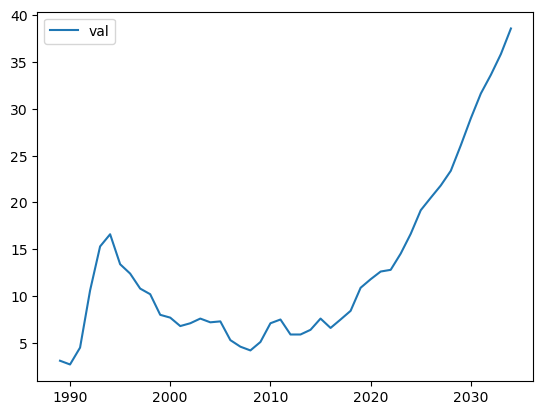

forecasting työttömyys_naiset_35_44


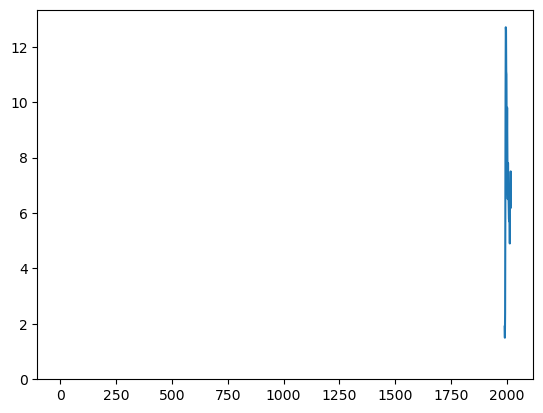

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  -1.266
Date:                Wed, 01 Nov 2023   AIC                              8.532
Time:                        23:05:44   BIC                             12.419
Sample:                             0   HQIC                             9.688
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.3721      0.293     -1.270      0.204      -0.947       0.202
ma.L2         -0.5557      0.263     -2.110      0.035      -1.072      -0.040
sigma2         0.0600      0.024      2.543      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27    0.071244
28    0.150657
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

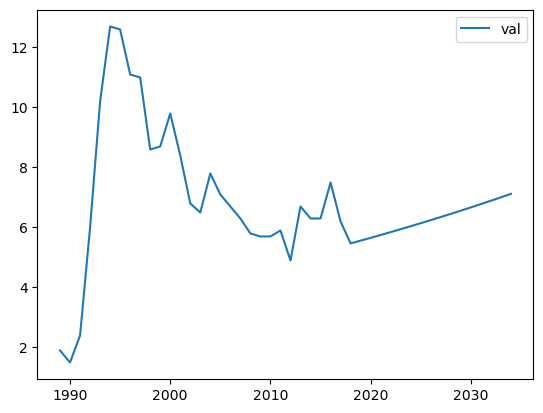

forecasting työllisyysaste_miehet_35_44


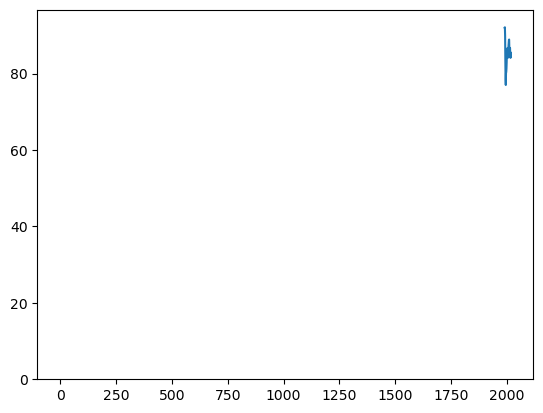

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:               SARIMAX(0, 0, 1)   Log Likelihood                   9.467
Date:                Wed, 01 Nov 2023   AIC                            -14.934
Time:                        23:05:45   BIC                            -12.342
Sample:                             0   HQIC                           -14.164
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5964      0.237     -2.512      0.012      -1.062      -0.131
sigma2         0.0286      0.007      3.952      0.000       0.014       0.043
Ljung-Box (L1) (Q):                   1.69   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27    0.049945
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

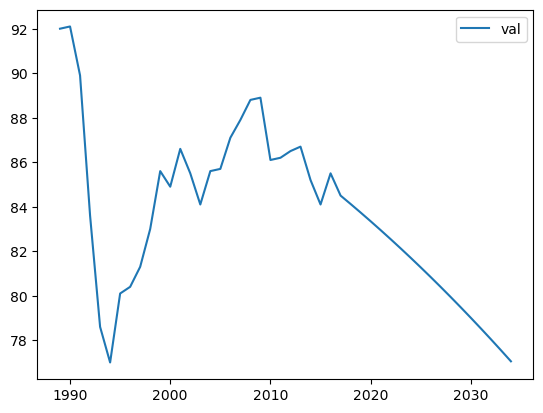

forecasting työllisyysaste_naiset_35_44


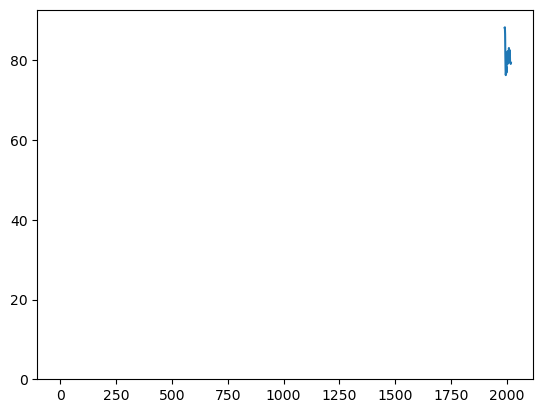

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  18.286
Date:                Wed, 01 Nov 2023   AIC                            -32.572
Time:                        23:05:46   BIC                            -29.981
Sample:                             0   HQIC                           -31.802
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7471      0.175     -4.265      0.000      -1.090      -0.404
sigma2         0.0147      0.004      3.331      0.001       0.006       0.023
Ljung-Box (L1) (Q):                   0.81   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27   -0.031086
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

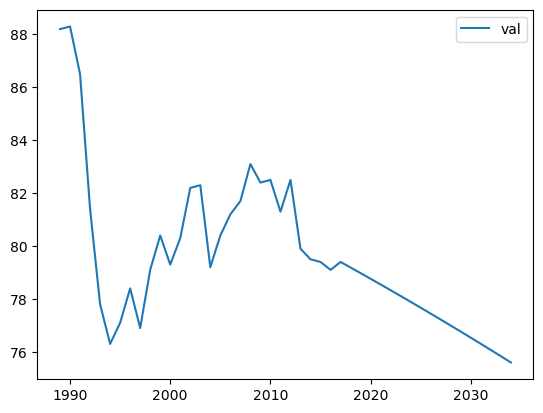

forecasting ei_aviossa_30_34


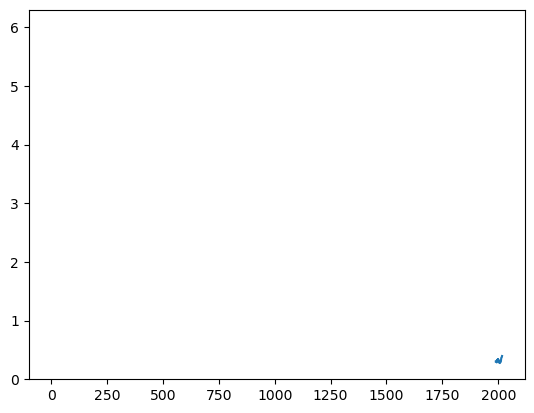

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  41.652
Date:                Wed, 01 Nov 2023   AIC                            -79.304
Time:                        23:05:47   BIC                            -76.712
Sample:                             0   HQIC                           -78.533
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8385      0.192     -4.365      0.000      -1.215      -0.462
sigma2         0.0026      0.001      3.357      0.001       0.001       0.004
Ljung-Box (L1) (Q):                   0.79   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27   -0.017853
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

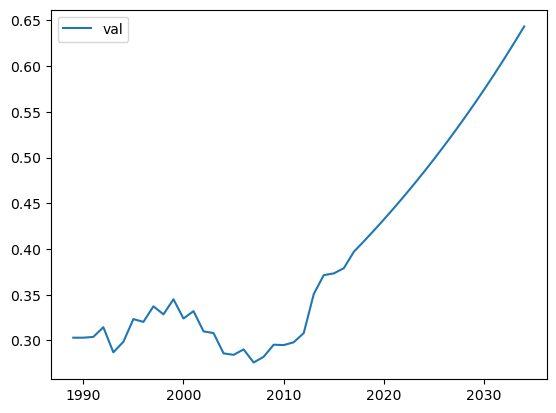

forecasting parittomia_30_34


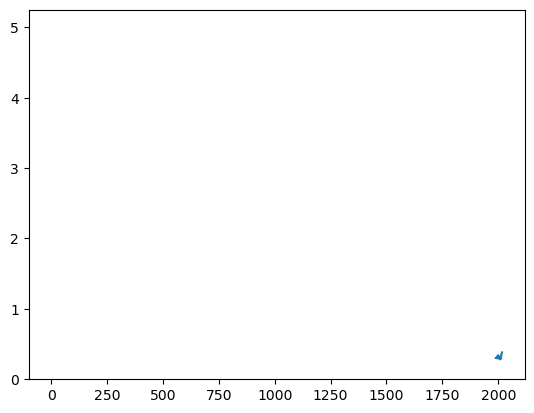

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   27
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  51.439
Date:                Wed, 01 Nov 2023   AIC                            -98.879
Time:                        23:05:48   BIC                            -96.287
Sample:                             0   HQIC                           -98.108
                                 - 27                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6244      0.150     -4.168      0.000      -0.918      -0.331
sigma2         0.0013      0.000      2.754      0.006       0.000       0.002
Ljung-Box (L1) (Q):                   0.12   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

27    0.000889
28    0.000000
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

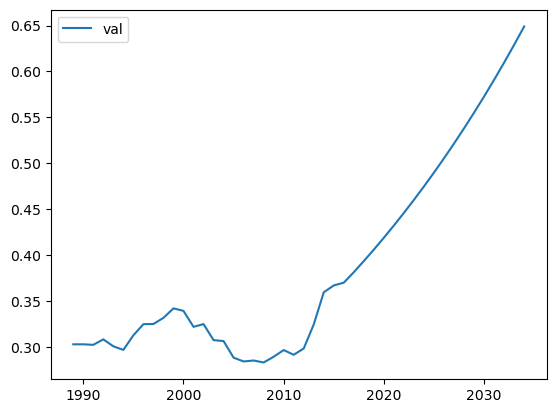

       hedelmallisyysluku  pienituloisuus_miehet_18_29  \
vuosi                                                    
1989             1.710000                     9.400000   
1990             1.782000                     7.900000   
1991             1.794000                    10.900000   
1992             1.847000                    13.500000   
1993             1.813000                    12.700000   
1994             1.847000                    14.200000   
1995             1.807000                    15.900000   
1996             1.764000                    19.300000   
1997             1.746000                    18.200000   
1998             1.700000                    17.900000   
1999             1.735000                    18.200000   
2000             1.729000                    16.700000   
2001             1.726000                    19.200000   
2002             1.718000                    21.000000   
2003             1.760000                    21.100000   
2004          

forecasting hedelmallisyysluku


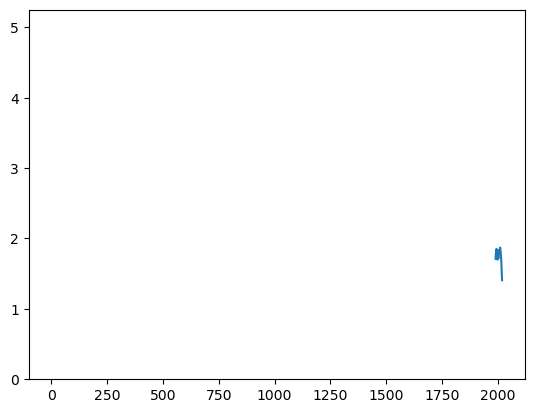

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  73.070
Date:                Wed, 01 Nov 2023   AIC                           -142.139
Time:                        23:05:49   BIC                           -139.475
Sample:                             0   HQIC                          -141.325
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6430      0.159     -4.044      0.000      -0.955      -0.331
sigma2         0.0003   9.55e-05      3.255      0.001       0.000       0.000
Ljung-Box (L1) (Q):                   0.01   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28    0.003618
29   -0.002327
30    0.001496
31   -0.000962
32    0.000619
33   -0.000398
34    0.000256
35   -0.000164
36    0.000106
37   -0.000068
38    0.000044
39   -0.000028
40    0.000018
41   -0.000012
42    0.000007
43   -0.000005
dtype: float64

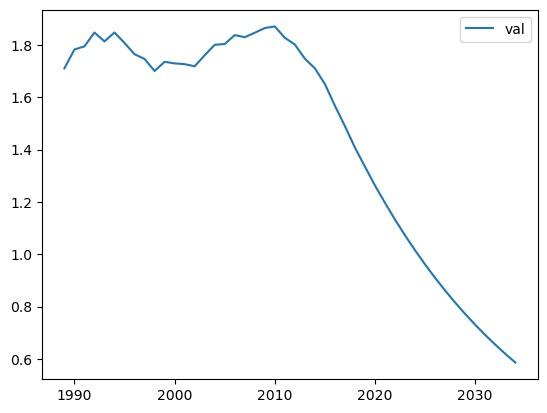

forecasting pienituloisuus_miehet_18_29


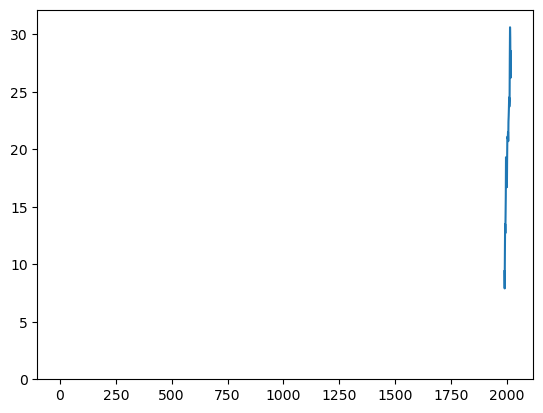

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:               SARIMAX(2, 0, 2)   Log Likelihood                  99.263
Date:                Wed, 01 Nov 2023   AIC                           -188.526
Time:                        23:05:51   BIC                           -181.865
Sample:                             0   HQIC                          -186.490
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7228      0.369      1.958      0.050      -0.001       1.446
ar.L2         -0.7091      0.170     -4.174      0.000      -1.042      -0.376
ma.L1         -1.5524      0.370     -4.191      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28    0.001389
29   -0.011011
30   -0.008943
31    0.001343
32    0.007312
33    0.004333
34   -0.002053
35   -0.004556
36   -0.001837
37    0.001903
38    0.002678
39    0.000586
40   -0.001475
41   -0.001482
42   -0.000025
43    0.001033
dtype: float64

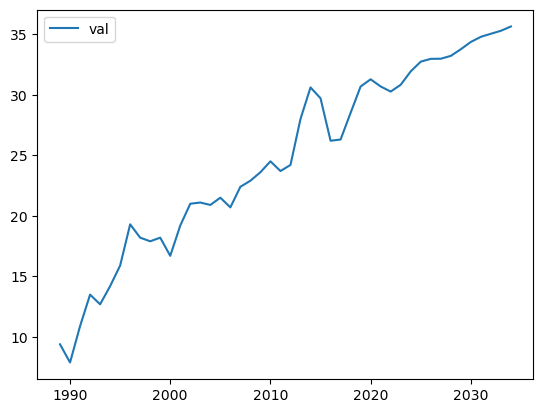

forecasting pienituloisuus_naiset_18_29


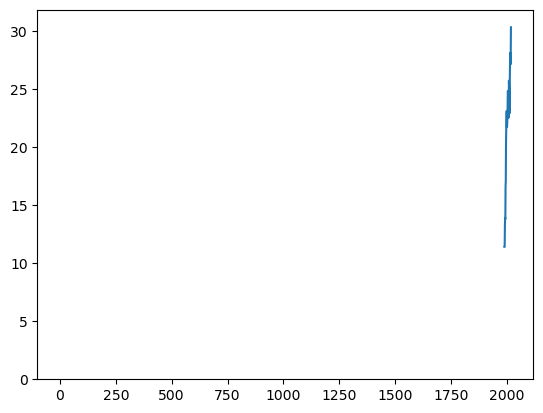

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:               SARIMAX(4, 0, 0)   Log Likelihood                 105.075
Date:                Wed, 01 Nov 2023   AIC                           -200.149
Time:                        23:05:52   BIC                           -193.488
Sample:                             0   HQIC                          -198.113
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6900      0.235     -2.940      0.003      -1.150      -0.230
ar.L2         -0.6261      0.249     -2.518      0.012      -1.113      -0.139
ar.L3         -0.8478      0.161     -5.263      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28   -0.004356
29   -0.009777
30   -0.007294
31    0.008295
32    0.009151
33   -0.000793
34   -0.008835
35   -0.005010
36    0.005420
37    0.007255
38   -0.000057
39   -0.006776
40   -0.003951
41    0.003655
42    0.005723
43    0.000252
dtype: float64

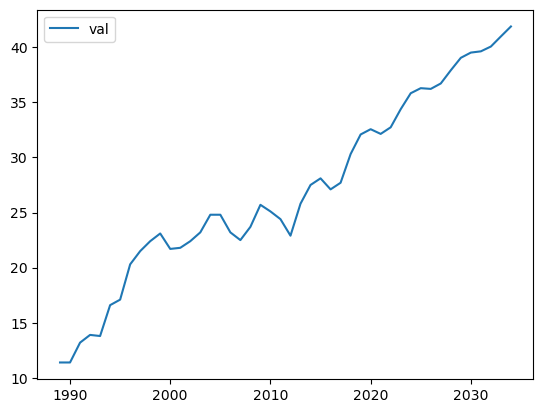

forecasting lapsikuolleisuus


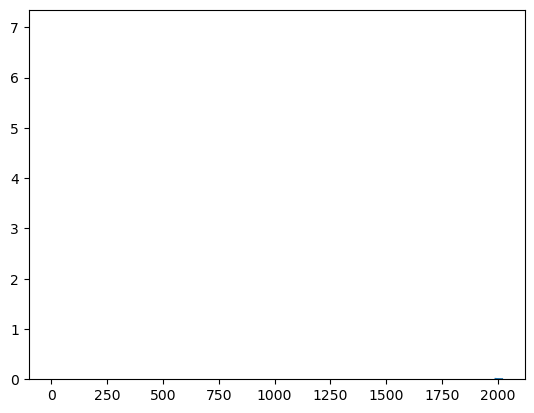

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  24.474
Date:                Wed, 01 Nov 2023   AIC                            -42.948
Time:                        23:05:53   BIC                            -38.951
Sample:                             0   HQIC                           -41.726
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.6584      0.373     -4.451      0.000      -2.389      -0.928
ma.L2          0.6738      0.266      2.534      0.011       0.153       1.195
sigma2         0.0085      0.005      1.801      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28   -0.188275
29    0.112703
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

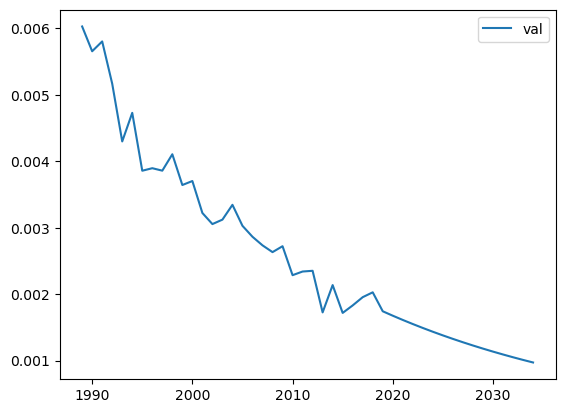

forecasting synnyttajien_keskiika


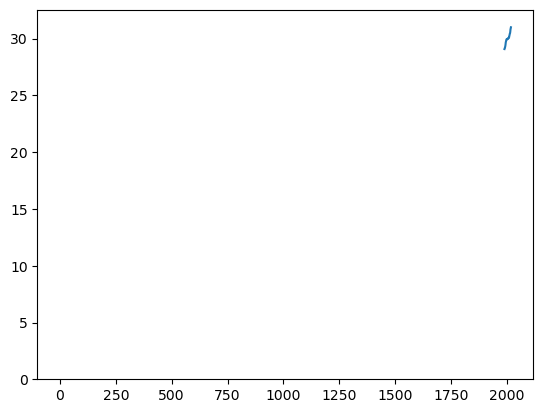

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:               SARIMAX(1, 0, 2)   Log Likelihood                 130.992
Date:                Wed, 01 Nov 2023   AIC                           -253.984
Time:                        23:05:54   BIC                           -248.655
Sample:                             0   HQIC                          -252.355
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5103      0.404     -1.264      0.206      -1.302       0.281
ma.L1          0.3204      0.650      0.493      0.622      -0.954       1.595
ma.L2         -0.6077      0.336     -1.808      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28    5.415589e-04
29    2.448164e-05
30   -1.249258e-05
31    6.374761e-06
32   -3.252936e-06
33    1.659920e-06
34   -8.470303e-07
35    4.322257e-07
36   -2.205577e-07
37    1.125470e-07
38   -5.743091e-08
39    2.930606e-08
40   -1.495440e-08
41    7.630988e-09
42   -3.893969e-09
43    1.987029e-09
dtype: float64

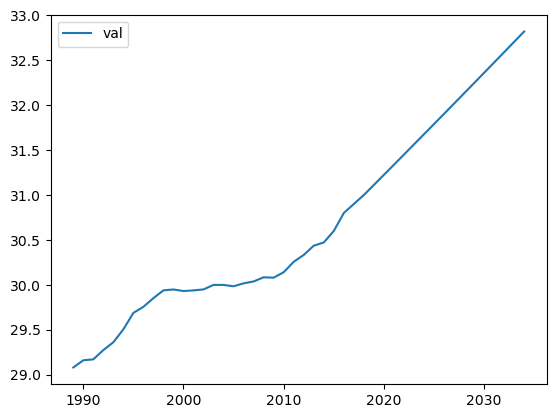

forecasting sisempikaupunki


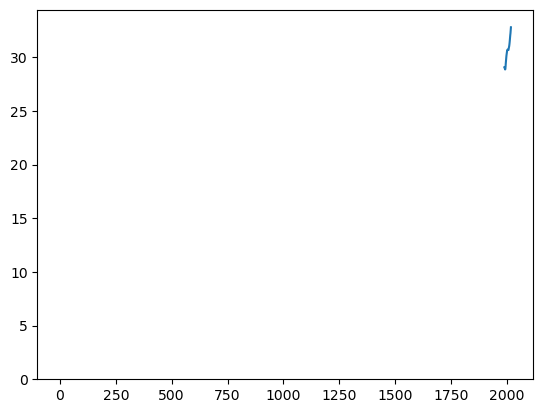

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:               SARIMAX(0, 0, 1)   Log Likelihood                 174.351
Date:                Wed, 01 Nov 2023   AIC                           -344.703
Time:                        23:05:55   BIC                           -342.039
Sample:                             0   HQIC                          -343.888
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.2990      0.222      1.344      0.179      -0.137       0.735
sigma2      2.269e-07   6.42e-08      3.533      0.000    1.01e-07    3.53e-07
Ljung-Box (L1) (Q):                   0.01   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28   -0.000065
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

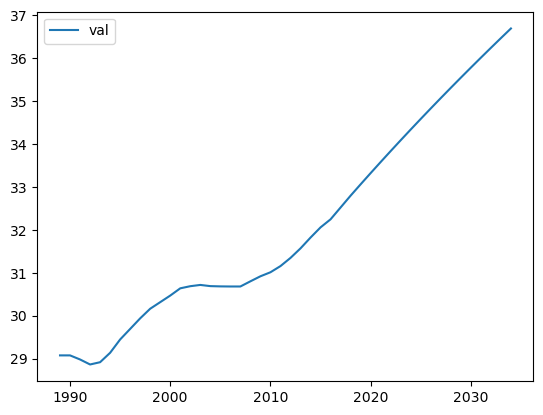

forecasting ulompikaupunki


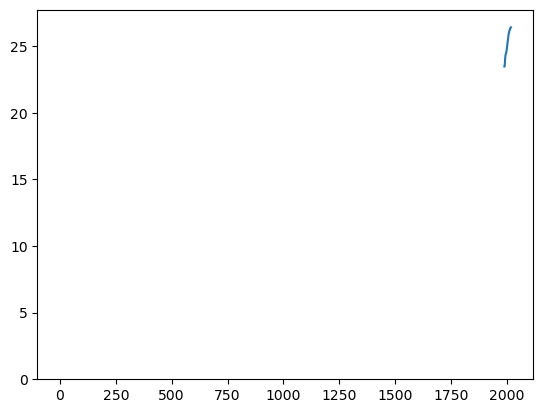

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:                        SARIMAX   Log Likelihood                 182.588
Date:                Wed, 01 Nov 2023   AIC                           -363.177
Time:                        23:05:56   BIC                           -361.844
Sample:                             0   HQIC                          -362.769
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1.269e-07   1.33e-08      9.542      0.000    1.01e-07    1.53e-07
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               178.62
Prob(Q):                              0.96   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28    0.0
29    0.0
30    0.0
31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

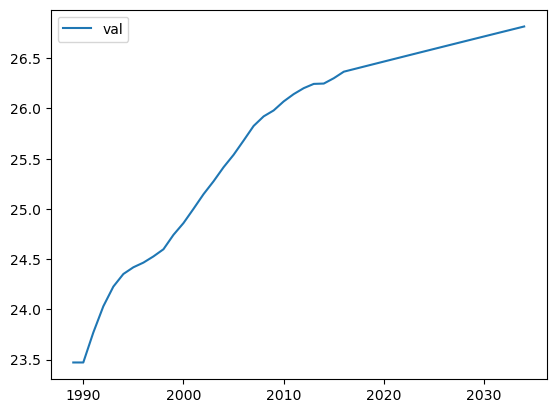

forecasting kehyskaupunki


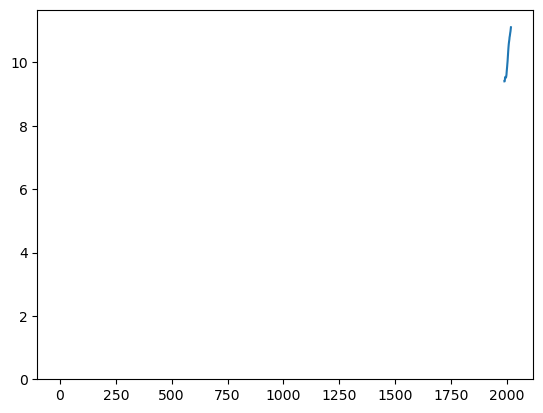

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:                        SARIMAX   Log Likelihood                 238.789
Date:                Wed, 01 Nov 2023   AIC                           -475.578
Time:                        23:05:56   BIC                           -474.246
Sample:                             0   HQIC                          -475.171
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      2.291e-09   8.61e-10      2.661      0.008    6.04e-10    3.98e-09
Ljung-Box (L1) (Q):                   0.08   Jarque-Bera (JB):                 0.15
Prob(Q):                              0.77   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28    0.0
29    0.0
30    0.0
31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

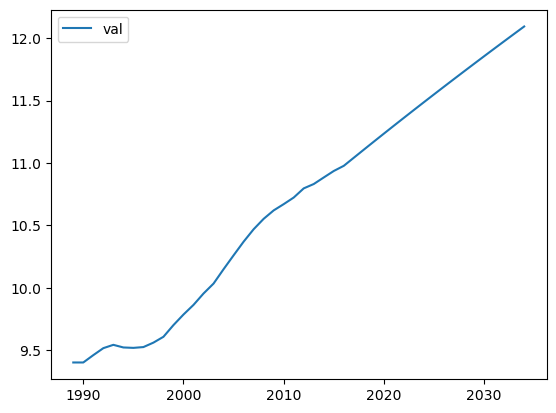

forecasting maaseudulla


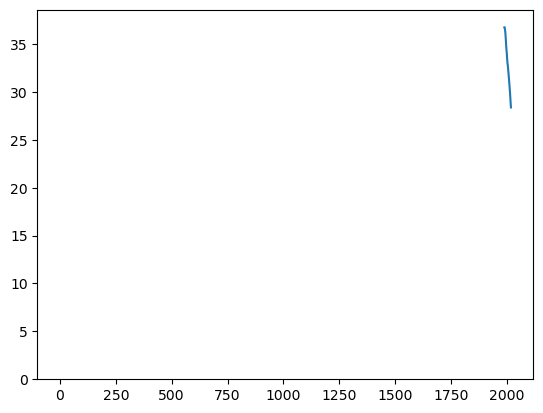

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:                        SARIMAX   Log Likelihood                 166.475
Date:                Wed, 01 Nov 2023   AIC                           -330.950
Time:                        23:05:57   BIC                           -329.618
Sample:                             0   HQIC                          -330.543
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      4.011e-07   7.32e-08      5.483      0.000    2.58e-07    5.45e-07
Ljung-Box (L1) (Q):                   0.66   Jarque-Bera (JB):                 7.01
Prob(Q):                              0.42   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28    0.0
29    0.0
30    0.0
31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

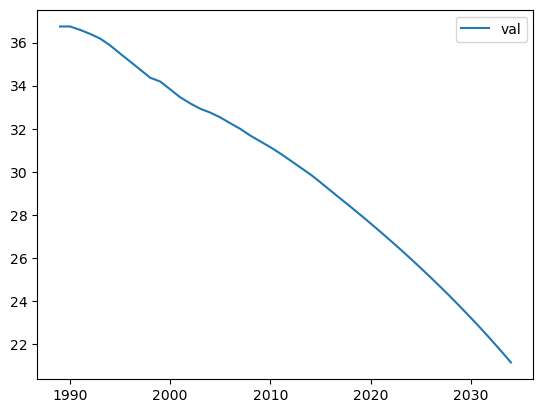

forecasting avioituvuus_naiset_30_34


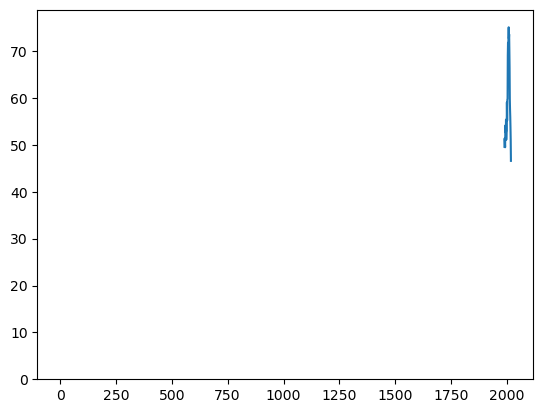

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  13.375
Date:                Wed, 01 Nov 2023   AIC                            -20.749
Time:                        23:05:58   BIC                            -16.753
Sample:                             0   HQIC                           -19.528
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9483      0.264     -3.589      0.000      -1.466      -0.430
ma.L2          0.3253      0.262      1.239      0.215      -0.189       0.840
sigma2         0.0218      0.006      3.500      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28    0.083633
29   -0.026071
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

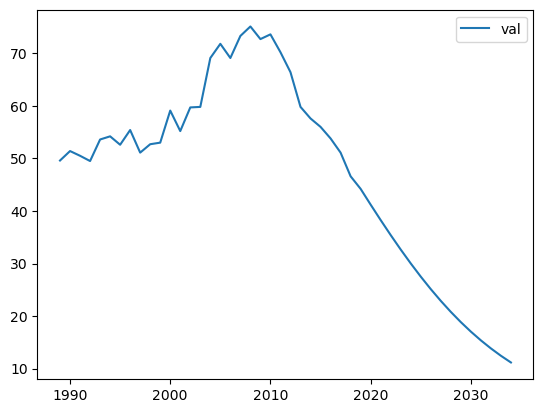

forecasting avioituvuus_naiset_25_29


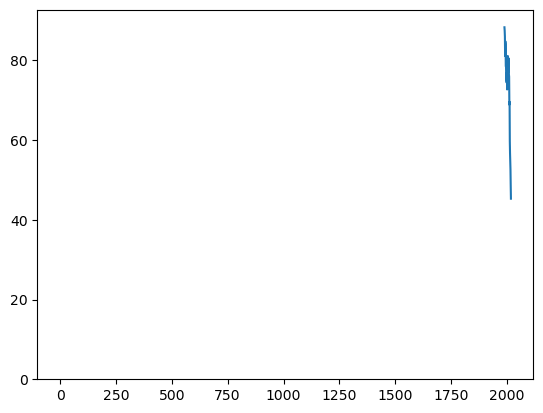

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:               SARIMAX(0, 0, 2)   Log Likelihood                   6.950
Date:                Wed, 01 Nov 2023   AIC                             -7.900
Time:                        23:05:59   BIC                             -3.904
Sample:                             0   HQIC                            -6.678
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.2181      0.210     -5.798      0.000      -1.630      -0.806
ma.L2          0.5873      0.188      3.117      0.002       0.218       0.957
sigma2         0.0335      0.012      2.829      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28    0.055077
29   -0.003475
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

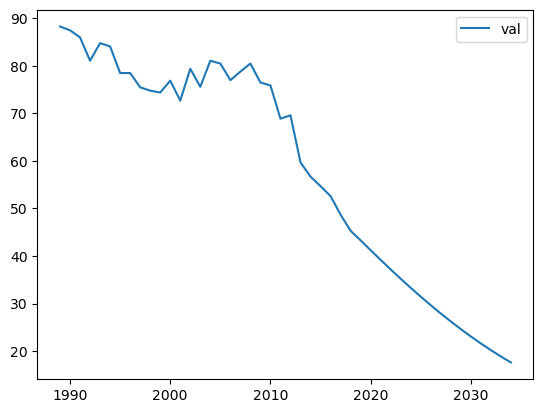

forecasting eronneisuus_25_29


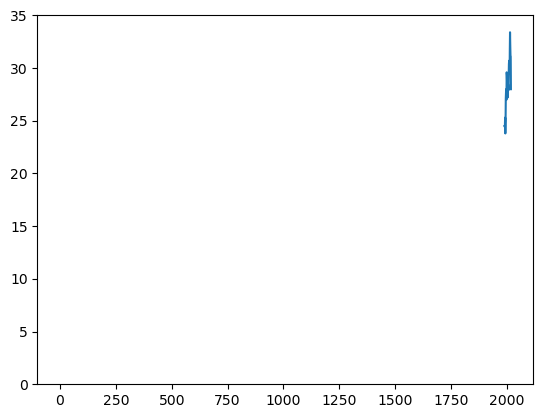

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:               SARIMAX(0, 0, 3)   Log Likelihood                  37.546
Date:                Wed, 01 Nov 2023   AIC                            -67.092
Time:                        23:06:00   BIC                            -61.763
Sample:                             0   HQIC                           -65.462
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8723      0.406     -2.151      0.031      -1.667      -0.077
ma.L2         -0.3406      0.309     -1.103      0.270      -0.946       0.265
ma.L3          0.2636      0.321      0.822      0.4

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28    0.145672
29    0.050212
30   -0.044566
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

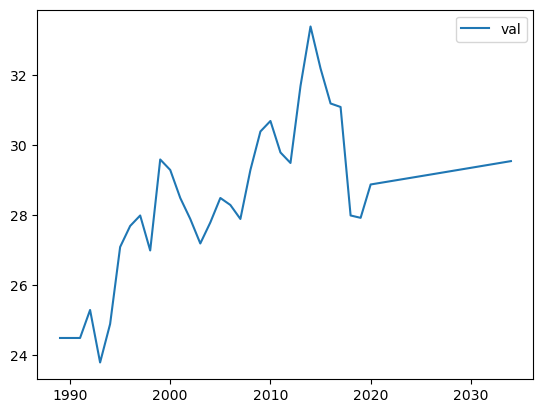

forecasting eronneisuus_30_34


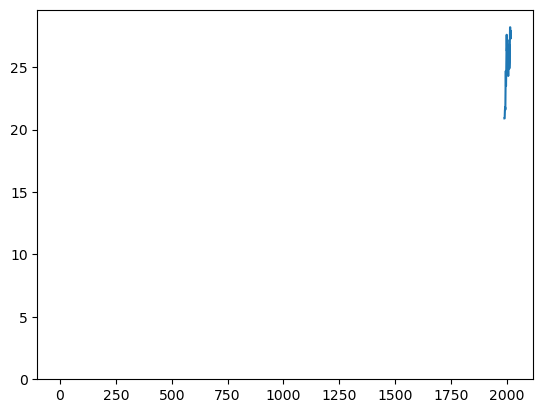

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:               SARIMAX(2, 0, 2)   Log Likelihood                  42.079
Date:                Wed, 01 Nov 2023   AIC                            -74.158
Time:                        23:06:01   BIC                            -67.497
Sample:                             0   HQIC                           -72.122
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2352      0.702     -0.335      0.738      -1.612       1.141
ar.L2         -0.2308      0.261     -0.884      0.377      -0.742       0.281
ma.L1         -0.7375      0.876     -0.842      0.4

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28   -1.376001e-02
29   -7.936502e-03
30    5.042133e-03
31    6.457964e-04
32   -1.315527e-03
33    1.603503e-04
34    2.658917e-04
35   -9.953972e-05
36   -3.795362e-05
37    3.189830e-05
38    1.257160e-06
39   -7.657300e-06
40    1.510737e-06
41    1.411887e-06
42   -6.807072e-07
43   -1.657507e-07
dtype: float64

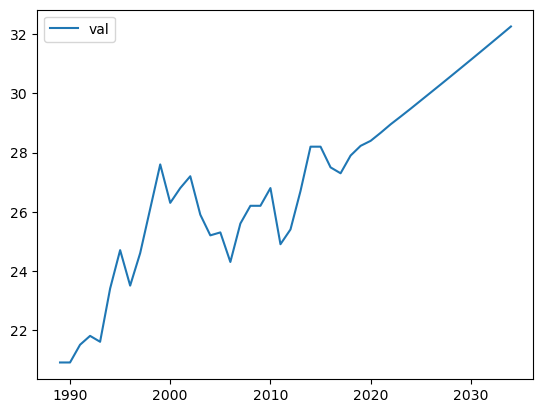

forecasting kolmasaste_miehet_25_29


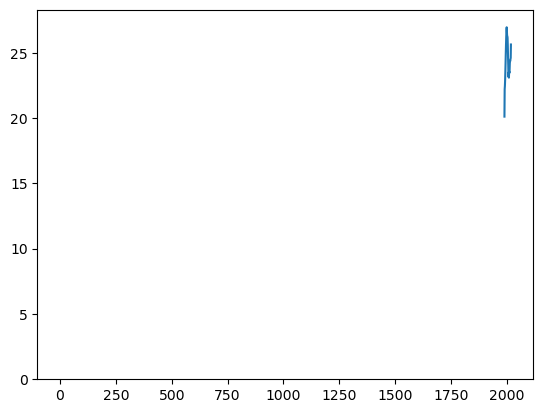

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  59.213
Date:                Wed, 01 Nov 2023   AIC                           -114.427
Time:                        23:06:03   BIC                           -111.762
Sample:                             0   HQIC                          -113.612
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5826      0.105     -5.524      0.000      -0.789      -0.376
sigma2         0.0008      0.000      4.684      0.000       0.000       0.001
Ljung-Box (L1) (Q):                   1.29   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28   -0.029819
29    0.017373
30   -0.010122
31    0.005897
32   -0.003436
33    0.002002
34   -0.001166
35    0.000680
36   -0.000396
37    0.000231
38   -0.000134
39    0.000078
40   -0.000046
41    0.000027
42   -0.000015
43    0.000009
dtype: float64

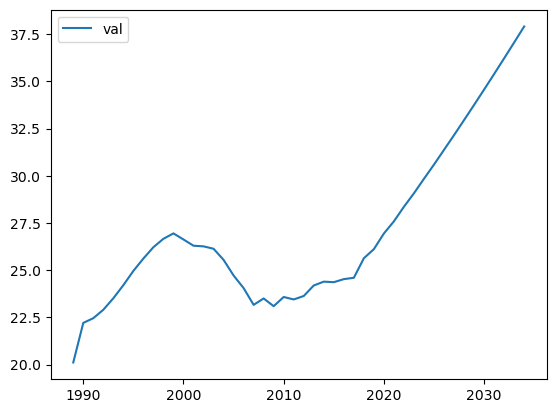

forecasting miehet_perusaste_25_29


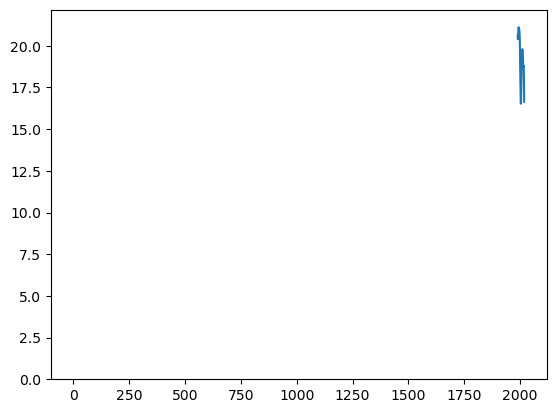

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  64.748
Date:                Wed, 01 Nov 2023   AIC                           -125.496
Time:                        23:06:04   BIC                           -122.831
Sample:                             0   HQIC                          -124.681
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.4889      0.171      2.861      0.004       0.154       0.824
sigma2         0.0006      0.000      3.678      0.000       0.000       0.001
Ljung-Box (L1) (Q):                   0.00   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28   -0.031528
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

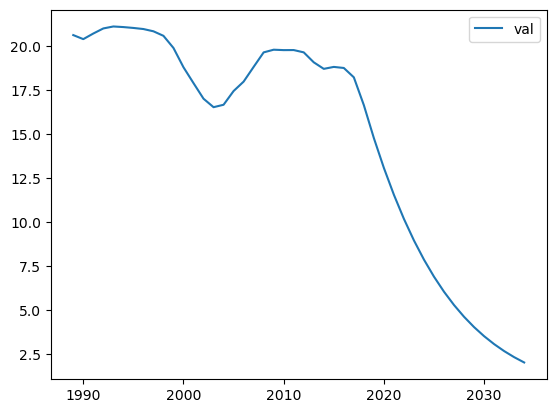

forecasting naiset_perusaste_25_29


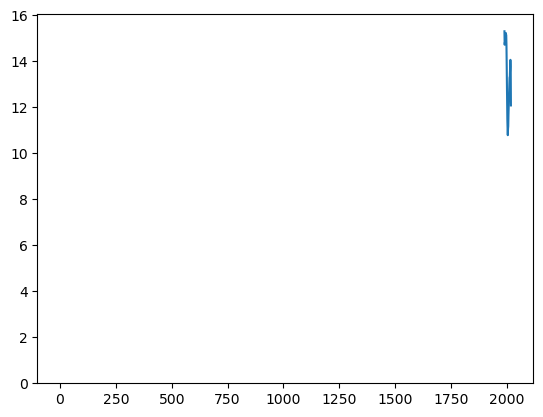

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  58.291
Date:                Wed, 01 Nov 2023   AIC                           -110.582
Time:                        23:06:05   BIC                           -106.586
Sample:                             0   HQIC                          -109.360
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.1368      0.171      0.799      0.425      -0.199       0.473
ma.L2          0.5363      0.184      2.921      0.003       0.176       0.896
sigma2         0.0009      0.000      2.902      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28   -0.030365
29   -0.048651
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

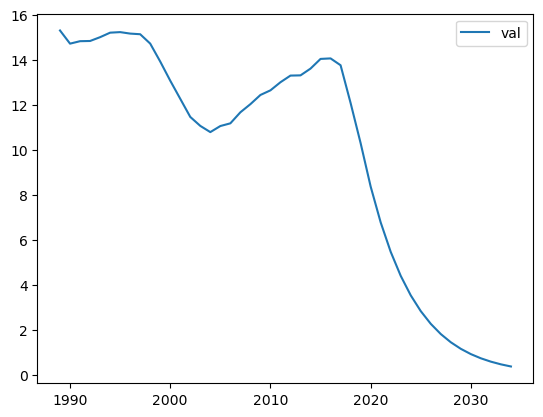

forecasting kolmasaste_naiset_25_29


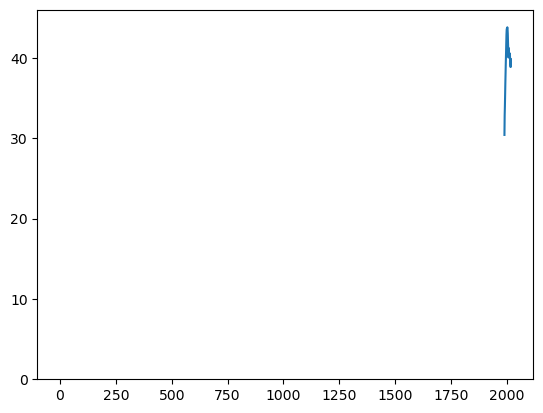

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  61.129
Date:                Wed, 01 Nov 2023   AIC                           -118.257
Time:                        23:06:06   BIC                           -115.593
Sample:                             0   HQIC                          -117.443
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4841      0.175     -2.764      0.006      -0.827      -0.141
sigma2         0.0007      0.000      5.221      0.000       0.000       0.001
Ljung-Box (L1) (Q):                   0.02   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28   -1.936376e-02
29    9.374482e-03
30   -4.538421e-03
31    2.197163e-03
32   -1.063702e-03
33    5.149646e-04
34   -2.493072e-04
35    1.206959e-04
36   -5.843189e-05
37    2.828834e-05
38   -1.369509e-05
39    6.630136e-06
40   -3.209815e-06
41    1.553952e-06
42   -7.523068e-07
43    3.642106e-07
dtype: float64

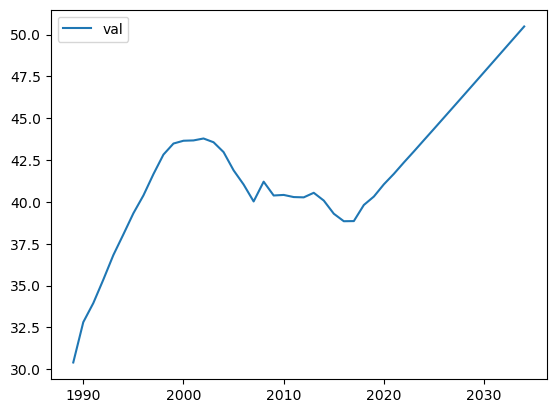

forecasting alypuhelin


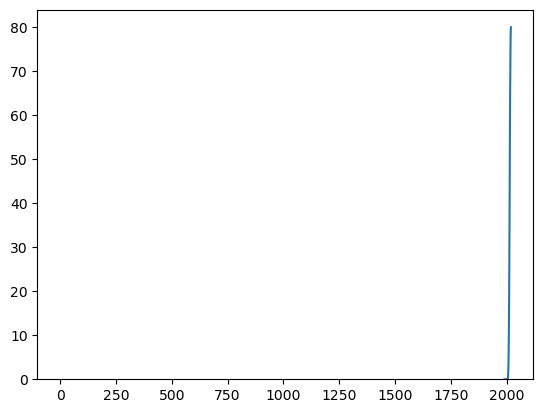

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:               SARIMAX(1, 0, 3)   Log Likelihood                  48.831
Date:                Wed, 01 Nov 2023   AIC                            -87.661
Time:                        23:06:07   BIC                            -81.000
Sample:                             0   HQIC                           -85.625
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5096      1.233      0.413      0.679      -1.907       2.926
ma.L1          0.7353      2.537      0.290      0.772      -4.237       5.708
ma.L2         -0.8591      3.711     -0.232      0.8

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:1346: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum
/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28   -0.209935
29    0.011694
30    0.066774
31    0.034026
32    0.017339
33    0.008835
34    0.004502
35    0.002294
36    0.001169
37    0.000596
38    0.000304
39    0.000155
40    0.000079
41    0.000040
42    0.000020
43    0.000010
dtype: float64

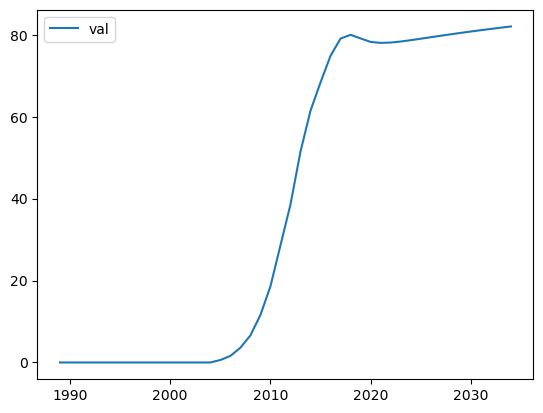

forecasting some_25_34


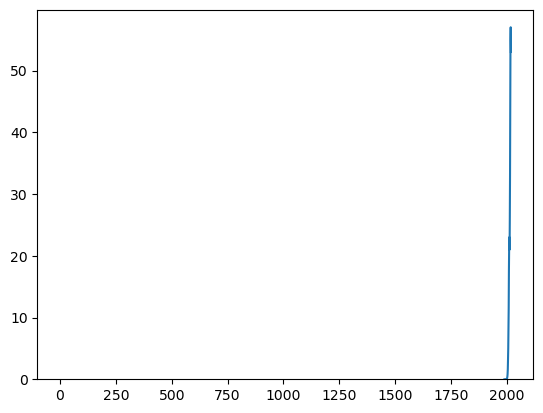

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:               SARIMAX(2, 0, 2)   Log Likelihood                  58.729
Date:                Wed, 01 Nov 2023   AIC                           -107.459
Time:                        23:06:08   BIC                           -100.797
Sample:                             0   HQIC                          -105.422
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4038      0.564      0.716      0.474      -0.702       1.510
ar.L2         -0.4205      0.872     -0.482      0.630      -2.131       1.290
ma.L1         -0.0293      0.476     -0.062      0.9

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:1346: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum
/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28    0.053991
29    0.087893
30    0.012785
31   -0.031798
32   -0.018216
33    0.006017
34    0.010090
35    0.001544
36   -0.003619
37   -0.002111
38    0.000670
39    0.001158
40    0.000186
41   -0.000412
42   -0.000245
43    0.000074
dtype: float64

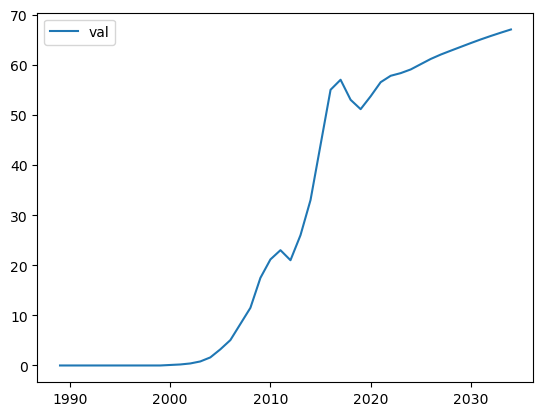

forecasting some_35_44


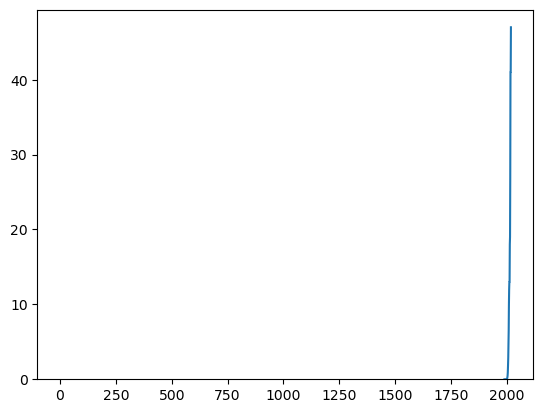

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:               SARIMAX(2, 0, 0)   Log Likelihood                  65.720
Date:                Wed, 01 Nov 2023   AIC                           -125.441
Time:                        23:06:09   BIC                           -121.444
Sample:                             0   HQIC                          -124.219
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9188      0.168     -5.459      0.000      -1.249      -0.589
ar.L2         -0.5584      0.303     -1.842      0.065      -1.153       0.036
sigma2         0.0005   8.12e-05      6.325      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:1346: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum
/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28   -0.005919
29   -0.040055
30    0.040108
31   -0.014483
32   -0.009091
33    0.016441
34   -0.010029
35    0.000034
36    0.005570
37   -0.005136
38    0.001609
39    0.001390
40   -0.002176
41    0.001223
42    0.000091
43   -0.000767
dtype: float64

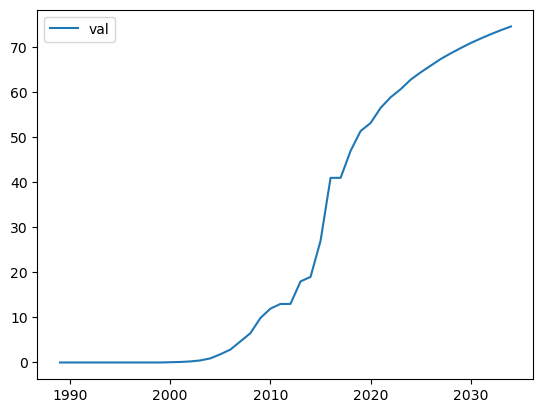

forecasting työttömyys_miehet_25_34


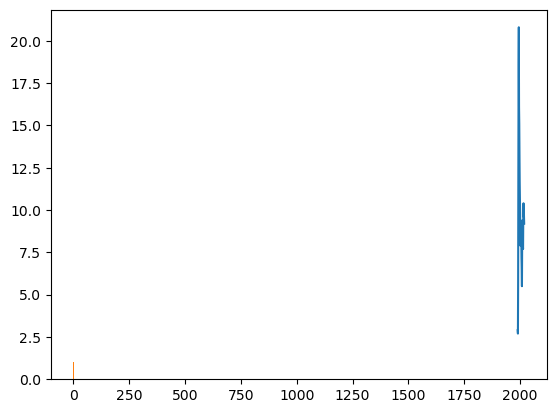

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:               SARIMAX(4, 0, 0)   Log Likelihood                   0.289
Date:                Wed, 01 Nov 2023   AIC                              9.422
Time:                        23:06:10   BIC                             16.083
Sample:                             0   HQIC                            11.459
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3287      0.301     -1.093      0.275      -0.918       0.261
ar.L2         -0.2576      0.209     -1.235      0.217      -0.666       0.151
ar.L3         -0.4573      0.205     -2.226      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28    0.161561
29    0.015985
30   -0.069654
31   -0.016988
32   -0.071880
33    0.051140
34    0.047463
35    0.013361
36   -0.000811
37   -0.052768
38   -0.014439
39    0.011427
40    0.024539
41    0.024368
42   -0.011683
43   -0.019892
dtype: float64

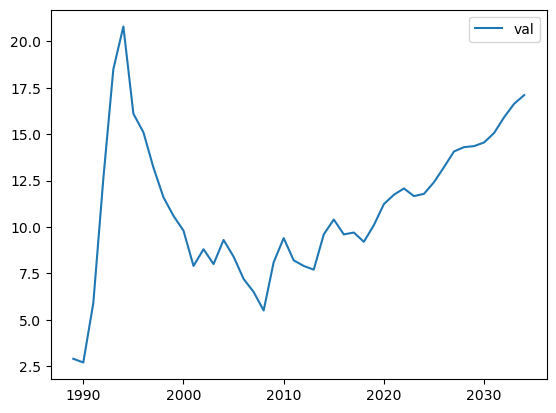

forecasting työttömyys_naiset_25_34


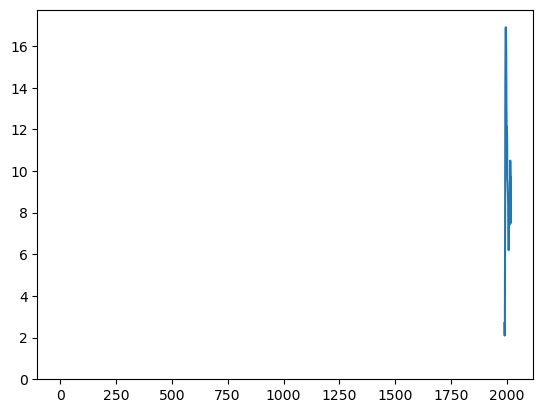

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:               SARIMAX(2, 0, 0)   Log Likelihood                  -1.198
Date:                Wed, 01 Nov 2023   AIC                              8.397
Time:                        23:06:11   BIC                             12.394
Sample:                             0   HQIC                             9.619
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0770      0.191     -0.402      0.688      -0.452       0.298
ar.L2         -0.6743      0.135     -4.997      0.000      -0.939      -0.410
sigma2         0.0611      0.018      3.376      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28    0.086948
29   -0.386072
30   -0.028919
31    0.262573
32   -0.000707
33   -0.177011
34    0.014101
35    0.118282
36   -0.018612
37   -0.078331
38    0.018580
39    0.051392
40   -0.016485
41   -0.033387
42    0.013686
43    0.021461
dtype: float64

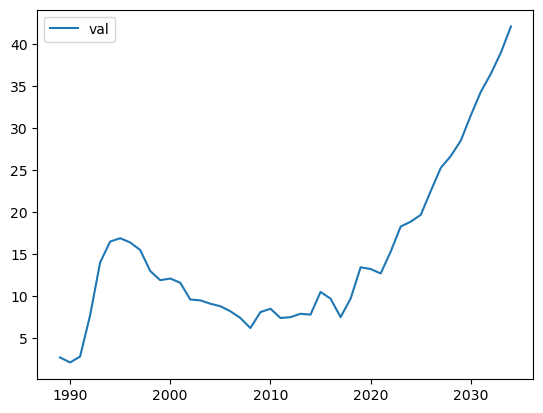

forecasting työllisyysaste_miehet_25_34


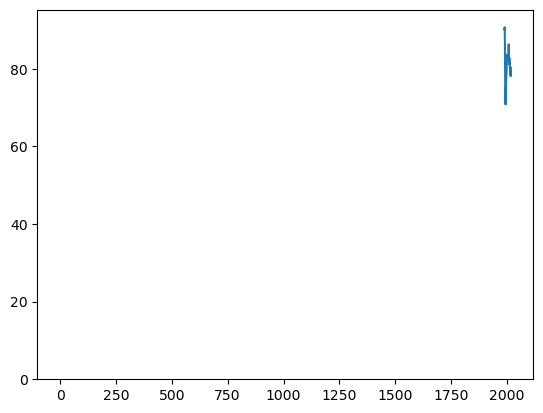

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:               SARIMAX(0, 0, 1)   Log Likelihood                   7.649
Date:                Wed, 01 Nov 2023   AIC                            -11.298
Time:                        23:06:12   BIC                             -8.634
Sample:                             0   HQIC                           -10.484
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6211      0.217     -2.866      0.004      -1.046      -0.196
sigma2         0.0333      0.008      4.244      0.000       0.018       0.049
Ljung-Box (L1) (Q):                   1.81   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28   -0.102445
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

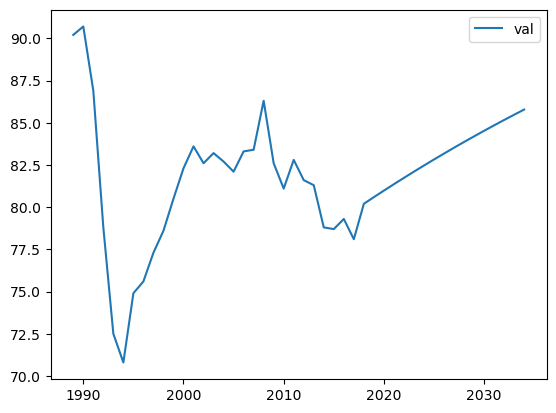

forecasting työllisyysaste_naiset_25_34


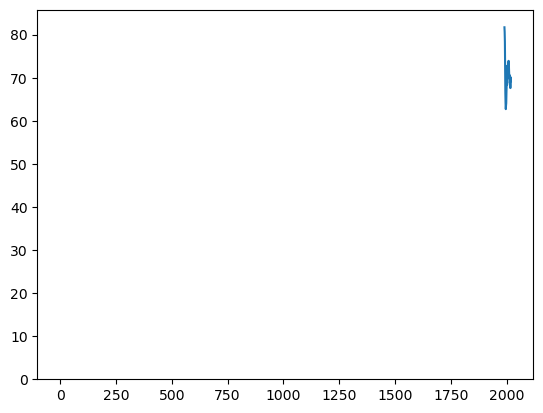

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  22.750
Date:                Wed, 01 Nov 2023   AIC                            -41.501
Time:                        23:06:13   BIC                            -38.836
Sample:                             0   HQIC                           -40.686
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5770      0.171     -3.370      0.001      -0.913      -0.241
sigma2         0.0114      0.004      2.591      0.010       0.003       0.020
Ljung-Box (L1) (Q):                   0.06   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28    0.044386
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

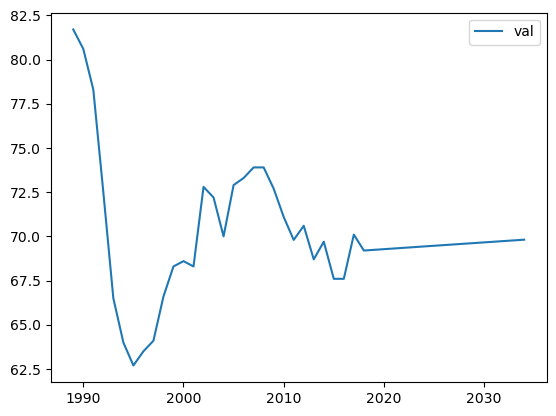

forecasting työttömyys_miehet_35_44


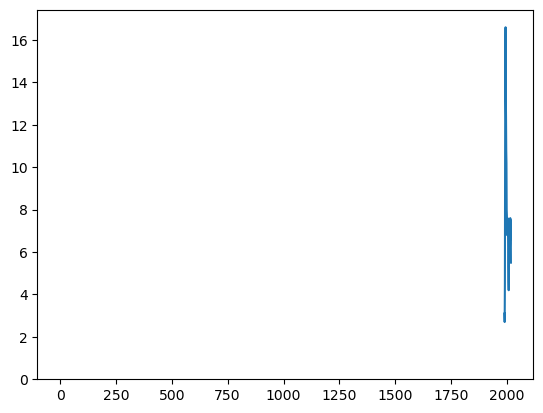

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:               SARIMAX(3, 0, 0)   Log Likelihood                   0.343
Date:                Wed, 01 Nov 2023   AIC                              7.315
Time:                        23:06:14   BIC                             12.643
Sample:                             0   HQIC                             8.944
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1130      0.161     -0.702      0.483      -0.428       0.202
ar.L2         -0.1293      0.173     -0.748      0.455      -0.468       0.210
ar.L3         -0.6725      0.182     -3.691      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28    0.241945
29   -0.161288
30    0.302388
31   -0.176019
32    0.089259
33   -0.190685
34    0.128376
35   -0.049878
36    0.117274
37   -0.093134
38    0.028904
39   -0.070092
40    0.066814
41   -0.017924
42    0.040525
43   -0.047194
dtype: float64

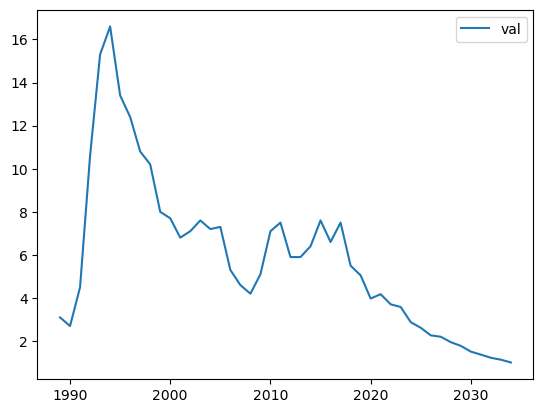

forecasting työttömyys_naiset_35_44


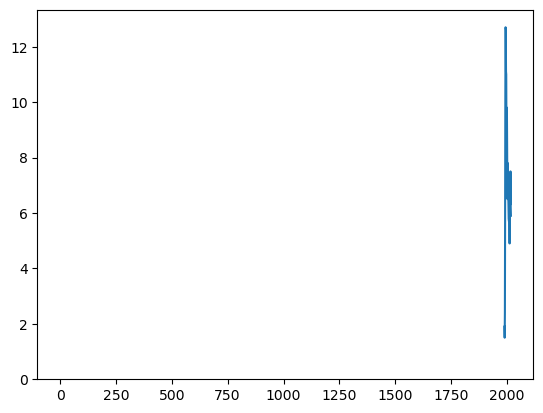

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:               SARIMAX(1, 0, 2)   Log Likelihood                  -0.681
Date:                Wed, 01 Nov 2023   AIC                              9.363
Time:                        23:06:15   BIC                             14.692
Sample:                             0   HQIC                            10.992
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3538      0.341     -1.037      0.300      -1.023       0.315
ma.L1         -0.0236      0.404     -0.058      0.954      -0.816       0.769
ma.L2         -0.7666      0.294     -2.608      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28    4.448139e-02
29    5.766910e-03
30   -2.040437e-03
31    7.219434e-04
32   -2.554366e-04
33    9.037809e-05
34   -3.197740e-05
35    1.131418e-05
36   -4.003162e-06
37    1.416391e-06
38   -5.011447e-07
39    1.773141e-07
40   -6.273691e-08
41    2.219745e-08
42   -7.853860e-09
43    2.778837e-09
dtype: float64

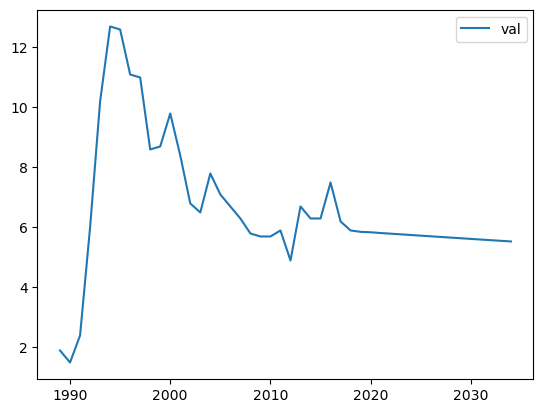

forecasting työllisyysaste_miehet_35_44


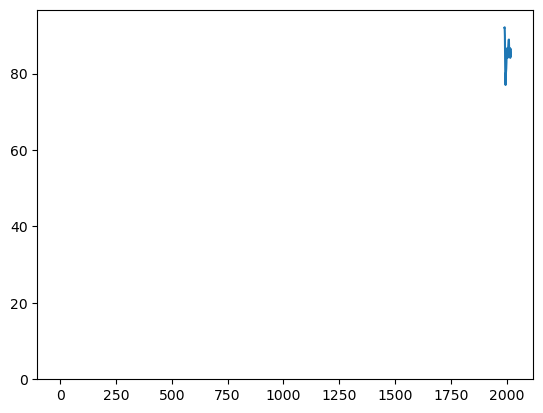

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  11.211
Date:                Wed, 01 Nov 2023   AIC                            -16.423
Time:                        23:06:16   BIC                            -12.426
Sample:                             0   HQIC                           -15.201
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5400      0.317     -1.701      0.089      -1.162       0.082
ma.L2         -0.3640      0.239     -1.521      0.128      -0.833       0.105
sigma2         0.0249      0.010      2.582      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28   -0.070237
29   -0.076342
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

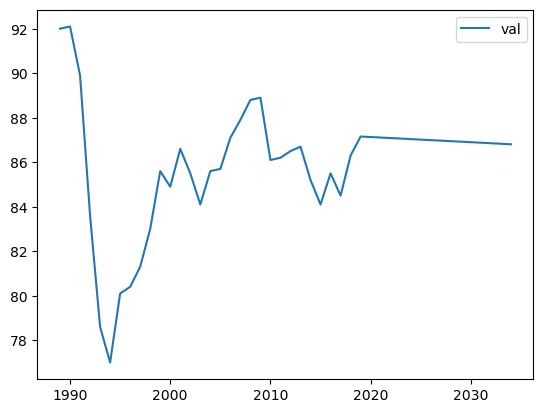

forecasting työllisyysaste_naiset_35_44


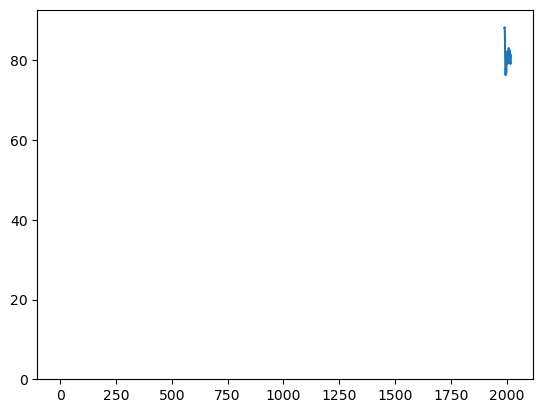

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  18.874
Date:                Wed, 01 Nov 2023   AIC                            -33.747
Time:                        23:06:17   BIC                            -31.083
Sample:                             0   HQIC                           -32.933
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7423      0.179     -4.152      0.000      -1.093      -0.392
sigma2         0.0148      0.004      3.313      0.001       0.006       0.024
Ljung-Box (L1) (Q):                   0.83   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28   -0.098868
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

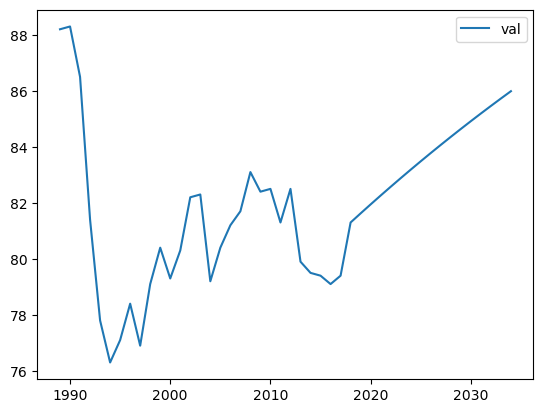

forecasting ei_aviossa_30_34


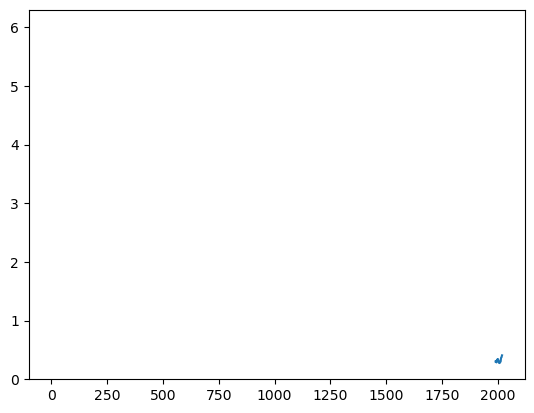

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  43.726
Date:                Wed, 01 Nov 2023   AIC                            -83.453
Time:                        23:06:18   BIC                            -80.788
Sample:                             0   HQIC                           -82.638
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8407      0.185     -4.550      0.000      -1.203      -0.479
sigma2         0.0025      0.001      3.526      0.000       0.001       0.004
Ljung-Box (L1) (Q):                   0.81   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28   -0.000146
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

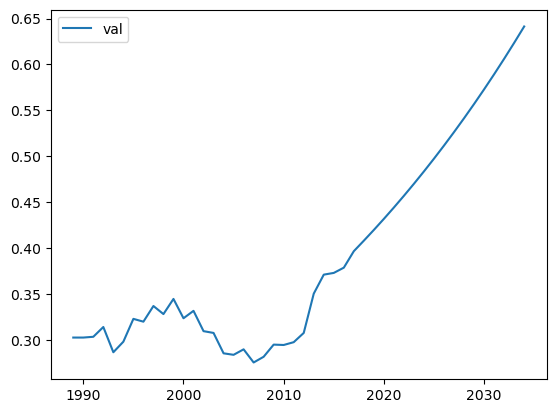

forecasting parittomia_30_34


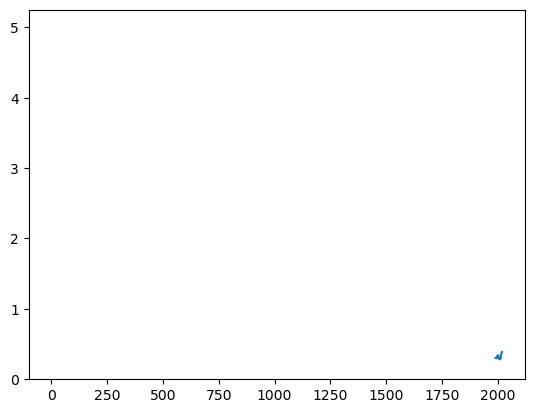

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   28
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  53.745
Date:                Wed, 01 Nov 2023   AIC                           -103.491
Time:                        23:06:19   BIC                           -100.827
Sample:                             0   HQIC                          -102.676
                                 - 28                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6200      0.145     -4.265      0.000      -0.905      -0.335
sigma2         0.0012      0.000      2.864      0.004       0.000       0.002
Ljung-Box (L1) (Q):                   0.11   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

28    0.010531
29    0.000000
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

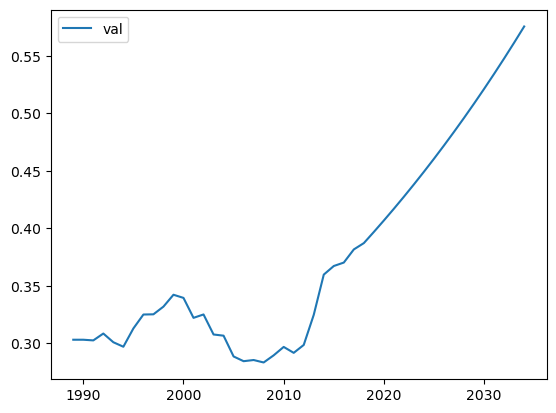

       hedelmallisyysluku  pienituloisuus_miehet_18_29  \
vuosi                                                    
1989             1.710000                     9.400000   
1990             1.782000                     7.900000   
1991             1.794000                    10.900000   
1992             1.847000                    13.500000   
1993             1.813000                    12.700000   
1994             1.847000                    14.200000   
1995             1.807000                    15.900000   
1996             1.764000                    19.300000   
1997             1.746000                    18.200000   
1998             1.700000                    17.900000   
1999             1.735000                    18.200000   
2000             1.729000                    16.700000   
2001             1.726000                    19.200000   
2002             1.718000                    21.000000   
2003             1.760000                    21.100000   
2004          

forecasting hedelmallisyysluku


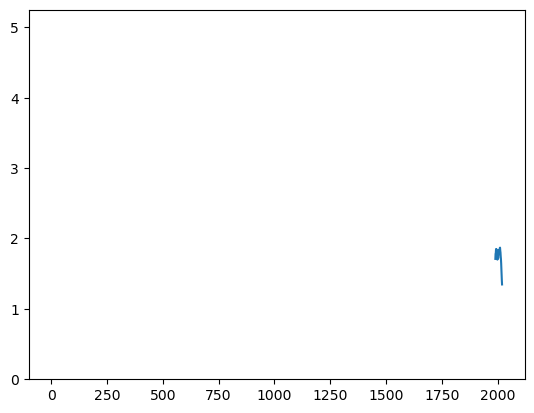

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:               SARIMAX(0, 0, 4)   Log Likelihood                  79.236
Date:                Wed, 01 Nov 2023   AIC                           -148.472
Time:                        23:06:21   BIC                           -141.636
Sample:                             0   HQIC                          -146.331
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8284      0.480     -1.727      0.084      -1.768       0.112
ma.L2          0.6744      0.418      1.613      0.107      -0.145       1.494
ma.L3         -0.1847      0.325     -0.568      0.5

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29   -0.013496
30    0.004106
31   -0.003602
32    0.004527
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

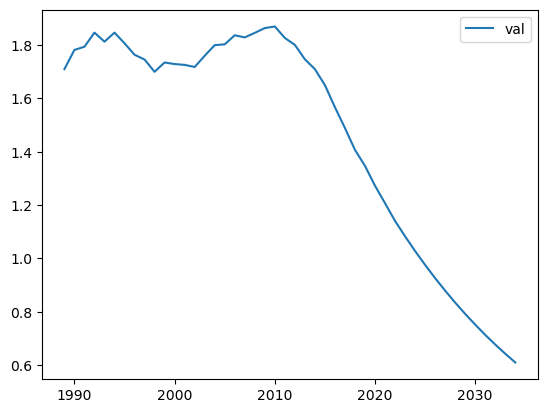

forecasting pienituloisuus_miehet_18_29


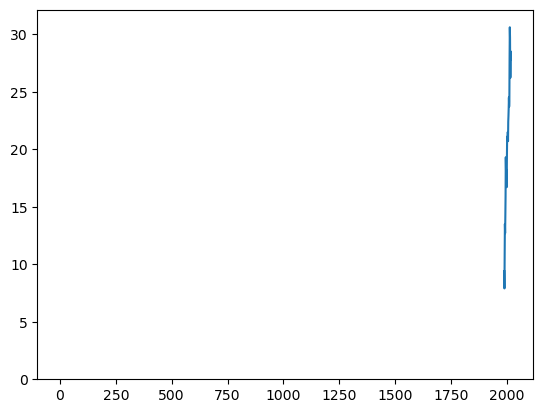

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:               SARIMAX(2, 0, 1)   Log Likelihood                 100.705
Date:                Wed, 01 Nov 2023   AIC                           -193.409
Time:                        23:06:22   BIC                           -187.940
Sample:                             0   HQIC                          -191.697
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2508      0.171      1.467      0.142      -0.084       0.586
ar.L2         -0.5629      0.357     -1.578      0.114      -1.262       0.136
ma.L1         -0.9893      1.379     -0.718      0.4

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29   -0.001351
30    0.010214
31    0.003322
32   -0.004917
33   -0.003103
34    0.001989
35    0.002246
36   -0.000556
37   -0.001404
38   -0.000039
39    0.000781
40    0.000218
41   -0.000385
42   -0.000219
43    0.000162
dtype: float64

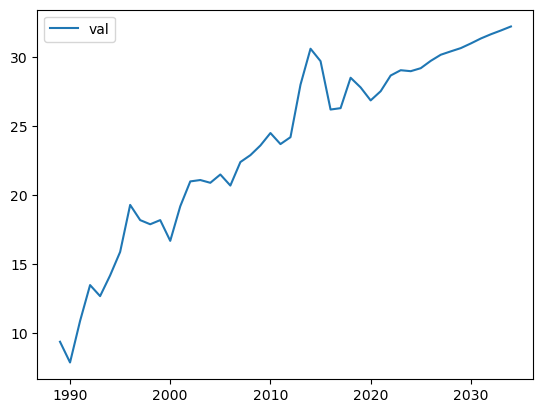

forecasting pienituloisuus_naiset_18_29


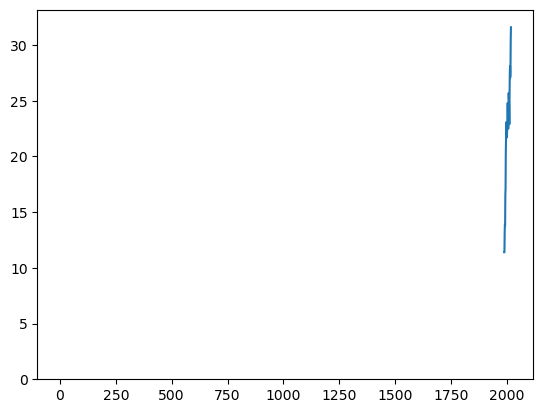

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:               SARIMAX(4, 0, 0)   Log Likelihood                 108.487
Date:                Wed, 01 Nov 2023   AIC                           -206.973
Time:                        23:06:23   BIC                           -200.137
Sample:                             0   HQIC                          -204.832
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7758      0.159     -4.873      0.000      -1.088      -0.464
ar.L2         -0.7149      0.196     -3.653      0.000      -1.098      -0.331
ar.L3         -0.9720      0.102     -9.493      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29   -0.007399
30   -0.008557
31    0.011104
32    0.009726
33   -0.002594
34   -0.010446
35   -0.006356
36    0.008911
37    0.009388
38   -0.001020
39   -0.010654
40   -0.005637
41    0.007180
42    0.009445
43   -0.000399
dtype: float64

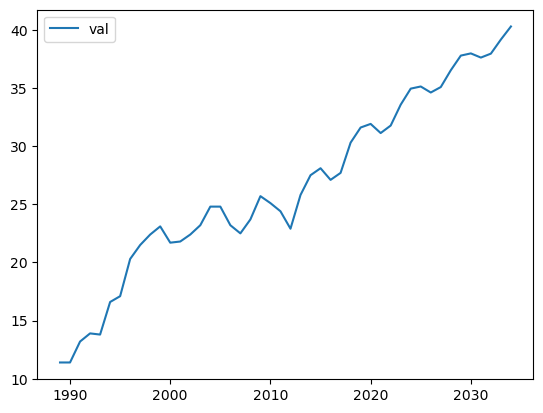

forecasting lapsikuolleisuus


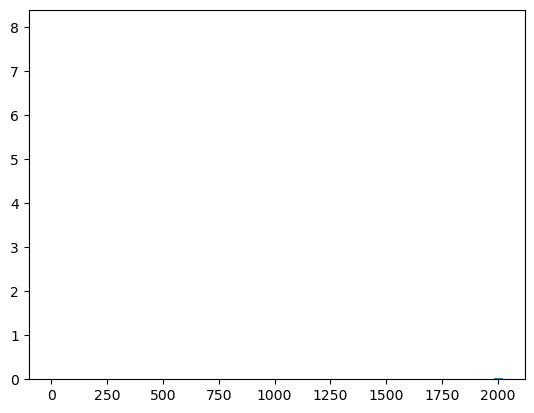

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:               SARIMAX(1, 0, 1)   Log Likelihood                  25.444
Date:                Wed, 01 Nov 2023   AIC                            -44.888
Time:                        23:06:24   BIC                            -40.786
Sample:                             0   HQIC                           -43.603
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5197      0.217     -2.396      0.017      -0.945      -0.095
ma.L1         -0.9513      0.409     -2.323      0.020      -1.754      -0.149
sigma2         0.0090      0.004      2.313      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29   -0.064531
30    0.033538
31   -0.017431
32    0.009059
33   -0.004708
34    0.002447
35   -0.001272
36    0.000661
37   -0.000344
38    0.000179
39   -0.000093
40    0.000048
41   -0.000025
42    0.000013
43   -0.000007
dtype: float64

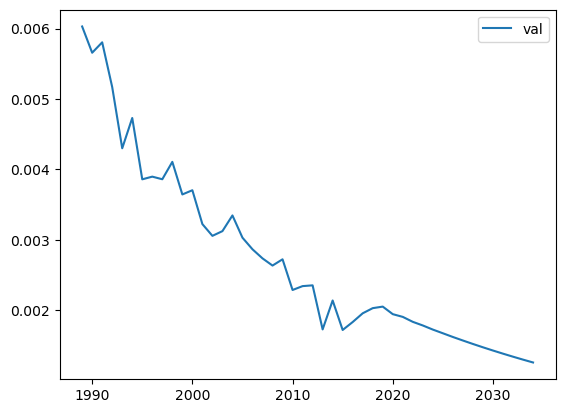

forecasting synnyttajien_keskiika


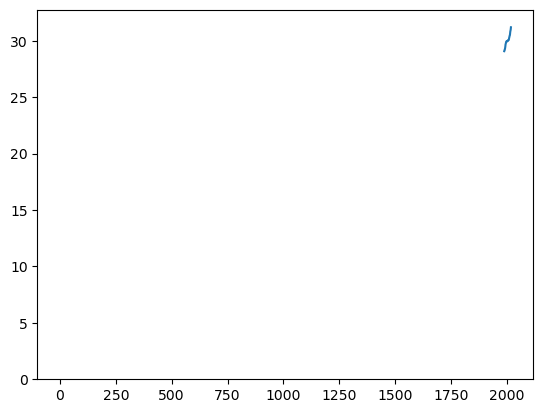

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:               SARIMAX(1, 0, 4)   Log Likelihood                 136.695
Date:                Wed, 01 Nov 2023   AIC                           -261.390
Time:                        23:06:25   BIC                           -253.187
Sample:                             0   HQIC                          -258.821
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5693      0.468      1.216      0.224      -0.348       1.487
ma.L1         -0.9602      1.268     -0.758      0.449      -3.445       1.524
ma.L2         -0.0597      1.068     -0.056      0.9

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29   -0.001790
30   -0.003449
31    0.001558
32   -0.000865
33   -0.000492
34   -0.000280
35   -0.000160
36   -0.000091
37   -0.000052
38   -0.000029
39   -0.000017
40   -0.000010
41   -0.000005
42   -0.000003
43   -0.000002
dtype: float64

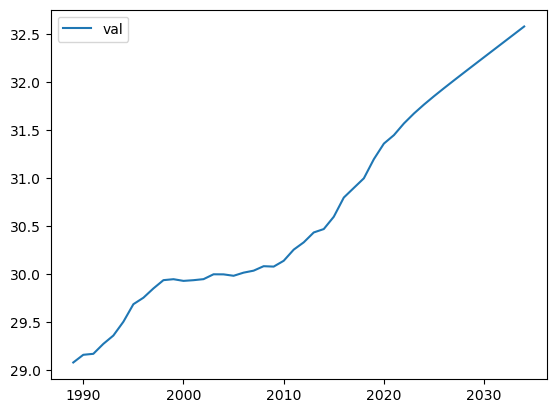

forecasting sisempikaupunki


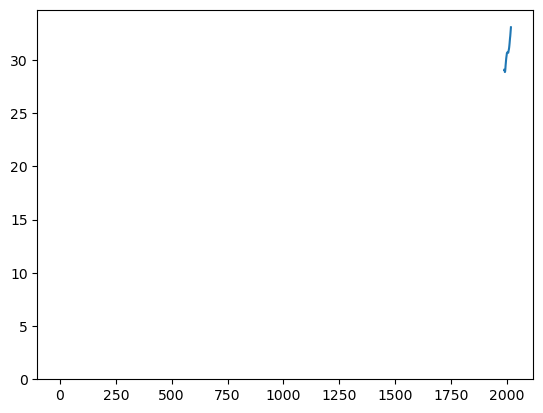

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:               SARIMAX(0, 0, 1)   Log Likelihood                 181.066
Date:                Wed, 01 Nov 2023   AIC                           -358.131
Time:                        23:06:26   BIC                           -355.397
Sample:                             0   HQIC                          -357.275
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.2955      0.215      1.374      0.170      -0.126       0.717
sigma2      2.199e-07   5.98e-08      3.677      0.000    1.03e-07    3.37e-07
Ljung-Box (L1) (Q):                   0.01   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29    0.000027
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

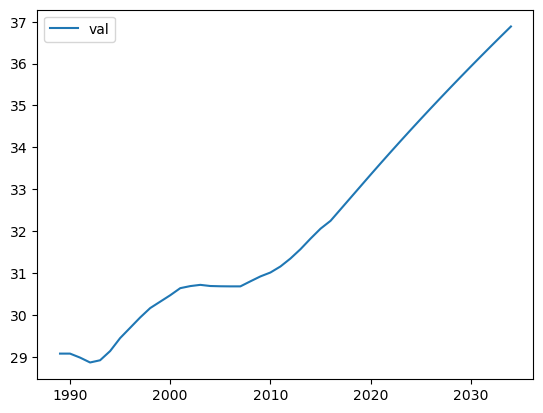

forecasting ulompikaupunki


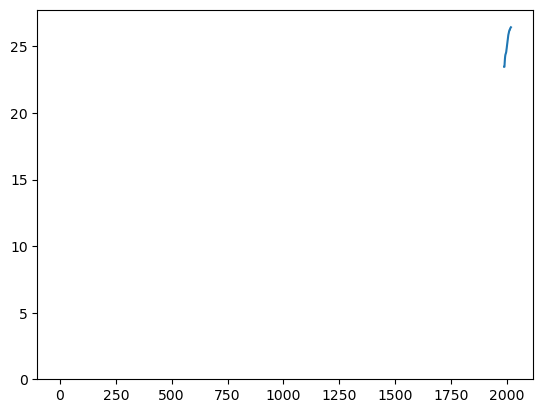

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:                        SARIMAX   Log Likelihood                 189.618
Date:                Wed, 01 Nov 2023   AIC                           -377.236
Time:                        23:06:27   BIC                           -375.869
Sample:                             0   HQIC                          -376.808
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1.225e-07   1.24e-08      9.896      0.000    9.83e-08    1.47e-07
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               199.98
Prob(Q):                              0.96   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29    0.0
30    0.0
31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

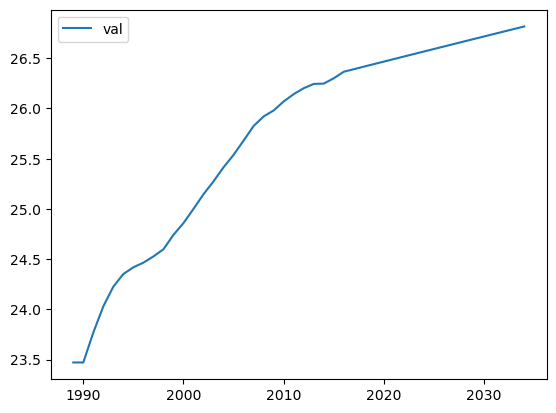

forecasting kehyskaupunki


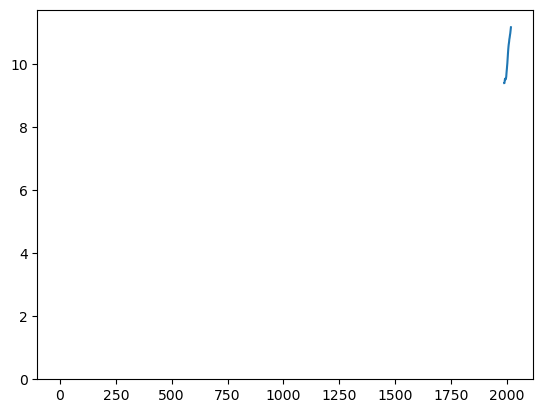

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:                        SARIMAX   Log Likelihood                 247.826
Date:                Wed, 01 Nov 2023   AIC                           -493.652
Time:                        23:06:28   BIC                           -492.284
Sample:                             0   HQIC                          -493.224
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      2.212e-09   8.12e-10      2.725      0.006    6.21e-10     3.8e-09
Ljung-Box (L1) (Q):                   0.09   Jarque-Bera (JB):                 0.16
Prob(Q):                              0.77   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29    0.0
30    0.0
31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

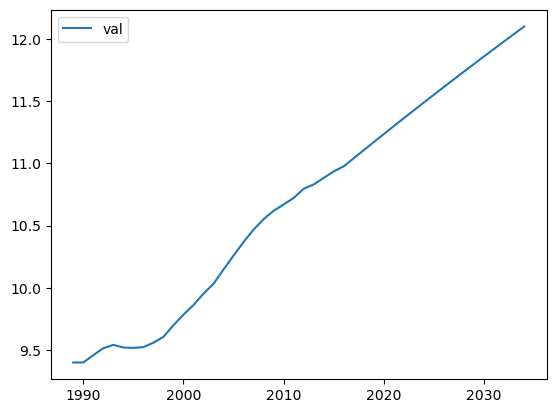

forecasting maaseudulla


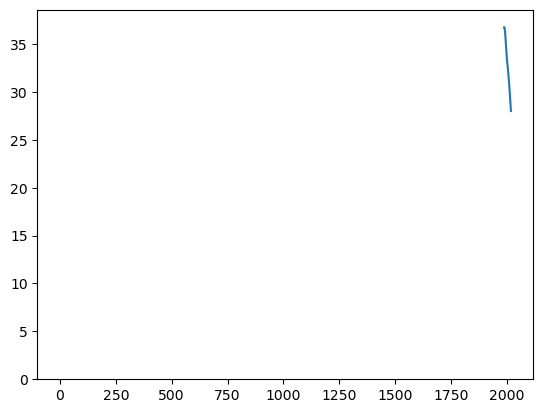

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:                        SARIMAX   Log Likelihood                 172.927
Date:                Wed, 01 Nov 2023   AIC                           -343.854
Time:                        23:06:28   BIC                           -342.487
Sample:                             0   HQIC                          -343.426
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      3.874e-07    6.8e-08      5.700      0.000    2.54e-07    5.21e-07
Ljung-Box (L1) (Q):                   0.67   Jarque-Bera (JB):                 8.31
Prob(Q):                              0.41   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29    0.0
30    0.0
31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

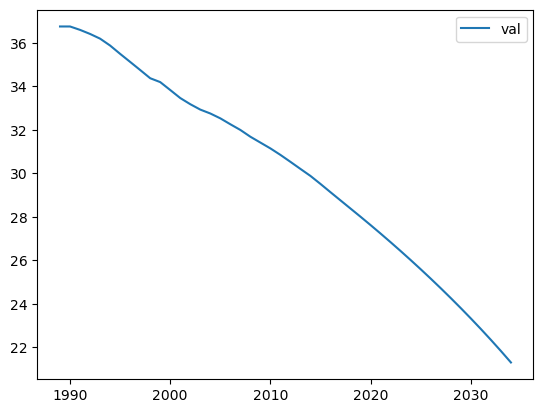

forecasting avioituvuus_naiset_30_34


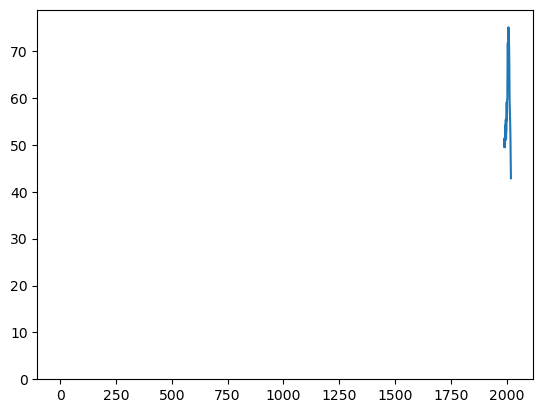

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  14.316
Date:                Wed, 01 Nov 2023   AIC                            -22.631
Time:                        23:06:29   BIC                            -18.529
Sample:                             0   HQIC                           -21.347
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9380      0.260     -3.613      0.000      -1.447      -0.429
ma.L2          0.3051      0.259      1.176      0.240      -0.203       0.814
sigma2         0.0211      0.006      3.654      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29    0.022583
30   -0.015106
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

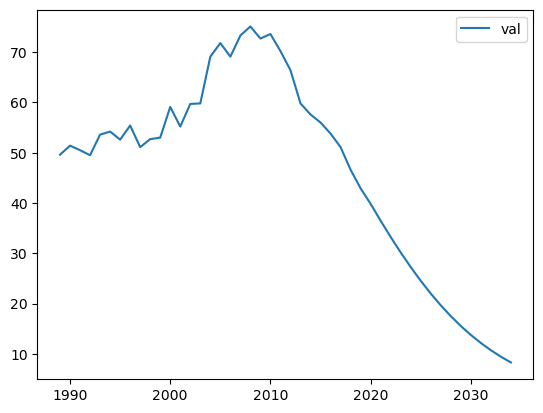

forecasting avioituvuus_naiset_25_29


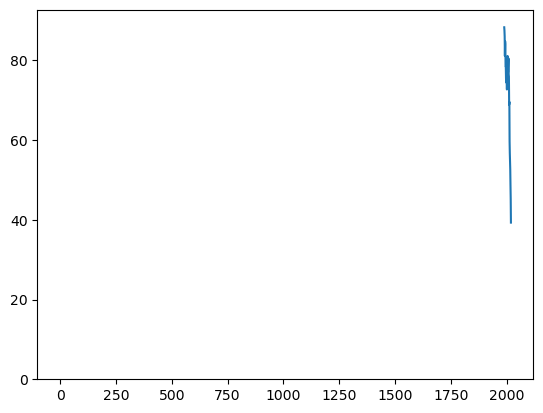

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:               SARIMAX(0, 0, 2)   Log Likelihood                   7.374
Date:                Wed, 01 Nov 2023   AIC                             -8.748
Time:                        23:06:30   BIC                             -4.646
Sample:                             0   HQIC                            -7.463
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.2069      0.224     -5.387      0.000      -1.646      -0.768
ma.L2          0.5428      0.192      2.823      0.005       0.166       0.920
sigma2         0.0333      0.012      2.872      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29    0.178151
30   -0.078566
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

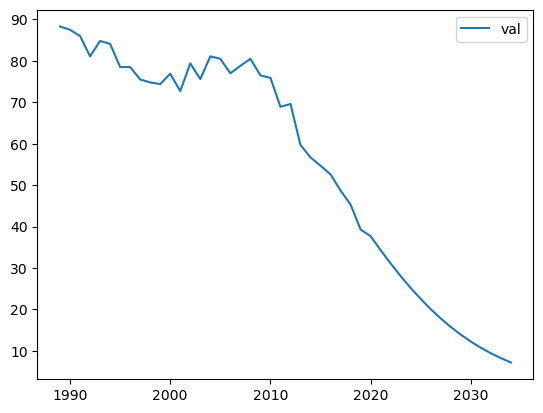

forecasting eronneisuus_25_29


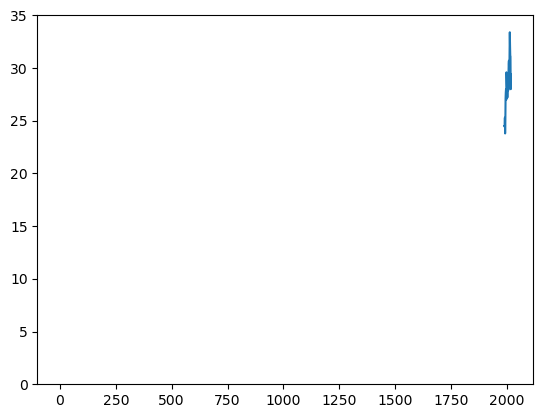

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:               SARIMAX(0, 0, 5)   Log Likelihood                  39.295
Date:                Wed, 01 Nov 2023   AIC                            -66.589
Time:                        23:06:31   BIC                            -58.386
Sample:                             0   HQIC                           -64.020
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9408      0.397     -2.369      0.018      -1.719      -0.162
ma.L2         -0.5295      0.423     -1.251      0.211      -1.359       0.300
ma.L3          0.5572      0.451      1.236      0.2

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29    0.029212
30   -0.125408
31    0.080352
32   -0.067922
33    0.017176
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

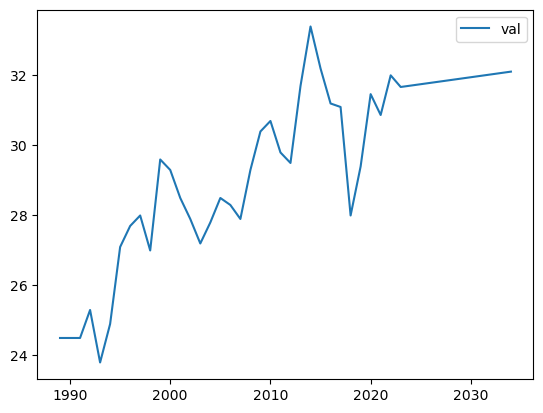

forecasting eronneisuus_30_34


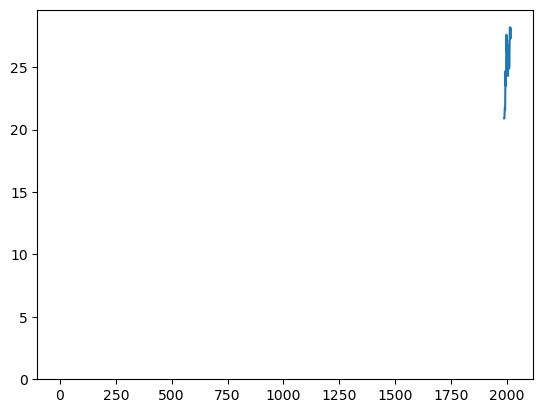

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:               SARIMAX(0, 0, 4)   Log Likelihood                  44.119
Date:                Wed, 01 Nov 2023   AIC                            -78.237
Time:                        23:06:32   BIC                            -71.401
Sample:                             0   HQIC                           -76.096
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9776      0.558     -1.751      0.080      -2.072       0.117
ma.L2         -0.2249      0.395     -0.569      0.569      -1.000       0.550
ma.L3          0.2883      0.295      0.979      0.3

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29   -0.001655
30    0.006719
31   -0.002805
32    0.000490
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

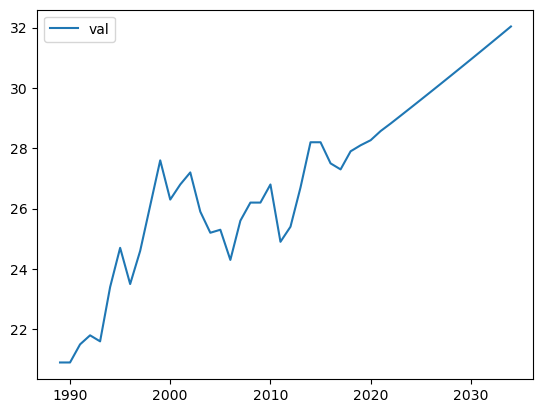

forecasting kolmasaste_miehet_25_29


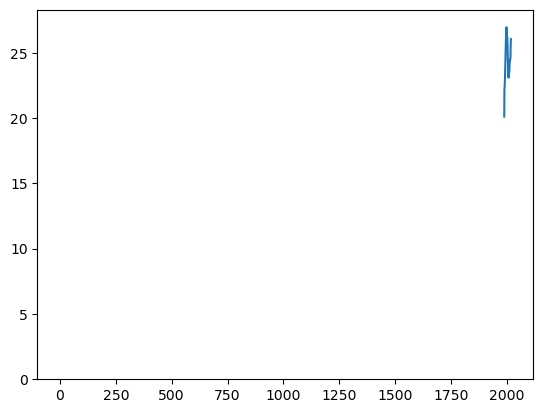

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  61.837
Date:                Wed, 01 Nov 2023   AIC                           -119.674
Time:                        23:06:34   BIC                           -116.939
Sample:                             0   HQIC                          -118.817
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5941      0.098     -6.041      0.000      -0.787      -0.401
sigma2         0.0008      0.000      4.876      0.000       0.000       0.001
Ljung-Box (L1) (Q):                   1.46   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29    0.019991
30   -0.011876
31    0.007056
32   -0.004192
33    0.002490
34   -0.001480
35    0.000879
36   -0.000522
37    0.000310
38   -0.000184
39    0.000110
40   -0.000065
41    0.000039
42   -0.000023
43    0.000014
dtype: float64

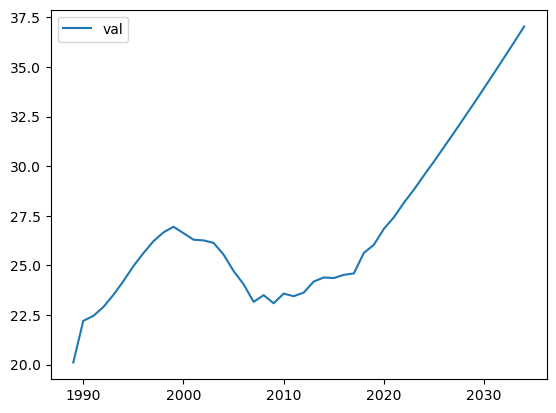

forecasting miehet_perusaste_25_29


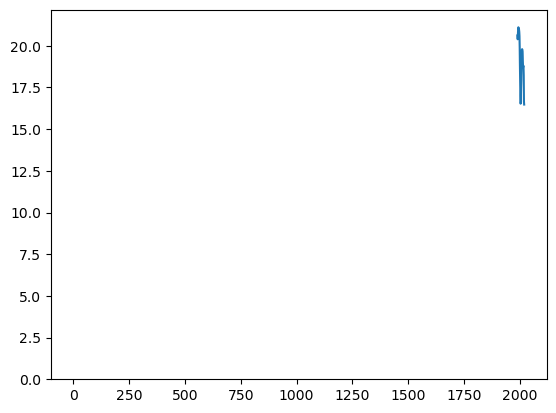

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:                        SARIMAX   Log Likelihood                  59.154
Date:                Wed, 01 Nov 2023   AIC                           -116.309
Time:                        23:06:35   BIC                           -114.941
Sample:                             0   HQIC                          -115.880
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0010      0.000      5.341      0.000       0.001       0.001
Ljung-Box (L1) (Q):                   0.08   Jarque-Bera (JB):                 6.65
Prob(Q):                              0.78   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29    0.0
30    0.0
31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

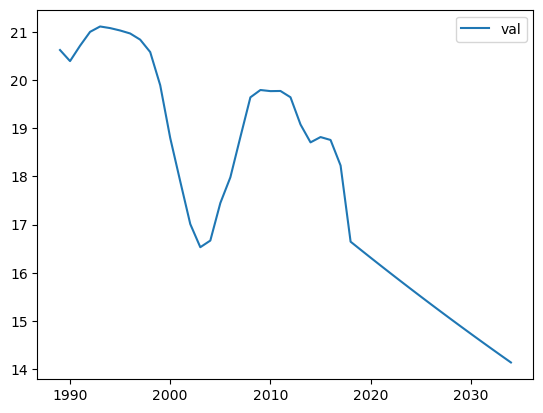

forecasting naiset_perusaste_25_29


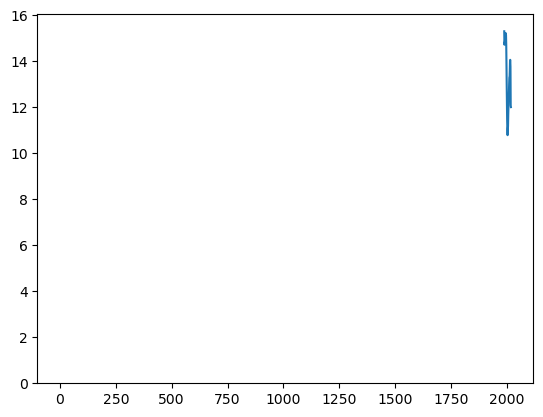

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  52.883
Date:                Wed, 01 Nov 2023   AIC                           -101.767
Time:                        23:06:36   BIC                            -99.032
Sample:                             0   HQIC                          -100.911
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4879      0.134     -3.628      0.000      -0.752      -0.224
sigma2         0.0015      0.000      6.346      0.000       0.001       0.002
Ljung-Box (L1) (Q):                   0.14   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29   -0.069546
30    0.033934
31   -0.016558
32    0.008079
33   -0.003942
34    0.001924
35   -0.000939
36    0.000458
37   -0.000223
38    0.000109
39   -0.000053
40    0.000026
41   -0.000013
42    0.000006
43   -0.000003
dtype: float64

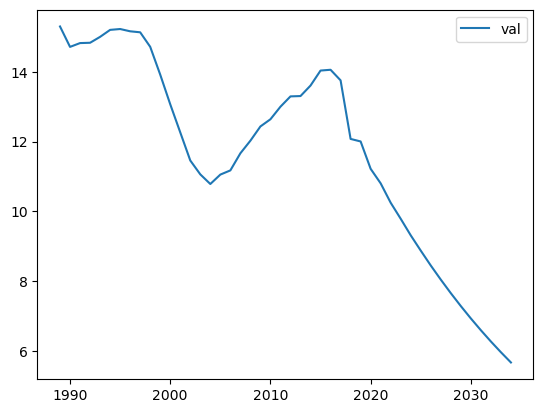

forecasting kolmasaste_naiset_25_29


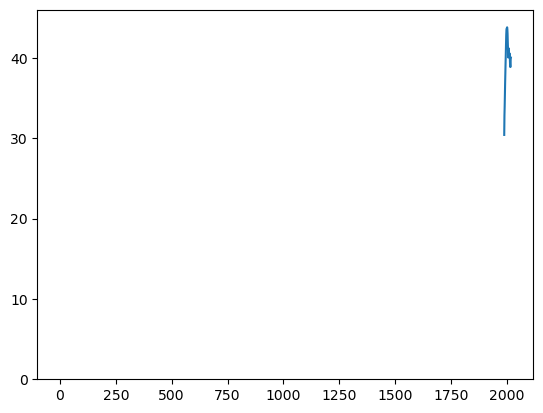

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  63.720
Date:                Wed, 01 Nov 2023   AIC                           -123.441
Time:                        23:06:37   BIC                           -120.706
Sample:                             0   HQIC                          -122.584
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5060      0.171     -2.956      0.003      -0.841      -0.171
sigma2         0.0007      0.000      5.387      0.000       0.000       0.001
Ljung-Box (L1) (Q):                   0.02   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29    0.016223
30   -0.008209
31    0.004153
32   -0.002102
33    0.001063
34   -0.000538
35    0.000272
36   -0.000138
37    0.000070
38   -0.000035
39    0.000018
40   -0.000009
41    0.000005
42   -0.000002
43    0.000001
dtype: float64

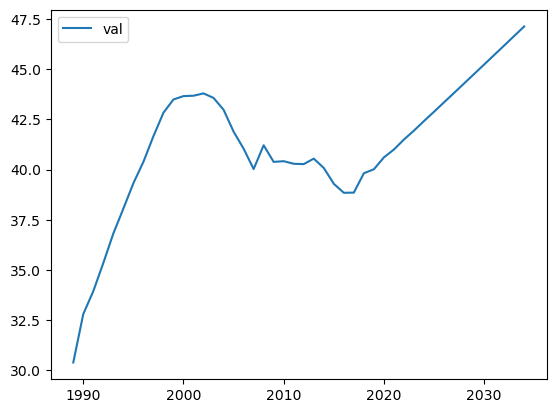

forecasting alypuhelin


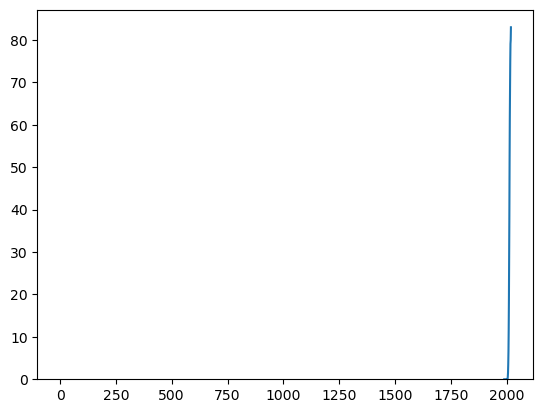

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:               SARIMAX(3, 0, 0)   Log Likelihood                  35.845
Date:                Wed, 01 Nov 2023   AIC                            -63.689
Time:                        23:06:38   BIC                            -58.220
Sample:                             0   HQIC                           -61.976
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4707      0.149     -3.153      0.002      -0.763      -0.178
ar.L2         -0.2341      0.245     -0.955      0.339      -0.714       0.246
ar.L3          0.5246      0.215      2.443      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:1346: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum
/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29   -0.090917
30   -0.185290
31    0.281815
32   -0.136972
33   -0.098705
34    0.226370
35   -0.155305
36   -0.031672
37    0.170022
38   -0.154092
39    0.016115
40    0.117684
41   -0.140006
42    0.046806
43    0.072482
dtype: float64

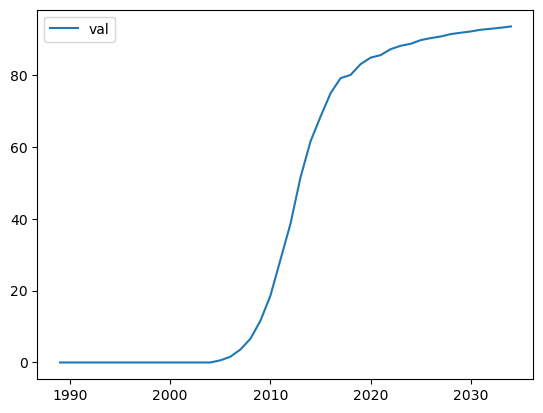

forecasting some_25_34


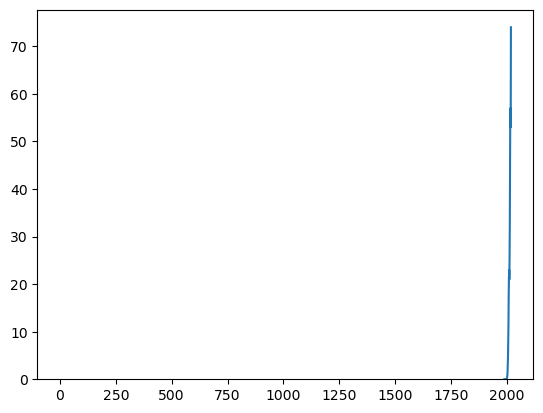

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:               SARIMAX(0, 0, 4)   Log Likelihood                  21.471
Date:                Wed, 01 Nov 2023   AIC                            -32.943
Time:                        23:06:39   BIC                            -26.106
Sample:                             0   HQIC                           -30.802
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.8951      0.545     -3.474      0.001      -2.964      -0.826
ma.L2          1.7952      1.627      1.104      0.270      -1.393       4.983
ma.L3         -0.7808      2.435     -0.321      0.7

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29   -1.203812
30    0.869884
31   -0.324373
32    0.060336
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

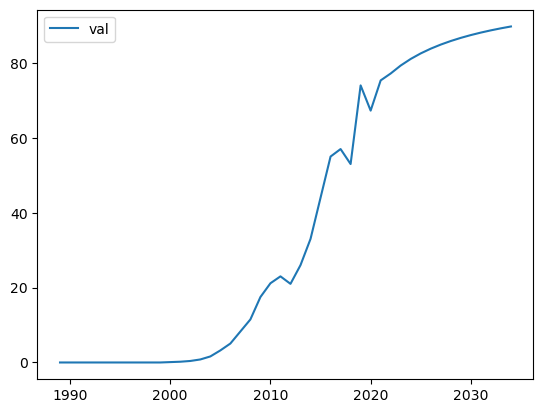

forecasting some_35_44


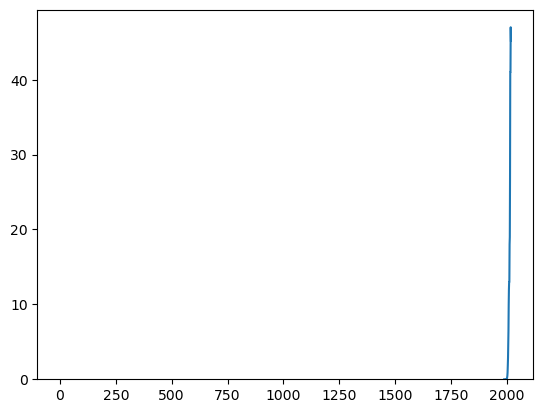

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  64.632
Date:                Wed, 01 Nov 2023   AIC                           -125.265
Time:                        23:06:40   BIC                           -122.530
Sample:                             0   HQIC                          -124.408
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8210      0.091     -9.055      0.000      -0.999      -0.643
sigma2         0.0007   7.12e-05      9.171      0.000       0.001       0.001
Ljung-Box (L1) (Q):                   0.18   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29    0.088829
30   -0.072927
31    0.059871
32   -0.049153
33    0.040353
34   -0.033129
35    0.027198
36   -0.022329
37    0.018331
38   -0.015050
39    0.012355
40   -0.010143
41    0.008328
42   -0.006837
43    0.005613
dtype: float64

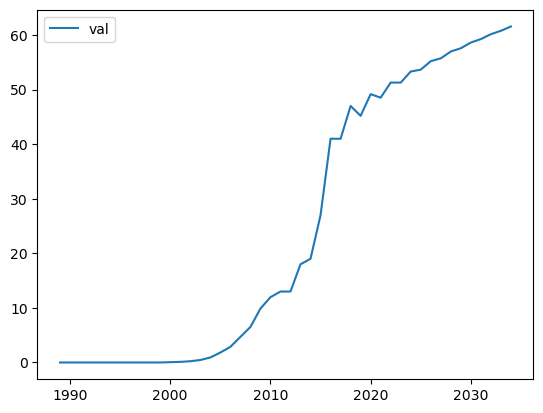

forecasting työttömyys_miehet_25_34


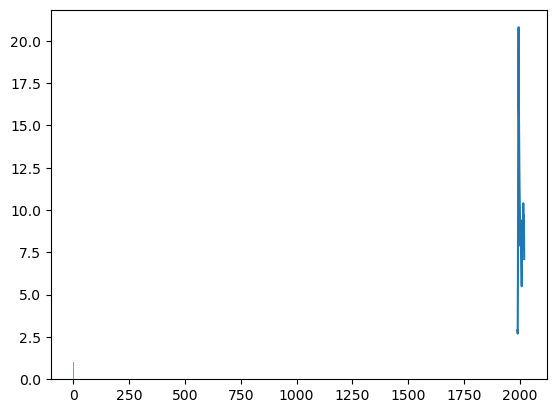

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:               SARIMAX(0, 0, 5)   Log Likelihood                   1.688
Date:                Wed, 01 Nov 2023   AIC                              8.625
Time:                        23:06:41   BIC                             16.829
Sample:                             0   HQIC                            11.194
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.2887      0.869     -0.332      0.740      -1.993       1.415
ma.L2         -0.2547      0.749     -0.340      0.734      -1.723       1.214
ma.L3         -0.7320      1.027     -0.713      0.4

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29    0.109892
30    0.164711
31    0.119215
32   -0.010818
33   -0.093390
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

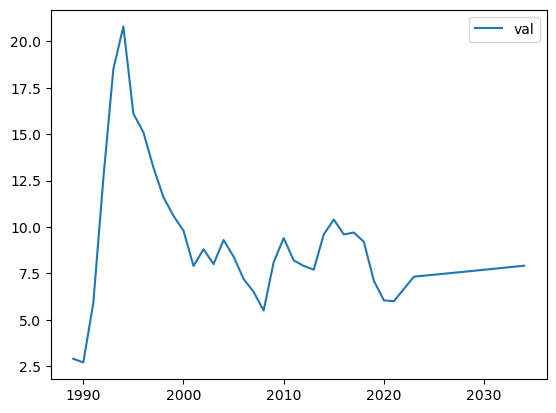

forecasting työttömyys_naiset_25_34


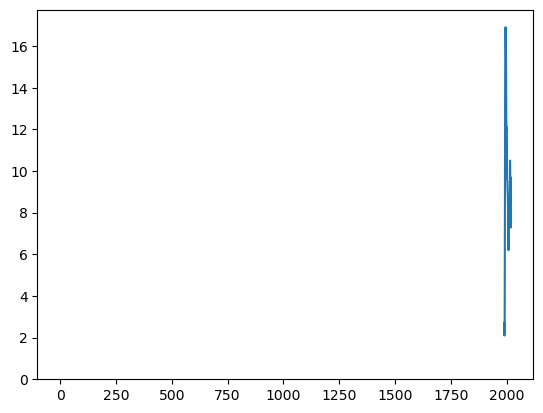

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:               SARIMAX(1, 0, 2)   Log Likelihood                  -2.416
Date:                Wed, 01 Nov 2023   AIC                             12.833
Time:                        23:06:42   BIC                             18.302
Sample:                             0   HQIC                            14.546
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1095      0.334     -0.328      0.743      -0.765       0.546
ma.L1         -0.2176      0.339     -0.642      0.521      -0.882       0.447
ma.L2         -0.6576      0.323     -2.039      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29   -1.899795e-02
30    3.436560e-01
31   -3.763637e-02
32    4.121843e-03
33   -4.514143e-04
34    4.943779e-05
35   -5.414306e-06
36    5.929617e-07
37   -6.493972e-08
38    7.112040e-09
39   -7.788933e-10
40    8.530249e-11
41   -9.342122e-12
42    1.023126e-12
43   -1.120503e-13
dtype: float64

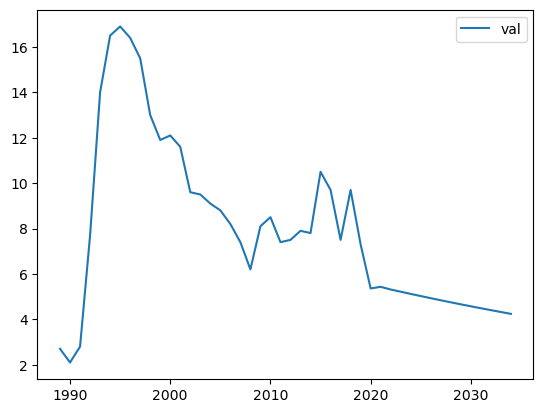

forecasting työllisyysaste_miehet_25_34


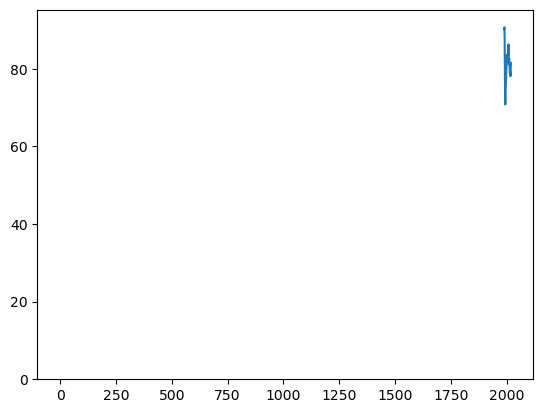

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:               SARIMAX(0, 0, 1)   Log Likelihood                   8.387
Date:                Wed, 01 Nov 2023   AIC                            -12.775
Time:                        23:06:43   BIC                            -10.040
Sample:                             0   HQIC                           -11.918
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6070      0.210     -2.887      0.004      -1.019      -0.195
sigma2         0.0323      0.007      4.425      0.000       0.018       0.047
Ljung-Box (L1) (Q):                   1.83   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29   -0.034514
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

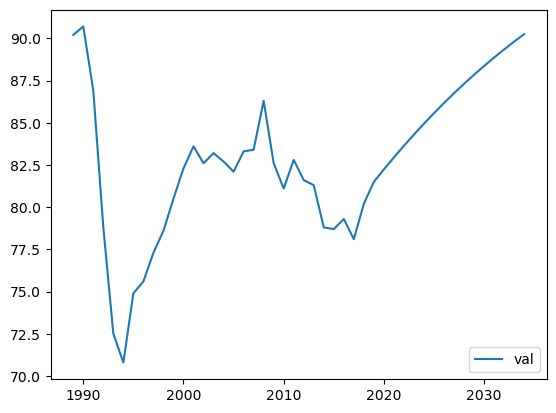

forecasting työllisyysaste_naiset_25_34


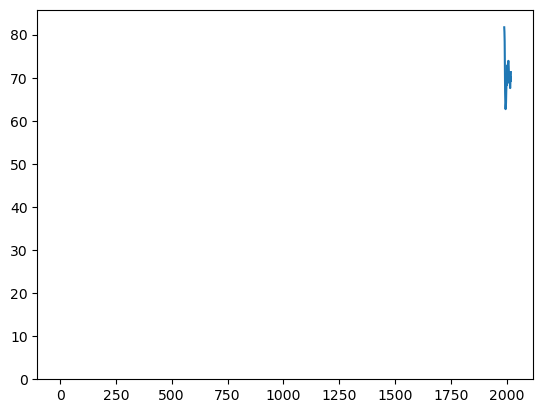

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  23.642
Date:                Wed, 01 Nov 2023   AIC                            -43.283
Time:                        23:06:44   BIC                            -40.549
Sample:                             0   HQIC                           -42.427
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5748      0.171     -3.367      0.001      -0.909      -0.240
sigma2         0.0113      0.004      2.604      0.009       0.003       0.020
Ljung-Box (L1) (Q):                   0.01   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29   -0.056725
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

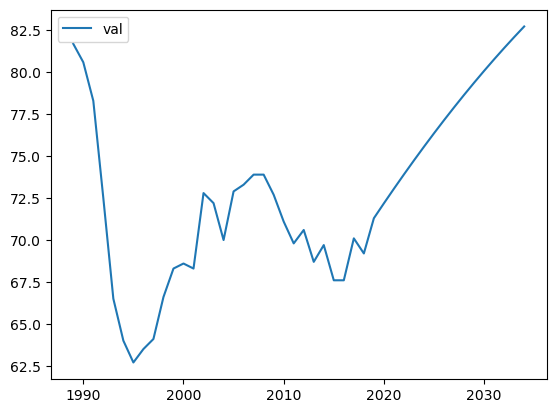

forecasting työttömyys_miehet_35_44


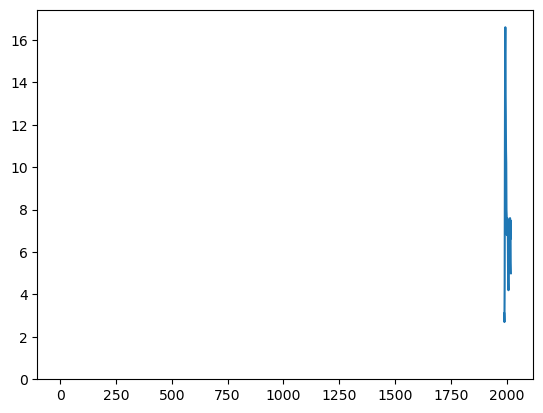

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:               SARIMAX(3, 0, 0)   Log Likelihood                   0.895
Date:                Wed, 01 Nov 2023   AIC                              6.209
Time:                        23:06:45   BIC                             11.678
Sample:                             0   HQIC                             7.922
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1107      0.156     -0.710      0.478      -0.416       0.195
ar.L2         -0.1304      0.168     -0.778      0.437      -0.459       0.198
ar.L3         -0.6743      0.175     -3.863      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29   -0.159540
30    0.303861
31   -0.168585
32    0.086631
33   -0.192518
34    0.123703
35   -0.047013
36    0.118900
37   -0.090452
38    0.026214
39   -0.071289
40    0.065470
41   -0.015631
42    0.041268
43   -0.046681
dtype: float64

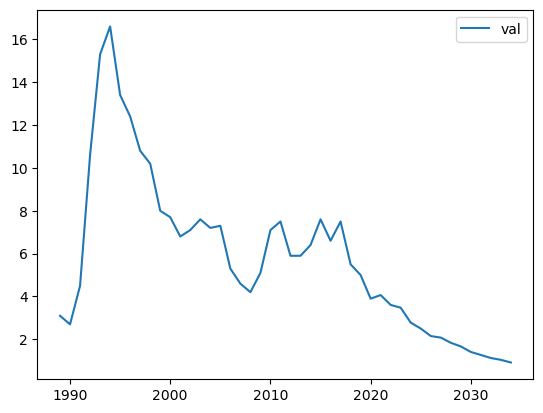

forecasting työttömyys_naiset_35_44


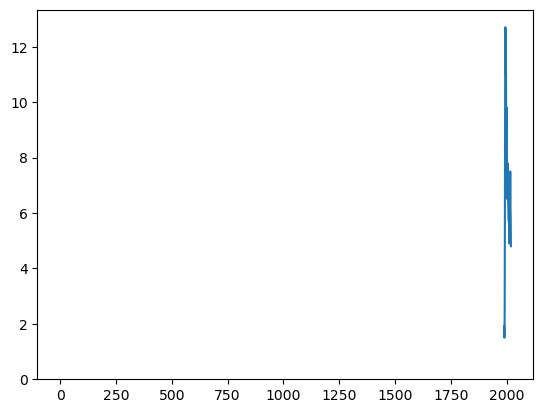

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  -0.996
Date:                Wed, 01 Nov 2023   AIC                              7.992
Time:                        23:06:46   BIC                             12.094
Sample:                             0   HQIC                             9.277
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.3940      0.245     -1.610      0.107      -0.873       0.085
ma.L2         -0.4938      0.222     -2.223      0.026      -0.929      -0.058
sigma2         0.0596      0.020      3.035      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29    0.065767
30    0.133789
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

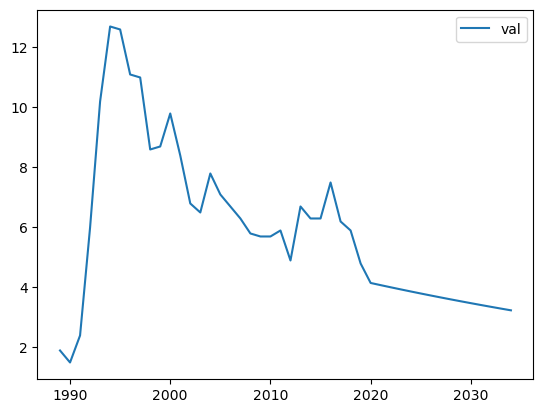

forecasting työllisyysaste_miehet_35_44


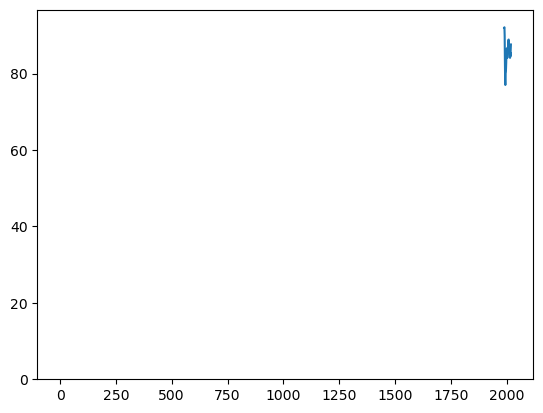

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  12.116
Date:                Wed, 01 Nov 2023   AIC                            -18.232
Time:                        23:06:47   BIC                            -14.130
Sample:                             0   HQIC                           -16.947
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5276      0.300     -1.759      0.079      -1.116       0.060
ma.L2         -0.3729      0.226     -1.653      0.098      -0.815       0.069
sigma2         0.0241      0.009      2.735      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29   -0.098303
30   -0.013787
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

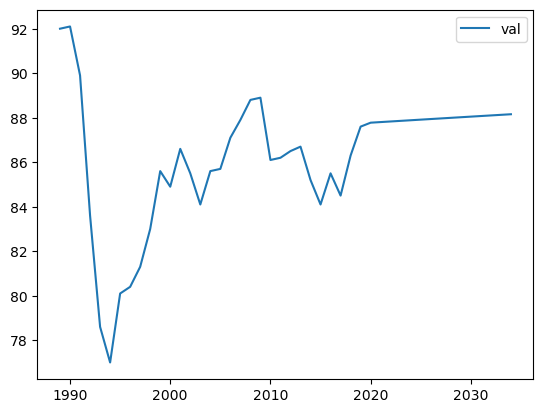

forecasting työllisyysaste_naiset_35_44


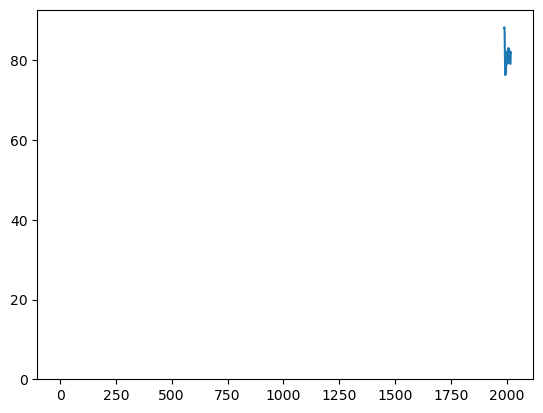

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  20.049
Date:                Wed, 01 Nov 2023   AIC                            -36.098
Time:                        23:06:48   BIC                            -33.364
Sample:                             0   HQIC                           -35.242
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7355      0.176     -4.179      0.000      -1.080      -0.391
sigma2         0.0143      0.004      3.464      0.001       0.006       0.022
Ljung-Box (L1) (Q):                   0.84   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29   -0.017786
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

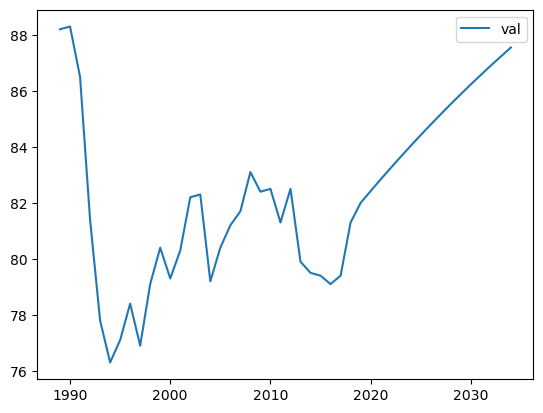

forecasting ei_aviossa_30_34


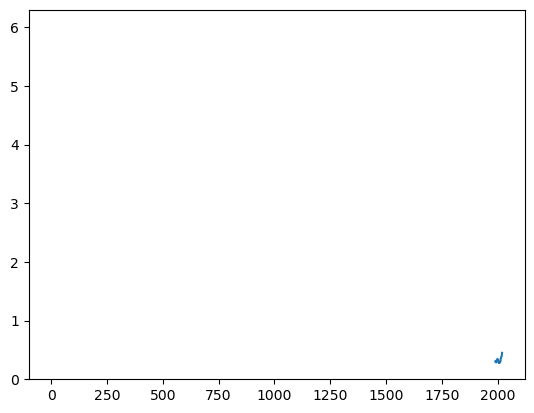

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  44.871
Date:                Wed, 01 Nov 2023   AIC                            -85.742
Time:                        23:06:49   BIC                            -83.008
Sample:                             0   HQIC                           -84.886
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8058      0.189     -4.256      0.000      -1.177      -0.435
sigma2         0.0026      0.001      3.339      0.001       0.001       0.004
Ljung-Box (L1) (Q):                   1.15   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29   -0.054295
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

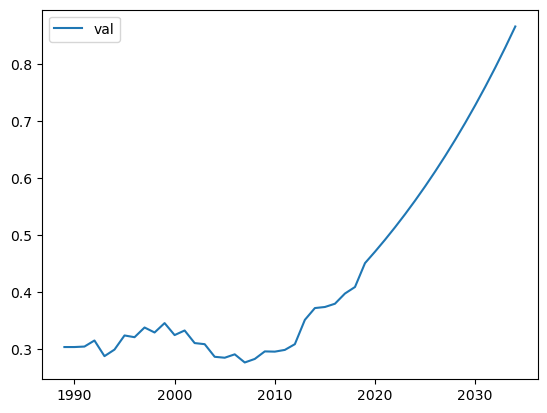

forecasting parittomia_30_34


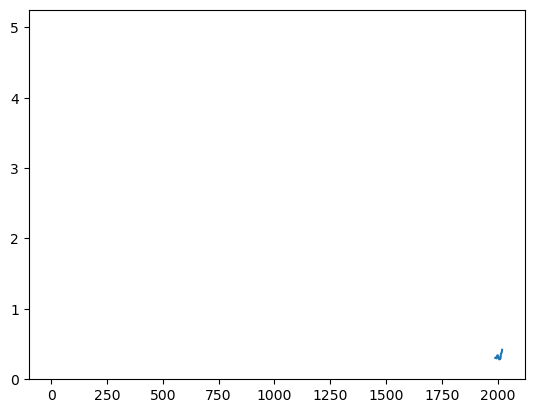

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   29
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  55.045
Date:                Wed, 01 Nov 2023   AIC                           -106.090
Time:                        23:06:50   BIC                           -103.355
Sample:                             0   HQIC                          -105.233
                                 - 29                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6492      0.147     -4.411      0.000      -0.938      -0.361
sigma2         0.0013      0.000      2.832      0.005       0.000       0.002
Ljung-Box (L1) (Q):                   0.08   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

29   -0.034324
30    0.000000
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

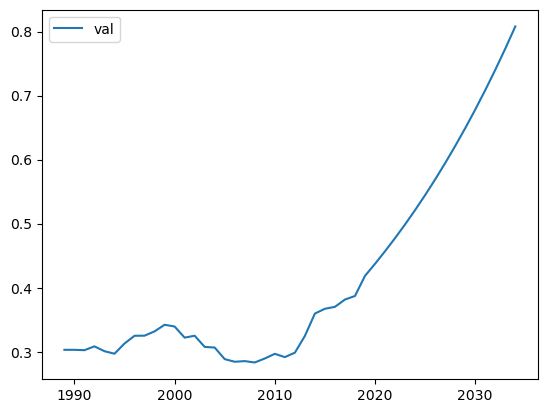

       hedelmallisyysluku  pienituloisuus_miehet_18_29  \
vuosi                                                    
1989             1.710000                     9.400000   
1990             1.782000                     7.900000   
1991             1.794000                    10.900000   
1992             1.847000                    13.500000   
1993             1.813000                    12.700000   
1994             1.847000                    14.200000   
1995             1.807000                    15.900000   
1996             1.764000                    19.300000   
1997             1.746000                    18.200000   
1998             1.700000                    17.900000   
1999             1.735000                    18.200000   
2000             1.729000                    16.700000   
2001             1.726000                    19.200000   
2002             1.718000                    21.000000   
2003             1.760000                    21.100000   
2004          

forecasting hedelmallisyysluku


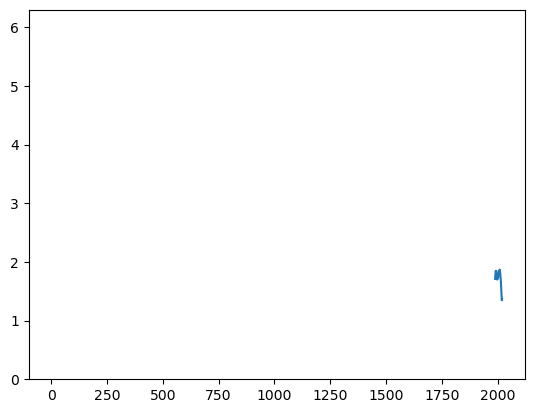

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  72.634
Date:                Wed, 01 Nov 2023   AIC                           -141.267
Time:                        23:06:52   BIC                           -138.465
Sample:                             0   HQIC                          -140.371
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5752      0.222     -2.590      0.010      -1.010      -0.140
sigma2         0.0005    8.9e-05      5.120      0.000       0.000       0.001
Ljung-Box (L1) (Q):                   0.01   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30   -0.035288
31    0.020297
32   -0.011674
33    0.006715
34   -0.003862
35    0.002221
36   -0.001278
37    0.000735
38   -0.000423
39    0.000243
40   -0.000140
41    0.000080
42   -0.000046
43    0.000027
dtype: float64

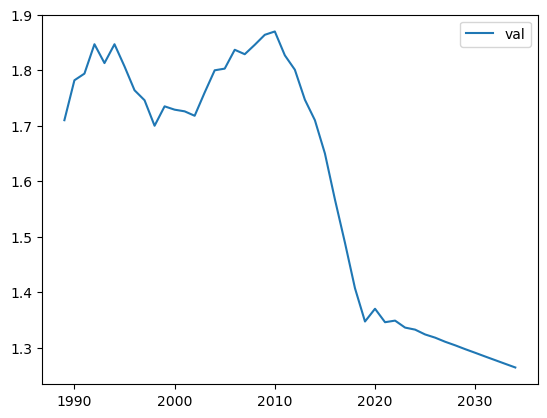

forecasting pienituloisuus_miehet_18_29


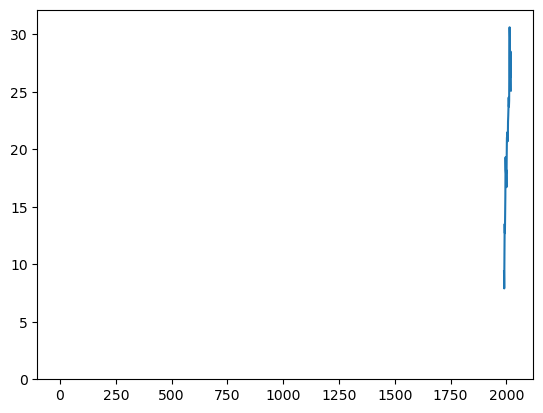

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:               SARIMAX(2, 0, 2)   Log Likelihood                 103.725
Date:                Wed, 01 Nov 2023   AIC                           -197.450
Time:                        23:06:53   BIC                           -190.444
Sample:                             0   HQIC                          -195.209
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2506      0.247      1.016      0.310      -0.233       0.734
ar.L2         -0.6124      0.256     -2.389      0.017      -1.115      -0.110
ma.L1         -0.9228      0.360     -2.565      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30    0.017499
31    0.012078
32   -0.007690
33   -0.009324
34    0.002373
35    0.006305
36    0.000127
37   -0.003830
38   -0.001037
39    0.002085
40    0.001158
41   -0.000987
42   -0.000956
43    0.000365
dtype: float64

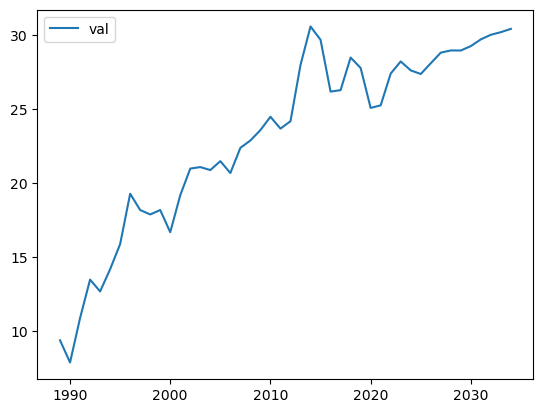

forecasting pienituloisuus_naiset_18_29


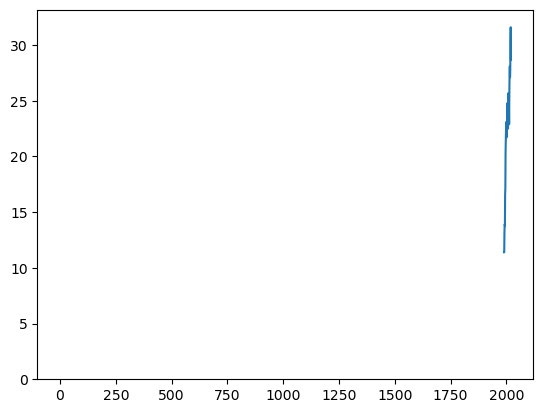

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:               SARIMAX(4, 0, 0)   Log Likelihood                 106.270
Date:                Wed, 01 Nov 2023   AIC                           -202.541
Time:                        23:06:54   BIC                           -195.535
Sample:                             0   HQIC                          -200.299
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6903      0.295     -2.342      0.019      -1.268      -0.113
ar.L2         -0.7915      0.282     -2.807      0.005      -1.344      -0.239
ar.L3         -0.8622      0.209     -4.131      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30    0.011342
31    0.017813
32    0.008875
33   -0.017015
34   -0.015387
35    0.008976
36    0.016935
37    0.001598
38   -0.015801
39   -0.008717
40    0.010053
41    0.012913
42   -0.002738
43   -0.013347
dtype: float64

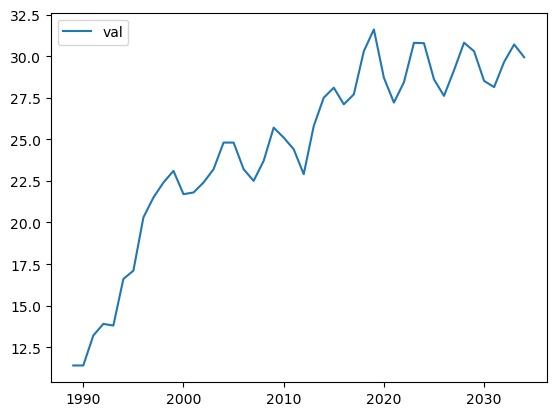

forecasting lapsikuolleisuus


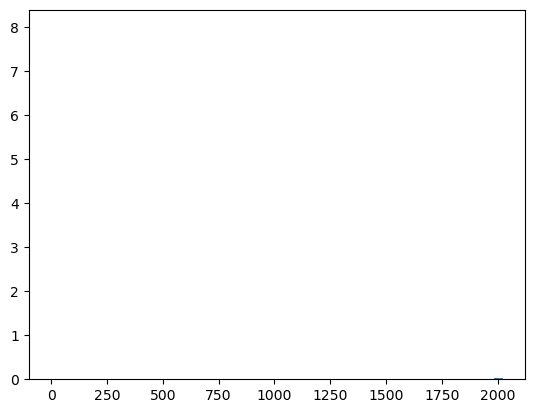

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  26.327
Date:                Wed, 01 Nov 2023   AIC                            -46.655
Time:                        23:06:55   BIC                            -42.451
Sample:                             0   HQIC                           -45.310
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.4660      0.198     -7.395      0.000      -1.855      -1.077
ma.L2          0.5103      0.187      2.733      0.006       0.144       0.876
sigma2         0.0090      0.003      2.716      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30    0.075050
31   -0.005035
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

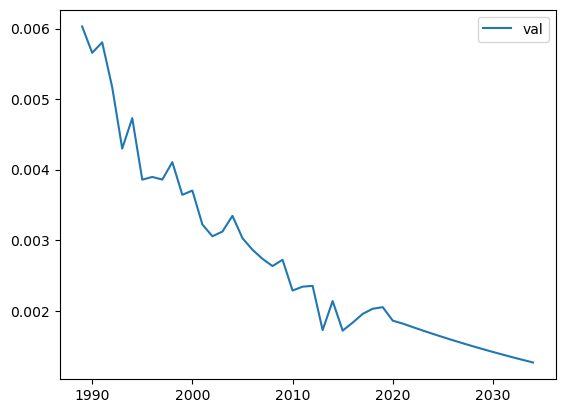

forecasting synnyttajien_keskiika


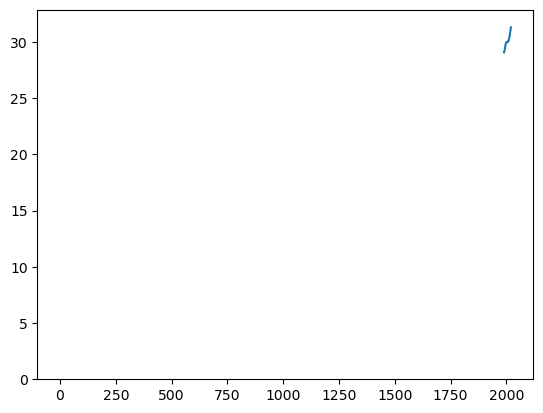

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:               SARIMAX(2, 0, 0)   Log Likelihood                 137.915
Date:                Wed, 01 Nov 2023   AIC                           -269.831
Time:                        23:06:56   BIC                           -265.627
Sample:                             0   HQIC                          -268.486
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4652      0.191     -2.431      0.015      -0.840      -0.090
ar.L2         -0.4101      0.183     -2.235      0.025      -0.770      -0.051
sigma2      5.852e-06   2.48e-06      2.360      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30    0.000268
31    0.001794
32   -0.000945
33   -0.000296
34    0.000525
35   -0.000123
36   -0.000158
37    0.000124
38    0.000007
39   -0.000054
40    0.000022
41    0.000012
42   -0.000015
43    0.000002
dtype: float64

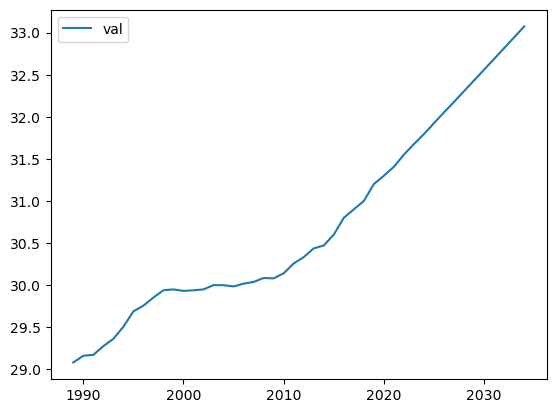

forecasting sisempikaupunki


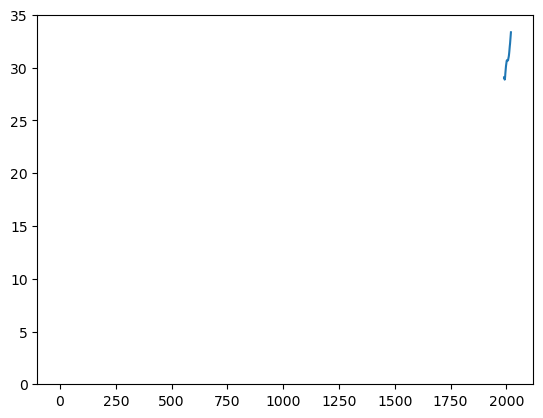

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:               SARIMAX(0, 0, 1)   Log Likelihood                 187.819
Date:                Wed, 01 Nov 2023   AIC                           -371.638
Time:                        23:06:57   BIC                           -368.836
Sample:                             0   HQIC                          -370.742
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.2953      0.208      1.420      0.156      -0.112       0.703
sigma2      2.128e-07   5.55e-08      3.832      0.000    1.04e-07    3.22e-07
Ljung-Box (L1) (Q):                   0.01   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30    4.298889e-07
31    0.000000e+00
32    0.000000e+00
33    0.000000e+00
34    0.000000e+00
35    0.000000e+00
36    0.000000e+00
37    0.000000e+00
38    0.000000e+00
39    0.000000e+00
40    0.000000e+00
41    0.000000e+00
42    0.000000e+00
43    0.000000e+00
dtype: float64

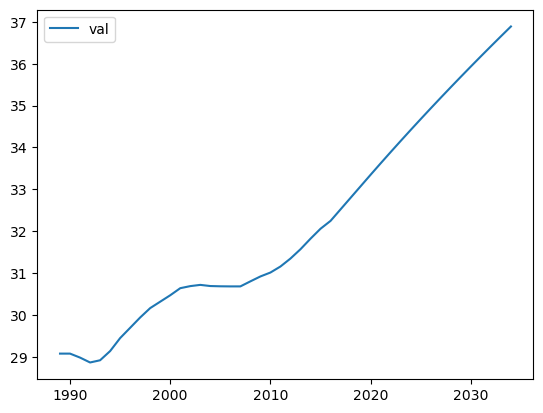

forecasting ulompikaupunki


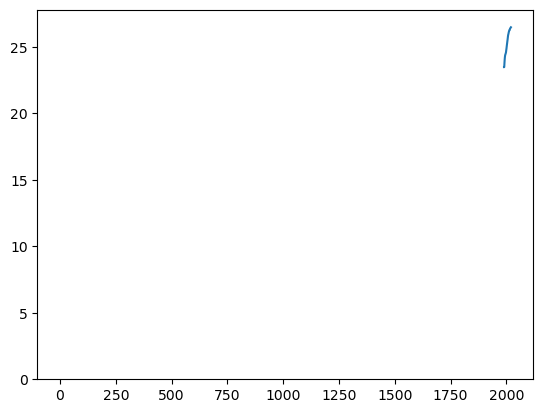

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:                        SARIMAX   Log Likelihood                 196.665
Date:                Wed, 01 Nov 2023   AIC                           -391.331
Time:                        23:06:58   BIC                           -389.929
Sample:                             0   HQIC                          -390.882
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1.184e-07   1.16e-08     10.249      0.000    9.58e-08    1.41e-07
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               223.00
Prob(Q):                              0.95   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30    0.0
31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

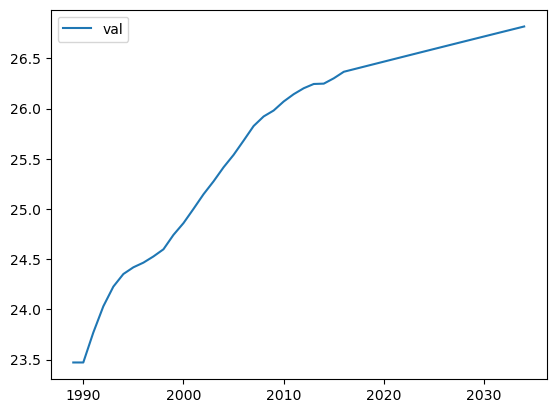

forecasting kehyskaupunki


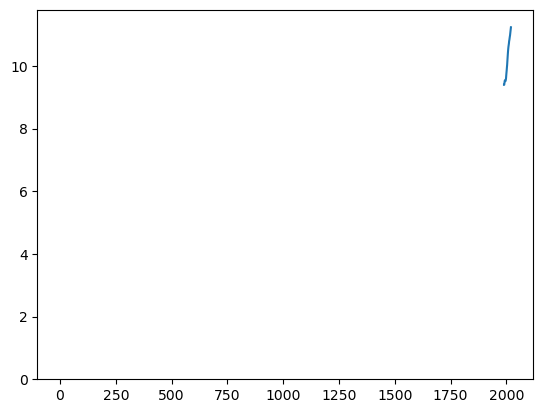

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:                        SARIMAX   Log Likelihood                 256.880
Date:                Wed, 01 Nov 2023   AIC                           -511.760
Time:                        23:06:59   BIC                           -510.359
Sample:                             0   HQIC                          -511.312
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      2.138e-09   7.68e-10      2.785      0.005    6.33e-10    3.64e-09
Ljung-Box (L1) (Q):                   0.09   Jarque-Bera (JB):                 0.21
Prob(Q):                              0.76   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30    0.0
31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

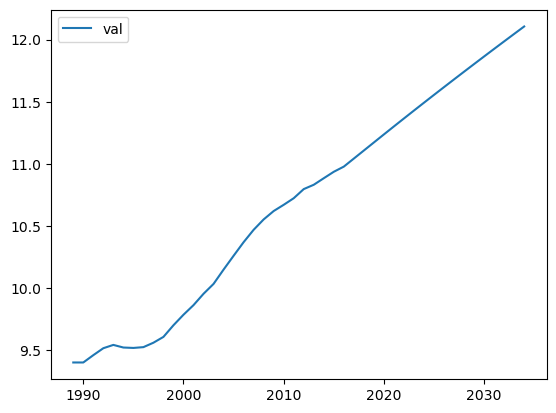

forecasting maaseudulla


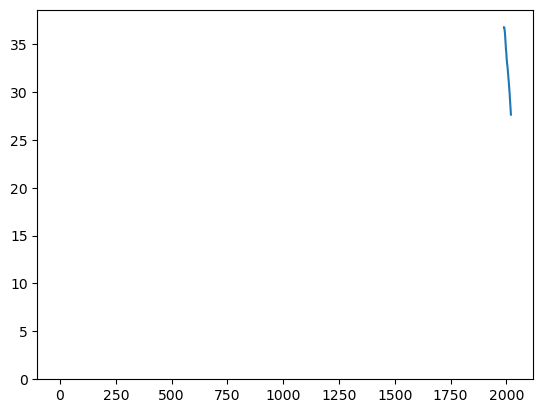

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:                        SARIMAX   Log Likelihood                 179.396
Date:                Wed, 01 Nov 2023   AIC                           -356.792
Time:                        23:07:00   BIC                           -355.390
Sample:                             0   HQIC                          -356.343
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      3.745e-07   6.33e-08      5.918      0.000     2.5e-07    4.99e-07
Ljung-Box (L1) (Q):                   0.68   Jarque-Bera (JB):                 9.77
Prob(Q):                              0.41   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30    0.0
31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

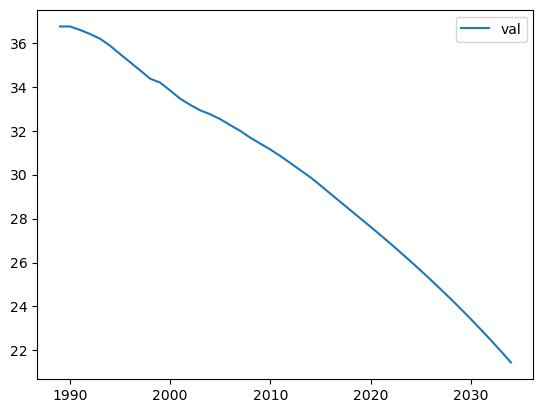

forecasting avioituvuus_naiset_30_34


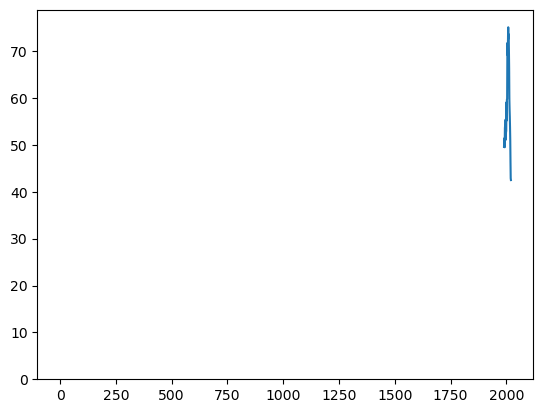

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  15.043
Date:                Wed, 01 Nov 2023   AIC                            -24.087
Time:                        23:07:01   BIC                            -19.883
Sample:                             0   HQIC                           -22.742
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9596      0.248     -3.874      0.000      -1.445      -0.474
ma.L2          0.3308      0.248      1.336      0.181      -0.154       0.816
sigma2         0.0208      0.006      3.698      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30   -0.121341
31    0.035708
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

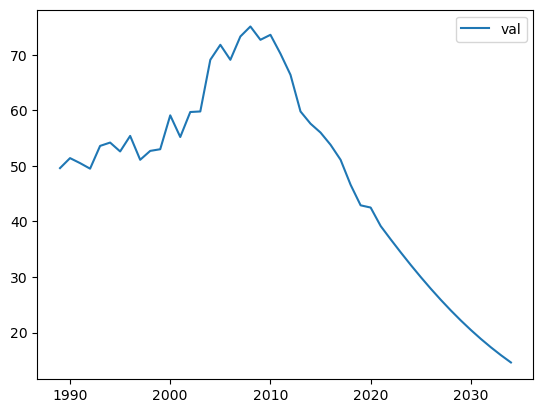

forecasting avioituvuus_naiset_25_29


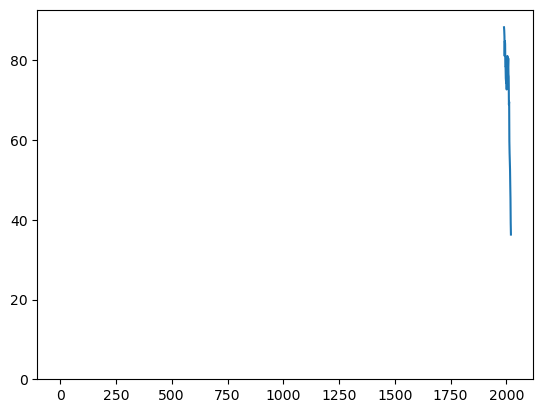

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:               SARIMAX(0, 0, 2)   Log Likelihood                   8.116
Date:                Wed, 01 Nov 2023   AIC                            -10.233
Time:                        23:07:01   BIC                             -6.029
Sample:                             0   HQIC                            -8.888
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.1957      0.221     -5.411      0.000      -1.629      -0.763
ma.L2          0.5228      0.190      2.750      0.006       0.150       0.895
sigma2         0.0323      0.011      2.990      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30   -0.010477
31   -0.027252
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

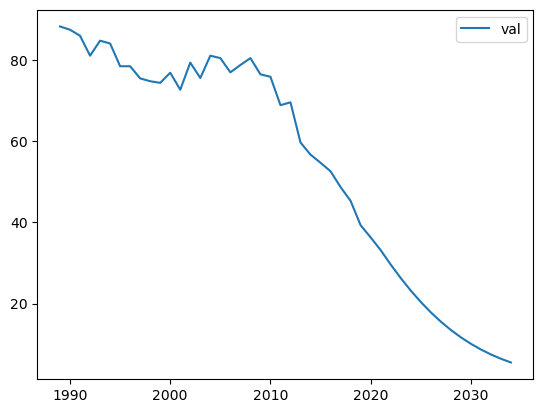

forecasting eronneisuus_25_29


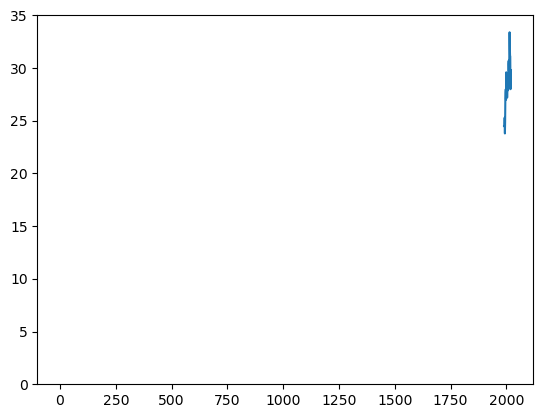

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:               SARIMAX(1, 0, 3)   Log Likelihood                  41.030
Date:                Wed, 01 Nov 2023   AIC                            -72.061
Time:                        23:07:03   BIC                            -65.055
Sample:                             0   HQIC                           -69.820
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6186      0.588     -1.052      0.293      -1.771       0.534
ma.L1         -0.3896      0.804     -0.484      0.628      -1.966       1.187
ma.L2         -0.8402      1.035     -0.812      0.4

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30   -0.046163
31    0.062323
32   -0.044732
33    0.027672
34   -0.017119
35    0.010590
36   -0.006551
37    0.004053
38   -0.002507
39    0.001551
40   -0.000959
41    0.000594
42   -0.000367
43    0.000227
dtype: float64

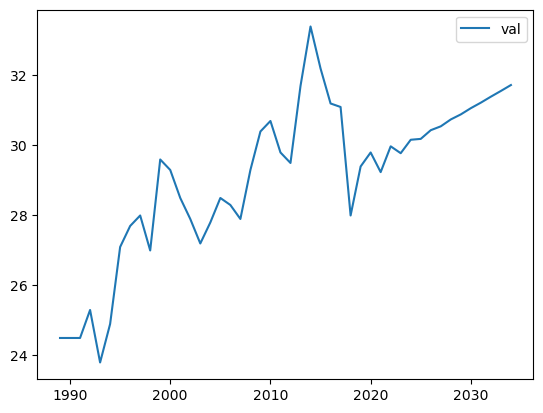

forecasting eronneisuus_30_34


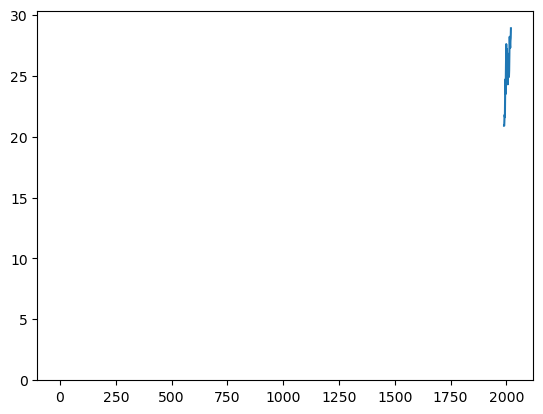

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:               SARIMAX(2, 0, 3)   Log Likelihood                  45.969
Date:                Wed, 01 Nov 2023   AIC                            -79.938
Time:                        23:07:04   BIC                            -71.530
Sample:                             0   HQIC                           -77.248
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3109      0.916     -0.340      0.734      -2.106       1.484
ar.L2         -0.1767      0.697     -0.254      0.800      -1.542       1.189
ma.L1         -0.6233      0.798     -0.781      0.4

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30   -2.299185e-02
31   -1.032704e-02
32    9.010197e-03
33   -9.769950e-04
34   -1.287916e-03
35    5.730024e-04
36    4.936517e-05
37   -1.165694e-04
38    2.752116e-05
39    1.203581e-05
40   -8.603603e-06
41    5.487271e-07
42    1.349240e-06
43   -5.164138e-07
dtype: float64

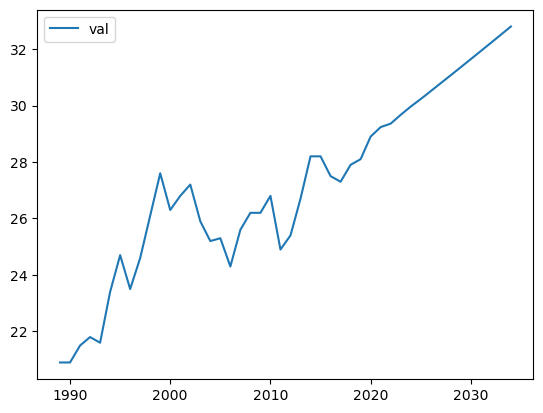

forecasting kolmasaste_miehet_25_29


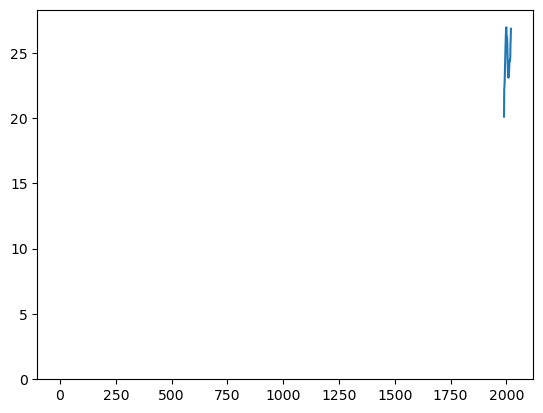

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  64.485
Date:                Wed, 01 Nov 2023   AIC                           -124.970
Time:                        23:07:05   BIC                           -122.168
Sample:                             0   HQIC                          -124.074
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5946      0.095     -6.275      0.000      -0.780      -0.409
sigma2         0.0008      0.000      5.066      0.000       0.000       0.001
Ljung-Box (L1) (Q):                   1.50   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30   -0.011613
31    0.006905
32   -0.004105
33    0.002441
34   -0.001451
35    0.000863
36   -0.000513
37    0.000305
38   -0.000181
39    0.000108
40   -0.000064
41    0.000038
42   -0.000023
43    0.000013
dtype: float64

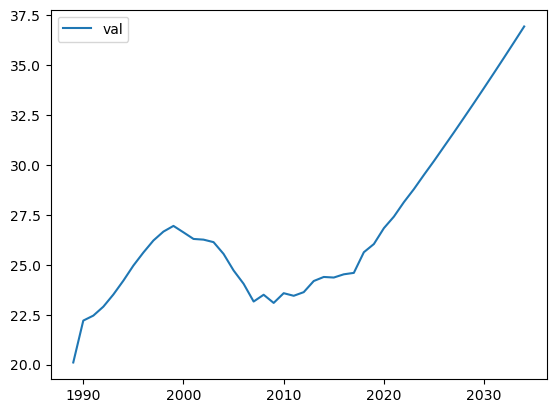

forecasting miehet_perusaste_25_29


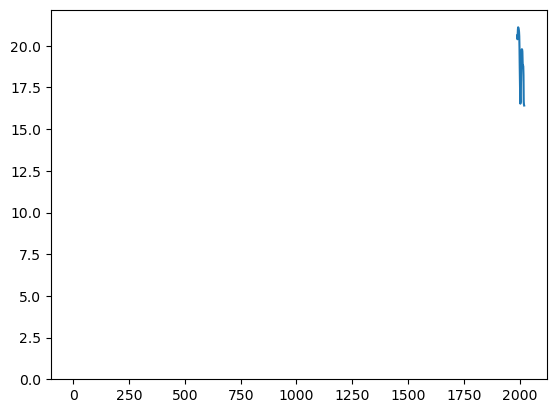

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:                        SARIMAX   Log Likelihood                  61.671
Date:                Wed, 01 Nov 2023   AIC                           -121.341
Time:                        23:07:06   BIC                           -119.940
Sample:                             0   HQIC                          -120.893
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0010      0.000      5.534      0.000       0.001       0.001
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                 7.41
Prob(Q):                              0.89   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30    0.0
31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

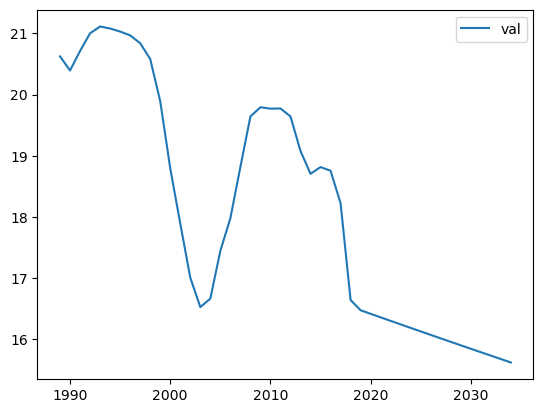

forecasting naiset_perusaste_25_29


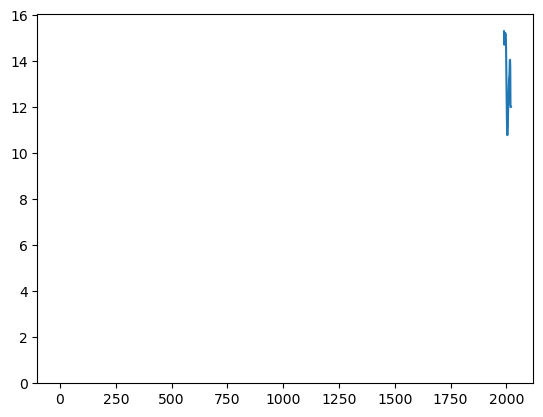

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:               SARIMAX(0, 0, 4)   Log Likelihood                  57.305
Date:                Wed, 01 Nov 2023   AIC                           -104.610
Time:                        23:07:07   BIC                            -97.604
Sample:                             0   HQIC                          -102.368
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.3570      0.759     -0.470      0.638      -1.845       1.131
ma.L2          0.1979      0.535      0.370      0.711      -0.851       1.246
ma.L3         -0.8195      0.674     -1.216      0.2

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30    0.076853
31   -0.051930
32   -0.032444
33    0.000155
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

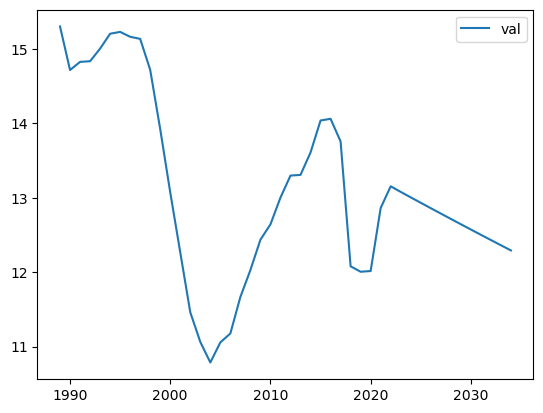

forecasting kolmasaste_naiset_25_29


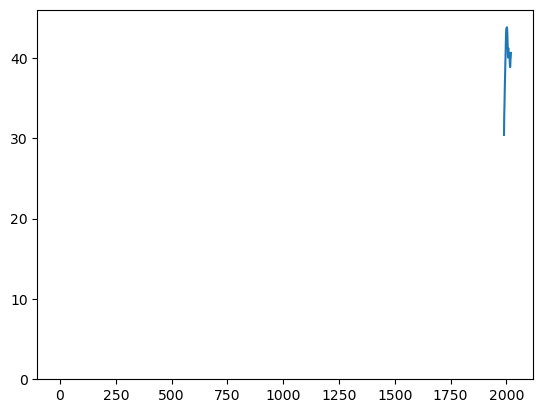

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  66.431
Date:                Wed, 01 Nov 2023   AIC                           -128.862
Time:                        23:07:08   BIC                           -126.060
Sample:                             0   HQIC                          -127.966
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5065      0.165     -3.064      0.002      -0.830      -0.183
sigma2         0.0007      0.000      5.595      0.000       0.000       0.001
Ljung-Box (L1) (Q):                   0.02   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30   -0.008154
31    0.004130
32   -0.002092
33    0.001059
34   -0.000537
35    0.000272
36   -0.000138
37    0.000070
38   -0.000035
39    0.000018
40   -0.000009
41    0.000005
42   -0.000002
43    0.000001
dtype: float64

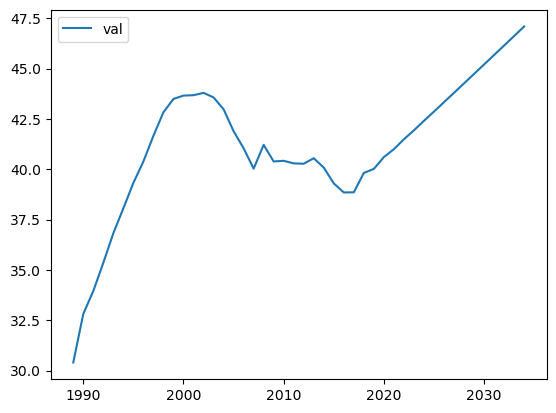

forecasting alypuhelin


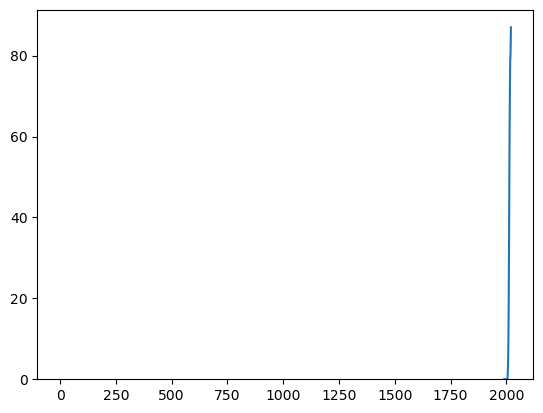

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:               SARIMAX(5, 0, 0)   Log Likelihood                  34.789
Date:                Wed, 01 Nov 2023   AIC                            -57.579
Time:                        23:07:09   BIC                            -49.171
Sample:                             0   HQIC                           -54.889
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2197      0.166      1.325      0.185      -0.105       0.545
ar.L2         -1.2307      0.196     -6.284      0.000      -1.615      -0.847
ar.L3          1.0320      0.378      2.729      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:1346: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum
/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30   -0.510157
31   -0.265796
32    0.754698
33    0.073044
34   -0.722867
35    0.243522
36    0.626189
37   -0.397040
38   -0.358514
39    0.481281
40    0.138177
41   -0.383384
42    0.060610
43    0.244584
dtype: float64

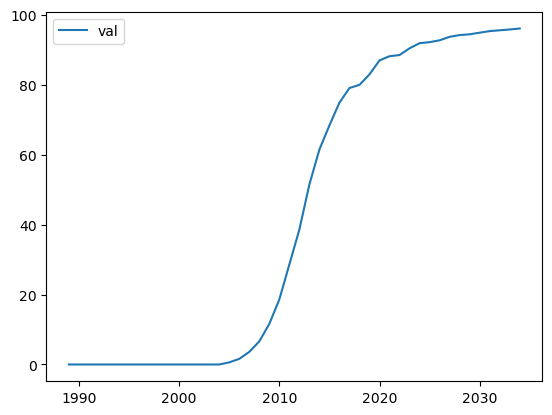

forecasting some_25_34


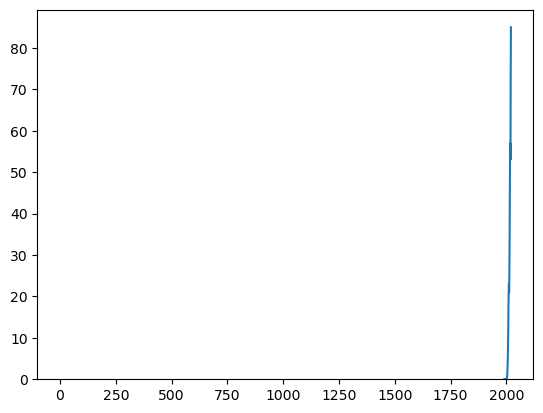

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:               SARIMAX(2, 0, 1)   Log Likelihood                  13.096
Date:                Wed, 01 Nov 2023   AIC                            -18.192
Time:                        23:07:10   BIC                            -12.587
Sample:                             0   HQIC                           -16.399
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0968      1.356     -0.071      0.943      -2.754       2.560
ar.L2         -0.8425      0.291     -2.900      0.004      -1.412      -0.273
ma.L1          0.6422      1.446      0.444      0.6

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30   -0.798098
31   -0.405756
32    0.711673
33    0.272920
34   -0.625999
35   -0.169305
36    0.543786
37    0.089974
38   -0.466840
39   -0.030591
40    0.396265
41   -0.012603
42   -0.332623
43    0.042830
dtype: float64

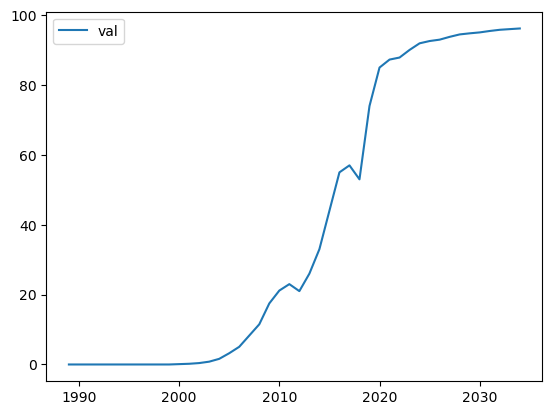

forecasting some_35_44


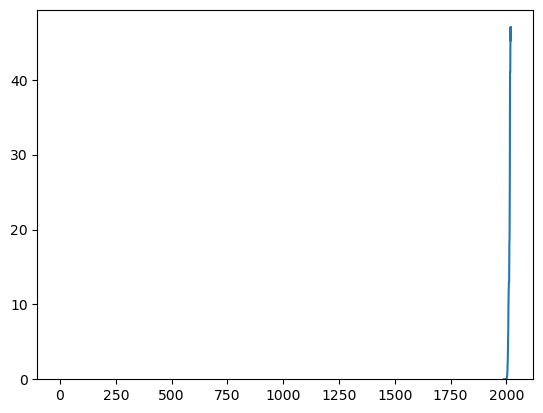

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:               SARIMAX(0, 0, 3)   Log Likelihood                  69.127
Date:                Wed, 01 Nov 2023   AIC                           -130.254
Time:                        23:07:11   BIC                           -124.649
Sample:                             0   HQIC                          -128.461
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8689      0.186     -4.684      0.000      -1.232      -0.505
ma.L2          0.5639      0.872      0.647      0.518      -1.144       2.272
ma.L3         -0.5393      0.455     -1.185      0.2

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30   -0.023349
31    0.020123
32   -0.005944
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

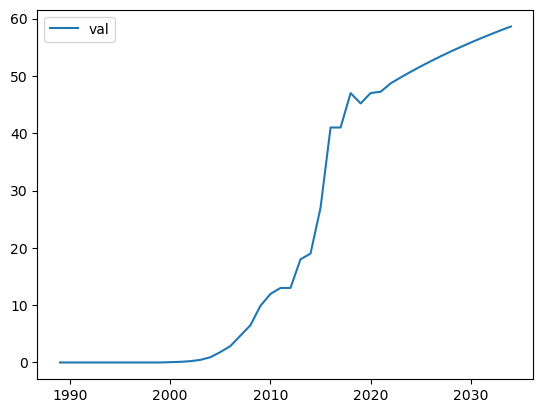

forecasting työttömyys_miehet_25_34


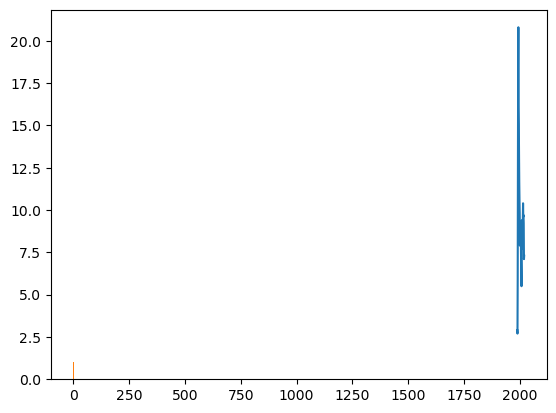

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:               SARIMAX(4, 0, 0)   Log Likelihood                  -0.207
Date:                Wed, 01 Nov 2023   AIC                             10.413
Time:                        23:07:12   BIC                             17.419
Sample:                             0   HQIC                            12.654
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3280      0.292     -1.124      0.261      -0.900       0.244
ar.L2         -0.2831      0.209     -1.354      0.176      -0.693       0.127
ar.L3         -0.4124      0.216     -1.911      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30   -0.062404
31    0.060687
32   -0.014638
33   -0.148817
34    0.060382
35   -0.003192
36    0.052928
37    0.036016
38   -0.056878
39   -0.011704
40   -0.022427
41    0.015399
42    0.035697
43   -0.000736
dtype: float64

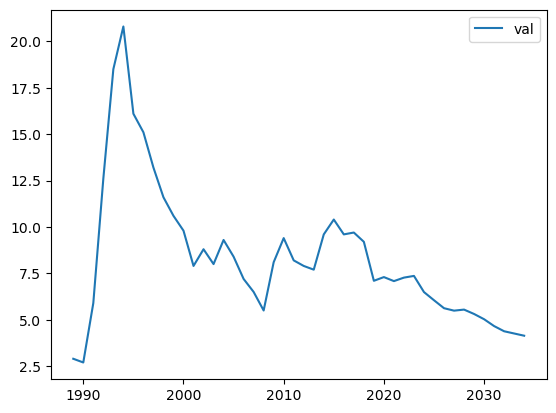

forecasting työttömyys_naiset_25_34


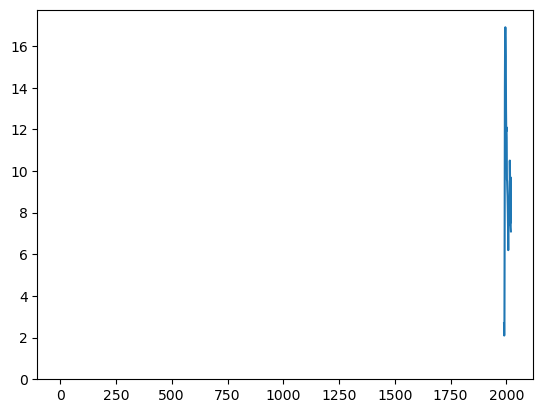

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:               SARIMAX(1, 0, 2)   Log Likelihood                  -2.535
Date:                Wed, 01 Nov 2023   AIC                             13.069
Time:                        23:07:14   BIC                             18.674
Sample:                             0   HQIC                            14.862
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1945      0.350     -0.555      0.579      -0.881       0.492
ma.L1         -0.2322      0.363     -0.640      0.522      -0.943       0.479
ma.L2         -0.6826      0.354     -1.928      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30    2.275630e-01
31   -2.104438e-01
32    4.092090e-02
33   -7.957090e-03
34    1.547260e-03
35   -3.008655e-04
36    5.850345e-05
37   -1.137603e-05
38    2.212074e-06
39   -4.301389e-07
40    8.364073e-08
41   -1.626398e-08
42    3.162539e-09
43   -6.149574e-10
dtype: float64

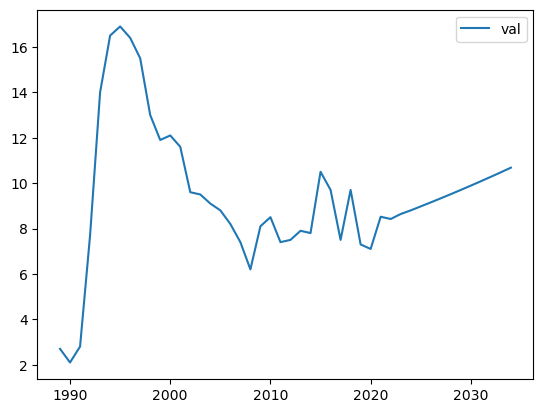

forecasting työllisyysaste_miehet_25_34


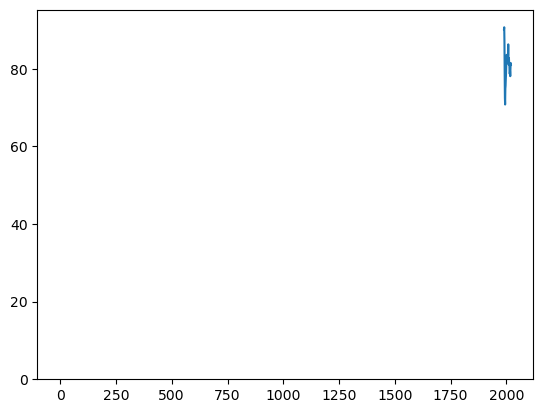

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:               SARIMAX(0, 0, 1)   Log Likelihood                   9.106
Date:                Wed, 01 Nov 2023   AIC                            -14.211
Time:                        23:07:15   BIC                            -11.409
Sample:                             0   HQIC                           -13.315
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6277      0.202     -3.100      0.002      -1.025      -0.231
sigma2         0.0314      0.007      4.533      0.000       0.018       0.045
Ljung-Box (L1) (Q):                   2.03   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30    0.045535
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

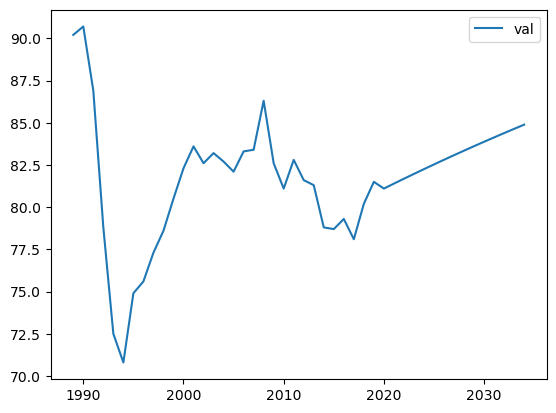

forecasting työllisyysaste_naiset_25_34


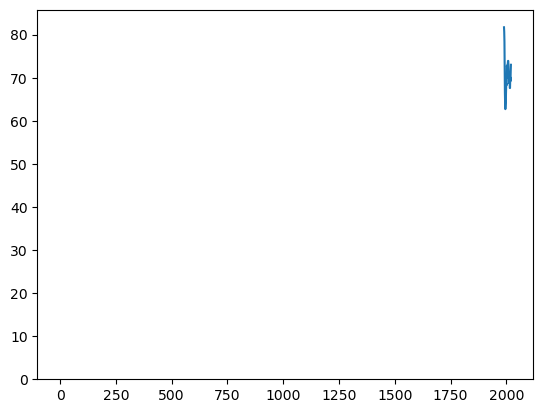

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  24.898
Date:                Wed, 01 Nov 2023   AIC                            -45.796
Time:                        23:07:16   BIC                            -42.993
Sample:                             0   HQIC                           -44.899
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5652      0.167     -3.382      0.001      -0.893      -0.238
sigma2         0.0110      0.004      2.712      0.007       0.003       0.019
Ljung-Box (L1) (Q):                   0.01   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30   -0.022518
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

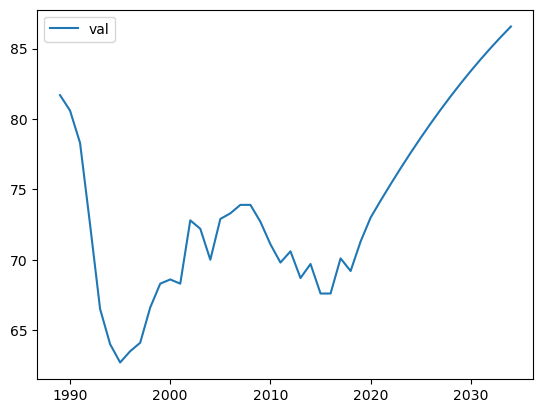

forecasting työttömyys_miehet_35_44


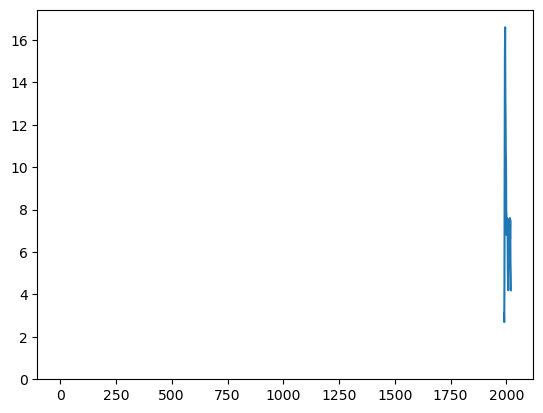

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:               SARIMAX(3, 0, 0)   Log Likelihood                   1.414
Date:                Wed, 01 Nov 2023   AIC                              5.171
Time:                        23:07:17   BIC                             10.776
Sample:                             0   HQIC                             6.964
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1094      0.154     -0.710      0.478      -0.411       0.192
ar.L2         -0.1473      0.164     -0.898      0.369      -0.469       0.174
ar.L3         -0.6667      0.171     -3.909      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30    0.287685
31   -0.173337
32    0.031357
33   -0.169696
34    0.129499
35   -0.010076
36    0.095164
37   -0.095257
38    0.003120
39   -0.049757
40    0.068488
41   -0.002242
42    0.023331
43   -0.047881
dtype: float64

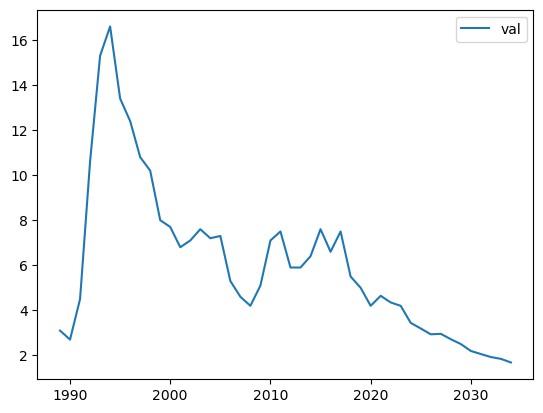

forecasting työttömyys_naiset_35_44


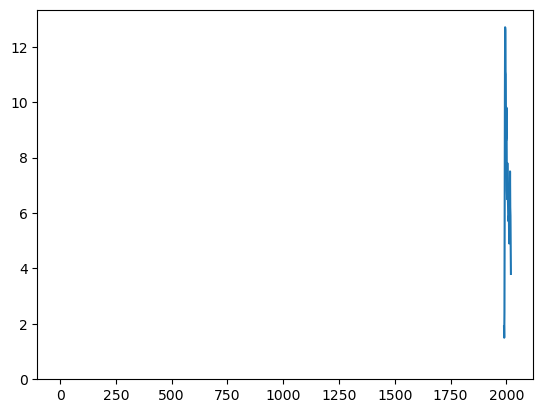

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  -0.563
Date:                Wed, 01 Nov 2023   AIC                              7.125
Time:                        23:07:18   BIC                             11.329
Sample:                             0   HQIC                             8.470
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.3690      0.234     -1.575      0.115      -0.828       0.090
ma.L2         -0.5106      0.218     -2.342      0.019      -0.938      -0.083
sigma2         0.0579      0.018      3.136      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30    0.169924
31    0.041917
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

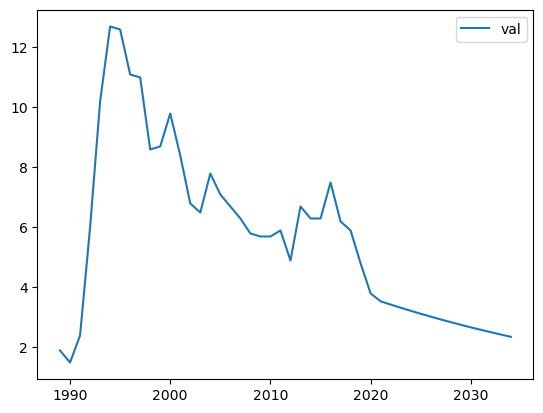

forecasting työllisyysaste_miehet_35_44


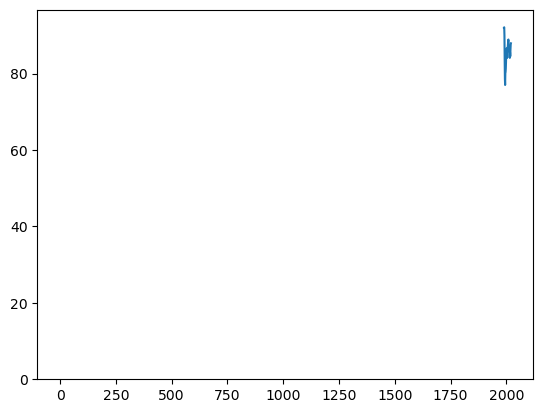

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  13.065
Date:                Wed, 01 Nov 2023   AIC                            -20.130
Time:                        23:07:19   BIC                            -15.926
Sample:                             0   HQIC                           -18.785
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5295      0.292     -1.814      0.070      -1.101       0.043
ma.L2         -0.3728      0.218     -1.710      0.087      -0.800       0.055
sigma2         0.0233      0.008      2.859      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30   -0.020184
31   -0.004396
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

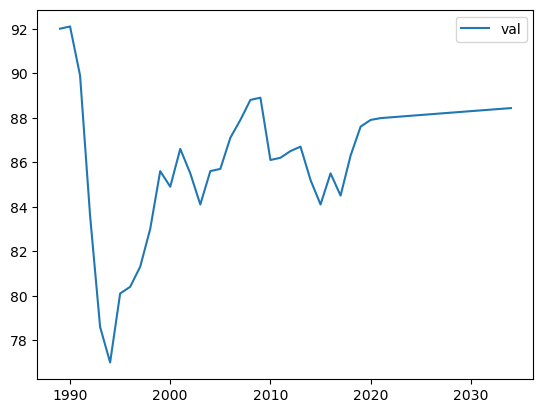

forecasting työllisyysaste_naiset_35_44


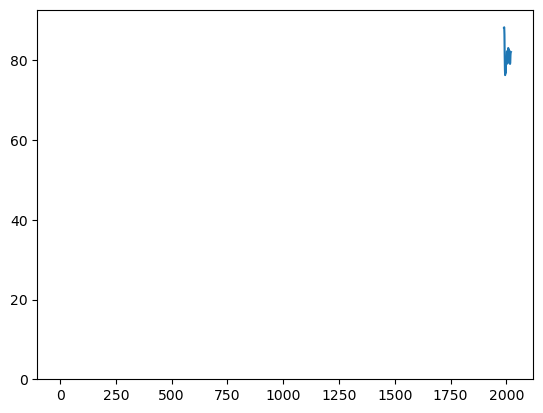

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  21.246
Date:                Wed, 01 Nov 2023   AIC                            -38.492
Time:                        23:07:20   BIC                            -35.689
Sample:                             0   HQIC                           -37.595
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7440      0.166     -4.476      0.000      -1.070      -0.418
sigma2         0.0138      0.004      3.606      0.000       0.006       0.021
Ljung-Box (L1) (Q):                   0.92   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30    0.015637
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

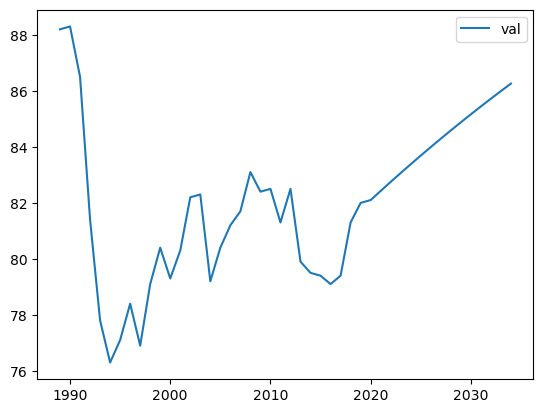

forecasting ei_aviossa_30_34


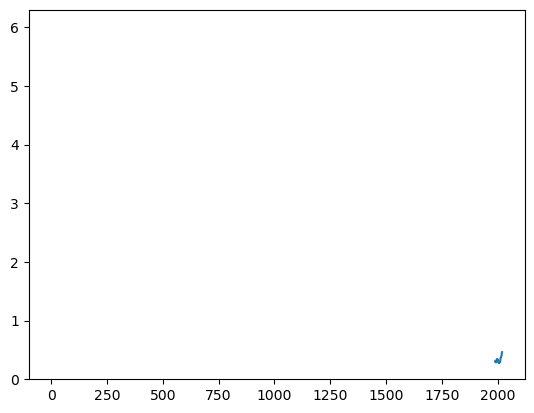

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  46.902
Date:                Wed, 01 Nov 2023   AIC                            -89.803
Time:                        23:07:21   BIC                            -87.001
Sample:                             0   HQIC                           -88.907
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8172      0.179     -4.562      0.000      -1.168      -0.466
sigma2         0.0025      0.001      3.483      0.000       0.001       0.004
Ljung-Box (L1) (Q):                   1.27   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30    0.011491
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

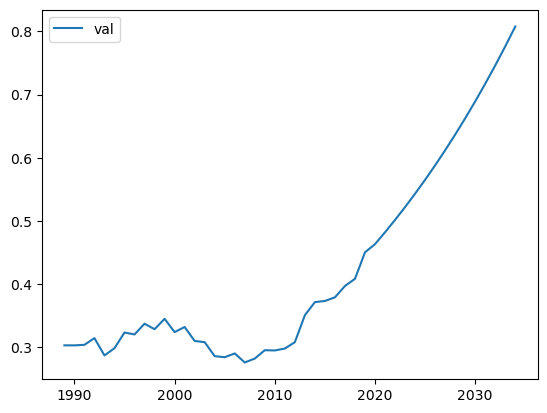

forecasting parittomia_30_34


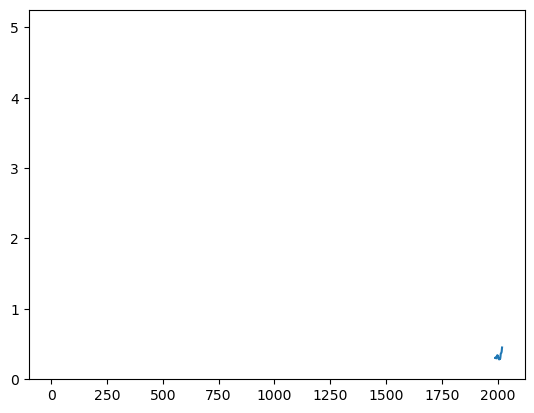

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   30
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  57.077
Date:                Wed, 01 Nov 2023   AIC                           -110.155
Time:                        23:07:22   BIC                           -107.352
Sample:                             0   HQIC                          -109.258
                                 - 30                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6220      0.145     -4.298      0.000      -0.906      -0.338
sigma2         0.0013      0.000      2.888      0.004       0.000       0.002
Ljung-Box (L1) (Q):                   0.14   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

30   -0.019035
31    0.000000
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

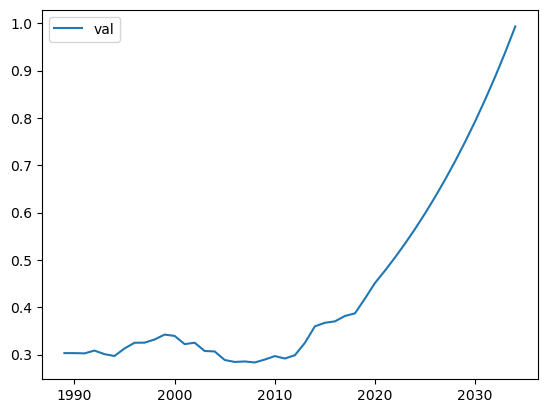

       hedelmallisyysluku  pienituloisuus_miehet_18_29  \
vuosi                                                    
1989             1.710000                     9.400000   
1990             1.782000                     7.900000   
1991             1.794000                    10.900000   
1992             1.847000                    13.500000   
1993             1.813000                    12.700000   
1994             1.847000                    14.200000   
1995             1.807000                    15.900000   
1996             1.764000                    19.300000   
1997             1.746000                    18.200000   
1998             1.700000                    17.900000   
1999             1.735000                    18.200000   
2000             1.729000                    16.700000   
2001             1.726000                    19.200000   
2002             1.718000                    21.000000   
2003             1.760000                    21.100000   
2004          

forecasting hedelmallisyysluku


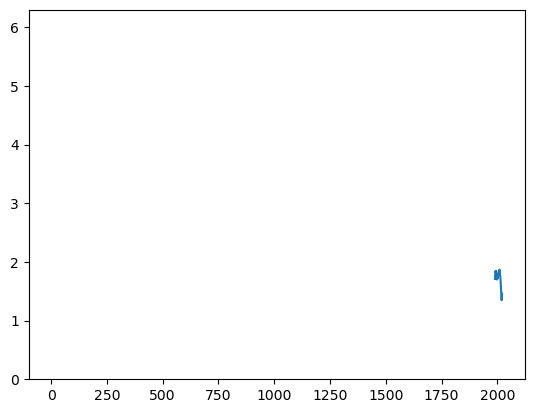

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  71.934
Date:                Wed, 01 Nov 2023   AIC                           -137.868
Time:                        23:07:23   BIC                           -133.567
Sample:                             0   HQIC                          -136.466
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.0447      0.194     -0.230      0.818      -0.426       0.336
ma.L2          0.4778      0.197      2.426      0.015       0.092       0.864
sigma2         0.0006      0.000      3.501      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31    0.026811
32    0.020860
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

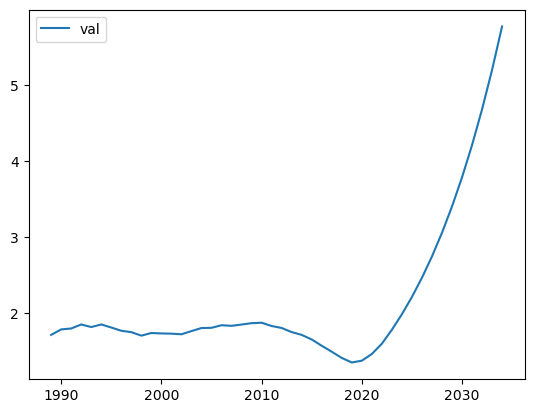

forecasting pienituloisuus_miehet_18_29


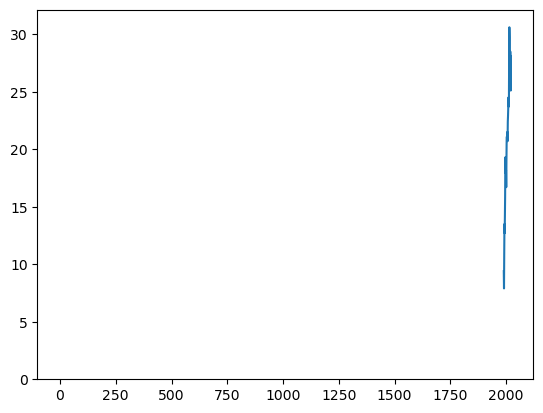

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:               SARIMAX(3, 0, 1)   Log Likelihood                 105.320
Date:                Wed, 01 Nov 2023   AIC                           -200.641
Time:                        23:07:24   BIC                           -193.471
Sample:                             0   HQIC                          -198.304
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2045      0.286      0.715      0.474      -0.356       0.765
ar.L2         -0.6467      0.276     -2.343      0.019      -1.188      -0.106
ar.L3          0.0587      0.263      0.223      0.8

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31   -0.000857
32   -0.023516
33   -0.002200
34    0.014708
35    0.003051
36   -0.009017
37   -0.002954
38    0.005407
39    0.002487
40   -0.003162
41   -0.001938
42    0.001794
43    0.001434
dtype: float64

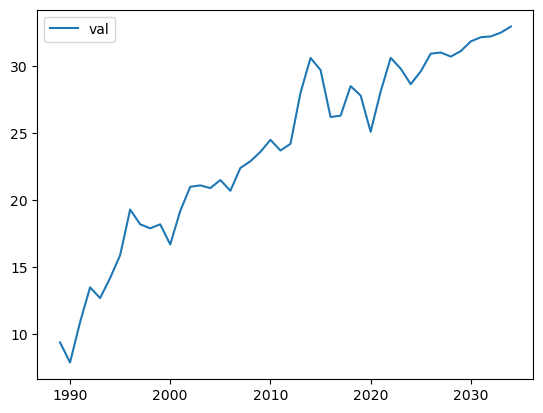

forecasting pienituloisuus_naiset_18_29


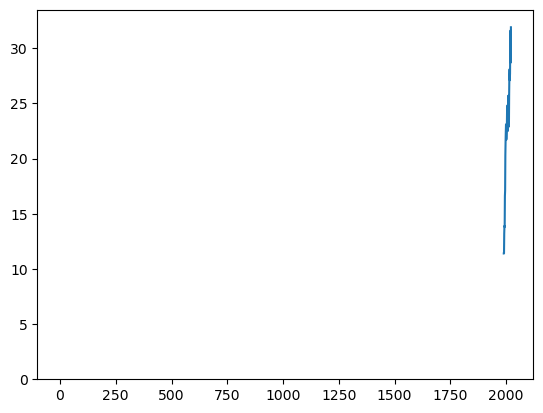

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:               SARIMAX(3, 0, 1)   Log Likelihood                 104.503
Date:                Wed, 01 Nov 2023   AIC                           -199.006
Time:                        23:07:25   BIC                           -191.836
Sample:                             0   HQIC                          -196.668
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4141      0.259     -1.599      0.110      -0.922       0.093
ar.L2         -0.4826      0.227     -2.126      0.034      -0.928      -0.038
ar.L3         -0.4284      0.359     -1.192      0.2

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31   -0.015448
32   -0.001888
33   -0.010911
34    0.012048
35    0.001086
36   -0.001589
37   -0.005027
38    0.002384
39    0.002120
40    0.000125
41   -0.002096
42   -0.000101
43    0.001000
dtype: float64

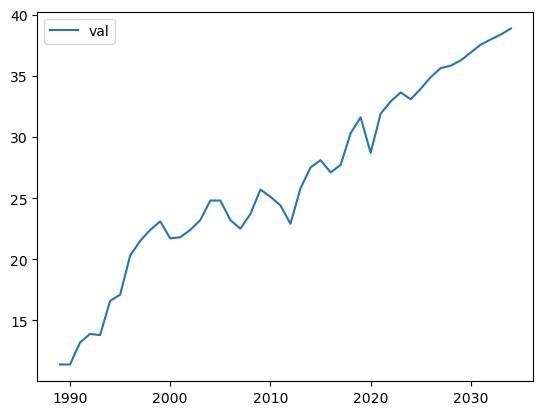

forecasting lapsikuolleisuus


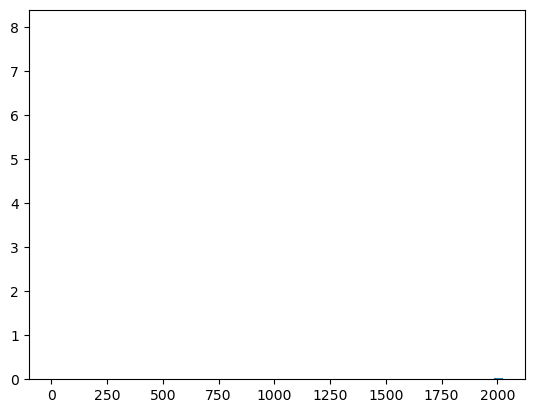

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  27.768
Date:                Wed, 01 Nov 2023   AIC                            -49.537
Time:                        23:07:26   BIC                            -45.235
Sample:                             0   HQIC                           -48.135
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.4659      0.192     -7.648      0.000      -1.842      -1.090
ma.L2          0.5104      0.181      2.825      0.005       0.156       0.864
sigma2         0.0087      0.003      2.838      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31   -0.013643
32    0.002986
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

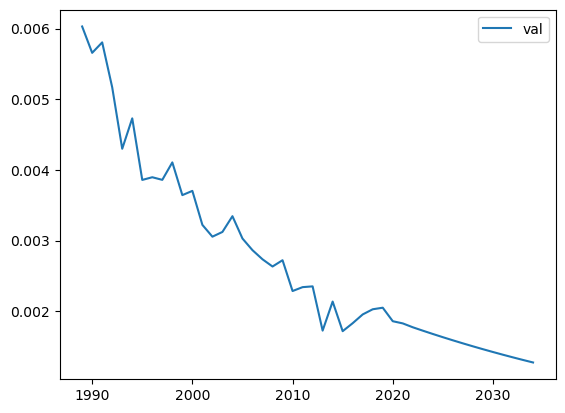

forecasting synnyttajien_keskiika


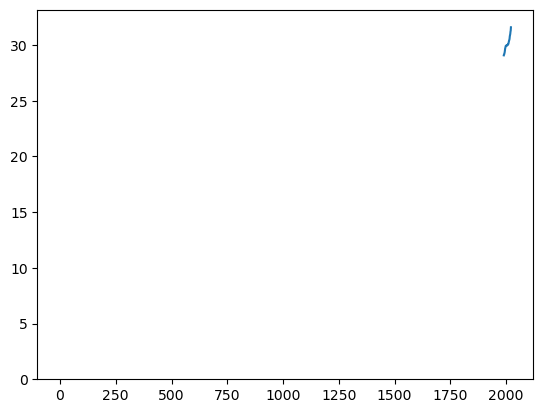

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:               SARIMAX(0, 0, 1)   Log Likelihood                 137.495
Date:                Wed, 01 Nov 2023   AIC                           -270.989
Time:                        23:07:27   BIC                           -268.122
Sample:                             0   HQIC                          -270.055
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5958      0.205     -2.906      0.004      -0.998      -0.194
sigma2      8.106e-06   2.06e-06      3.930      0.000    4.06e-06    1.21e-05
Ljung-Box (L1) (Q):                   0.09   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31   -0.004715
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

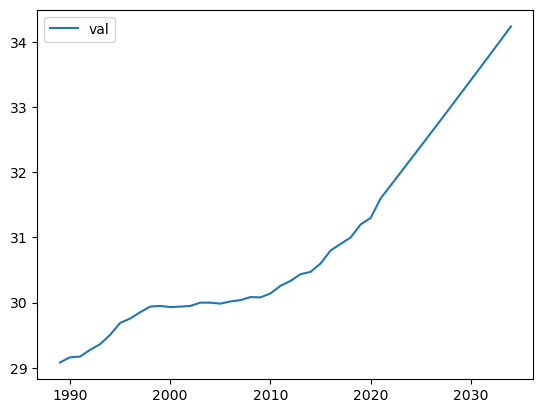

forecasting sisempikaupunki


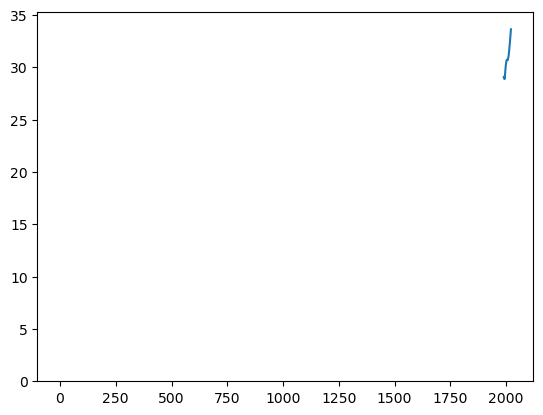

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:               SARIMAX(0, 0, 1)   Log Likelihood                 194.587
Date:                Wed, 01 Nov 2023   AIC                           -385.175
Time:                        23:07:28   BIC                           -382.307
Sample:                             0   HQIC                          -384.240
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.2954      0.201      1.471      0.141      -0.098       0.689
sigma2      2.056e-07   5.14e-08      3.997      0.000    1.05e-07    3.06e-07
Ljung-Box (L1) (Q):                   0.01   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31    0.000008
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

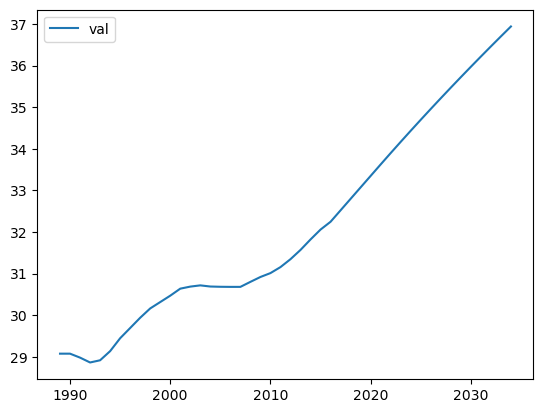

forecasting ulompikaupunki


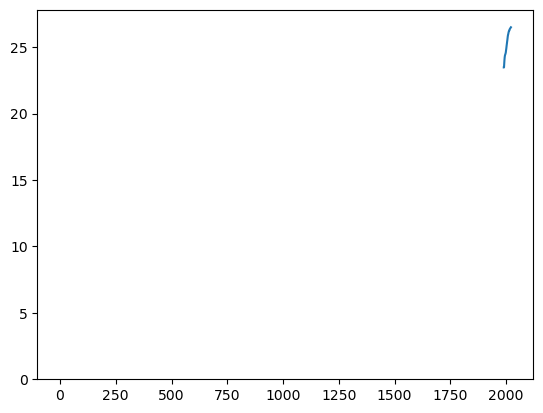

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:                        SARIMAX   Log Likelihood                 203.729
Date:                Wed, 01 Nov 2023   AIC                           -405.458
Time:                        23:07:29   BIC                           -404.024
Sample:                             0   HQIC                          -404.991
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1.146e-07   1.08e-08     10.603      0.000    9.34e-08    1.36e-07
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               247.74
Prob(Q):                              0.95   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

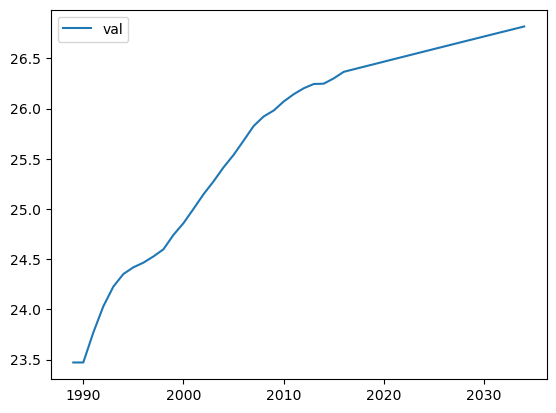

forecasting kehyskaupunki


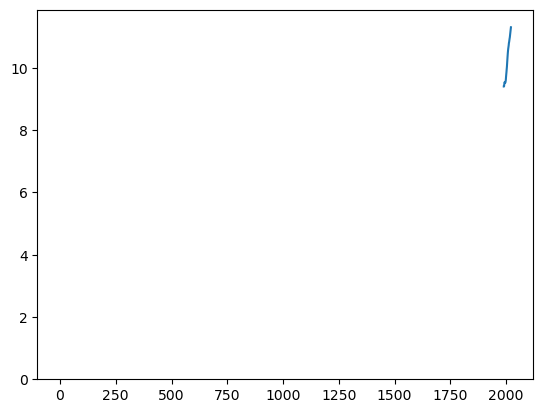

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:                        SARIMAX   Log Likelihood                 265.951
Date:                Wed, 01 Nov 2023   AIC                           -529.901
Time:                        23:07:30   BIC                           -528.467
Sample:                             0   HQIC                          -529.434
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      2.069e-09   7.29e-10      2.840      0.005    6.41e-10     3.5e-09
Ljung-Box (L1) (Q):                   0.09   Jarque-Bera (JB):                 0.28
Prob(Q):                              0.76   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

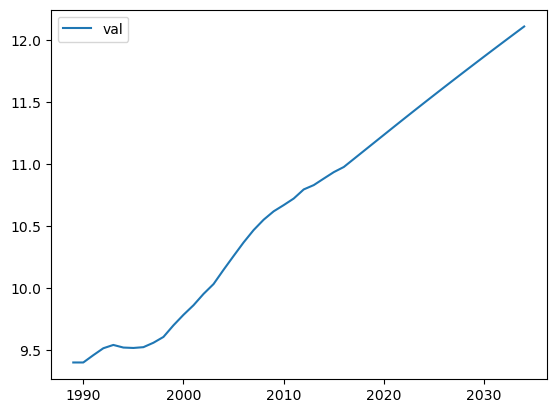

forecasting maaseudulla


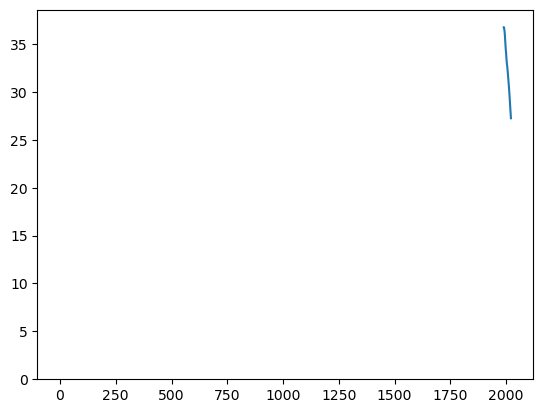

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:                        SARIMAX   Log Likelihood                 185.881
Date:                Wed, 01 Nov 2023   AIC                           -369.763
Time:                        23:07:31   BIC                           -368.329
Sample:                             0   HQIC                          -369.295
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      3.625e-07   5.91e-08      6.135      0.000    2.47e-07    4.78e-07
Ljung-Box (L1) (Q):                   0.69   Jarque-Bera (JB):                11.39
Prob(Q):                              0.41   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

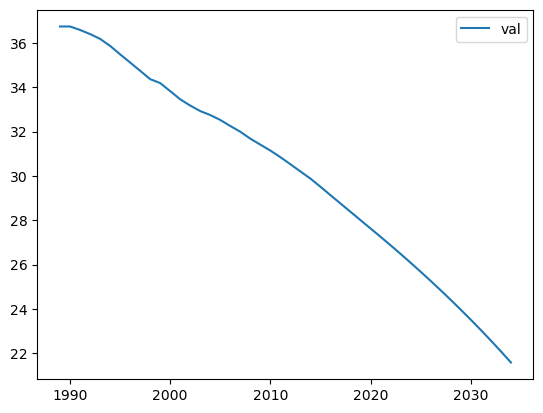

forecasting avioituvuus_naiset_30_34


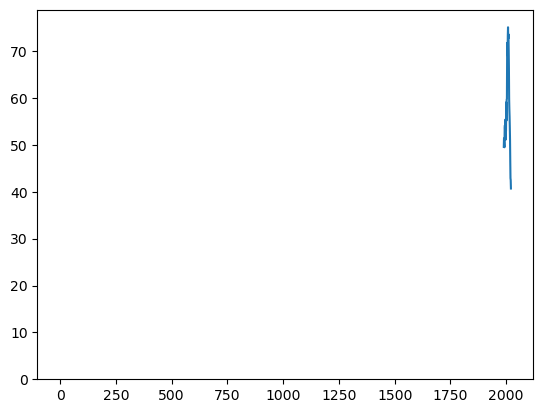

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  14.991
Date:                Wed, 01 Nov 2023   AIC                            -25.982
Time:                        23:07:32   BIC                            -23.114
Sample:                             0   HQIC                           -25.047
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7725      0.138     -5.581      0.000      -1.044      -0.501
sigma2         0.0216      0.006      3.795      0.000       0.010       0.033
Ljung-Box (L1) (Q):                   1.28   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31   -0.018009
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

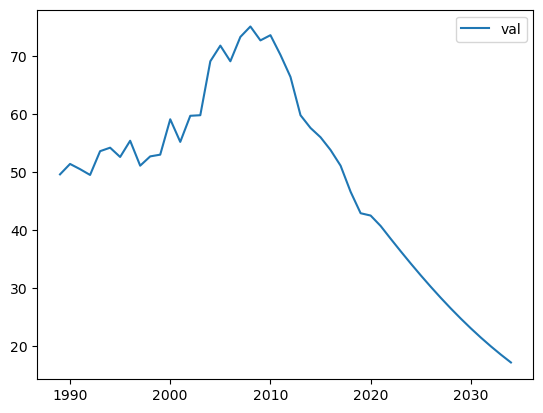

forecasting avioituvuus_naiset_25_29


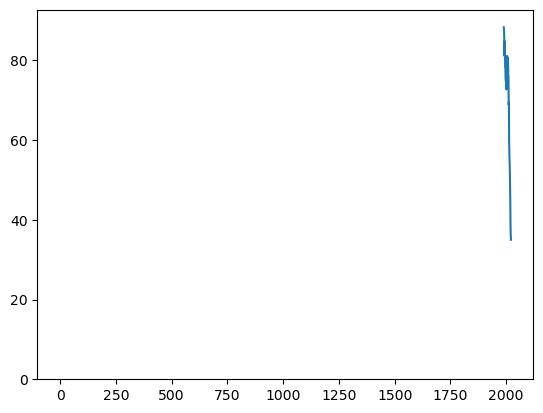

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:               SARIMAX(0, 0, 2)   Log Likelihood                   8.822
Date:                Wed, 01 Nov 2023   AIC                            -11.644
Time:                        23:07:33   BIC                             -7.342
Sample:                             0   HQIC                           -10.242
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.2118      0.211     -5.734      0.000      -1.626      -0.798
ma.L2          0.5407      0.180      2.998      0.003       0.187       0.894
sigma2         0.0314      0.010      3.104      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31   -0.124726
32    0.041617
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

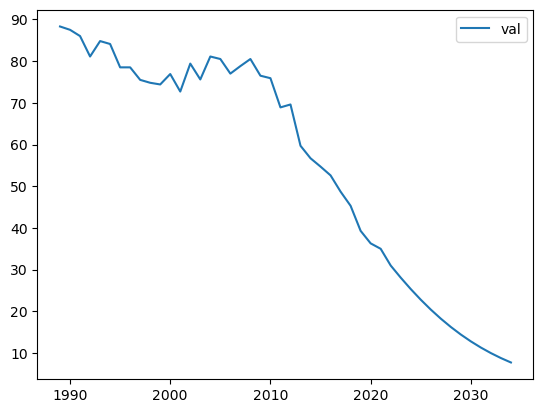

forecasting eronneisuus_25_29


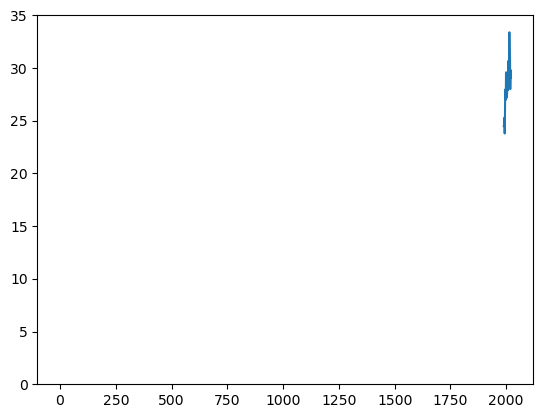

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:               SARIMAX(0, 0, 3)   Log Likelihood                  42.558
Date:                Wed, 01 Nov 2023   AIC                            -77.117
Time:                        23:07:34   BIC                            -71.381
Sample:                             0   HQIC                           -75.247
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.0068      0.265     -3.803      0.000      -1.526      -0.488
ma.L2         -0.1935      0.277     -0.697      0.486      -0.737       0.350
ma.L3          0.2432      0.273      0.890      0.3

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31    0.045035
32   -0.001028
33   -0.006801
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

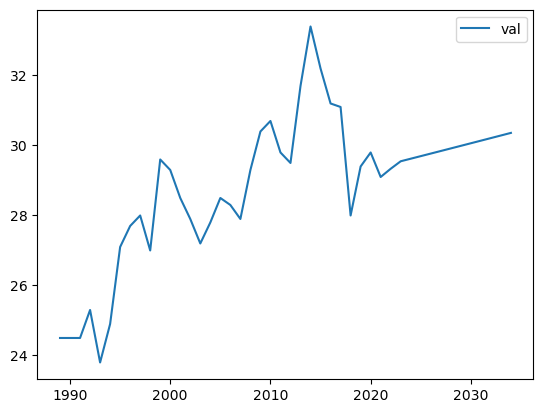

forecasting eronneisuus_30_34


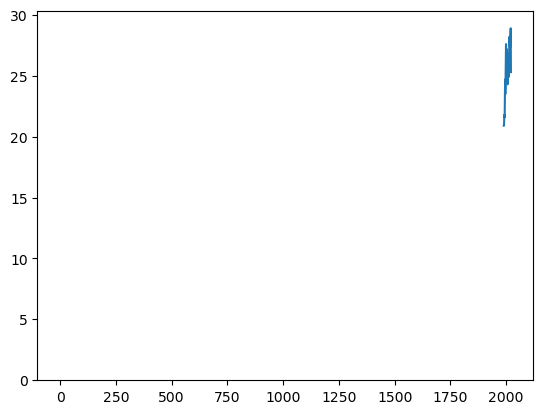

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  41.129
Date:                Wed, 01 Nov 2023   AIC                            -78.258
Time:                        23:07:35   BIC                            -75.390
Sample:                             0   HQIC                           -77.323
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9533      0.318     -2.994      0.003      -1.577      -0.329
sigma2         0.0038      0.001      5.035      0.000       0.002       0.005
Ljung-Box (L1) (Q):                   0.19   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31    0.185705
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

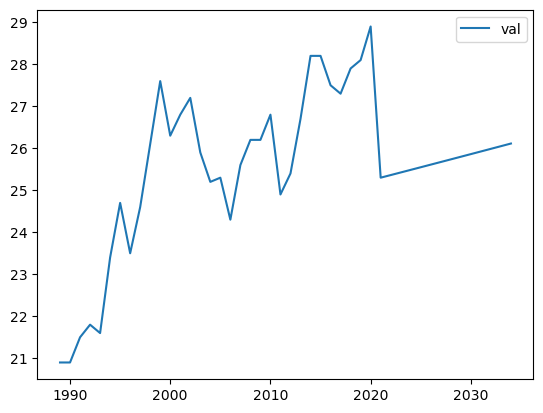

forecasting kolmasaste_miehet_25_29


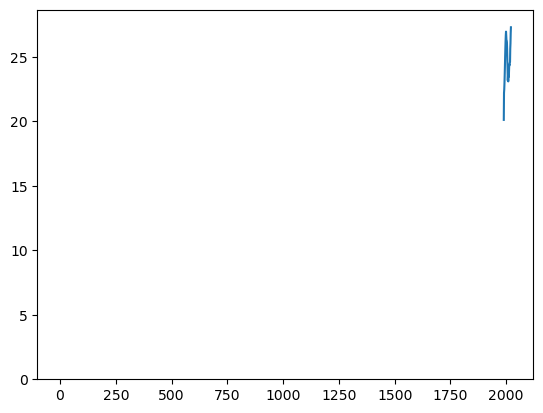

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  67.124
Date:                Wed, 01 Nov 2023   AIC                           -130.248
Time:                        23:07:36   BIC                           -127.380
Sample:                             0   HQIC                          -129.313
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6017      0.090     -6.695      0.000      -0.778      -0.426
sigma2         0.0008      0.000      5.248      0.000       0.000       0.001
Ljung-Box (L1) (Q):                   1.62   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31    0.010847
32   -0.006526
33    0.003927
34   -0.002363
35    0.001422
36   -0.000855
37    0.000515
38   -0.000310
39    0.000186
40   -0.000112
41    0.000067
42   -0.000041
43    0.000024
dtype: float64

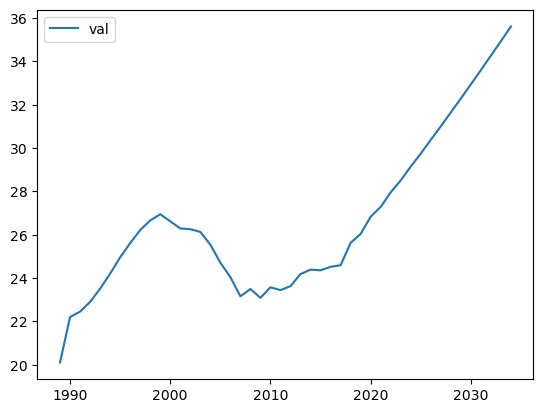

forecasting miehet_perusaste_25_29


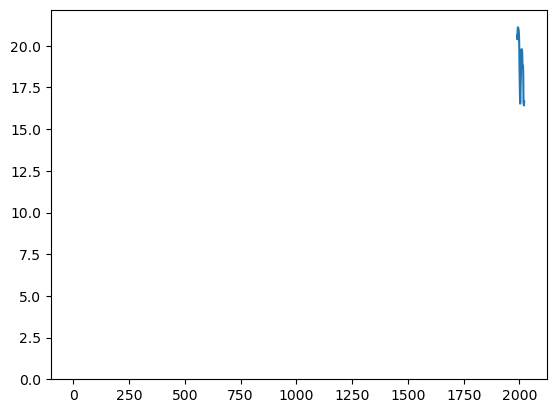

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:                        SARIMAX   Log Likelihood                  63.976
Date:                Wed, 01 Nov 2023   AIC                           -125.952
Time:                        23:07:37   BIC                           -124.518
Sample:                             0   HQIC                          -125.485
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0009      0.000      5.629      0.000       0.001       0.001
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                 7.05
Prob(Q):                              0.92   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31    0.0
32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

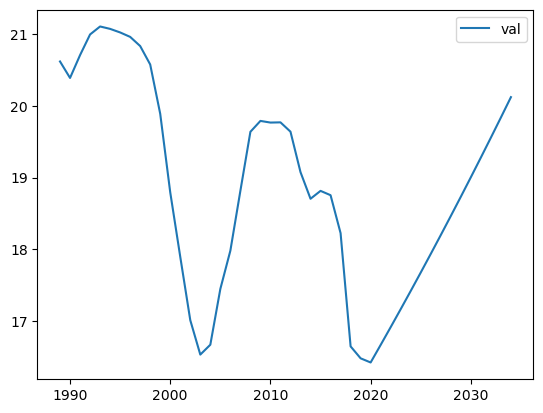

forecasting naiset_perusaste_25_29


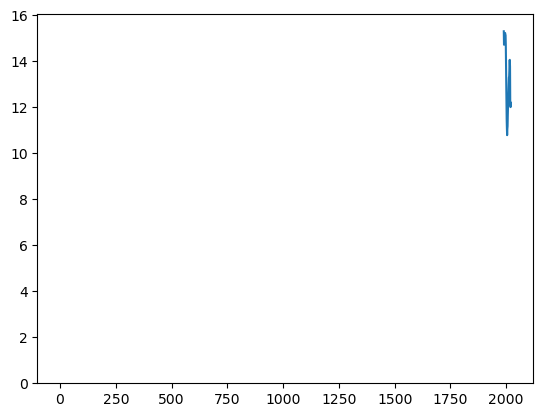

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  56.244
Date:                Wed, 01 Nov 2023   AIC                           -108.489
Time:                        23:07:38   BIC                           -105.621
Sample:                             0   HQIC                          -107.554
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2686      0.103     -2.620      0.009      -0.470      -0.068
sigma2         0.0016      0.000      6.231      0.000       0.001       0.002
Ljung-Box (L1) (Q):                   0.01   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31   -4.279762e-03
32    1.149594e-03
33   -3.087944e-04
34    8.294579e-05
35   -2.228021e-05
36    5.984725e-06
37   -1.607567e-06
38    4.318113e-07
39   -1.159896e-07
40    3.115616e-08
41   -8.368909e-09
42    2.247987e-09
43   -6.038356e-10
dtype: float64

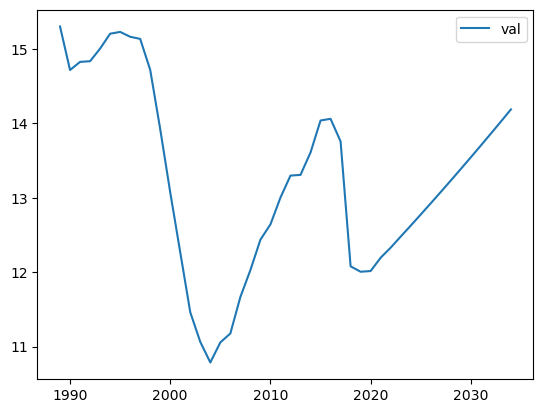

forecasting kolmasaste_naiset_25_29


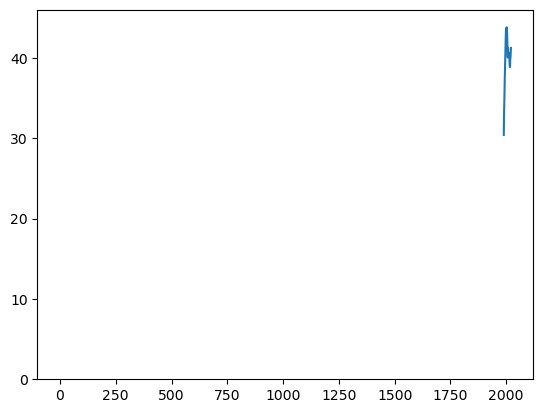

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  69.096
Date:                Wed, 01 Nov 2023   AIC                           -134.193
Time:                        23:07:39   BIC                           -131.325
Sample:                             0   HQIC                          -133.258
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5011      0.160     -3.134      0.002      -0.815      -0.188
sigma2         0.0007      0.000      5.773      0.000       0.000       0.001
Ljung-Box (L1) (Q):                   0.01   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31   -5.132089e-04
32    2.571819e-04
33   -1.288803e-04
34    6.458517e-05
35   -3.236525e-05
36    1.621904e-05
37   -8.127770e-06
38    4.073030e-06
39   -2.041098e-06
40    1.022845e-06
41   -5.125736e-07
42    2.568635e-07
43   -1.287208e-07
dtype: float64

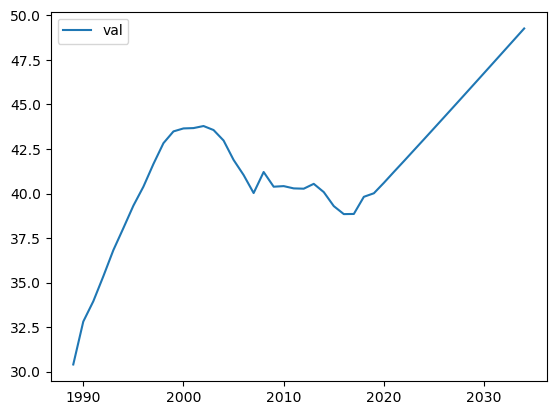

forecasting alypuhelin


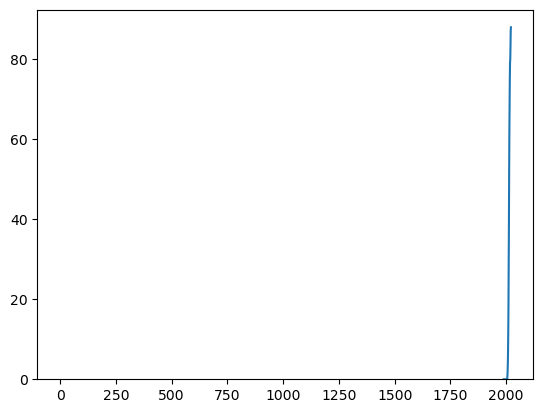

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:               SARIMAX(5, 0, 0)   Log Likelihood                  36.317
Date:                Wed, 01 Nov 2023   AIC                            -60.634
Time:                        23:07:40   BIC                            -52.030
Sample:                             0   HQIC                           -57.829
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1742      0.148      1.177      0.239      -0.116       0.464
ar.L2         -1.2804      0.164     -7.801      0.000      -1.602      -0.959
ar.L3          1.0385      0.318      3.264      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:1346: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum
/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31   -0.276519
32    0.873260
33    0.023564
34   -0.902769
35    0.364872
36    0.804103
37   -0.625004
38   -0.498868
39    0.782298
40    0.179218
41   -0.725294
42    0.128671
43    0.557396
dtype: float64

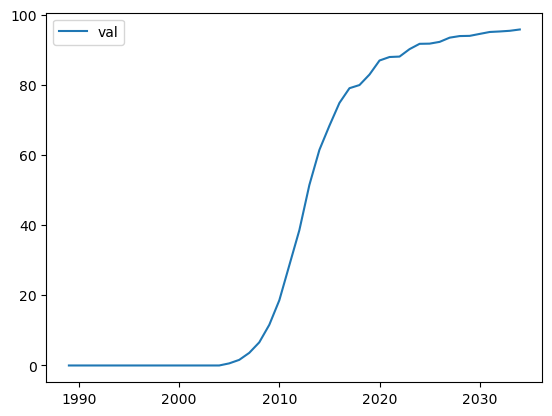

forecasting some_25_34


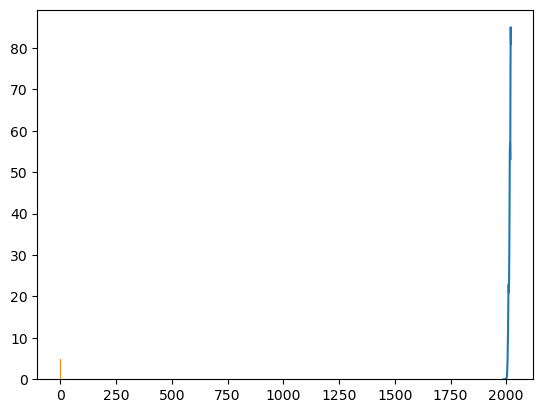

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:               SARIMAX(4, 0, 1)   Log Likelihood                   6.729
Date:                Wed, 01 Nov 2023   AIC                             -1.459
Time:                        23:07:42   BIC                              7.145
Sample:                             0   HQIC                             1.346
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2718      1.528     -0.178      0.859      -3.267       2.723
ar.L2         -1.8400      0.616     -2.988      0.003      -3.047      -0.633
ar.L3         -0.2542      4.323     -0.059      0.9

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31   -0.950475
32    3.164385
33    0.921073
34   -4.014354
35   -0.581334
36    4.558098
37    0.050054
38   -4.761307
39    0.549037
40    4.634521
41   -1.103178
42   -4.226171
43    1.522989
dtype: float64

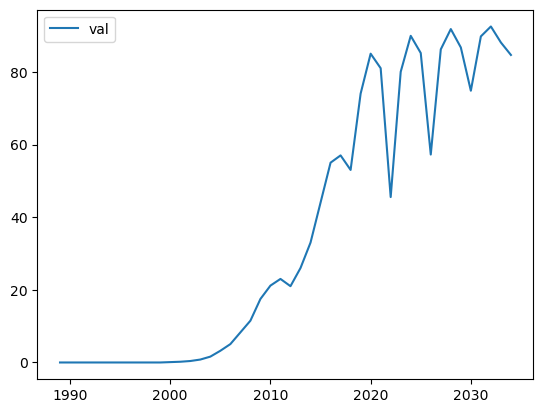

forecasting some_35_44


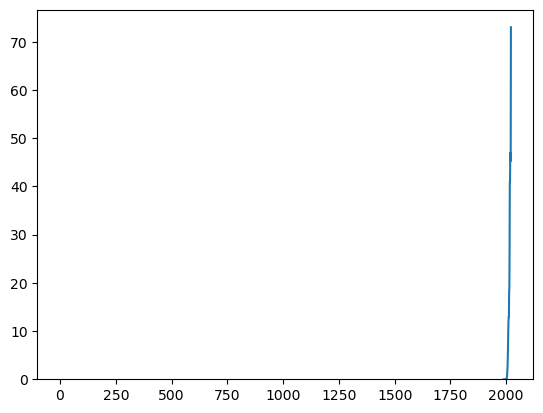

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:               SARIMAX(2, 0, 2)   Log Likelihood                  21.537
Date:                Wed, 01 Nov 2023   AIC                            -33.073
Time:                        23:07:43   BIC                            -25.904
Sample:                             0   HQIC                           -30.736
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.3172      0.901     -1.461      0.144      -3.084       0.449
ar.L2         -0.8595      0.325     -2.647      0.008      -1.496      -0.223
ma.L1          1.8907      1.886      1.003      0.3

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31   -0.137622
32   -0.208809
33    0.393319
34   -0.338592
35    0.107923
36    0.148868
37   -0.288841
38    0.252497
39   -0.084320
40   -0.105957
41    0.212035
42   -0.188213
43    0.065663
dtype: float64

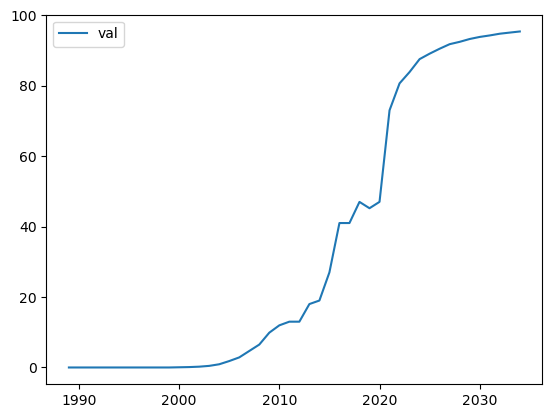

forecasting työttömyys_miehet_25_34


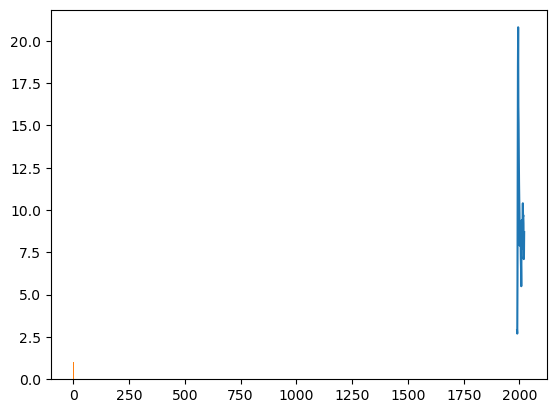

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:               SARIMAX(4, 0, 0)   Log Likelihood                  -0.095
Date:                Wed, 01 Nov 2023   AIC                             10.190
Time:                        23:07:44   BIC                             17.360
Sample:                             0   HQIC                            12.527
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2963      0.290     -1.023      0.307      -0.864       0.272
ar.L2         -0.3060      0.215     -1.421      0.155      -0.728       0.116
ar.L3         -0.4161      0.215     -1.935      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31   -0.014913
32   -0.062136
33   -0.200766
34    0.003880
35    0.093645
36    0.085849
37    0.045256
38   -0.080599
39   -0.072782
40   -0.015772
41    0.037724
42    0.064467
43    0.012518
dtype: float64

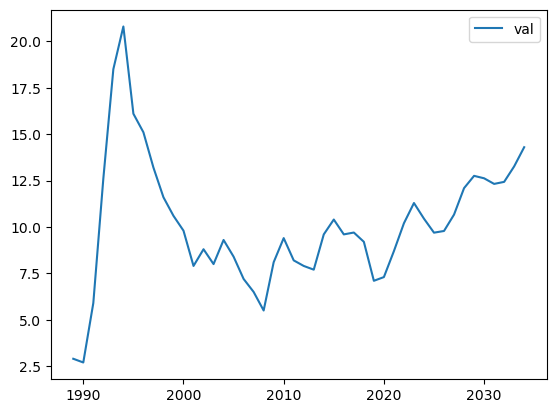

forecasting työttömyys_naiset_25_34


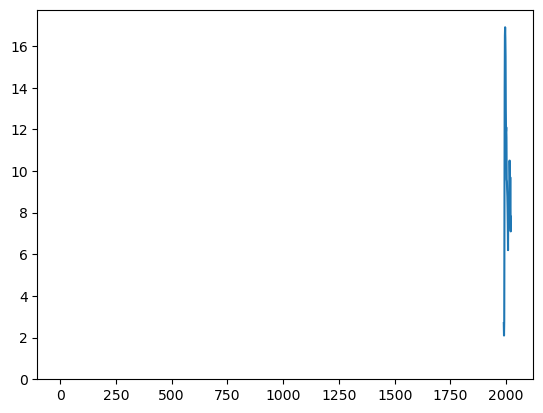

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:               SARIMAX(1, 0, 2)   Log Likelihood                  -2.141
Date:                Wed, 01 Nov 2023   AIC                             12.282
Time:                        23:07:45   BIC                             18.018
Sample:                             0   HQIC                            14.152
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2012      0.374     -0.538      0.591      -0.935       0.532
ma.L1         -0.2340      0.383     -0.611      0.541      -0.985       0.517
ma.L2         -0.6582      0.368     -1.787      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31   -1.654097e-01
32    8.593879e-02
33   -1.729121e-02
34    3.479059e-03
35   -7.000000e-04
36    1.408427e-04
37   -2.833809e-05
38    5.701732e-06
39   -1.147210e-06
40    2.308231e-07
41   -4.644250e-08
42    9.344410e-09
43   -1.880131e-09
dtype: float64

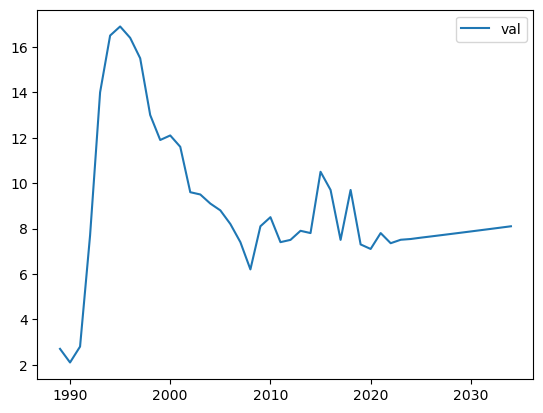

forecasting työllisyysaste_miehet_25_34


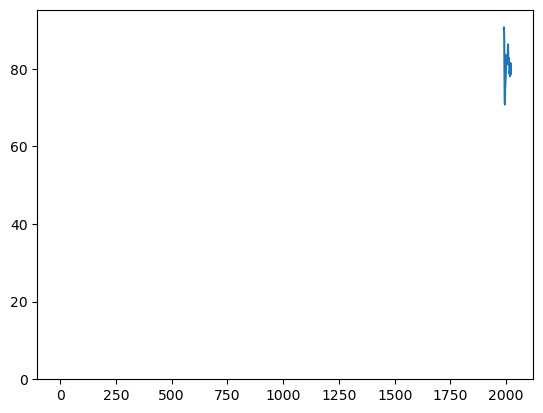

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:               SARIMAX(0, 0, 1)   Log Likelihood                   9.464
Date:                Wed, 01 Nov 2023   AIC                            -14.928
Time:                        23:07:46   BIC                            -12.060
Sample:                             0   HQIC                           -13.993
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6363      0.201     -3.167      0.002      -1.030      -0.243
sigma2         0.0313      0.007      4.528      0.000       0.018       0.045
Ljung-Box (L1) (Q):                   2.34   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31    0.107245
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

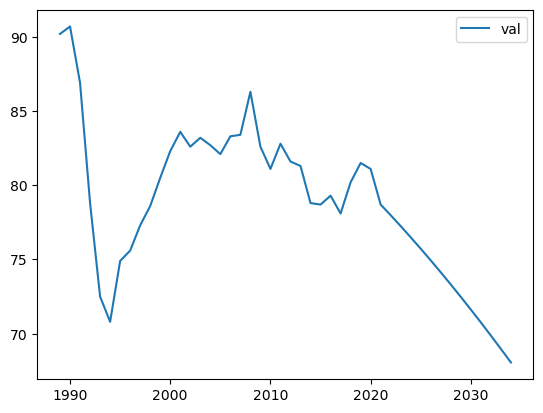

forecasting työllisyysaste_naiset_25_34


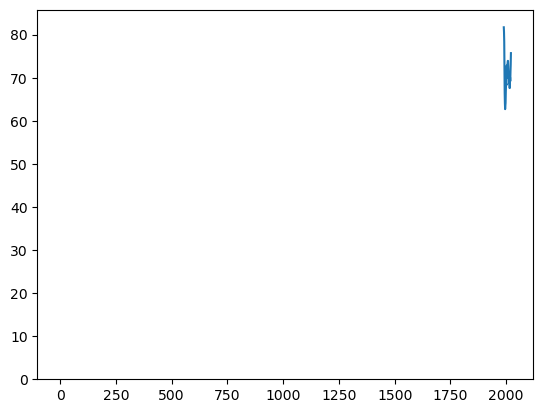

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  25.954
Date:                Wed, 01 Nov 2023   AIC                            -47.908
Time:                        23:07:47   BIC                            -45.040
Sample:                             0   HQIC                           -46.973
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5472      0.166     -3.287      0.001      -0.873      -0.221
sigma2         0.0108      0.004      2.753      0.006       0.003       0.019
Ljung-Box (L1) (Q):                   0.00   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31   -0.042609
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

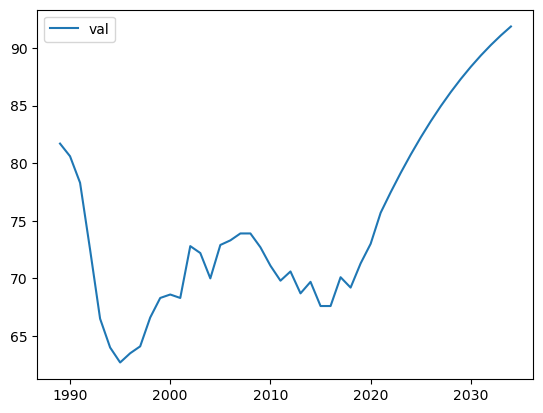

forecasting työttömyys_miehet_35_44


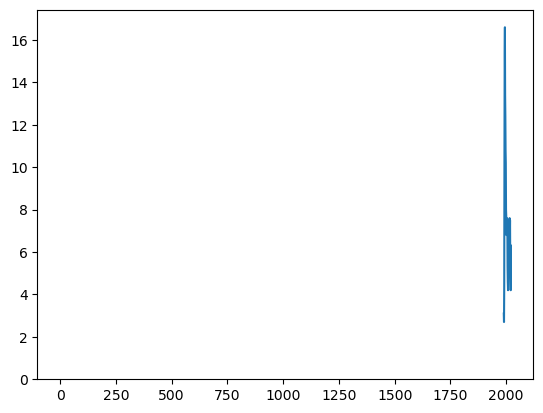

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:               SARIMAX(3, 0, 0)   Log Likelihood                   1.075
Date:                Wed, 01 Nov 2023   AIC                              5.849
Time:                        23:07:48   BIC                             11.585
Sample:                             0   HQIC                             7.719
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1038      0.153     -0.677      0.498      -0.404       0.197
ar.L2         -0.1172      0.161     -0.729      0.466      -0.432       0.198
ar.L3         -0.7299      0.144     -5.062      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31   -0.222313
32    0.011517
33   -0.420658
34    0.204587
35    0.019649
36    0.281029
37   -0.180805
38   -0.028505
39   -0.180979
40    0.154099
41    0.026017
42    0.111340
43   -0.127085
dtype: float64

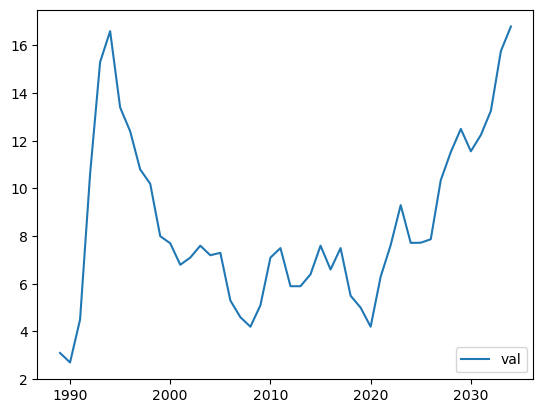

forecasting työttömyys_naiset_35_44


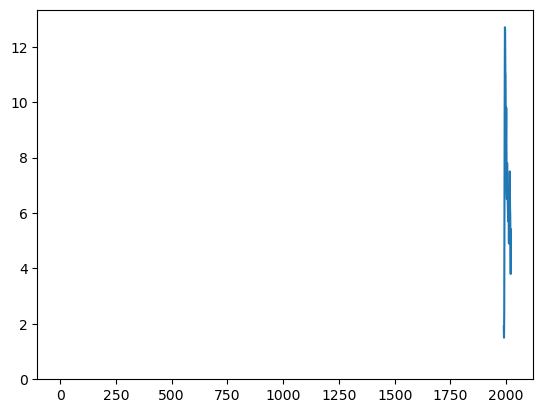

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  -4.338
Date:                Wed, 01 Nov 2023   AIC                             12.676
Time:                        23:07:49   BIC                             15.544
Sample:                             0   HQIC                            13.611
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7518      0.175     -4.287      0.000      -1.095      -0.408
sigma2         0.0754      0.018      4.226      0.000       0.040       0.110
Ljung-Box (L1) (Q):                   3.50   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31   -0.361939
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

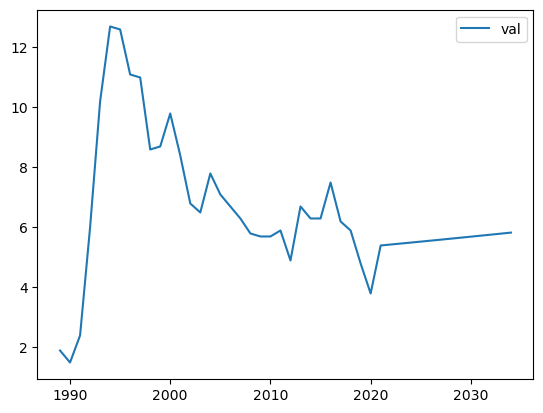

forecasting työllisyysaste_miehet_35_44


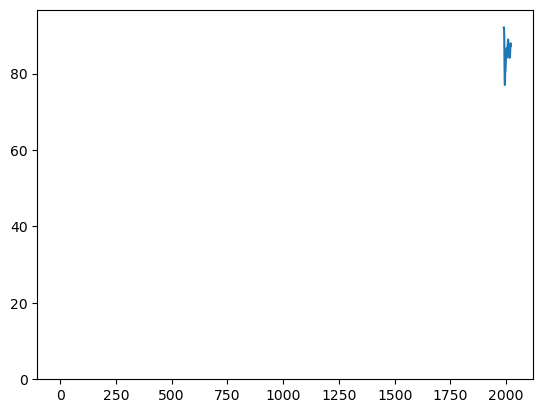

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  13.932
Date:                Wed, 01 Nov 2023   AIC                            -21.865
Time:                        23:07:50   BIC                            -17.563
Sample:                             0   HQIC                           -20.463
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5587      0.381     -1.467      0.142      -1.305       0.188
ma.L2         -0.3929      0.233     -1.690      0.091      -0.849       0.063
sigma2         0.0223      0.009      2.581      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31    0.027250
32    0.024937
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

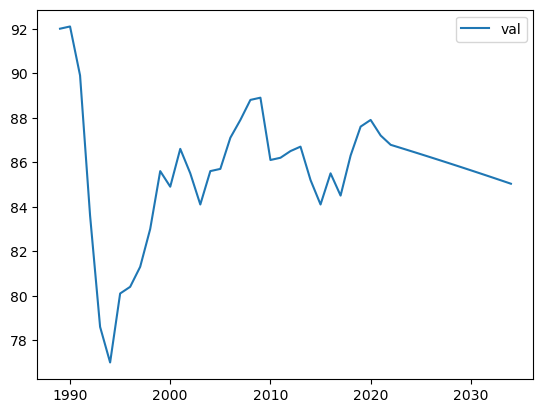

forecasting työllisyysaste_naiset_35_44


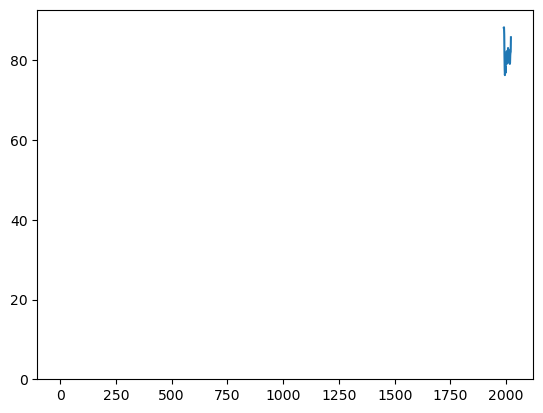

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  20.279
Date:                Wed, 01 Nov 2023   AIC                            -36.558
Time:                        23:07:51   BIC                            -33.690
Sample:                             0   HQIC                           -35.623
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7004      0.202     -3.466      0.001      -1.096      -0.304
sigma2         0.0155      0.004      3.608      0.000       0.007       0.024
Ljung-Box (L1) (Q):                   0.35   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31   -0.175221
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

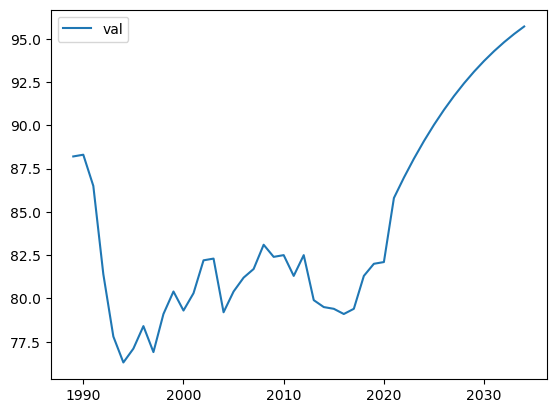

forecasting ei_aviossa_30_34


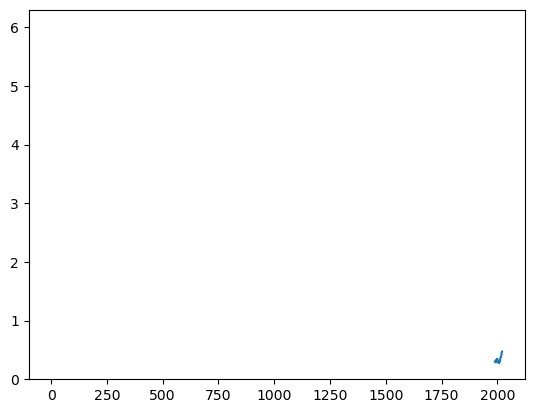

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  48.919
Date:                Wed, 01 Nov 2023   AIC                            -93.838
Time:                        23:07:52   BIC                            -90.970
Sample:                             0   HQIC                           -92.903
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8279      0.170     -4.867      0.000      -1.161      -0.494
sigma2         0.0024      0.001      3.620      0.000       0.001       0.004
Ljung-Box (L1) (Q):                   1.07   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31    0.015128
32    0.000000
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

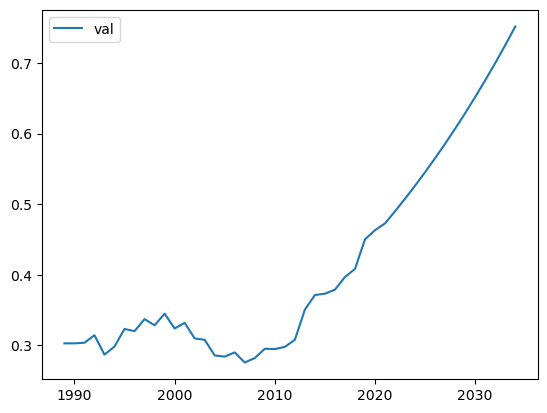

forecasting parittomia_30_34


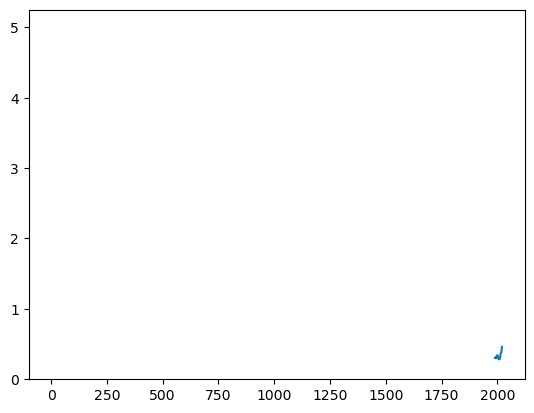

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   31
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  58.999
Date:                Wed, 01 Nov 2023   AIC                           -113.997
Time:                        23:07:53   BIC                           -111.129
Sample:                             0   HQIC                          -113.062
                                 - 31                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6649      0.141     -4.728      0.000      -0.940      -0.389
sigma2         0.0013      0.000      2.870      0.004       0.000       0.002
Ljung-Box (L1) (Q):                   0.15   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

31    0.02276
32    0.00000
33    0.00000
34    0.00000
35    0.00000
36    0.00000
37    0.00000
38    0.00000
39    0.00000
40    0.00000
41    0.00000
42    0.00000
43    0.00000
dtype: float64

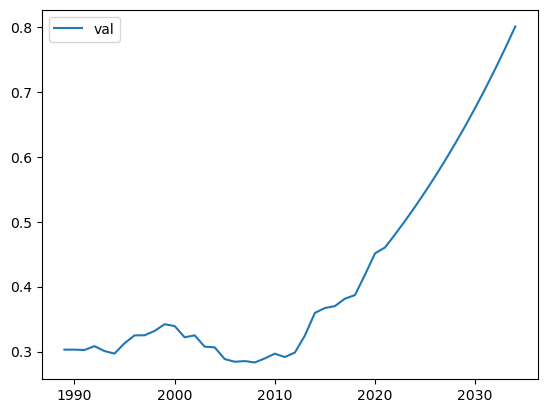

       hedelmallisyysluku  pienituloisuus_miehet_18_29  \
vuosi                                                    
1989             1.710000                     9.400000   
1990             1.782000                     7.900000   
1991             1.794000                    10.900000   
1992             1.847000                    13.500000   
1993             1.813000                    12.700000   
1994             1.847000                    14.200000   
1995             1.807000                    15.900000   
1996             1.764000                    19.300000   
1997             1.746000                    18.200000   
1998             1.700000                    17.900000   
1999             1.735000                    18.200000   
2000             1.729000                    16.700000   
2001             1.726000                    19.200000   
2002             1.718000                    21.000000   
2003             1.760000                    21.100000   
2004          

forecasting hedelmallisyysluku


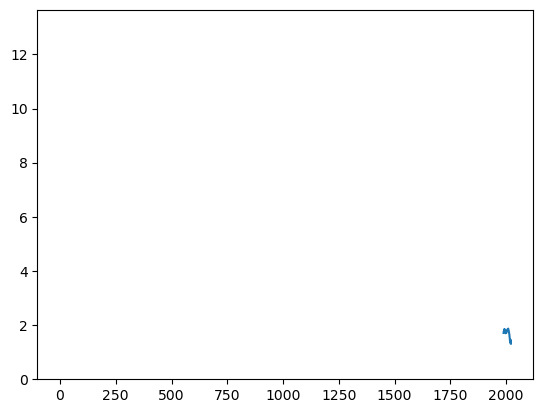

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  63.798
Date:                Wed, 01 Nov 2023   AIC                           -123.597
Time:                        23:07:55   BIC                           -120.665
Sample:                             0   HQIC                          -122.625
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7924      0.140     -5.679      0.000      -1.066      -0.519
sigma2         0.0011      0.000      3.967      0.000       0.001       0.002
Ljung-Box (L1) (Q):                   0.01   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.076384
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

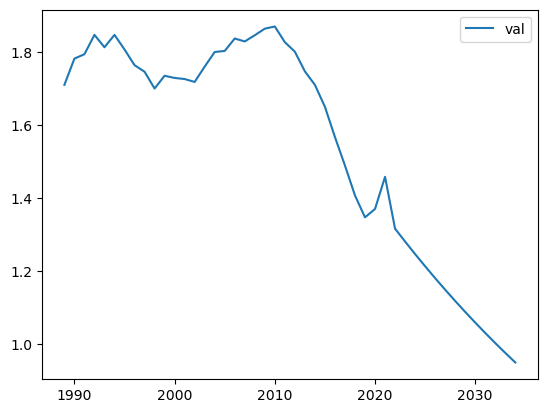

forecasting pienituloisuus_miehet_18_29


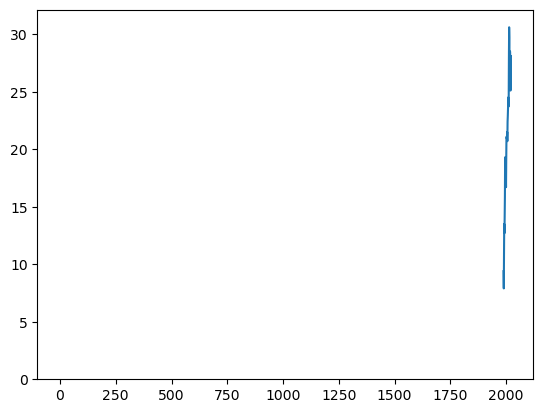

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(0, 0, 3)   Log Likelihood                 106.826
Date:                Wed, 01 Nov 2023   AIC                           -205.653
Time:                        23:07:56   BIC                           -199.790
Sample:                             0   HQIC                          -203.710
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.1178      4.924     -0.227      0.820     -10.770       8.534
ma.L2         -0.4553      0.790     -0.576      0.565      -2.004       1.094
ma.L3          0.5778      2.496      0.232      0.8

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32   -0.001537
33    0.010799
34   -0.006873
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

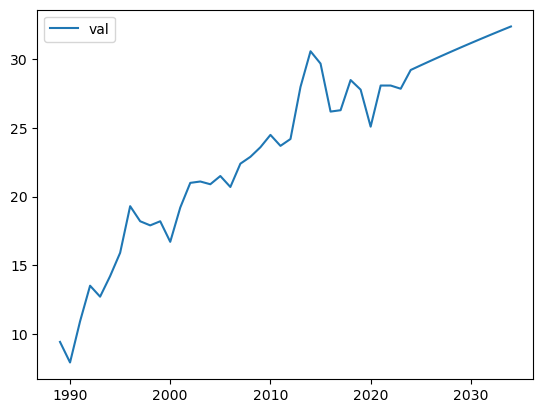

forecasting pienituloisuus_naiset_18_29


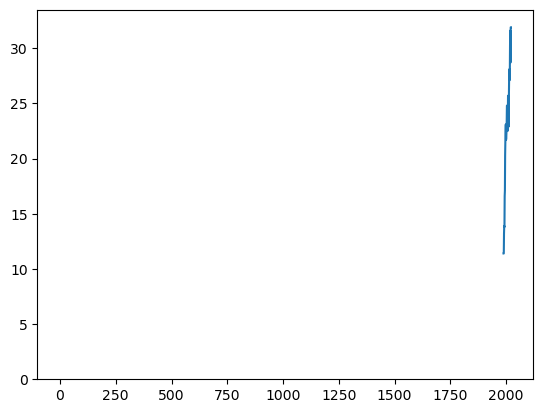

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(3, 0, 1)   Log Likelihood                 108.131
Date:                Wed, 01 Nov 2023   AIC                           -206.262
Time:                        23:07:57   BIC                           -198.933
Sample:                             0   HQIC                          -203.833
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4723      0.228     -2.072      0.038      -0.919      -0.026
ar.L2         -0.4018      0.220     -1.827      0.068      -0.833       0.029
ar.L3         -0.4843      0.324     -1.497      0.1

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.011381
33   -0.017569
34    0.015118
35   -0.005593
36    0.005076
37   -0.007472
38    0.004198
39   -0.001439
40    0.002611
41   -0.002688
42    0.000917
43   -0.000618
dtype: float64

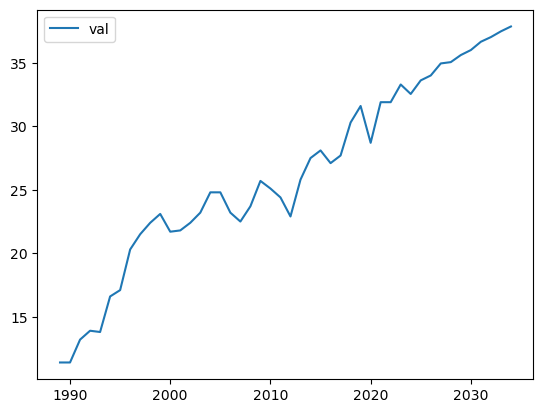

forecasting lapsikuolleisuus


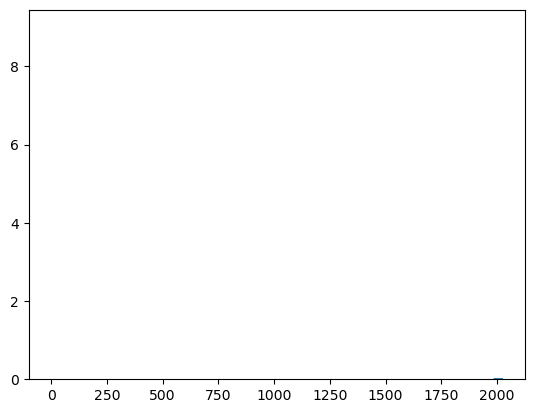

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(1, 0, 1)   Log Likelihood                  29.389
Date:                Wed, 01 Nov 2023   AIC                            -52.777
Time:                        23:07:58   BIC                            -48.380
Sample:                             0   HQIC                           -51.320
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5186      0.187     -2.778      0.005      -0.884      -0.153
ma.L1         -0.9641      0.361     -2.669      0.008      -1.672      -0.256
sigma2         0.0083      0.003      2.558      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32   -0.092938
33    0.048197
34   -0.024994
35    0.012962
36   -0.006722
37    0.003486
38   -0.001808
39    0.000937
40   -0.000486
41    0.000252
42   -0.000131
43    0.000068
dtype: float64

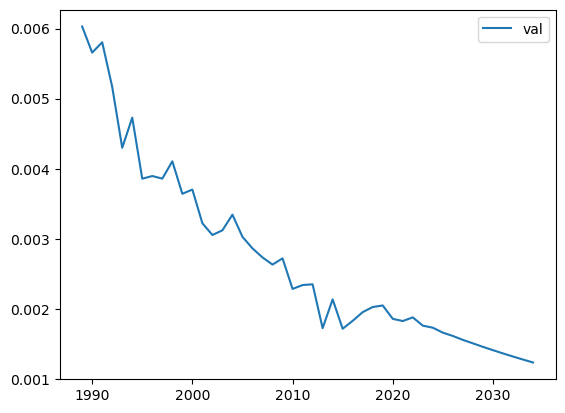

forecasting synnyttajien_keskiika


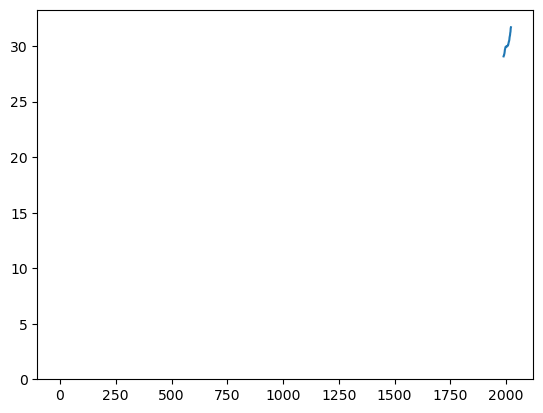

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(1, 0, 0)   Log Likelihood                 141.268
Date:                Wed, 01 Nov 2023   AIC                           -278.535
Time:                        23:07:59   BIC                           -275.604
Sample:                             0   HQIC                          -277.564
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6553      0.136     -4.805      0.000      -0.923      -0.388
sigma2      8.405e-06   2.54e-06      3.313      0.001    3.43e-06    1.34e-05
Ljung-Box (L1) (Q):                   0.60   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.006090
33   -0.003991
34    0.002615
35   -0.001714
36    0.001123
37   -0.000736
38    0.000482
39   -0.000316
40    0.000207
41   -0.000136
42    0.000089
43   -0.000058
dtype: float64

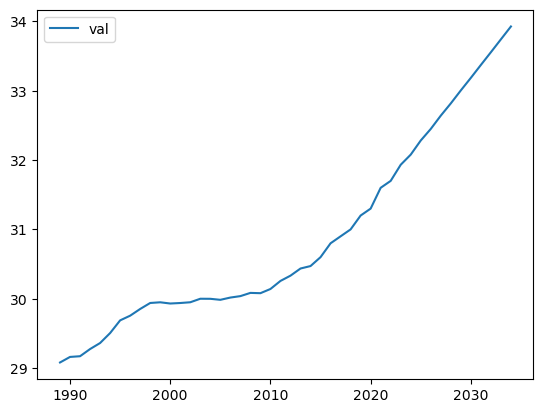

forecasting sisempikaupunki


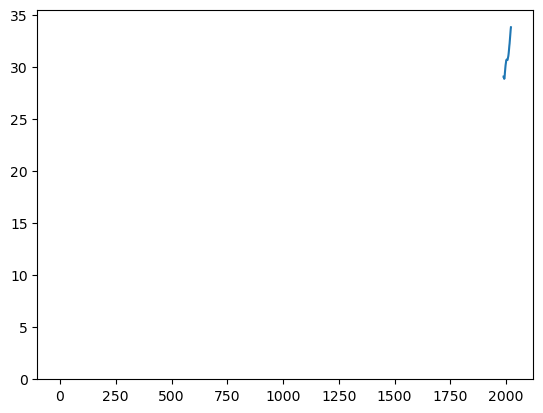

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(0, 0, 1)   Log Likelihood                 200.215
Date:                Wed, 01 Nov 2023   AIC                           -396.430
Time:                        23:07:59   BIC                           -393.499
Sample:                             0   HQIC                          -395.459
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.2924      0.207      1.414      0.157      -0.113       0.698
sigma2      2.132e-07   5.44e-08      3.920      0.000    1.07e-07     3.2e-07
Ljung-Box (L1) (Q):                   0.00   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32   -0.000202
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

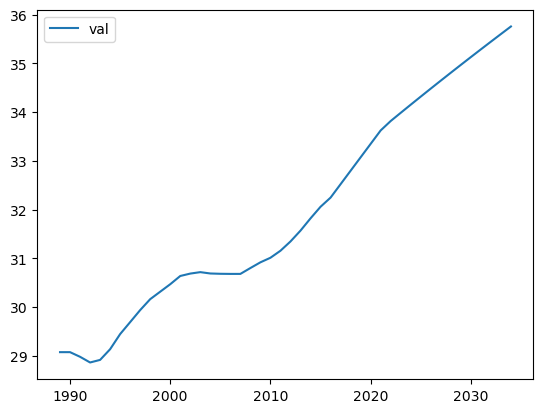

forecasting ulompikaupunki


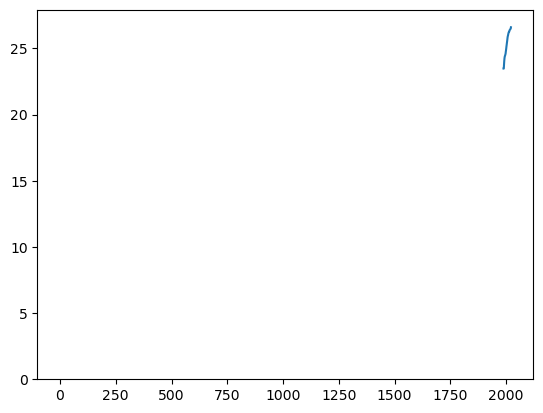

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:                        SARIMAX   Log Likelihood                 209.930
Date:                Wed, 01 Nov 2023   AIC                           -417.860
Time:                        23:08:01   BIC                           -416.394
Sample:                             0   HQIC                          -417.374
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1.173e-07   1.13e-08     10.367      0.000    9.51e-08    1.39e-07
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               202.54
Prob(Q):                              0.98   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

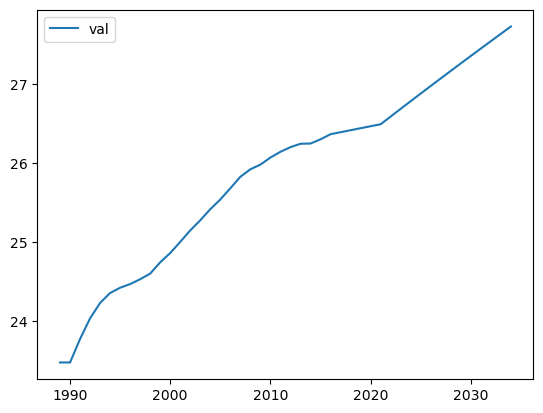

forecasting kehyskaupunki


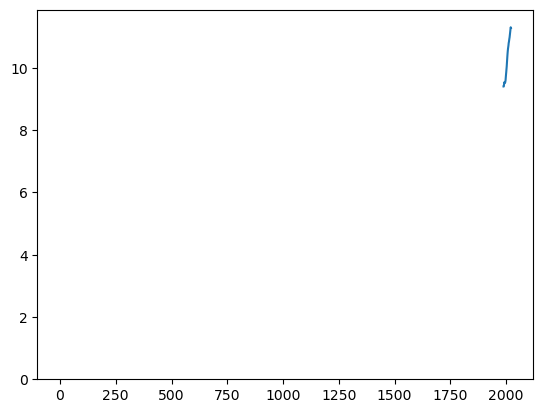

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1899: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:1906: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1


                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:                        SARIMAX   Log Likelihood                 267.514
Date:                Wed, 01 Nov 2023   AIC                           -533.029
Time:                        23:08:01   BIC                           -531.563
Sample:                             0   HQIC                          -532.543
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      3.208e-09   6.26e-10      5.125      0.000    1.98e-09    4.44e-09
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):                14.95
Prob(Q):                              0.85   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

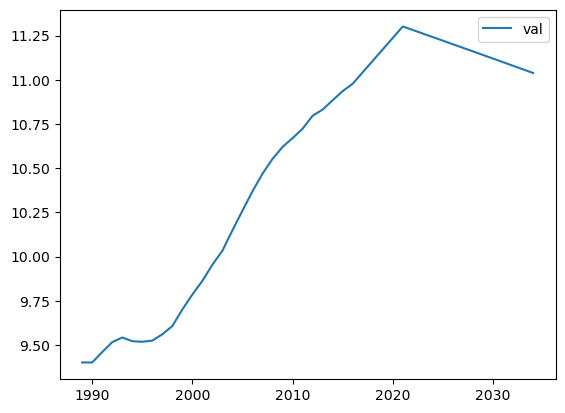

forecasting maaseudulla


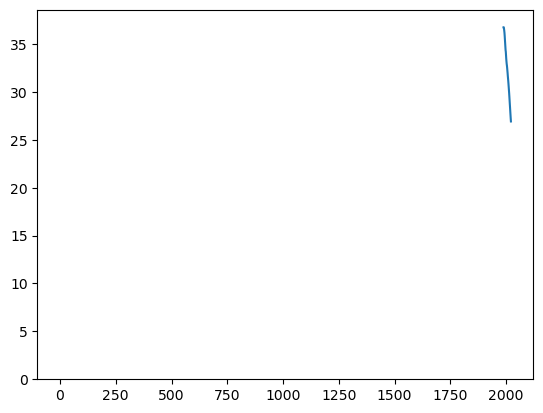

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:                        SARIMAX   Log Likelihood                 192.265
Date:                Wed, 01 Nov 2023   AIC                           -382.529
Time:                        23:08:02   BIC                           -381.064
Sample:                             0   HQIC                          -382.043
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      3.538e-07   5.62e-08      6.297      0.000    2.44e-07    4.64e-07
Ljung-Box (L1) (Q):                   0.66   Jarque-Bera (JB):                12.17
Prob(Q):                              0.41   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

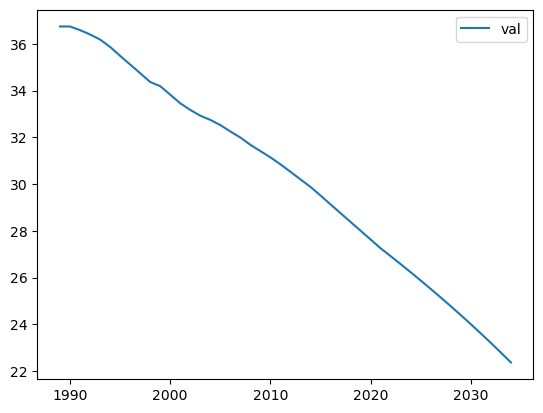

forecasting avioituvuus_naiset_30_34


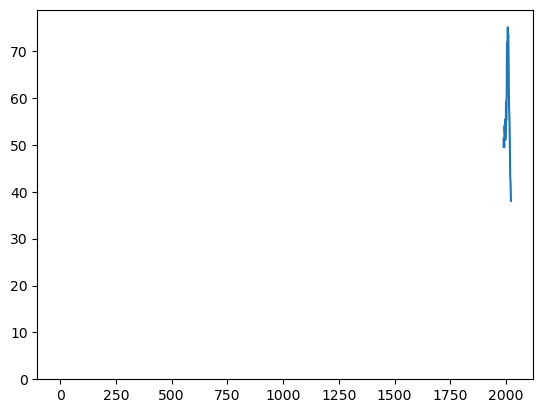

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  17.006
Date:                Wed, 01 Nov 2023   AIC                            -28.012
Time:                        23:08:03   BIC                            -23.615
Sample:                             0   HQIC                           -26.554
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9534      0.236     -4.043      0.000      -1.416      -0.491
ma.L2          0.3205      0.236      1.356      0.175      -0.143       0.784
sigma2         0.0196      0.005      3.982      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.030387
33   -0.003453
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

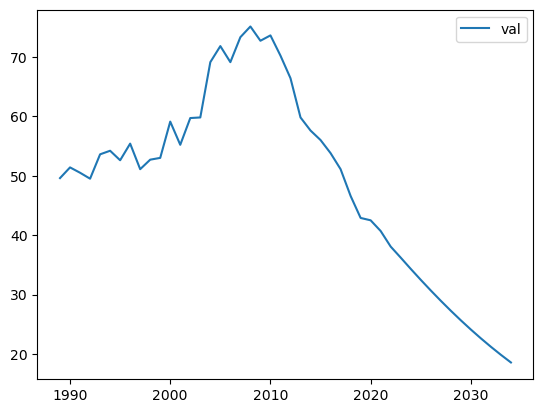

forecasting avioituvuus_naiset_25_29


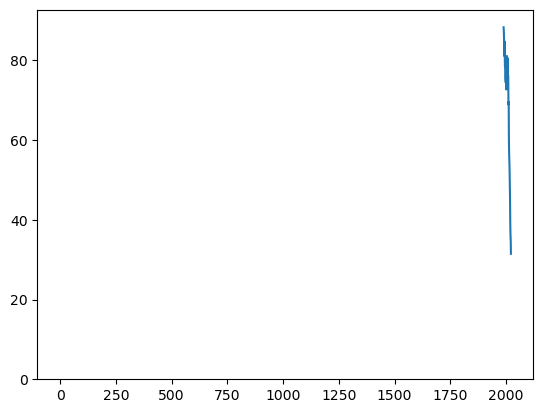

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(0, 0, 2)   Log Likelihood                   9.633
Date:                Wed, 01 Nov 2023   AIC                            -13.266
Time:                        23:08:04   BIC                             -8.869
Sample:                             0   HQIC                           -11.808
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -1.2137      0.205     -5.919      0.000      -1.616      -0.812
ma.L2          0.5413      0.175      3.096      0.002       0.199       0.884
sigma2         0.0304      0.009      3.242      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.014247
33    0.012138
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

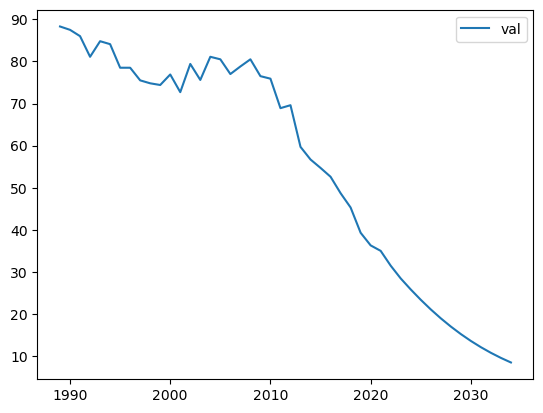

forecasting eronneisuus_25_29


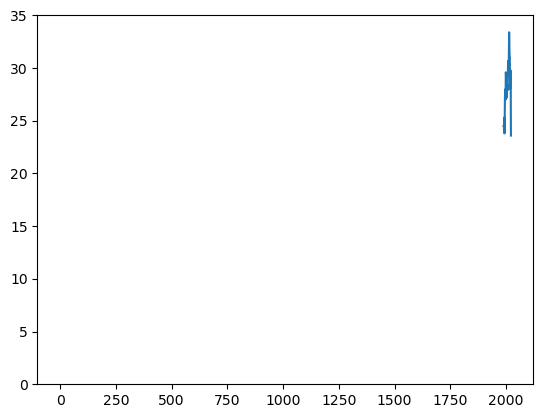

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  35.109
Date:                Wed, 01 Nov 2023   AIC                            -66.218
Time:                        23:08:05   BIC                            -63.286
Sample:                             0   HQIC                           -65.246
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8660      0.250     -3.459      0.001      -1.357      -0.375
sigma2         0.0062      0.001      4.659      0.000       0.004       0.009
Ljung-Box (L1) (Q):                   0.01   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.241834
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

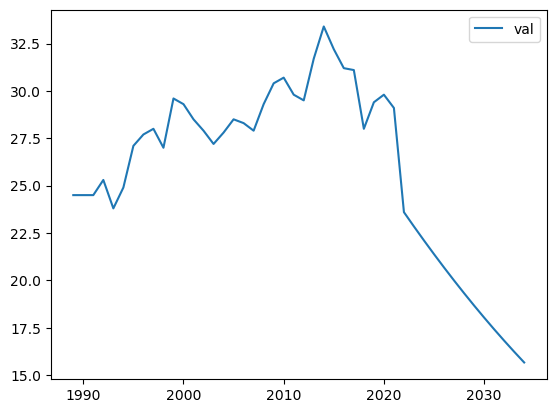

forecasting eronneisuus_30_34


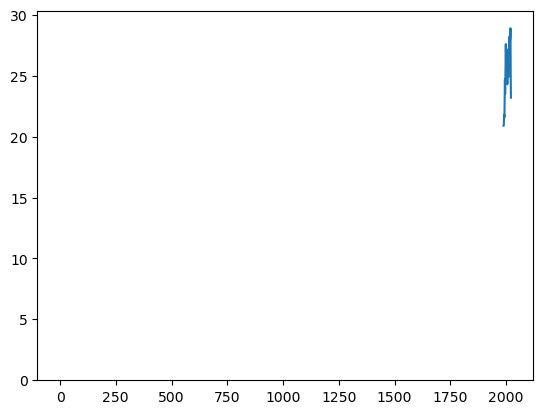

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  41.457
Date:                Wed, 01 Nov 2023   AIC                            -78.914
Time:                        23:08:06   BIC                            -75.983
Sample:                             0   HQIC                           -77.943
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.8748      0.160     -5.465      0.000      -1.189      -0.561
sigma2         0.0042      0.001      4.801      0.000       0.002       0.006
Ljung-Box (L1) (Q):                   0.12   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.090475
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

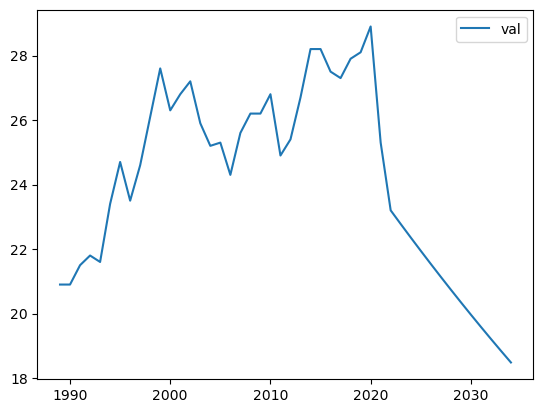

forecasting kolmasaste_miehet_25_29


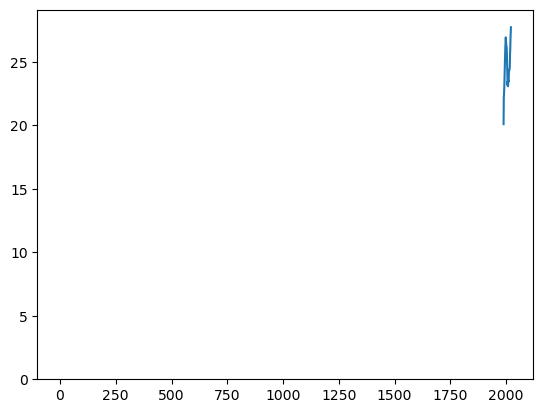

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  69.722
Date:                Wed, 01 Nov 2023   AIC                           -135.444
Time:                        23:08:07   BIC                           -132.513
Sample:                             0   HQIC                          -134.472
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5931      0.089     -6.628      0.000      -0.768      -0.418
sigma2         0.0007      0.000      5.399      0.000       0.000       0.001
Ljung-Box (L1) (Q):                   1.59   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    1.396038e-04
33   -8.279697e-05
34    4.910568e-05
35   -2.912386e-05
36    1.727294e-05
37   -1.024433e-05
38    6.075763e-06
39   -3.603447e-06
40    2.137152e-06
41   -1.267514e-06
42    7.517439e-07
43   -4.458484e-07
dtype: float64

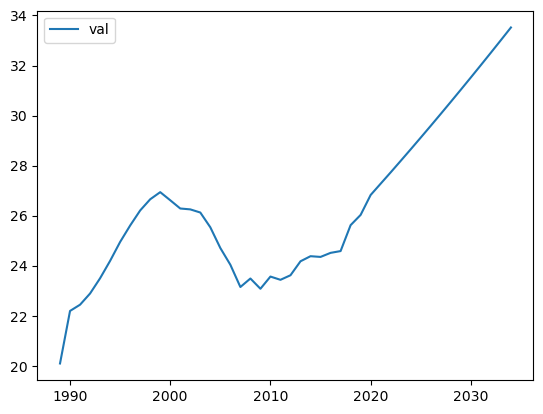

forecasting miehet_perusaste_25_29


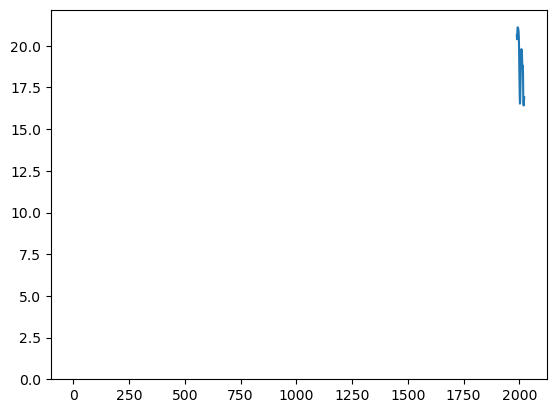

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:                        SARIMAX   Log Likelihood                  66.548
Date:                Wed, 01 Nov 2023   AIC                           -131.096
Time:                        23:08:08   BIC                           -129.630
Sample:                             0   HQIC                          -130.610
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0009      0.000      5.833      0.000       0.001       0.001
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                 8.28
Prob(Q):                              0.92   Pr

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.0
33    0.0
34    0.0
35    0.0
36    0.0
37    0.0
38    0.0
39    0.0
40    0.0
41    0.0
42    0.0
43    0.0
dtype: float64

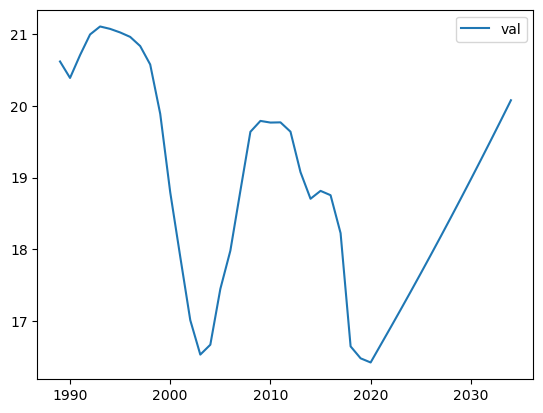

forecasting naiset_perusaste_25_29


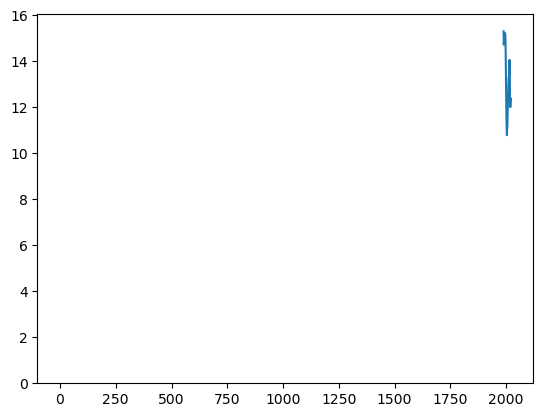

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  58.562
Date:                Wed, 01 Nov 2023   AIC                           -113.125
Time:                        23:08:09   BIC                           -110.193
Sample:                             0   HQIC                          -112.153
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2676      0.099     -2.693      0.007      -0.462      -0.073
sigma2         0.0015      0.000      6.447      0.000       0.001       0.002
Ljung-Box (L1) (Q):                   0.01   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    5.665773e-05
33   -1.516214e-05
34    4.057530e-06
35   -1.085833e-06
36    2.905791e-07
37   -7.776170e-08
38    2.080976e-08
39   -5.568886e-09
40    1.490286e-09
41   -3.988145e-10
42    1.067265e-10
43   -2.856101e-11
dtype: float64

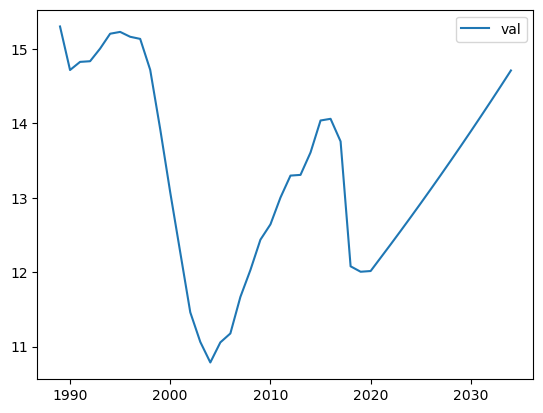

forecasting kolmasaste_naiset_25_29


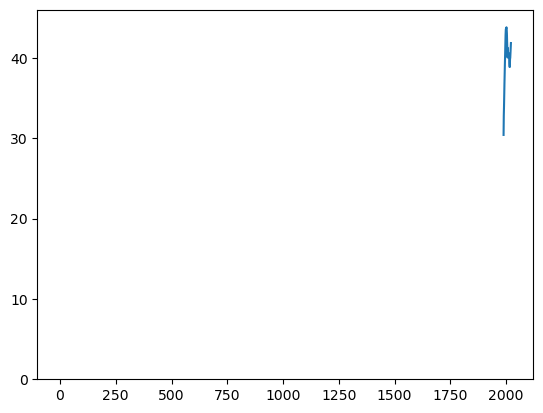

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(1, 0, 0)   Log Likelihood                  71.838
Date:                Wed, 01 Nov 2023   AIC                           -139.676
Time:                        23:08:10   BIC                           -136.744
Sample:                             0   HQIC                          -138.704
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5017      0.155     -3.241      0.001      -0.805      -0.198
sigma2         0.0007      0.000      5.980      0.000       0.000       0.001
Ljung-Box (L1) (Q):                   0.02   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    5.668072e-05
33   -2.843445e-05
34    1.426442e-05
35   -7.155891e-06
36    3.589824e-06
37   -1.800871e-06
38    9.034249e-07
39   -4.532121e-07
40    2.273584e-07
41   -1.140566e-07
42    5.721763e-08
43   -2.870380e-08
dtype: float64

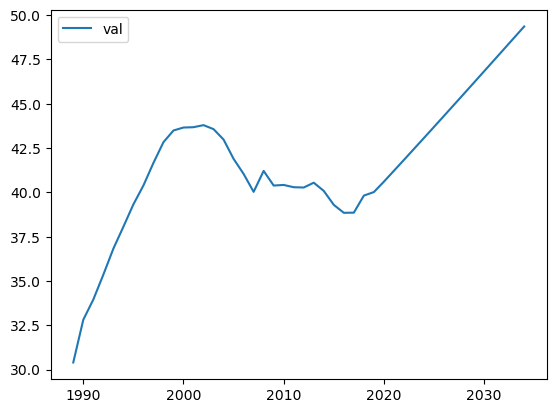

forecasting alypuhelin


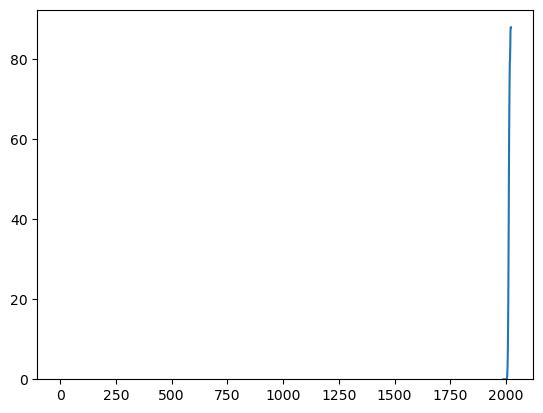

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(5, 0, 0)   Log Likelihood                  38.040
Date:                Wed, 01 Nov 2023   AIC                            -64.081
Time:                        23:08:12   BIC                            -55.286
Sample:                             0   HQIC                           -61.166
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2077      0.145      1.430      0.153      -0.077       0.492
ar.L2         -1.3196      0.166     -7.960      0.000      -1.644      -0.995
ar.L3          1.0430      0.294      3.549      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/stattools.py:1346: RuntimeWarning: divide by zero encountered in divide
  test_statistic = numer_squared_sum / denom_squared_sum
/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.866788
33    0.091109
34   -0.935760
35    0.266502
36    0.877271
37   -0.540604
38   -0.628856
39    0.729166
40    0.334316
41   -0.735982
42   -0.029498
43    0.622958
dtype: float64

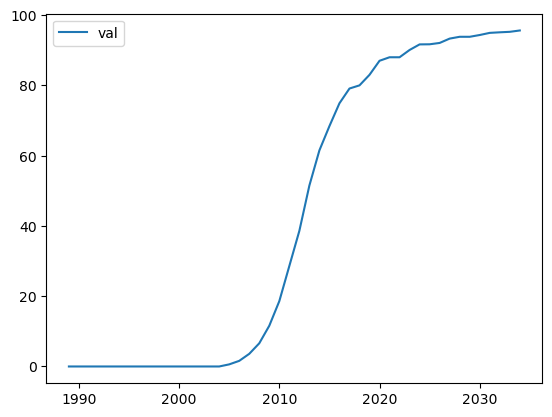

forecasting some_25_34


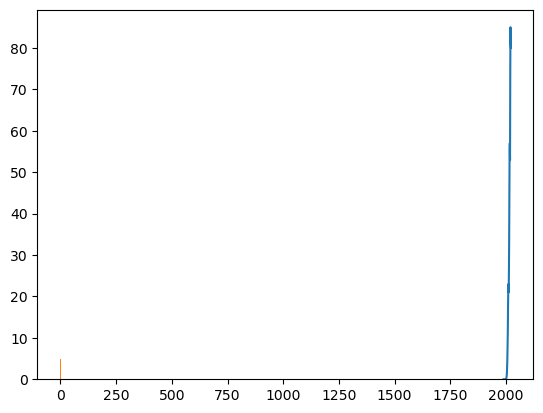

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(4, 0, 0)   Log Likelihood                  -1.510
Date:                Wed, 01 Nov 2023   AIC                             13.021
Time:                        23:08:13   BIC                             20.350
Sample:                             0   HQIC                            15.450
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7298      0.187     -3.897      0.000      -1.097      -0.363
ar.L2         -1.5282      0.248     -6.173      0.000      -2.013      -1.043
ar.L3         -0.4991      0.481     -1.038      0.2

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    2.012883
33   -1.593351
34   -1.093493
35    1.929760
36   -0.003953
37   -1.559691
38    0.757998
39    0.814154
40   -0.971937
41   -0.090324
42    0.744928
43   -0.350024
dtype: float64

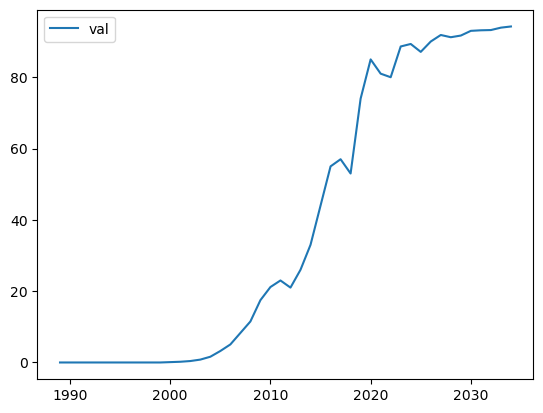

forecasting some_35_44


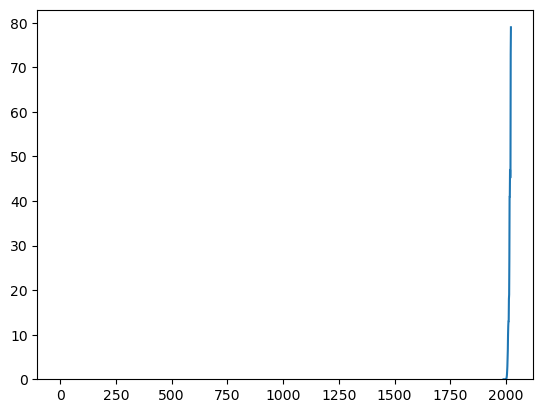

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(4, 0, 0)   Log Likelihood                  18.806
Date:                Wed, 01 Nov 2023   AIC                            -27.612
Time:                        23:08:14   BIC                            -20.283
Sample:                             0   HQIC                           -25.183
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2835      0.620     -0.457      0.648      -1.500       0.933
ar.L2         -1.1811      0.970     -1.218      0.223      -3.081       0.719
ar.L3         -0.2014      0.996     -0.202      0.8

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32   -0.819866
33    0.426545
34    0.333909
35   -0.196740
36    0.149713
37   -0.176080
38   -0.321137
39    0.406637
40    0.194610
41   -0.347427
42    0.011662
43    0.083026
dtype: float64

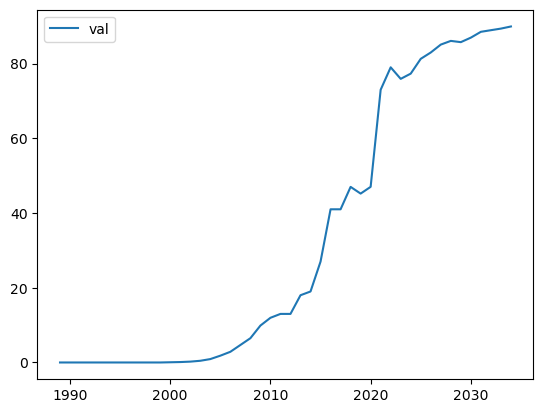

forecasting työttömyys_miehet_25_34


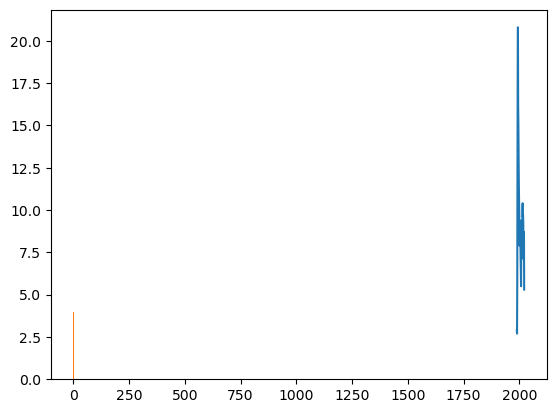

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  -3.805
Date:                Wed, 01 Nov 2023   AIC                             13.609
Time:                        23:08:15   BIC                             18.006
Sample:                             0   HQIC                            15.067
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.4230      0.285     -1.486      0.137      -0.981       0.135
ma.L2         -0.4821      0.254     -1.895      0.058      -0.981       0.017
sigma2         0.0706      0.018      3.927      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.203310
33    0.290155
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

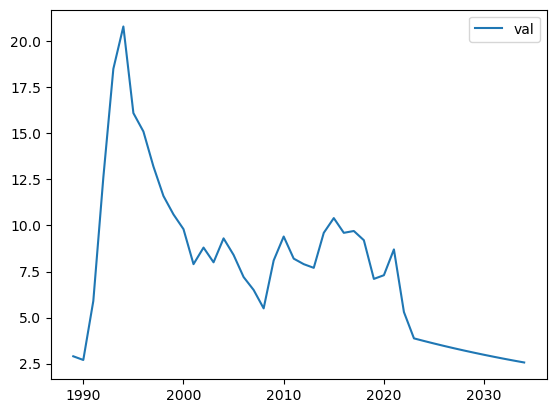

forecasting työttömyys_naiset_25_34


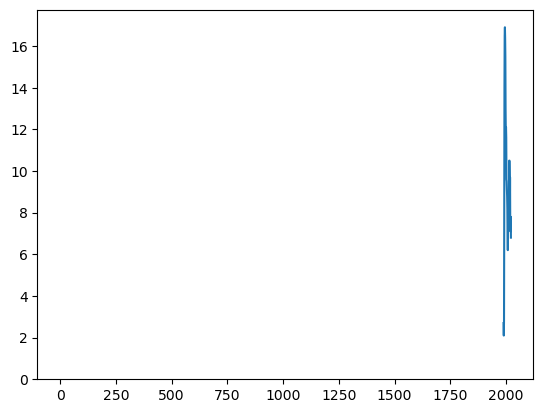

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(1, 0, 2)   Log Likelihood                  -1.719
Date:                Wed, 01 Nov 2023   AIC                             11.439
Time:                        23:08:16   BIC                             17.302
Sample:                             0   HQIC                            13.382
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2429      0.309     -0.786      0.432      -0.849       0.363
ma.L1         -0.1854      0.307     -0.604      0.546      -0.787       0.416
ma.L2         -0.6845      0.304     -2.252      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    1.308453e-01
33    1.482050e-02
34   -3.599682e-03
35    8.743103e-04
36   -2.123572e-04
37    5.157847e-05
38   -1.252766e-05
39    3.042785e-06
40   -7.390481e-07
41    1.795040e-07
42   -4.359890e-08
43    1.058954e-08
dtype: float64

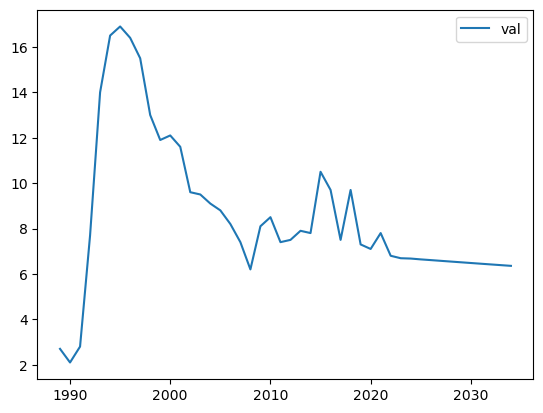

forecasting työllisyysaste_miehet_25_34


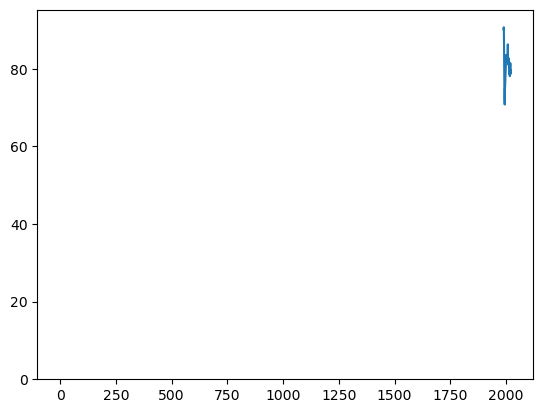

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  10.118
Date:                Wed, 01 Nov 2023   AIC                            -16.236
Time:                        23:08:17   BIC                            -13.304
Sample:                             0   HQIC                           -15.264
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6603      0.192     -3.443      0.001      -1.036      -0.284
sigma2         0.0306      0.007      4.587      0.000       0.018       0.044
Ljung-Box (L1) (Q):                   2.30   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32   -0.065769
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

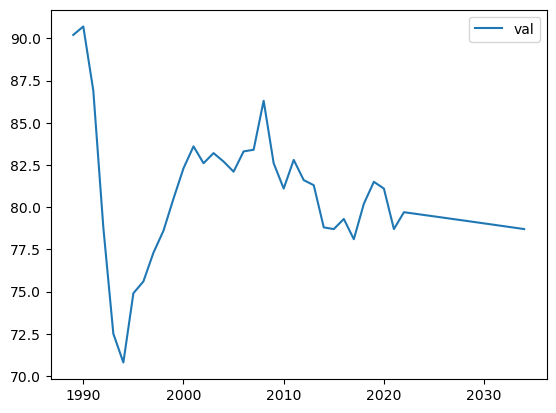

forecasting työllisyysaste_naiset_25_34


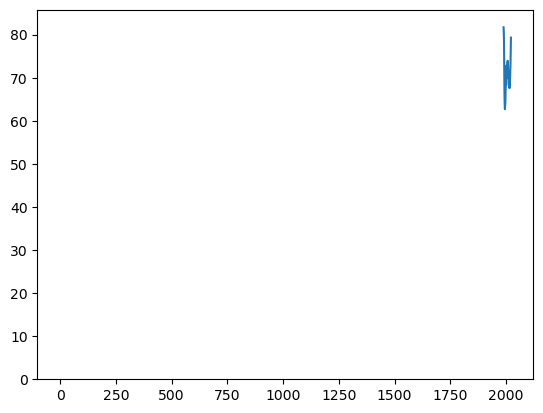

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  26.782
Date:                Wed, 01 Nov 2023   AIC                            -49.563
Time:                        23:08:18   BIC                            -46.632
Sample:                             0   HQIC                           -48.592
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5158      0.168     -3.076      0.002      -0.844      -0.187
sigma2         0.0109      0.004      2.747      0.006       0.003       0.019
Ljung-Box (L1) (Q):                   0.00   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32   -0.053569
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

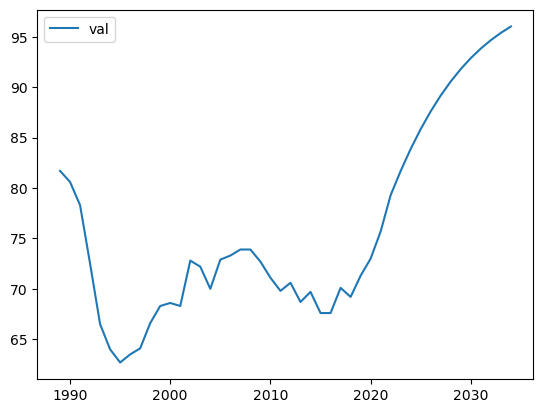

forecasting työttömyys_miehet_35_44


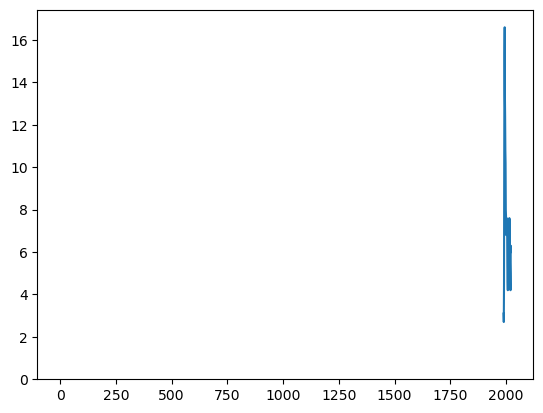

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(3, 0, 0)   Log Likelihood                   1.100
Date:                Wed, 01 Nov 2023   AIC                              5.800
Time:                        23:08:19   BIC                             11.663
Sample:                             0   HQIC                             7.744
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1686      0.138     -1.223      0.221      -0.439       0.101
ar.L2         -0.1424      0.154     -0.923      0.356      -0.445       0.160
ar.L3         -0.7463      0.136     -5.479      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.055218
33   -0.396510
34    0.416912
35   -0.055009
36    0.245804
37   -0.344741
38    0.064154
39   -0.145154
40    0.272611
41   -0.073156
42    0.081830
43   -0.206823
dtype: float64

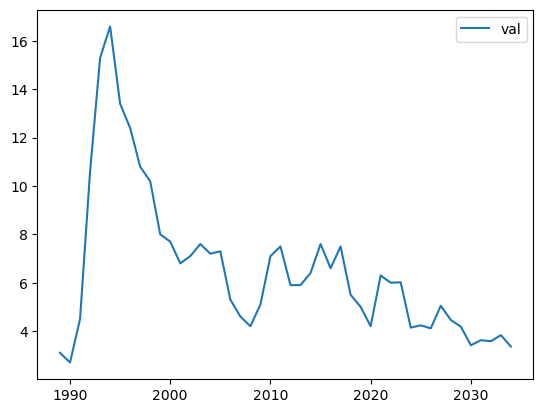

forecasting työttömyys_naiset_35_44


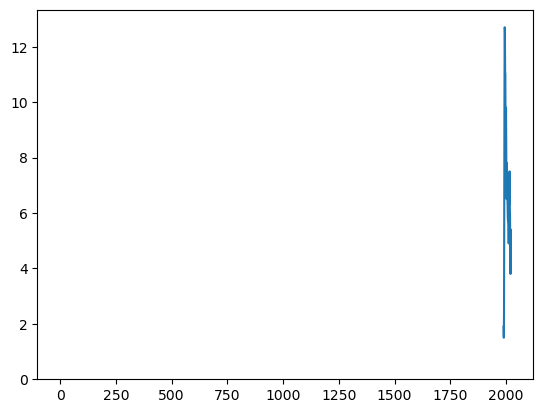

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(1, 0, 1)   Log Likelihood                  -3.418
Date:                Wed, 01 Nov 2023   AIC                             12.835
Time:                        23:08:19   BIC                             17.233
Sample:                             0   HQIC                            14.293
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3648      0.201      1.811      0.070      -0.030       0.760
ma.L1         -0.9622      0.241     -3.999      0.000      -1.434      -0.491
sigma2         0.0685      0.023      2.924      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.182306
33    0.066500
34    0.024257
35    0.008848
36    0.003228
37    0.001177
38    0.000429
39    0.000157
40    0.000057
41    0.000021
42    0.000008
43    0.000003
dtype: float64

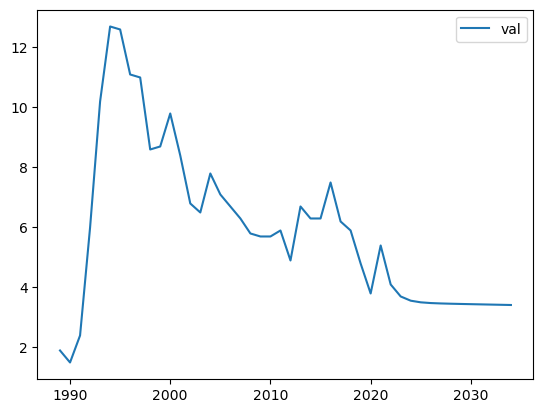

forecasting työllisyysaste_miehet_35_44


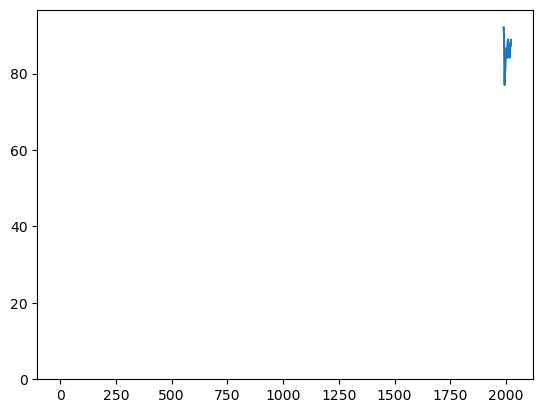

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  14.175
Date:                Wed, 01 Nov 2023   AIC                            -22.350
Time:                        23:08:20   BIC                            -17.953
Sample:                             0   HQIC                           -20.892
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5373      0.275     -1.951      0.051      -1.077       0.002
ma.L2         -0.3457      0.211     -1.638      0.101      -0.759       0.068
sigma2         0.0231      0.008      2.992      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32   -0.069952
33   -0.061606
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

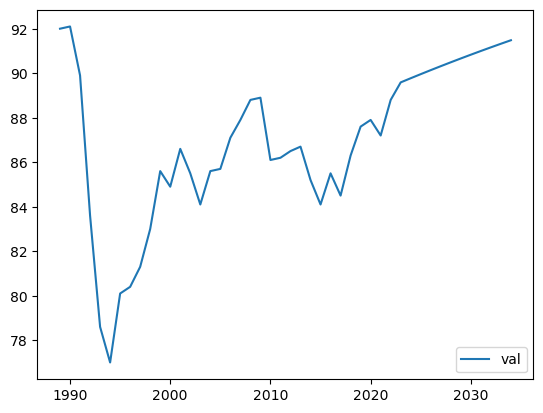

forecasting työllisyysaste_naiset_35_44


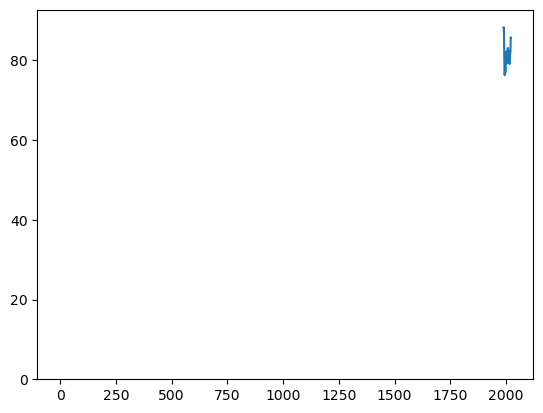

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  21.073
Date:                Wed, 01 Nov 2023   AIC                            -38.147
Time:                        23:08:22   BIC                            -35.215
Sample:                             0   HQIC                           -37.175
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7609      0.160     -4.756      0.000      -1.074      -0.447
sigma2         0.0153      0.004      3.663      0.000       0.007       0.023
Ljung-Box (L1) (Q):                   0.19   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.07477
33    0.00000
34    0.00000
35    0.00000
36    0.00000
37    0.00000
38    0.00000
39    0.00000
40    0.00000
41    0.00000
42    0.00000
43    0.00000
dtype: float64

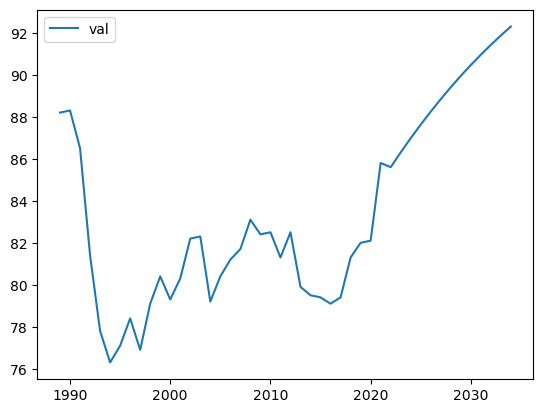

forecasting ei_aviossa_30_34


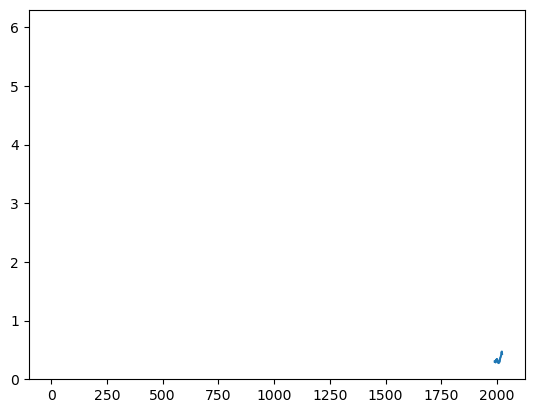

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(0, 0, 1)   Log Likelihood                  47.918
Date:                Wed, 01 Nov 2023   AIC                            -91.835
Time:                        23:08:23   BIC                            -88.904
Sample:                             0   HQIC                           -90.863
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.9106      0.111     -8.209      0.000      -1.128      -0.693
sigma2         0.0028      0.001      3.895      0.000       0.001       0.004
Ljung-Box (L1) (Q):                   0.11   Jarque-

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.108868
33    0.000000
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

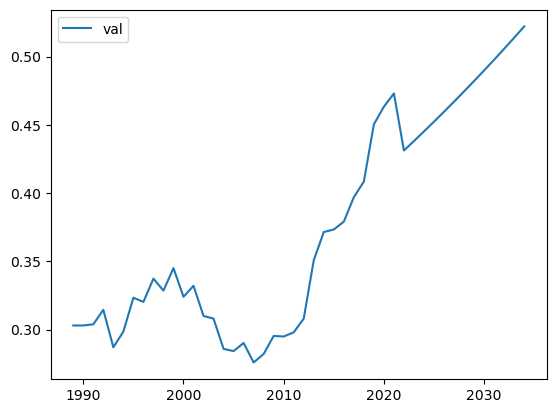

forecasting parittomia_30_34


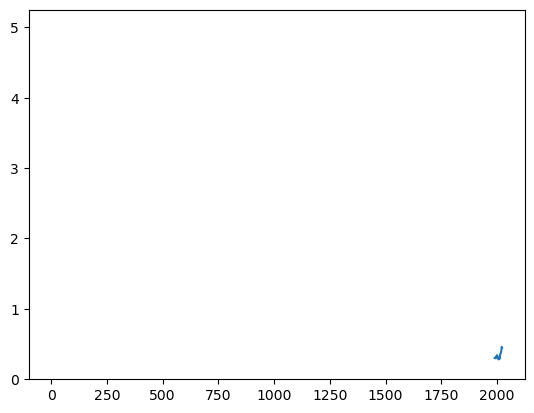

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                   32
Model:               SARIMAX(0, 0, 2)   Log Likelihood                  60.899
Date:                Wed, 01 Nov 2023   AIC                           -115.798
Time:                        23:08:24   BIC                           -111.400
Sample:                             0   HQIC                          -114.340
                                 - 32                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5253      0.182     -2.890      0.004      -0.882      -0.169
ma.L2         -0.2839      0.165     -1.720      0.085      -0.607       0.040
sigma2         0.0013      0.000      3.016      0.0

/Users/anttitanskanen/opt/miniconda3/envs/torch/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


'forecast_test_auto'

32    0.031951
33    0.013421
34    0.000000
35    0.000000
36    0.000000
37    0.000000
38    0.000000
39    0.000000
40    0.000000
41    0.000000
42    0.000000
43    0.000000
dtype: float64

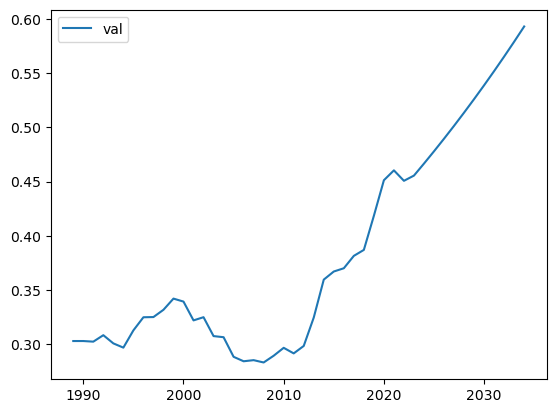

       hedelmallisyysluku  pienituloisuus_miehet_18_29  \
vuosi                                                    
1989             1.710000                     9.400000   
1990             1.782000                     7.900000   
1991             1.794000                    10.900000   
1992             1.847000                    13.500000   
1993             1.813000                    12.700000   
1994             1.847000                    14.200000   
1995             1.807000                    15.900000   
1996             1.764000                    19.300000   
1997             1.746000                    18.200000   
1998             1.700000                    17.900000   
1999             1.735000                    18.200000   
2000             1.729000                    16.700000   
2001             1.726000                    19.200000   
2002             1.718000                    21.000000   
2003             1.760000                    21.100000   
2004          

In [8]:
first=True
for y in range(2015,2023):
    data2=predict_arima(data,y,debug=False)
    print(data2)
    sheet=str(y)
    if first:
        update_excel_intensities('data/backtesting_pred.xlsx',data2,sheet,mode='w')
        first=False
    else:
        update_excel_intensities('data/backtesting_pred.xlsx',data2,sheet)